In [1]:
import numpy as np
import matplotlib.pyplot as plt


## **R1**

In [2]:
# Defining the grid size
GRID_SIZE = 5
# Defining the states for the grid
states = [(i, j) for i in range(GRID_SIZE) for j in range(GRID_SIZE)]
# Defining the actions: Up, Down, Left, Right
actions = ['Up', 'Down', 'Left', 'Right']

## Defining the transition probabilities and rewards for each action

In [3]:
transition_probs = {
    'Up': {'Up': 0.8, 'Left': 0.1, 'Right': 0.1, 'Down': 0.0},
    'Down': {'Down': 0.8, 'Left': 0.1, 'Right': 0.1, 'Up': 0.0},
    'Left': {'Left': 0.8, 'Up': 0.1, 'Down': 0.1, 'Right': 0.0},
    'Right': {'Right': 0.8, 'Up': 0.1, 'Down': 0.1, 'Left': 0.0}
}

rewards = {
    (0, 1): 20,  # Regular customer at position A
    (2, 2): -0.5,  # Live-in reward at starting position
    (4, 4): 10,  # Example exit state with a high reward
    (3, 1): -10  # Restricted area
}
gamma = 0.9  # Discount factor
# Initialize state values
V = {state: 0 for state in states}


## Value Iteration algorithm

In [4]:
while True:
    delta = 0
    for state in states:
        if state in rewards:
            continue

        max_value = float('-inf')
        for action in actions:
            new_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                new_value += prob * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if new_value > max_value:
                max_value = new_value

        delta = max(delta, abs(max_value - V[state]))
        V[state] = max_value

    if delta < 1e-6:
        break

# Extract the optimal policy
optimal_policy = {}
for state in states:
    if state in rewards:
        optimal_policy[state] = 'Exit'
    else:
        best_action = None
        best_value = float('-inf')
        for action in actions:
            action_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                action_value += transition_probs[action][next_action] * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if action_value > best_value:
                best_value = action_value
                best_action = action

        optimal_policy[state] = best_action

## Visual representation of the optimal policy as numeric values in each cell

In [5]:
for i in range(GRID_SIZE):
    for j in range(GRID_SIZE):
        if (i, j) in optimal_policy:
            print(optimal_policy[(i, j)], end='\t')
    print()

Right	Exit	Left	Left	Left	
Up	Up	Up	Left	Left	
Up	Up	Exit	Up	Up	
Up	Exit	Right	Up	Down	
Up	Right	Right	Right	Exit	


## **R2**

## Visualize the optimal policy using your preferred method

In [6]:
# Define the grid size
GRID_SIZE = 5

# Define the states for the grid
states = [(i, j) for i in range(GRID_SIZE) for j in range(GRID_SIZE)]

# Define the actions: Up, Down, Left, Right
actions = ['Up', 'Down', 'Left', 'Right']

# Define the transition probabilities and rewards for each action
transition_probs = {
    'Up': {'Up': 0.8, 'Left': 0.1, 'Right': 0.1, 'Down': 0.0},
    'Down': {'Down': 0.8, 'Left': 0.1, 'Right': 0.1, 'Up': 0.0},
    'Left': {'Left': 0.8, 'Up': 0.1, 'Down': 0.1, 'Right': 0.0},
    'Right': {'Right': 0.8, 'Up': 0.1, 'Down': 0.1, 'Left': 0.0}
}

rewards = {
    (1, 0): 30,  # Premium customer at position B
    (2, 2): -0.5,  # Live-in reward at starting position
    (4, 4): 10,  # Example exit state with a high reward
    (3, 1): -10  # Restricted area
}

gamma = 0.9  # Discount factor
# Initialize state values
V = {state: 0 for state in states}



## Value Iteration algorithm

In [7]:
while True:
    delta = 0
    for state in states:
        if state in rewards:
            continue

        max_value = float('-inf')
        for action in actions:
            new_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                new_value += prob * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if new_value > max_value:
                max_value = new_value

        delta = max(delta, abs(max_value - V[state]))
        V[state] = max_value

    if delta < 1e-6:
        break


## Extracting the optimal policy

In [8]:
optimal_policy = {}
for state in states:
    if state in rewards:
        optimal_policy[state] = 'Exit'
    else:
        best_action = None
        best_value = float('-inf')
        for action in actions:
            action_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                action_value += transition_probs[action][next_action] * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if action_value > best_value:
                best_value = action_value
                best_action = action

        optimal_policy[state] = best_action

### Visualize the optimal policy using arrows on the grid

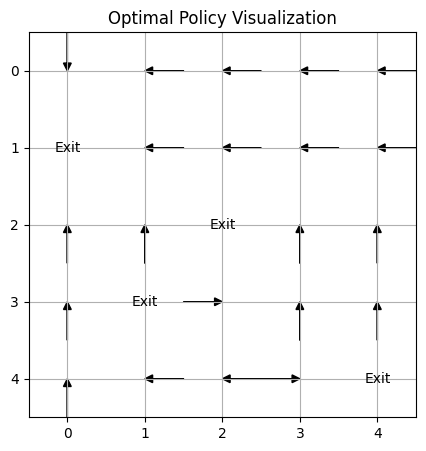

In [9]:
plt.figure(figsize=(5, 5))
for i in range(GRID_SIZE):
    for j in range(GRID_SIZE):
        if (i, j) in optimal_policy:
            if optimal_policy[(i, j)] == 'Up':
                plt.arrow(j, i + 0.5, 0, -0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Down':
                plt.arrow(j, i - 0.5, 0, 0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Left':
                plt.arrow(j + 0.5, i, -0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Right':
                plt.arrow(j - 0.5, i, 0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Exit':
                plt.text(j, i, 'Exit', ha='center', va='center')
plt.xlim(-0.5, GRID_SIZE - 0.5)
plt.ylim(GRID_SIZE - 0.5, -0.5)
plt.xticks(np.arange(0, GRID_SIZE, 1))
plt.yticks(np.arange(0, GRID_SIZE, 1))
plt.grid(True)
plt.title('Optimal Policy Visualization')
plt.show()

## **R3**

### A regular customer at point A and a premium customer at position B

In [10]:
# Define the grid size
GRID_SIZE = 5

# Define the states for the grid
states = [(i, j) for i in range(GRID_SIZE) for j in range(GRID_SIZE)]

# Define the actions: Up, Down, Left, Right
actions = ['Up', 'Down', 'Left', 'Right']

## Defining the transition probabilities and rewards for each action


In [11]:
transition_probs = {
    'Up': {'Up': 0.8, 'Left': 0.1, 'Right': 0.1, 'Down': 0.0},
    'Down': {'Down': 0.8, 'Left': 0.1, 'Right': 0.1, 'Up': 0.0},
    'Left': {'Left': 0.8, 'Up': 0.1, 'Down': 0.1, 'Right': 0.0},
    'Right': {'Right': 0.8, 'Up': 0.1, 'Down': 0.1, 'Left': 0.0}
}

rewards = {
    (0, 1): 20,  # Regular customer at position A
    (1, 0): 30,  # Premium customer at position B
    (2, 2): -0.5,  # Live-in reward at starting position
    (4, 4): 10,  # Example exit state with a high reward
    (3, 1): -10  # Restricted area
}

gamma = 0.9  # Discount factor

## Value Iteration algorithm

In [12]:
# Initialize state values
V = {state: 0 for state in states}
while True:
    delta = 0
    for state in states:
        if state in rewards:
            continue

        max_value = float('-inf')
        for action in actions:
            new_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                new_value += prob * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if new_value > max_value:
                max_value = new_value

        delta = max(delta, abs(max_value - V[state]))
        V[state] = max_value

    if delta < 1e-6:
        break

## Extracting the optimal policy


In [13]:
optimal_policy = {}
for state in states:
    if state in rewards:
        optimal_policy[state] = 'Exit'
    else:
        best_action = None
        best_value = float('-inf')
        for action in actions:
            action_value = 0
            for next_action, prob in transition_probs[action].items():
                next_state = state
                if next_action == 'Up':
                    next_state = (max(state[0] - 1, 0), state[1])
                elif next_action == 'Down':
                    next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                elif next_action == 'Left':
                    next_state = (state[0], max(state[1] - 1, 0))
                elif next_action == 'Right':
                    next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                action_value += transition_probs[action][next_action] * (rewards.get(next_state, -0.5) + gamma * V[next_state])

            if action_value > best_value:
                best_value = action_value
                best_action = action

        optimal_policy[state] = best_action

## Visualize the optimal policy using arrows on the grid


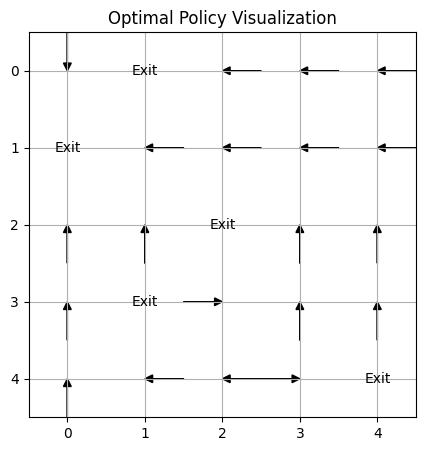

In [14]:
plt.figure(figsize=(5, 5))
for i in range(GRID_SIZE):
    for j in range(GRID_SIZE):
        if (i, j) in optimal_policy:
            if optimal_policy[(i, j)] == 'Up':
                plt.arrow(j, i + 0.5, 0, -0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Down':
                plt.arrow(j, i - 0.5, 0, 0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Left':
                plt.arrow(j + 0.5, i, -0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Right':
                plt.arrow(j - 0.5, i, 0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
            elif optimal_policy[(i, j)] == 'Exit':
                plt.text(j, i, 'Exit', ha='center', va='center')
plt.xlim(-0.5, GRID_SIZE - 0.5)
plt.ylim(GRID_SIZE - 0.5, -0.5)
plt.xticks(np.arange(0, GRID_SIZE, 1))
plt.yticks(np.arange(0, GRID_SIZE, 1))
plt.grid(True)
plt.title('Optimal Policy Visualization')
plt.show()

# **R4**

#  Runing 1000 episodes with random locations of customers

Episode 1:
Taxi starting position: 0
First customer request: D
Second customer request: A


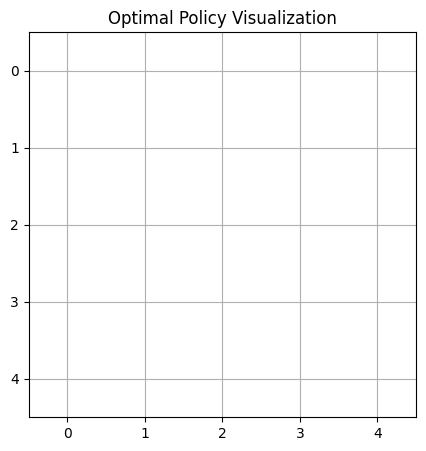



Episode 2:
Taxi starting position: 0
First customer request: C
Second customer request: D


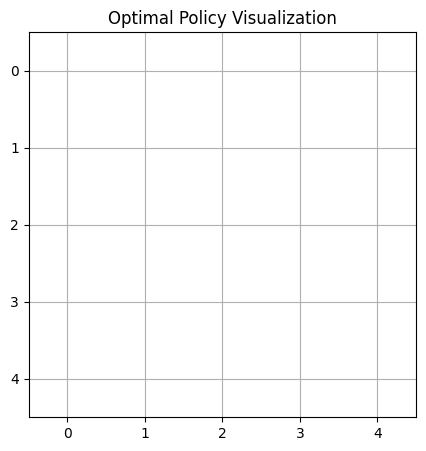



Episode 3:
Taxi starting position: 1
First customer request: D
Second customer request: A
Second customer is a premium customer.


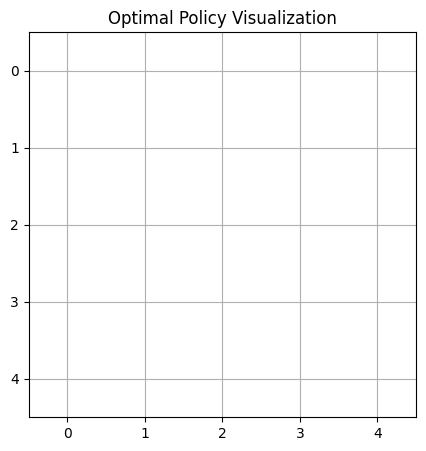



Episode 4:
Taxi starting position: 4
First customer request: A
Second customer request: B


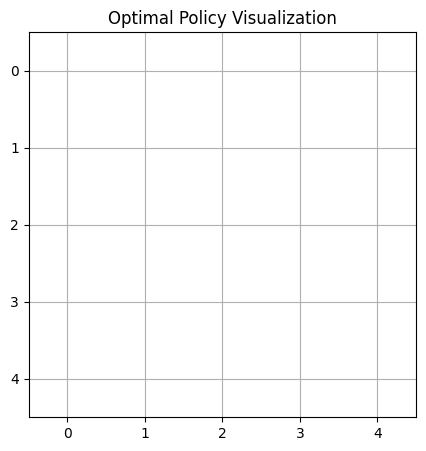



Episode 5:
Taxi starting position: 3
First customer request: A
Second customer request: B
Second customer is a premium customer.


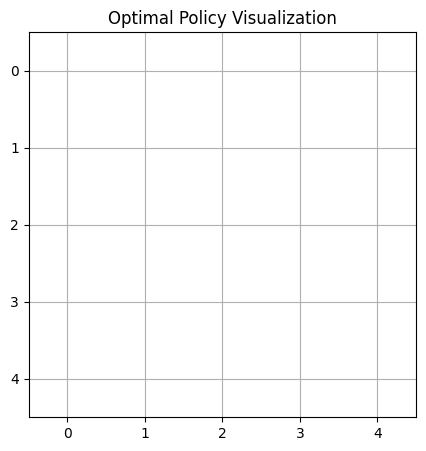



Episode 6:
Taxi starting position: 0
First customer request: D
Second customer request: C


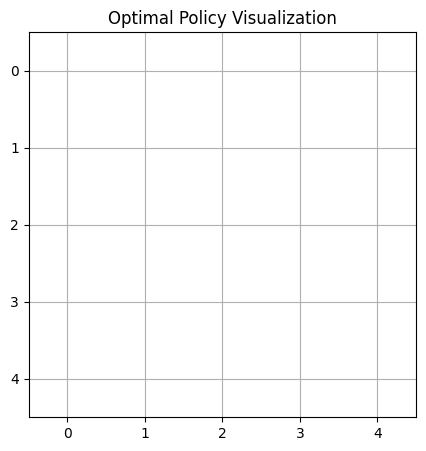



Episode 7:
Taxi starting position: 4
First customer request: D
Second customer request: A


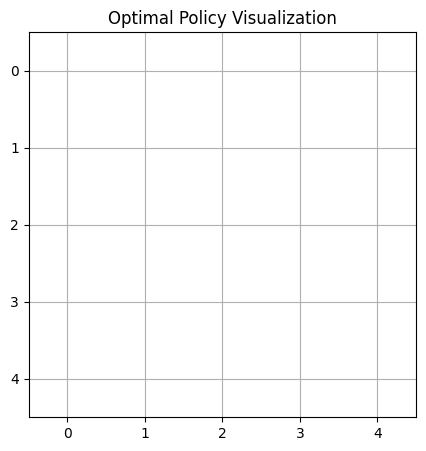



Episode 8:
Taxi starting position: 4
First customer request: D
Second customer request: B


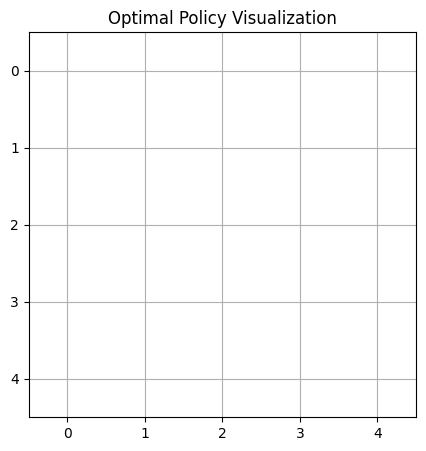



Episode 9:
Taxi starting position: 1
First customer request: A


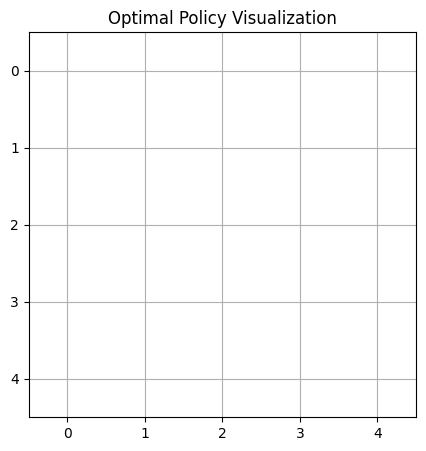



Episode 10:
Taxi starting position: 1
First customer request: A


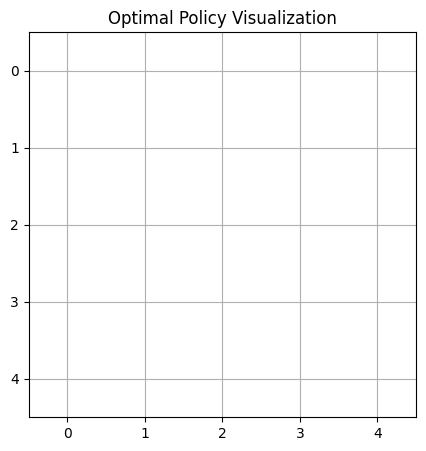



Episode 11:
Taxi starting position: 2
First customer request: B
Second customer request: A


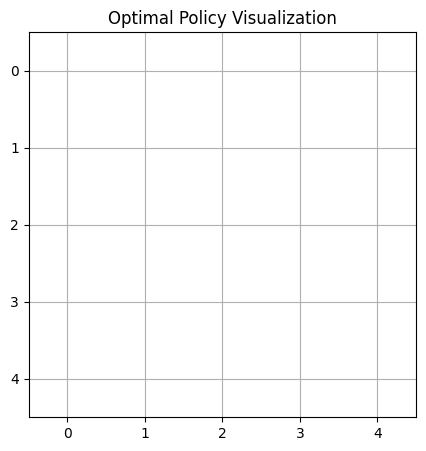



Episode 12:
Taxi starting position: 1
First customer request: C
Second customer request: A


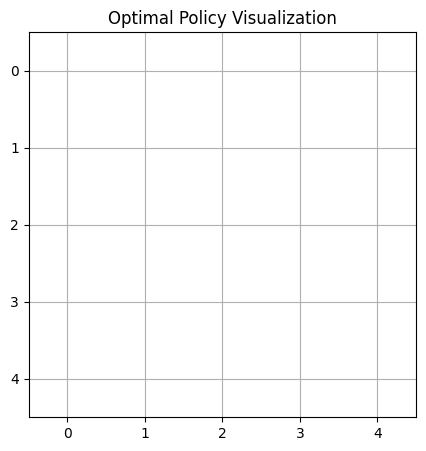



Episode 13:
Taxi starting position: 3
First customer request: A
Second customer request: B


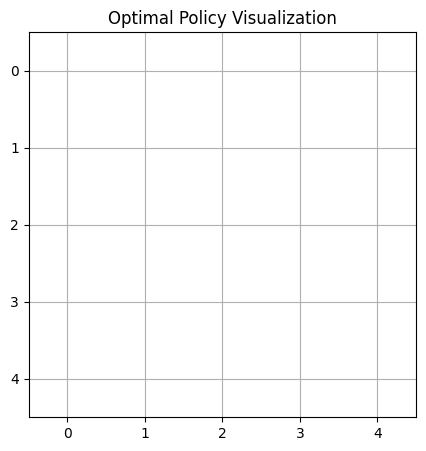



Episode 14:
Taxi starting position: 2
First customer request: D


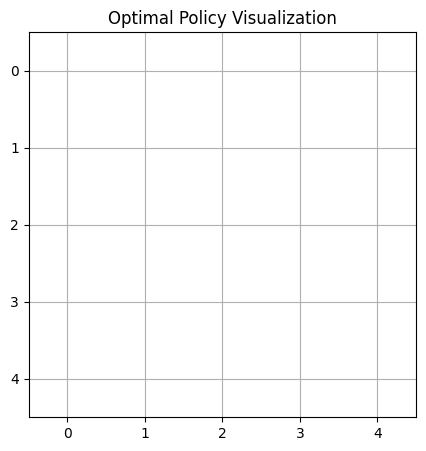



Episode 15:
Taxi starting position: 0
First customer request: C


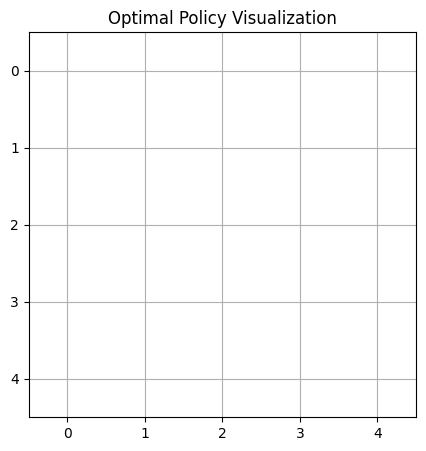



Episode 16:
Taxi starting position: 3
First customer request: A
Second customer request: D


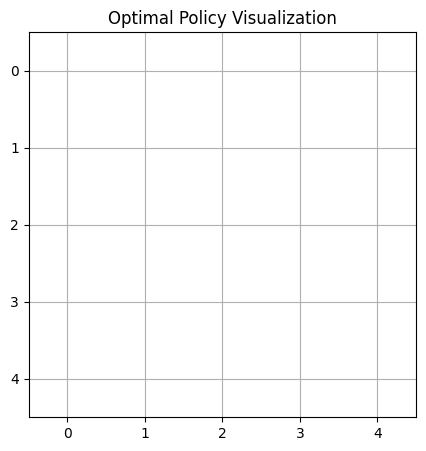



Episode 17:
Taxi starting position: 4
First customer request: D
Second customer request: B
Second customer is a premium customer.


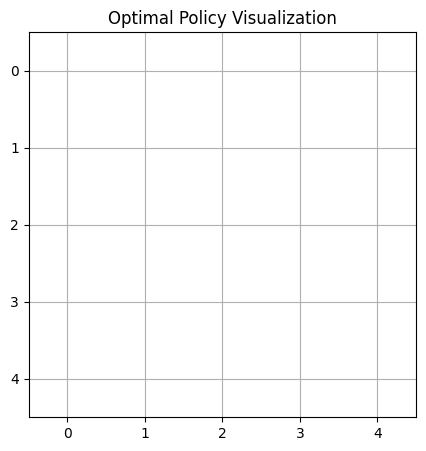



Episode 18:
Taxi starting position: 1
First customer request: D
Second customer request: C


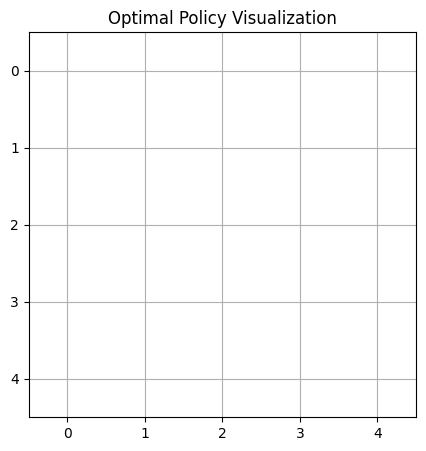



Episode 19:
Taxi starting position: 0
First customer request: C
Second customer request: D


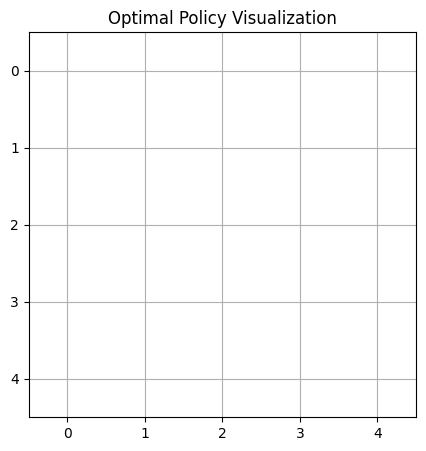



Episode 20:
Taxi starting position: 3
First customer request: B


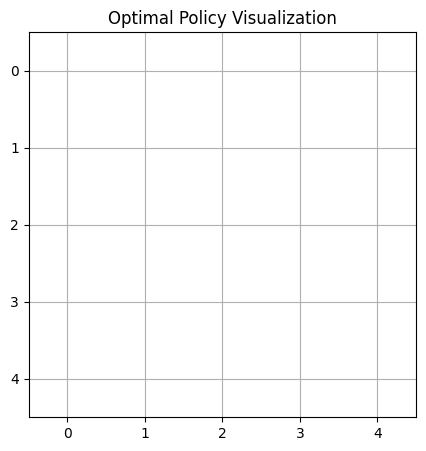



Episode 21:
Taxi starting position: 1
First customer request: C


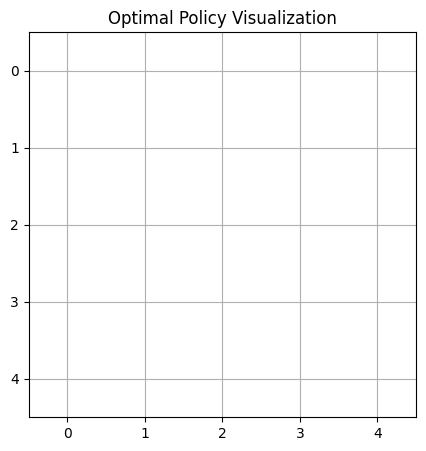



Episode 22:
Taxi starting position: 3
First customer request: A


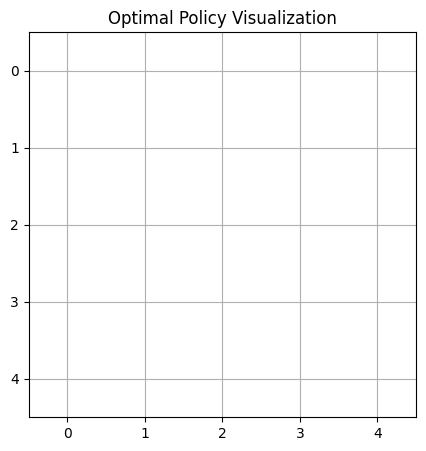



Episode 23:
Taxi starting position: 2
First customer request: A
Second customer request: B


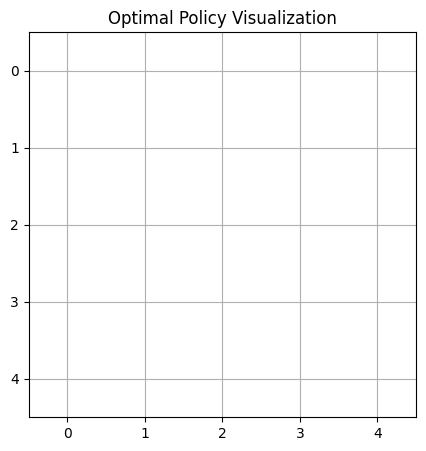



Episode 24:
Taxi starting position: 0
First customer request: C
Second customer request: A


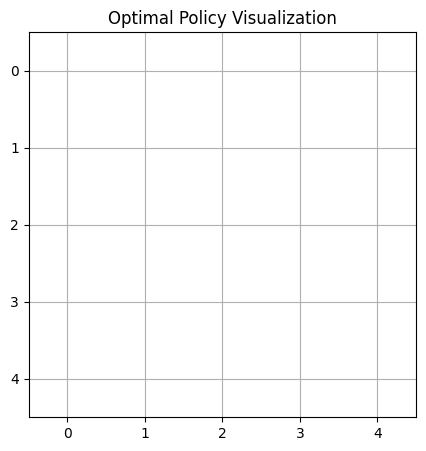



Episode 25:
Taxi starting position: 3
First customer request: C
Second customer request: D


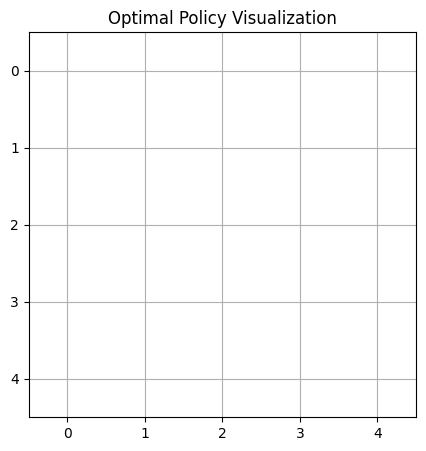



Episode 26:
Taxi starting position: 0
First customer request: B
Second customer request: D


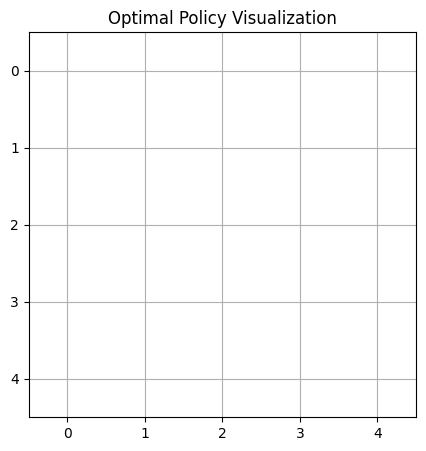



Episode 27:
Taxi starting position: 3
First customer request: A
Second customer request: C


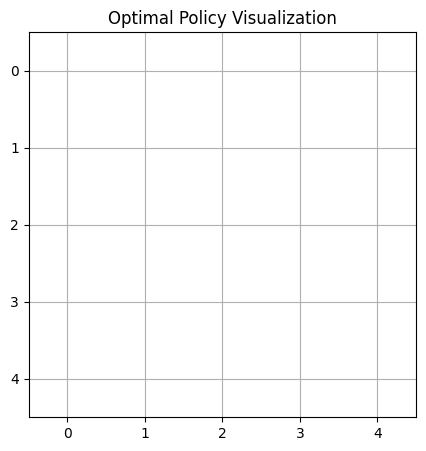



Episode 28:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


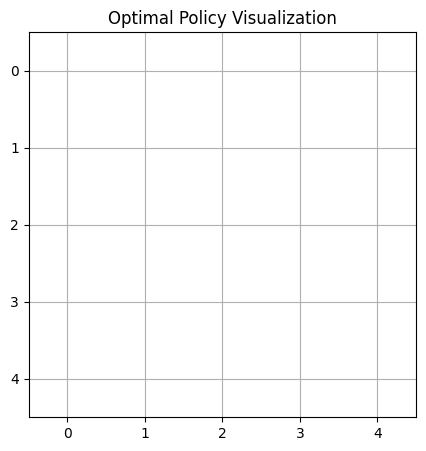



Episode 29:
Taxi starting position: 1
First customer request: B
Second customer request: C


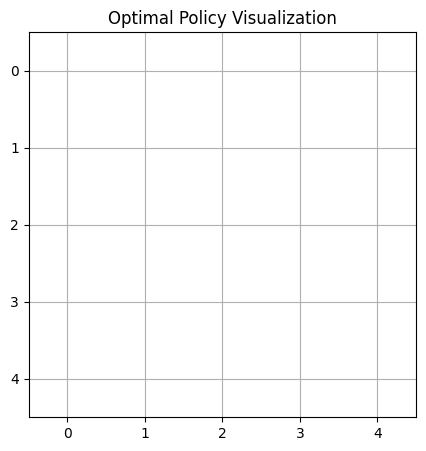



Episode 30:
Taxi starting position: 3
First customer request: B
Second customer request: D


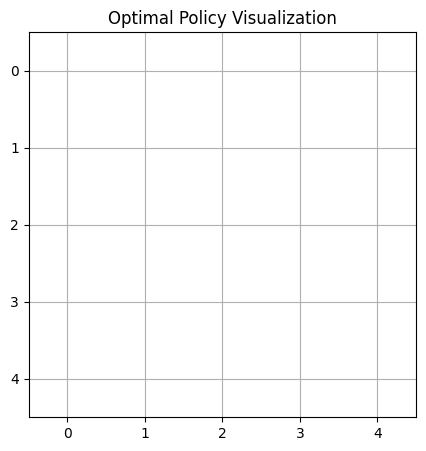



Episode 31:
Taxi starting position: 1
First customer request: A
Second customer request: C


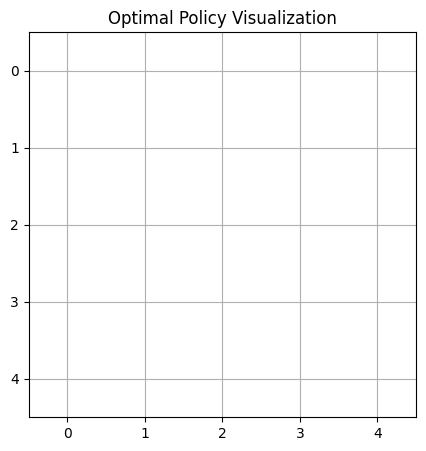



Episode 32:
Taxi starting position: 1
First customer request: B
Second customer request: C


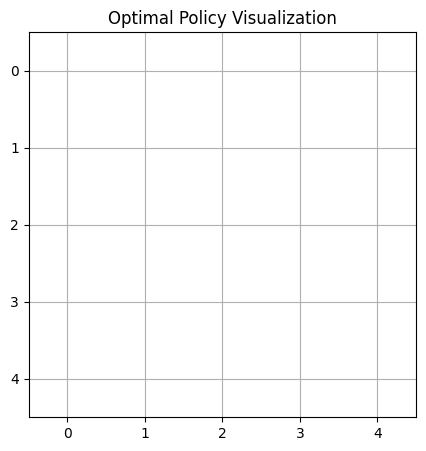



Episode 33:
Taxi starting position: 0
First customer request: C
Second customer request: C
Second customer is a premium customer.


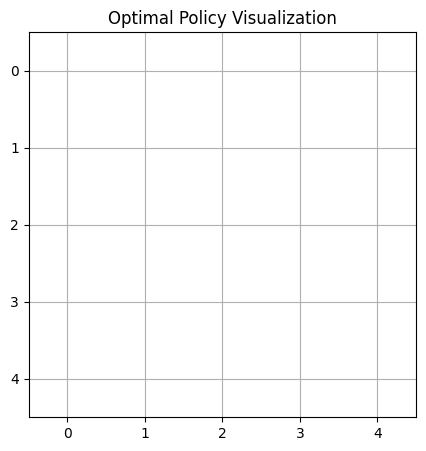



Episode 34:
Taxi starting position: 2
First customer request: C


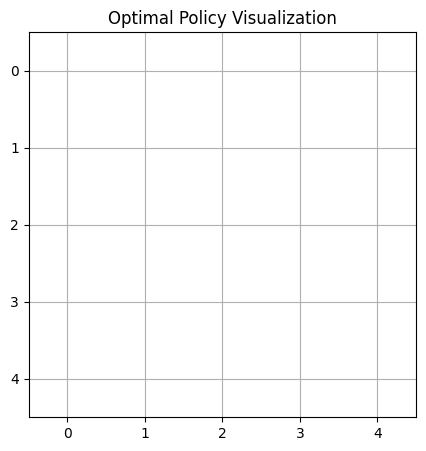



Episode 35:
Taxi starting position: 4
First customer request: D
Second customer request: C


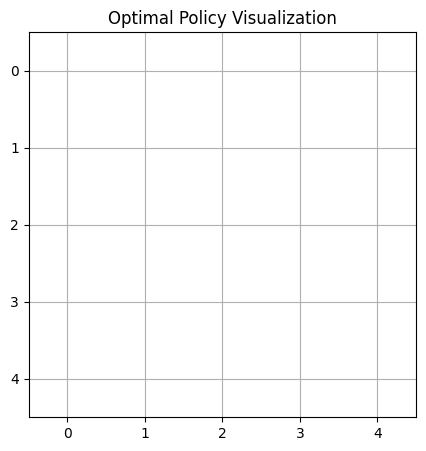



Episode 36:
Taxi starting position: 0
First customer request: A
Second customer request: A


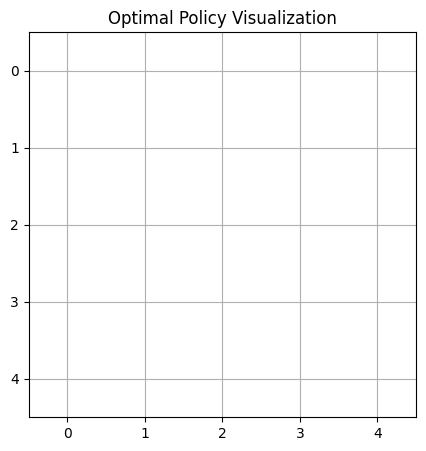



Episode 37:
Taxi starting position: 1
First customer request: D
Second customer request: A


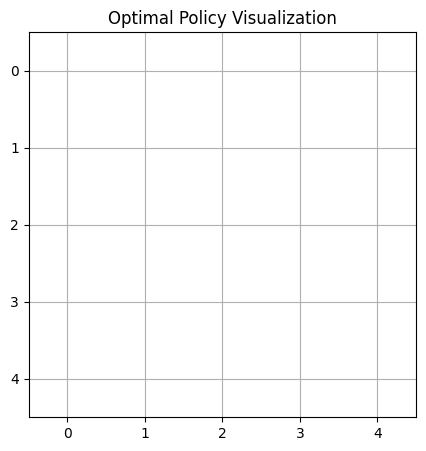



Episode 38:
Taxi starting position: 3
First customer request: B


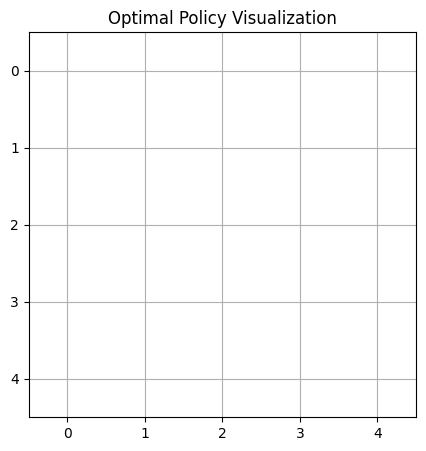



Episode 39:
Taxi starting position: 1
First customer request: B
Second customer request: D


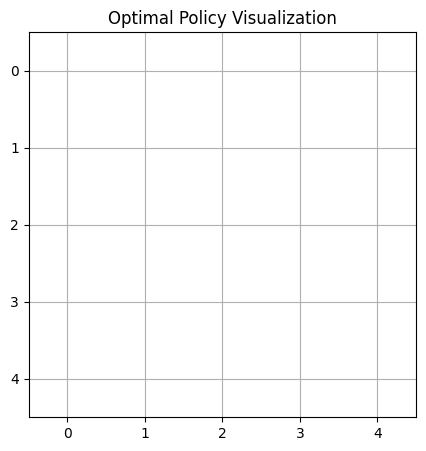



Episode 40:
Taxi starting position: 2
First customer request: A


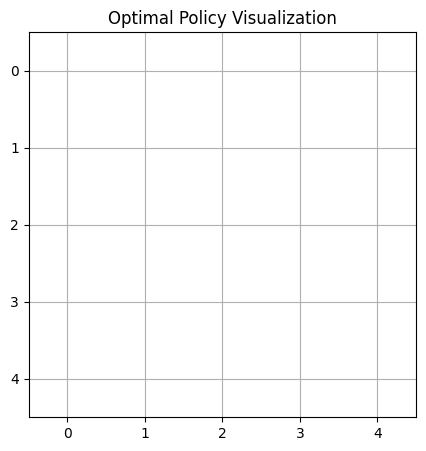



Episode 41:
Taxi starting position: 0
First customer request: C


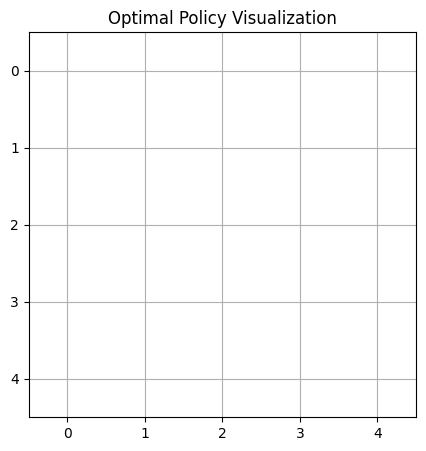



Episode 42:
Taxi starting position: 0
First customer request: D


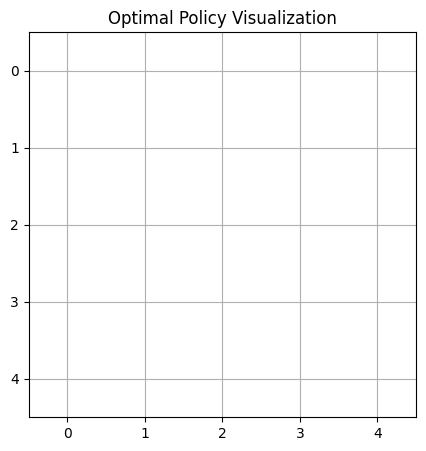



Episode 43:
Taxi starting position: 1
First customer request: C


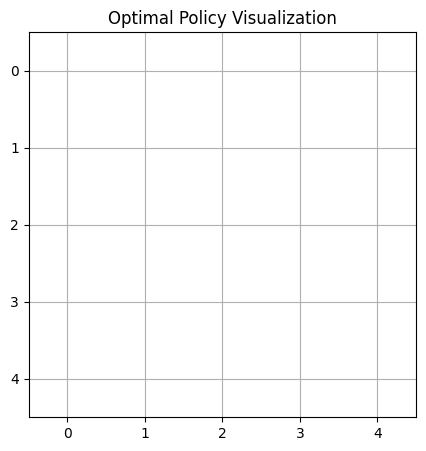



Episode 44:
Taxi starting position: 0
First customer request: C


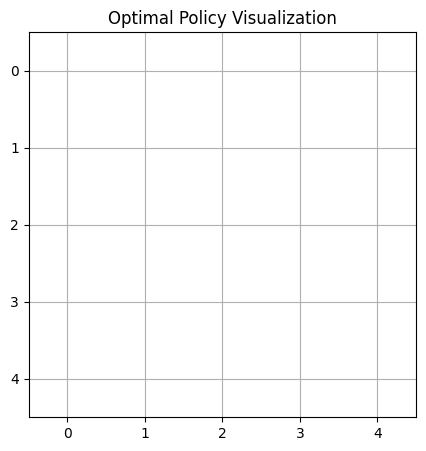



Episode 45:
Taxi starting position: 3
First customer request: D
Second customer request: C


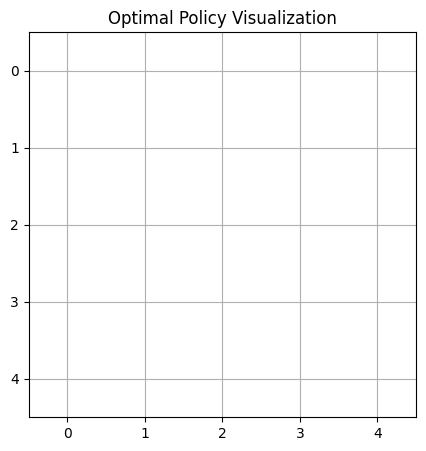



Episode 46:
Taxi starting position: 0
First customer request: C
Second customer request: C
Second customer is a premium customer.


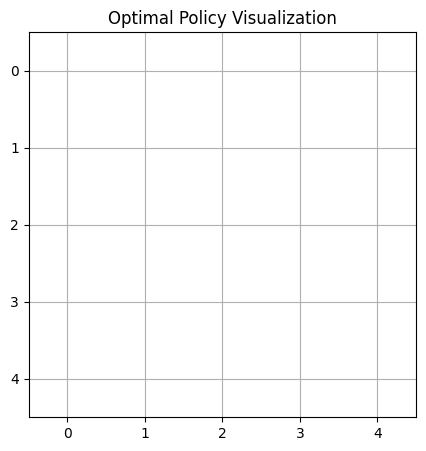



Episode 47:
Taxi starting position: 0
First customer request: D
Second customer request: D


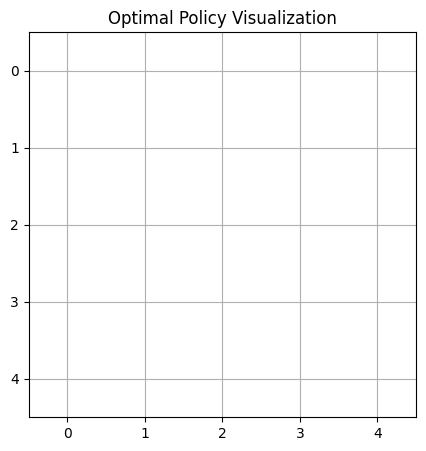



Episode 48:
Taxi starting position: 2
First customer request: B
Second customer request: D
Second customer is a premium customer.


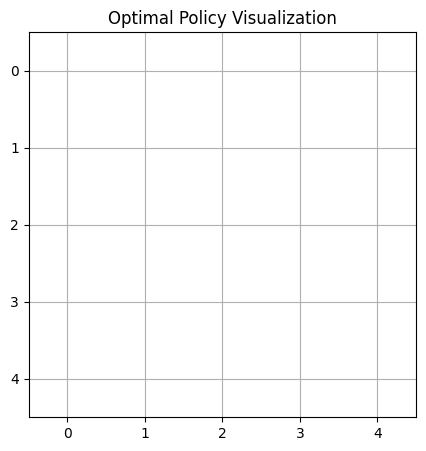



Episode 49:
Taxi starting position: 3
First customer request: D
Second customer request: C


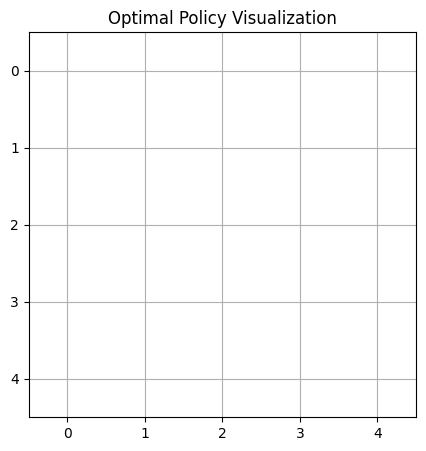



Episode 50:
Taxi starting position: 1
First customer request: D


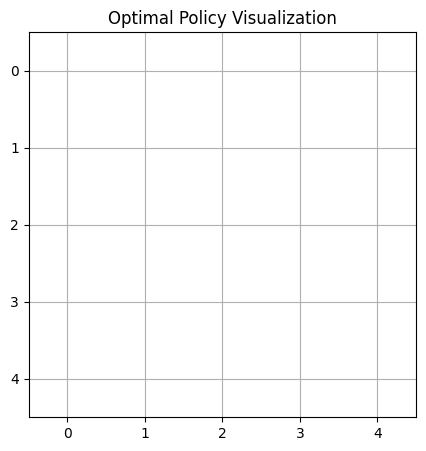



Episode 51:
Taxi starting position: 2
First customer request: A
Second customer request: A
Second customer is a premium customer.


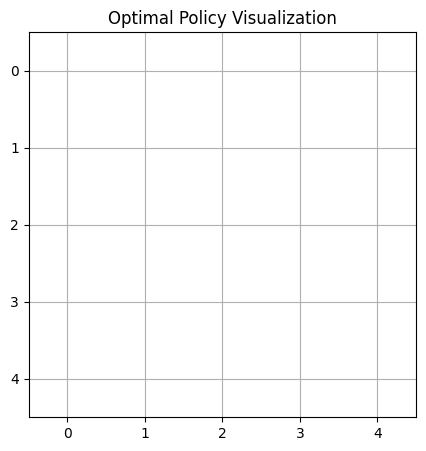



Episode 52:
Taxi starting position: 2
First customer request: B


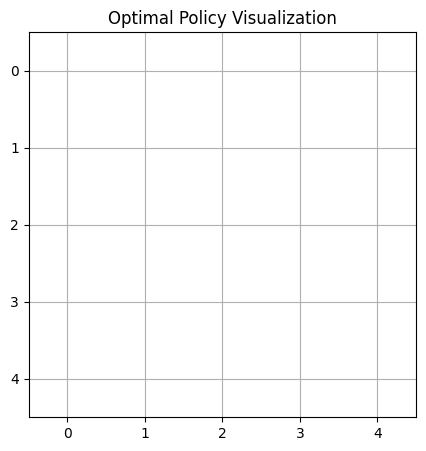



Episode 53:
Taxi starting position: 2
First customer request: C
Second customer request: A


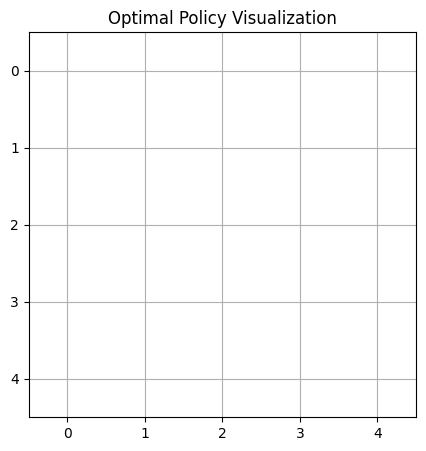



Episode 54:
Taxi starting position: 3
First customer request: A


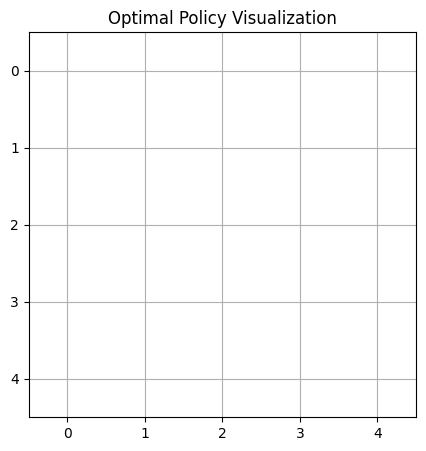



Episode 55:
Taxi starting position: 3
First customer request: B


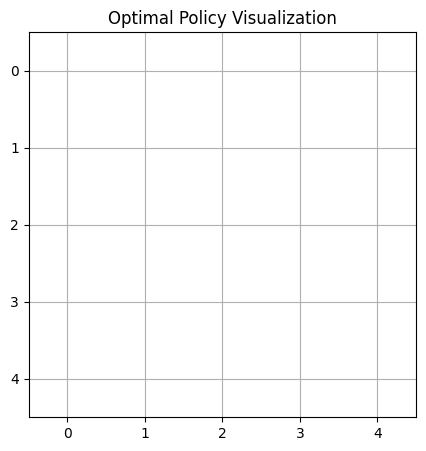



Episode 56:
Taxi starting position: 2
First customer request: B
Second customer request: B
Second customer is a premium customer.


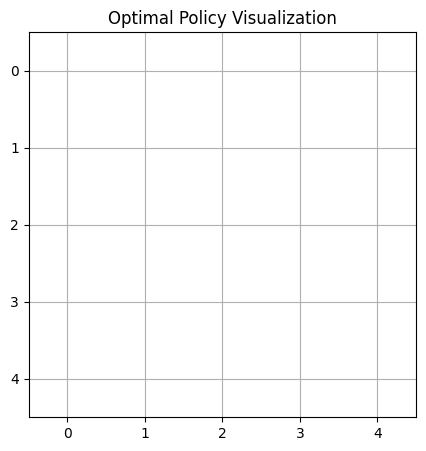



Episode 57:
Taxi starting position: 4
First customer request: A


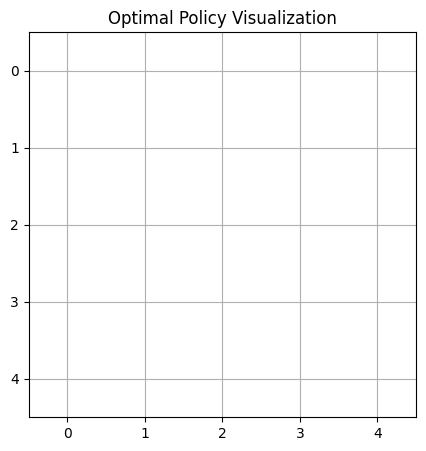



Episode 58:
Taxi starting position: 4
First customer request: D


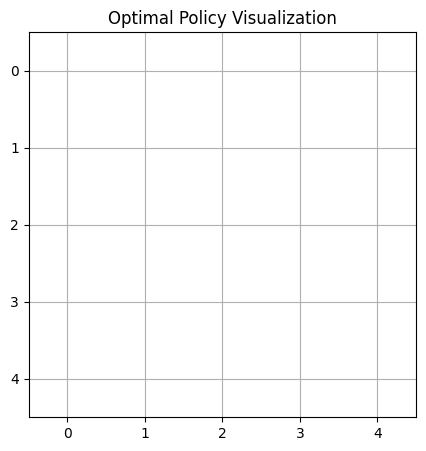



Episode 59:
Taxi starting position: 1
First customer request: D


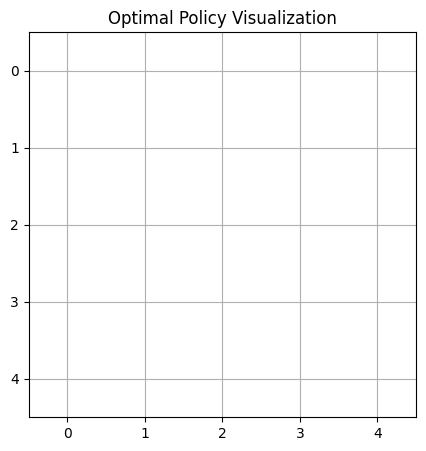



Episode 60:
Taxi starting position: 0
First customer request: C
Second customer request: A


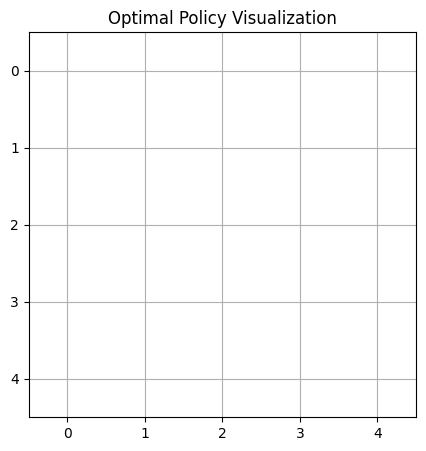



Episode 61:
Taxi starting position: 4
First customer request: A


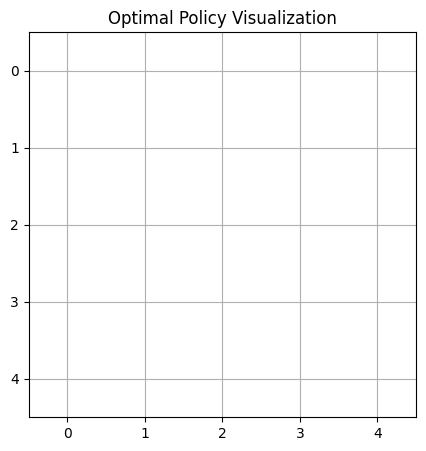



Episode 62:
Taxi starting position: 4
First customer request: B
Second customer request: D


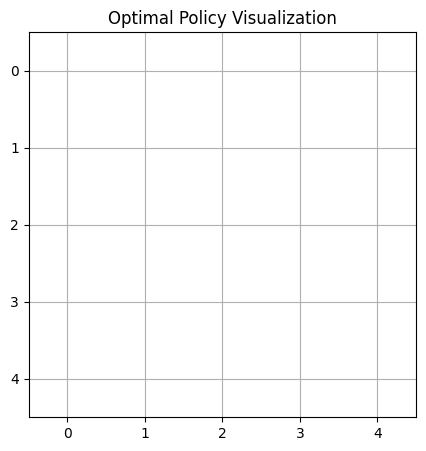



Episode 63:
Taxi starting position: 4
First customer request: B


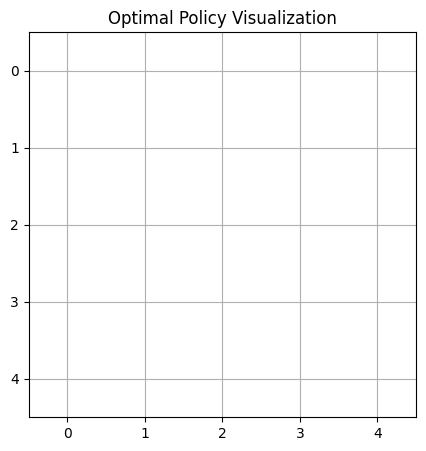



Episode 64:
Taxi starting position: 2
First customer request: D


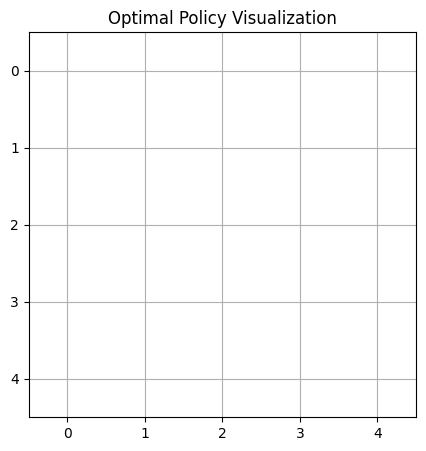



Episode 65:
Taxi starting position: 1
First customer request: D
Second customer request: B


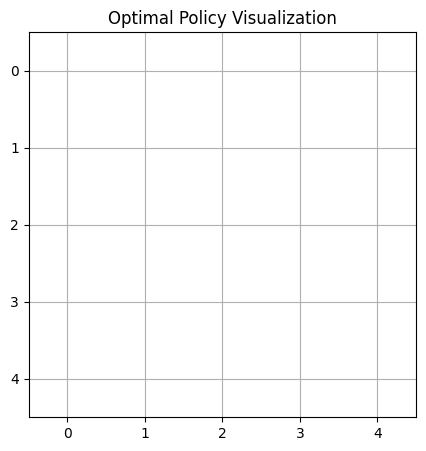



Episode 66:
Taxi starting position: 4
First customer request: D
Second customer request: B


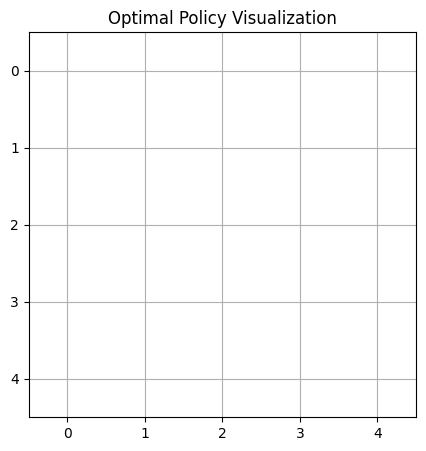



Episode 67:
Taxi starting position: 0
First customer request: D
Second customer request: C


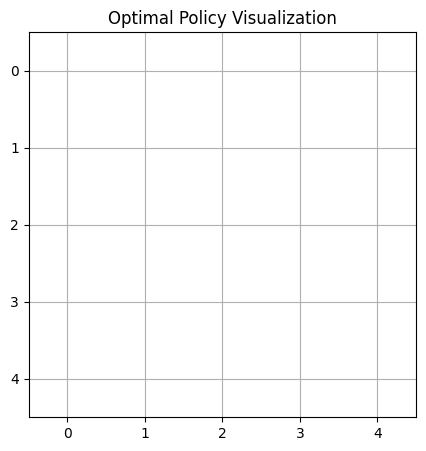



Episode 68:
Taxi starting position: 1
First customer request: C
Second customer request: B


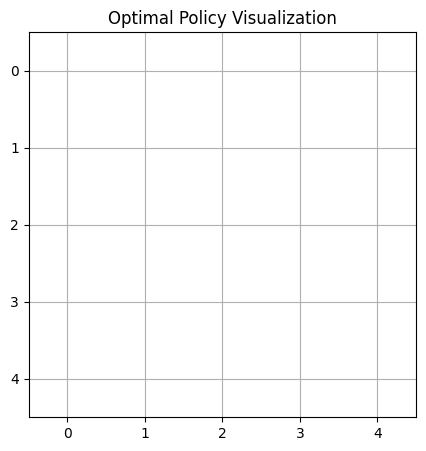



Episode 69:
Taxi starting position: 0
First customer request: C


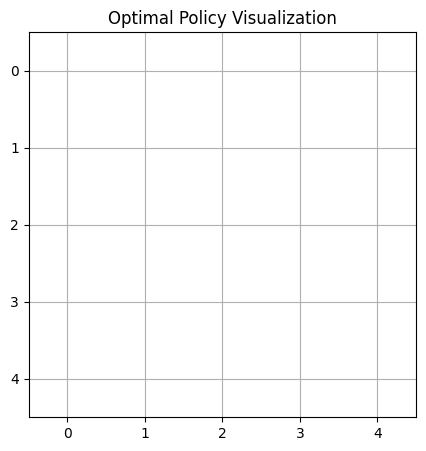



Episode 70:
Taxi starting position: 2
First customer request: A


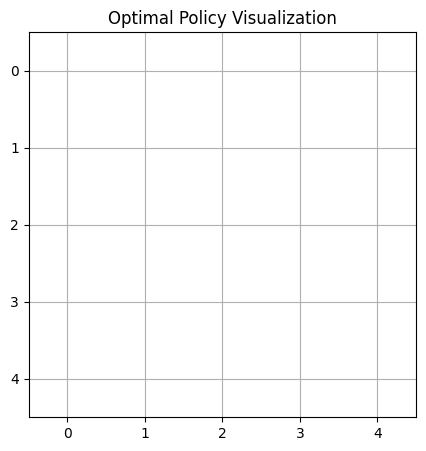



Episode 71:
Taxi starting position: 1
First customer request: C
Second customer request: A


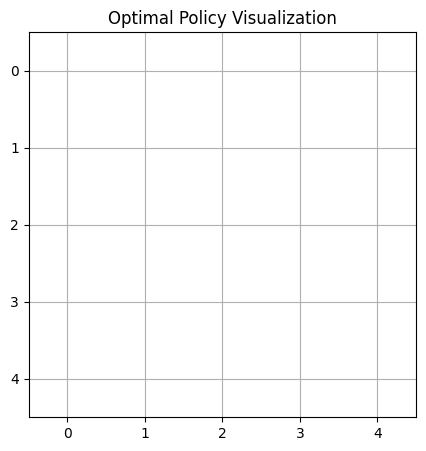



Episode 72:
Taxi starting position: 3
First customer request: C


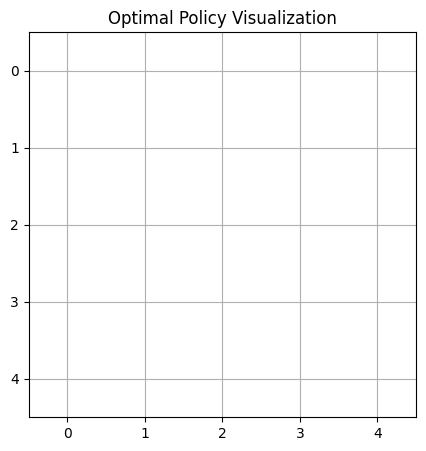



Episode 73:
Taxi starting position: 4
First customer request: B
Second customer request: A


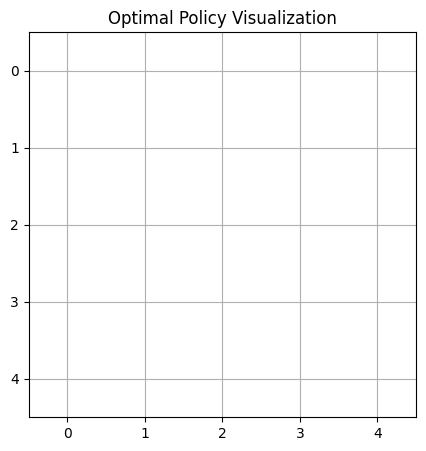



Episode 74:
Taxi starting position: 0
First customer request: D
Second customer request: B
Second customer is a premium customer.


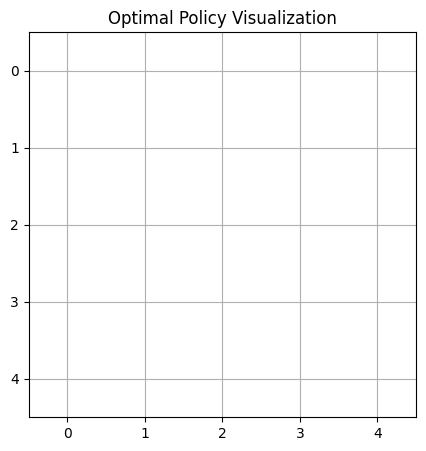



Episode 75:
Taxi starting position: 4
First customer request: C
Second customer request: B


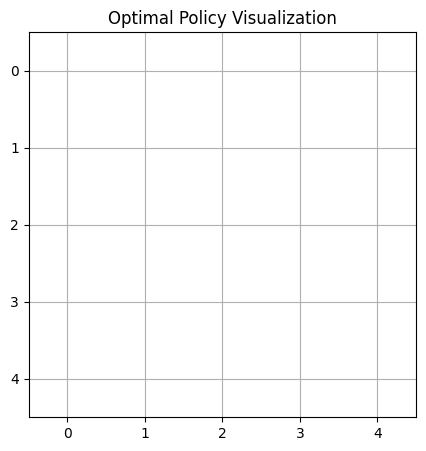



Episode 76:
Taxi starting position: 1
First customer request: D


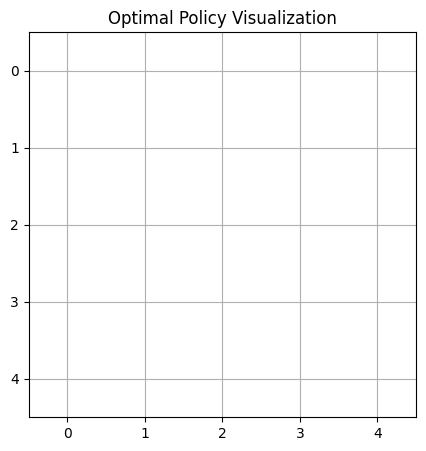



Episode 77:
Taxi starting position: 2
First customer request: D
Second customer request: D


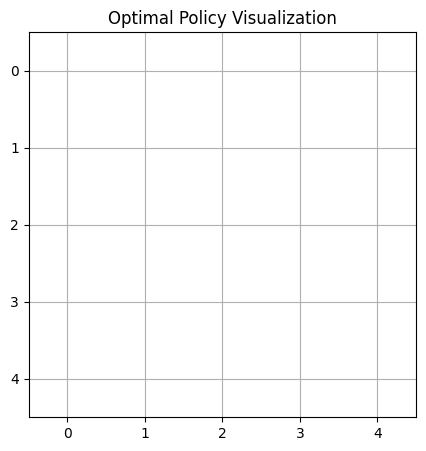



Episode 78:
Taxi starting position: 3
First customer request: A
Second customer request: D


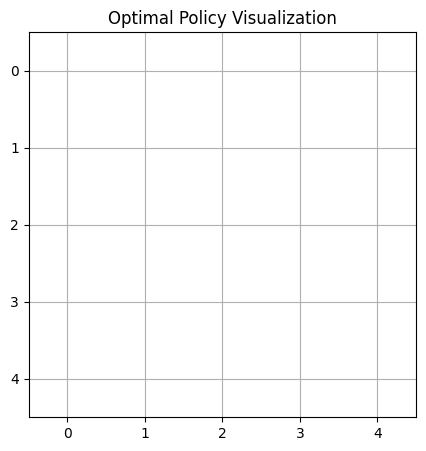



Episode 79:
Taxi starting position: 1
First customer request: A
Second customer request: B
Second customer is a premium customer.


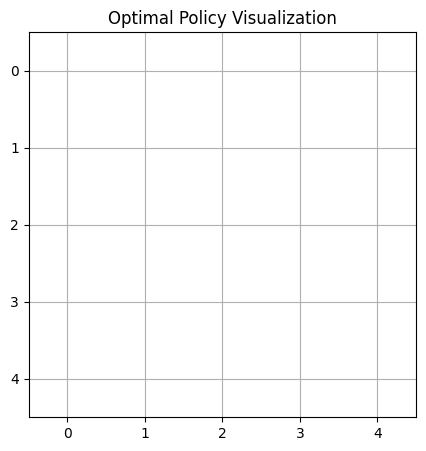



Episode 80:
Taxi starting position: 2
First customer request: D
Second customer request: C


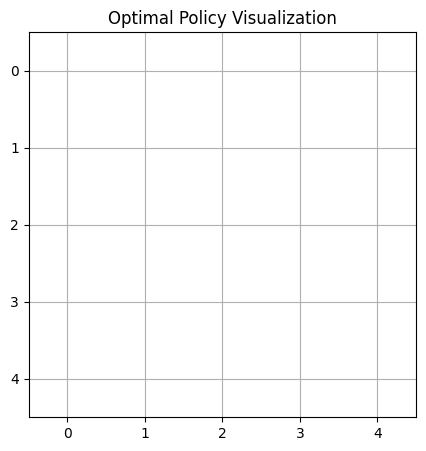



Episode 81:
Taxi starting position: 2
First customer request: A
Second customer request: B
Second customer is a premium customer.


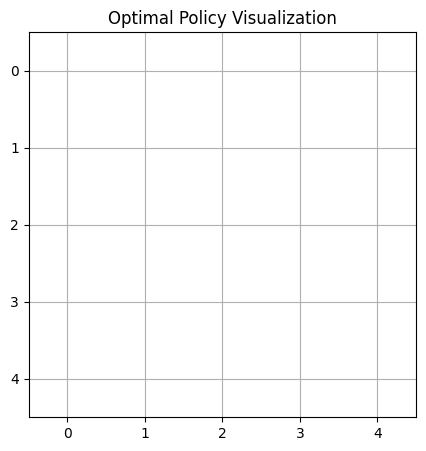



Episode 82:
Taxi starting position: 0
First customer request: A


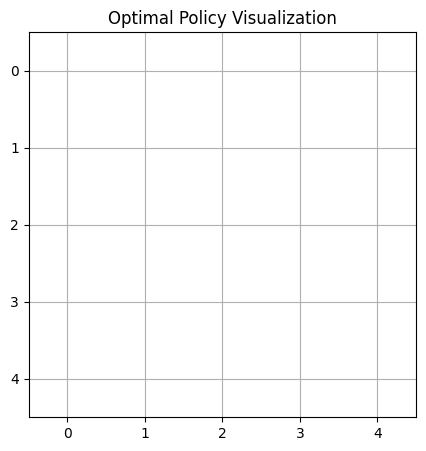



Episode 83:
Taxi starting position: 1
First customer request: B
Second customer request: D


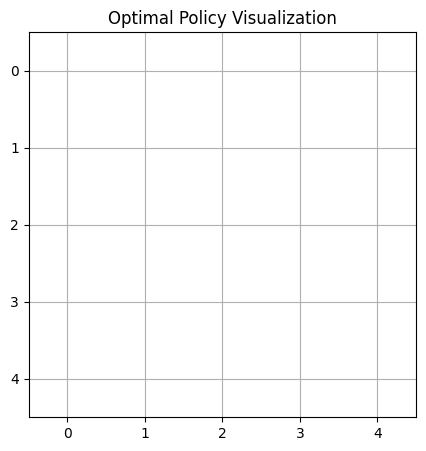



Episode 84:
Taxi starting position: 0
First customer request: A
Second customer request: A


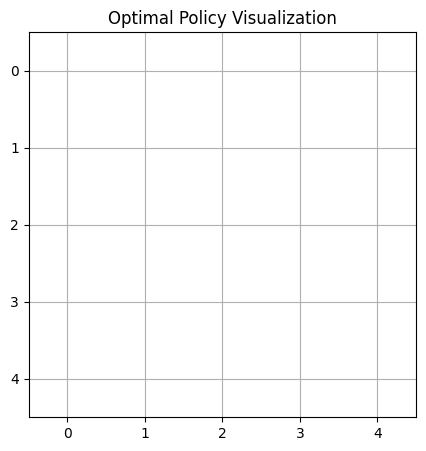



Episode 85:
Taxi starting position: 2
First customer request: D
Second customer request: B


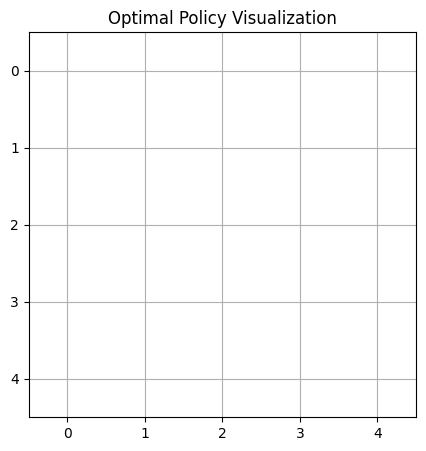



Episode 86:
Taxi starting position: 0
First customer request: D
Second customer request: D


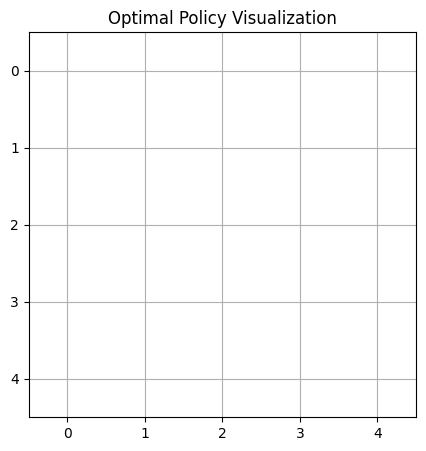



Episode 87:
Taxi starting position: 4
First customer request: B
Second customer request: A


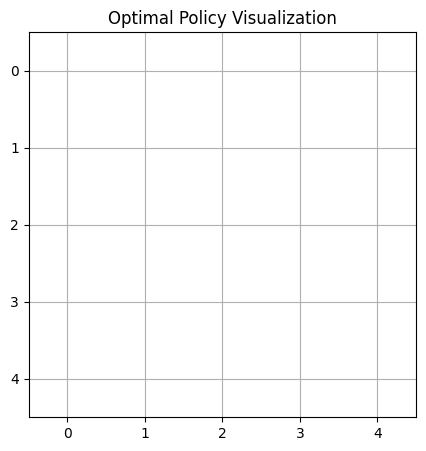



Episode 88:
Taxi starting position: 4
First customer request: B


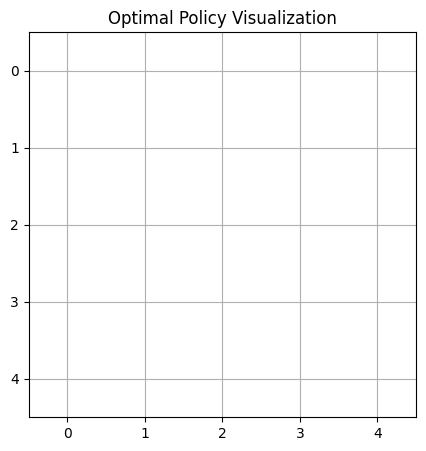



Episode 89:
Taxi starting position: 0
First customer request: D


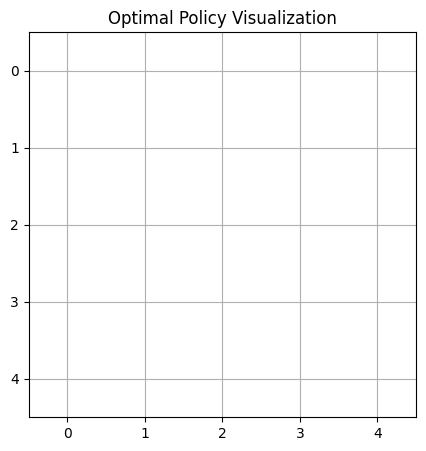



Episode 90:
Taxi starting position: 0
First customer request: D
Second customer request: A


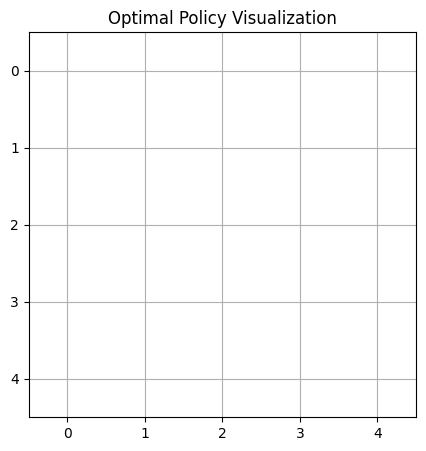



Episode 91:
Taxi starting position: 4
First customer request: C


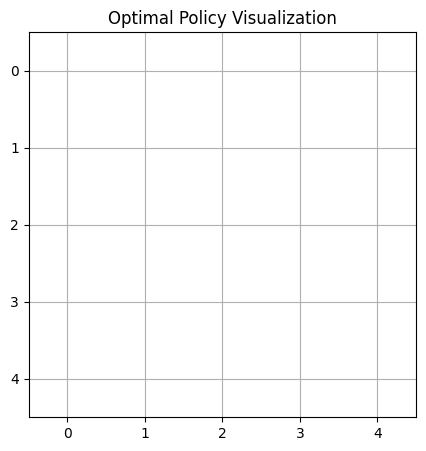



Episode 92:
Taxi starting position: 4
First customer request: C
Second customer request: C


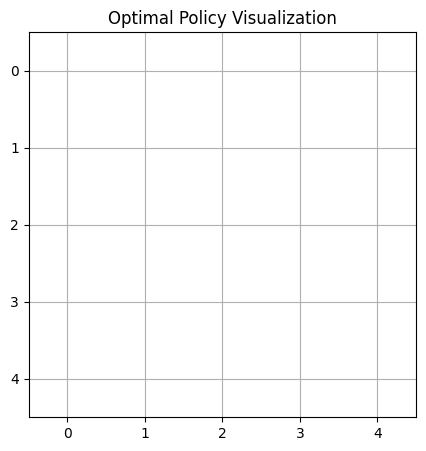



Episode 93:
Taxi starting position: 1
First customer request: A
Second customer request: D


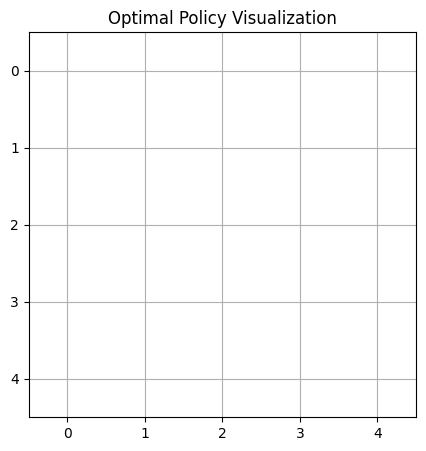



Episode 94:
Taxi starting position: 0
First customer request: A


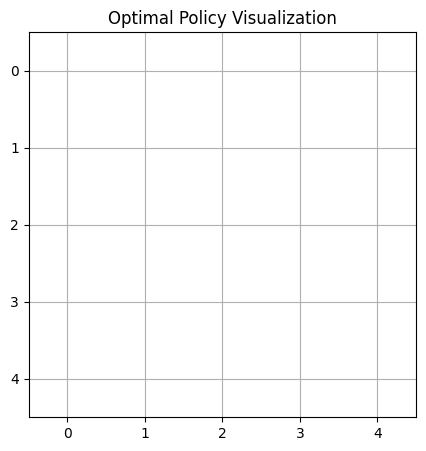



Episode 95:
Taxi starting position: 4
First customer request: D
Second customer request: B


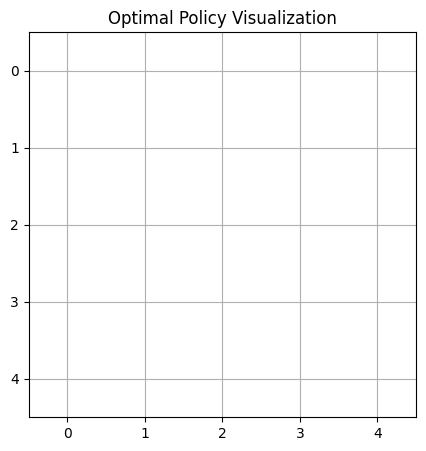



Episode 96:
Taxi starting position: 4
First customer request: C
Second customer request: D
Second customer is a premium customer.


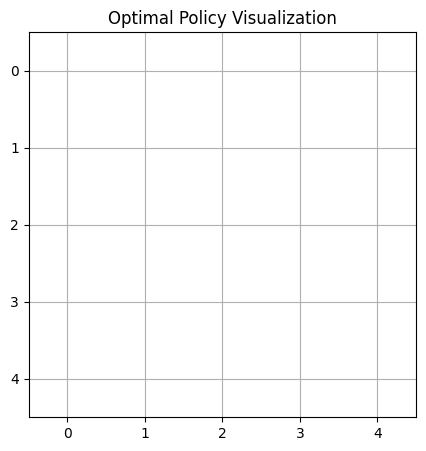



Episode 97:
Taxi starting position: 3
First customer request: A
Second customer request: B


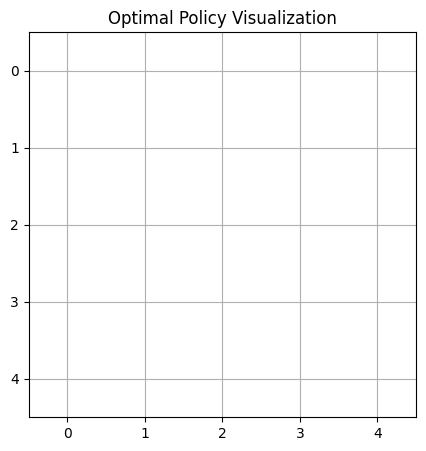



Episode 98:
Taxi starting position: 2
First customer request: D
Second customer request: B
Second customer is a premium customer.


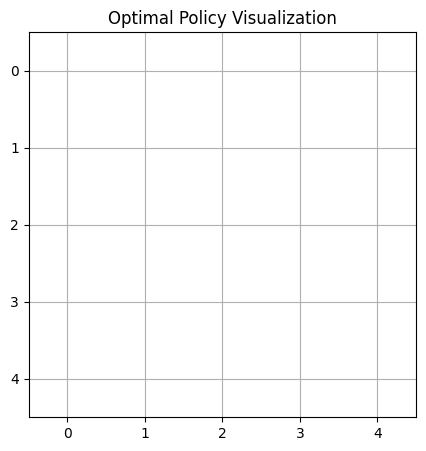



Episode 99:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


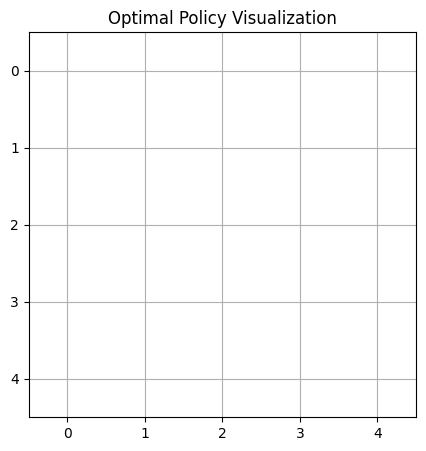



Episode 100:
Taxi starting position: 3
First customer request: A
Second customer request: B
Second customer is a premium customer.


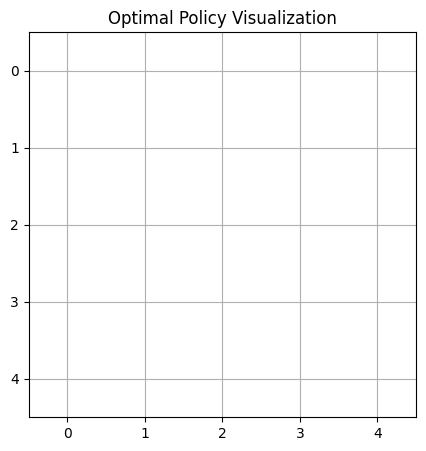



Episode 101:
Taxi starting position: 4
First customer request: C
Second customer request: C


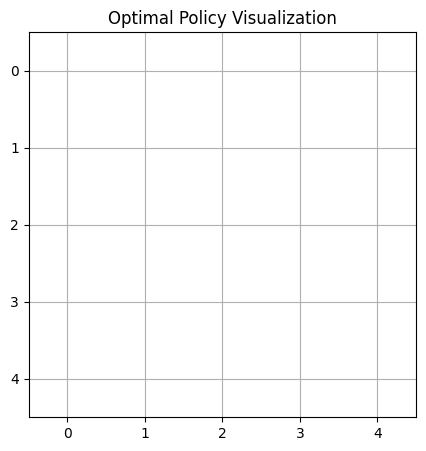



Episode 102:
Taxi starting position: 3
First customer request: B
Second customer request: B


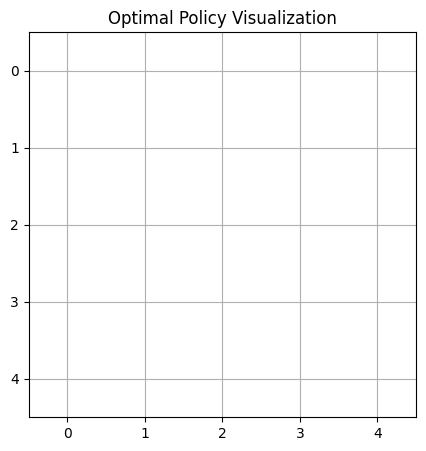



Episode 103:
Taxi starting position: 4
First customer request: C
Second customer request: C


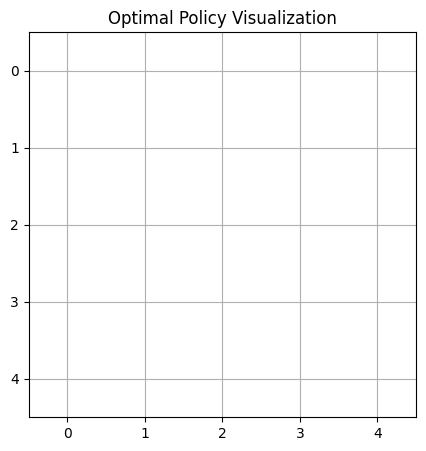



Episode 104:
Taxi starting position: 1
First customer request: A


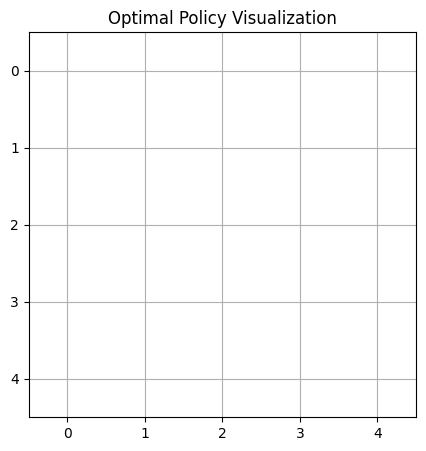



Episode 105:
Taxi starting position: 3
First customer request: C
Second customer request: D


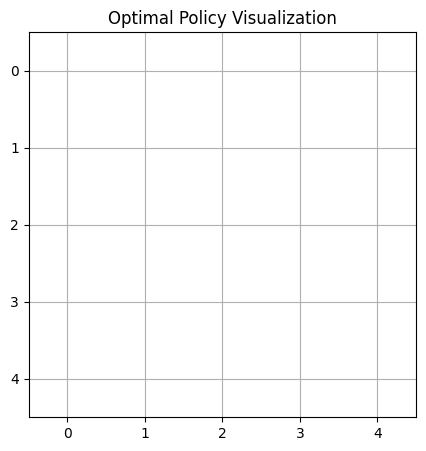



Episode 106:
Taxi starting position: 4
First customer request: B
Second customer request: C


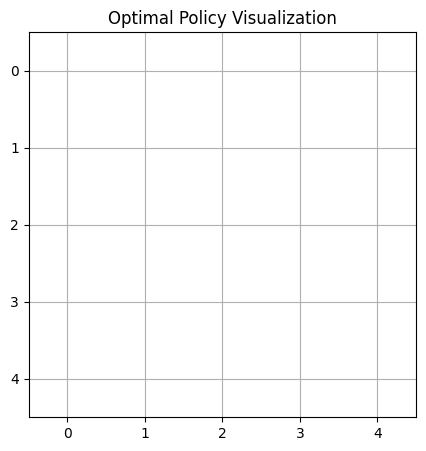



Episode 107:
Taxi starting position: 1
First customer request: A
Second customer request: B
Second customer is a premium customer.


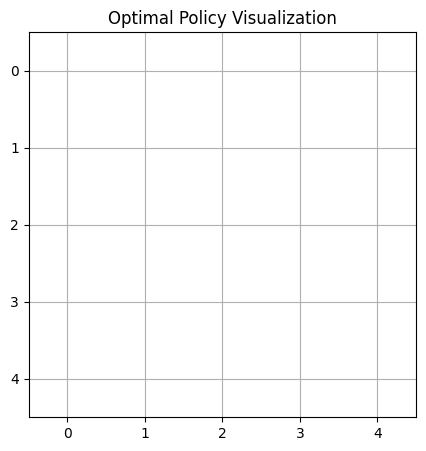



Episode 108:
Taxi starting position: 1
First customer request: D
Second customer request: C


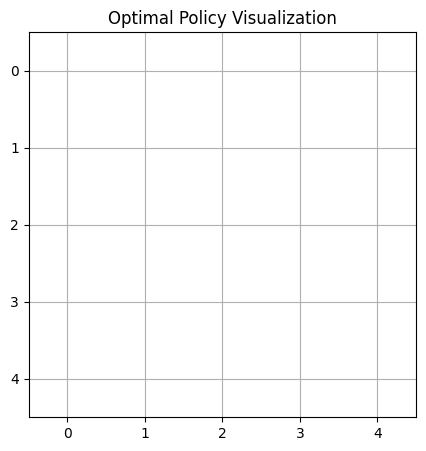



Episode 109:
Taxi starting position: 3
First customer request: A
Second customer request: D


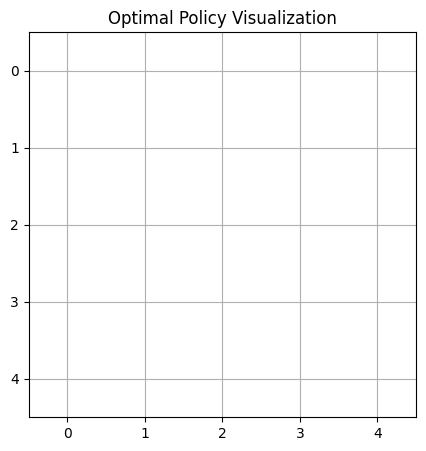



Episode 110:
Taxi starting position: 1
First customer request: B
Second customer request: B


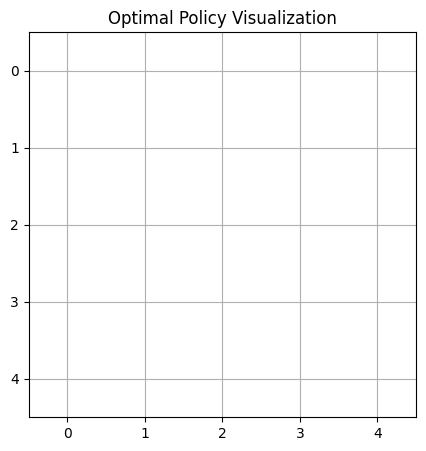



Episode 111:
Taxi starting position: 0
First customer request: A
Second customer request: A
Second customer is a premium customer.


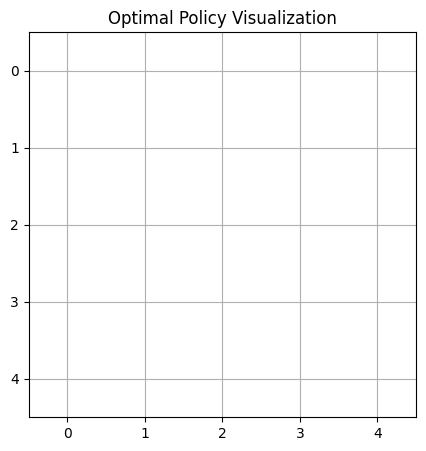



Episode 112:
Taxi starting position: 2
First customer request: D
Second customer request: C
Second customer is a premium customer.


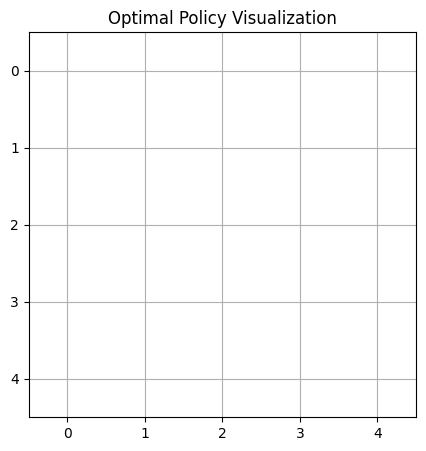



Episode 113:
Taxi starting position: 0
First customer request: C
Second customer request: C


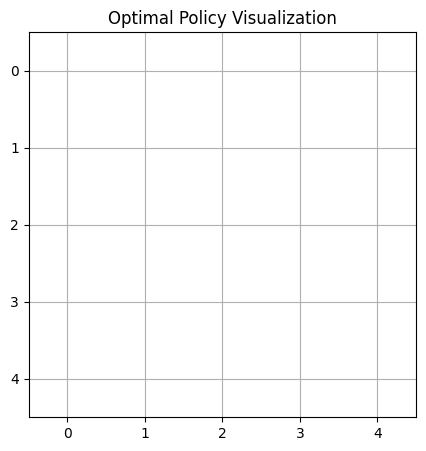



Episode 114:
Taxi starting position: 4
First customer request: C


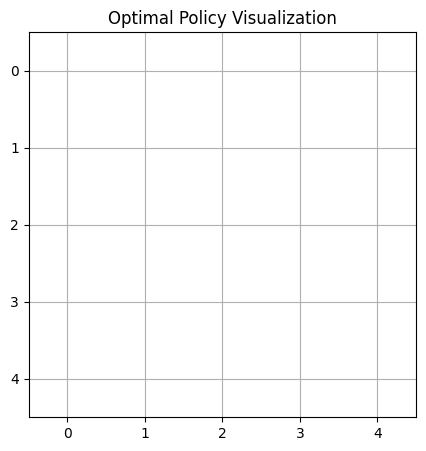



Episode 115:
Taxi starting position: 0
First customer request: D
Second customer request: A


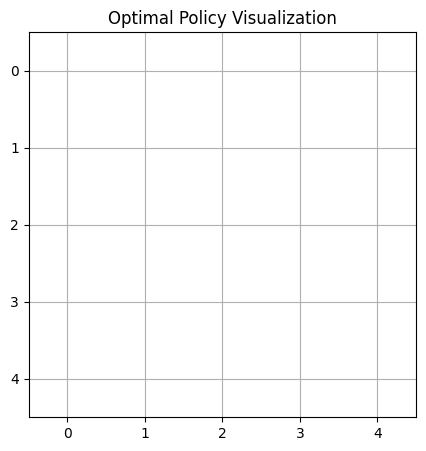



Episode 116:
Taxi starting position: 2
First customer request: A
Second customer request: C


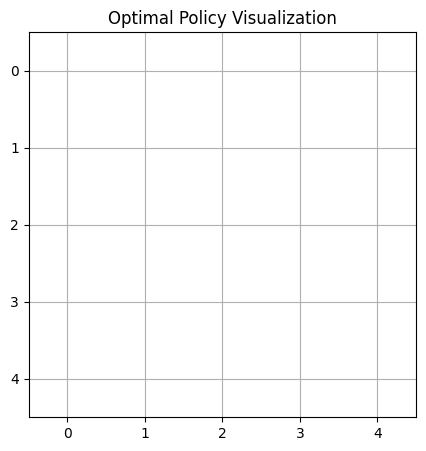



Episode 117:
Taxi starting position: 2
First customer request: A


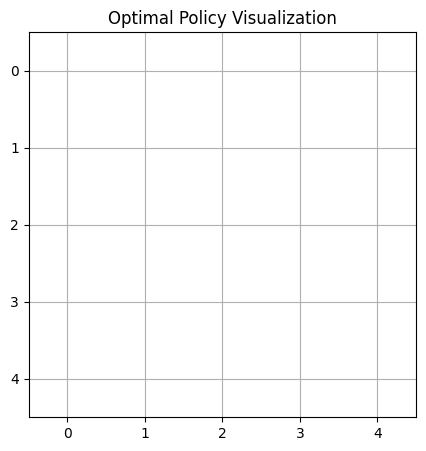



Episode 118:
Taxi starting position: 4
First customer request: B


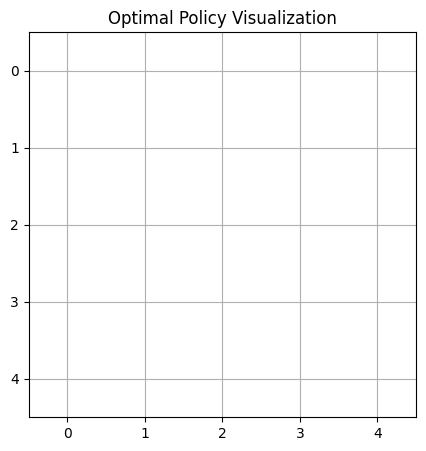



Episode 119:
Taxi starting position: 0
First customer request: B


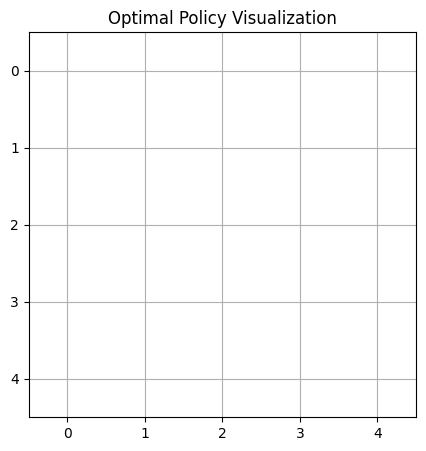



Episode 120:
Taxi starting position: 2
First customer request: B


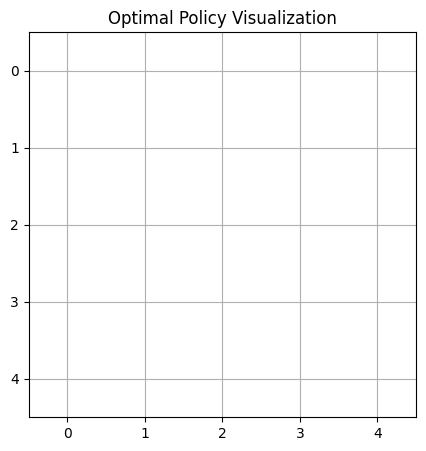



Episode 121:
Taxi starting position: 2
First customer request: C


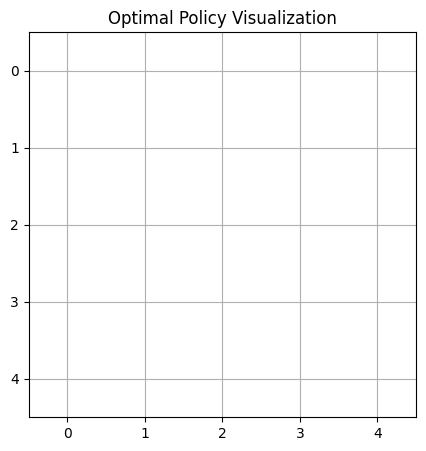



Episode 122:
Taxi starting position: 3
First customer request: C
Second customer request: A
Second customer is a premium customer.


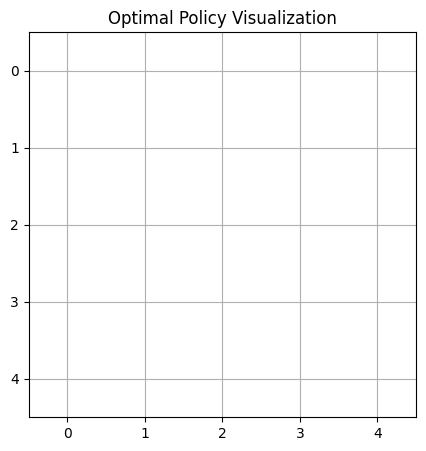



Episode 123:
Taxi starting position: 3
First customer request: B
Second customer request: A


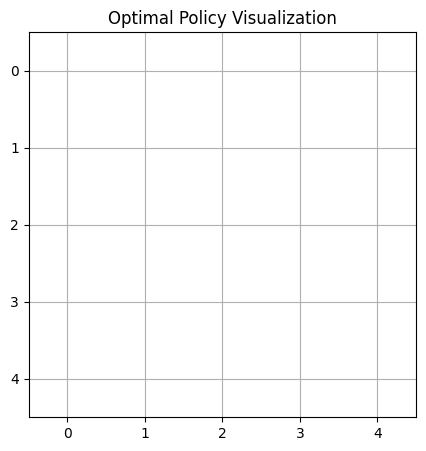



Episode 124:
Taxi starting position: 3
First customer request: D


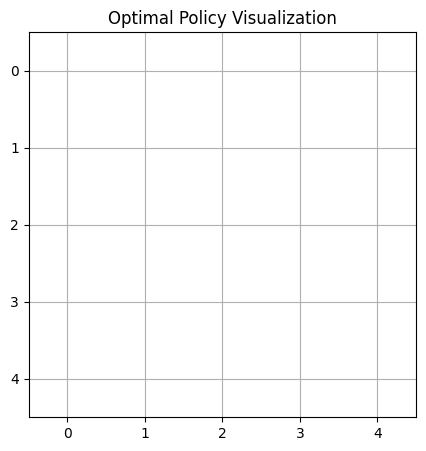



Episode 125:
Taxi starting position: 2
First customer request: B


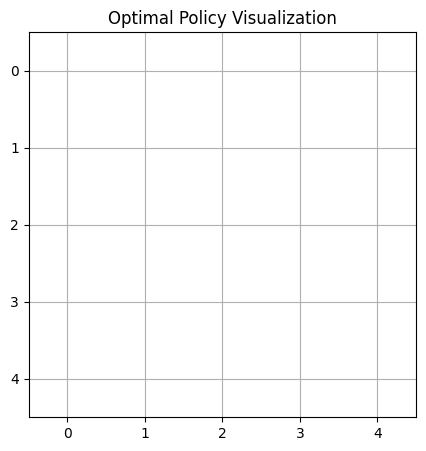



Episode 126:
Taxi starting position: 0
First customer request: B


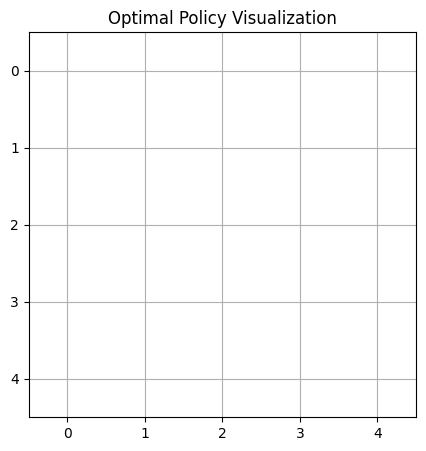



Episode 127:
Taxi starting position: 2
First customer request: A
Second customer request: B
Second customer is a premium customer.


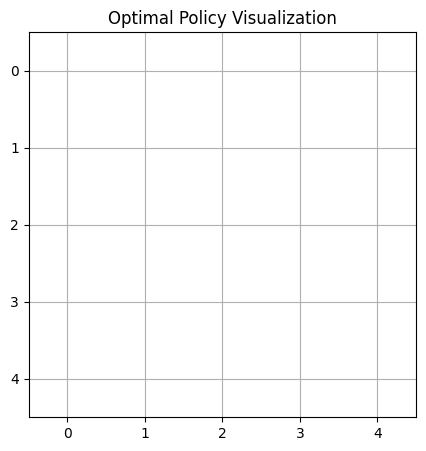



Episode 128:
Taxi starting position: 4
First customer request: B


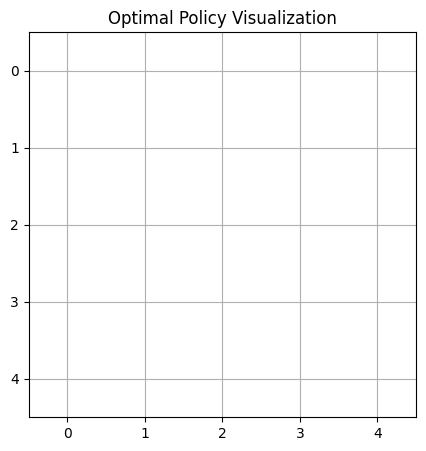



Episode 129:
Taxi starting position: 1
First customer request: D


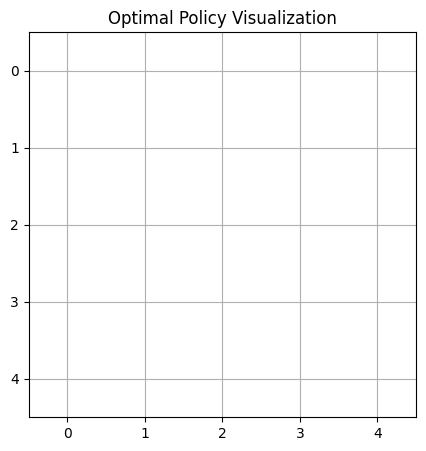



Episode 130:
Taxi starting position: 0
First customer request: D
Second customer request: B
Second customer is a premium customer.


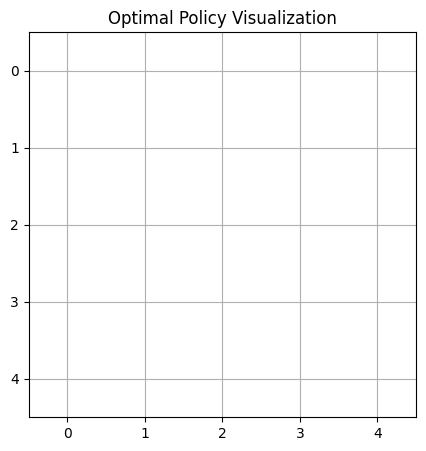



Episode 131:
Taxi starting position: 1
First customer request: B


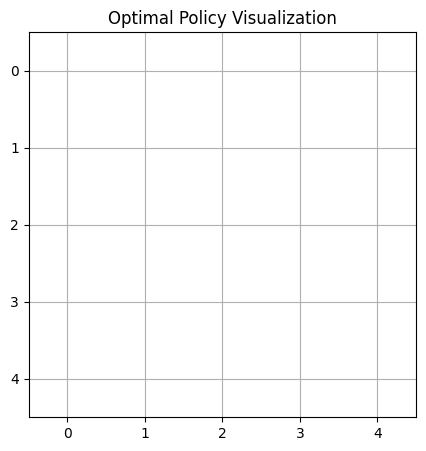



Episode 132:
Taxi starting position: 4
First customer request: C


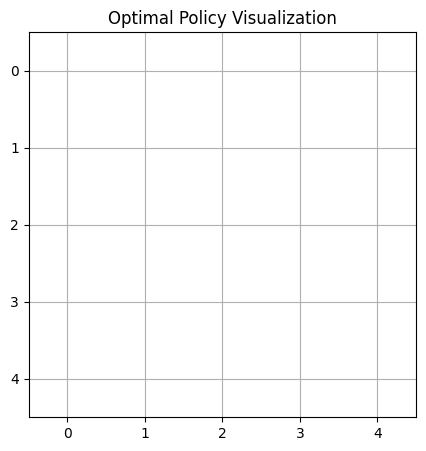



Episode 133:
Taxi starting position: 0
First customer request: B


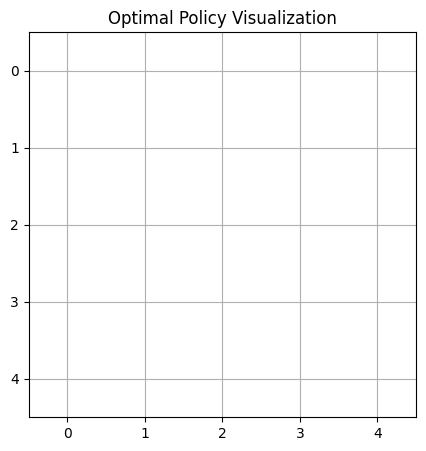



Episode 134:
Taxi starting position: 1
First customer request: B
Second customer request: D


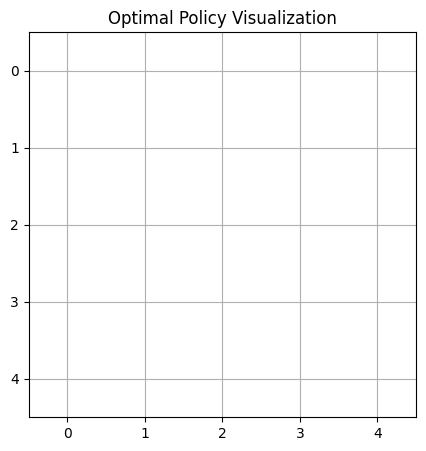



Episode 135:
Taxi starting position: 2
First customer request: B
Second customer request: C


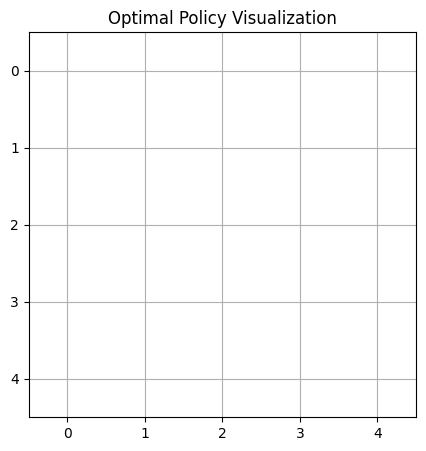



Episode 136:
Taxi starting position: 1
First customer request: B


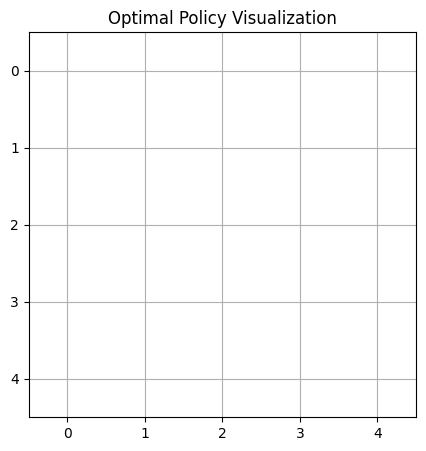



Episode 137:
Taxi starting position: 0
First customer request: B


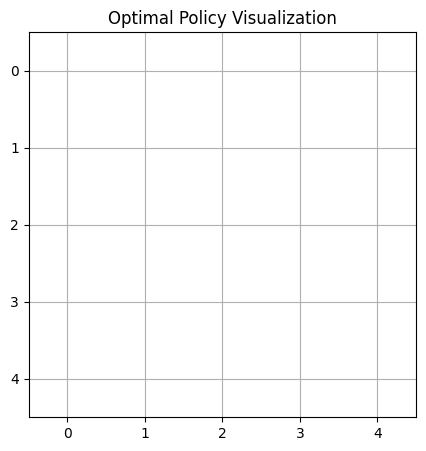



Episode 138:
Taxi starting position: 3
First customer request: C
Second customer request: C
Second customer is a premium customer.


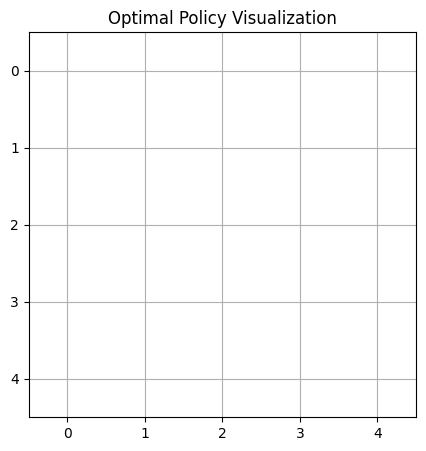



Episode 139:
Taxi starting position: 3
First customer request: A
Second customer request: A


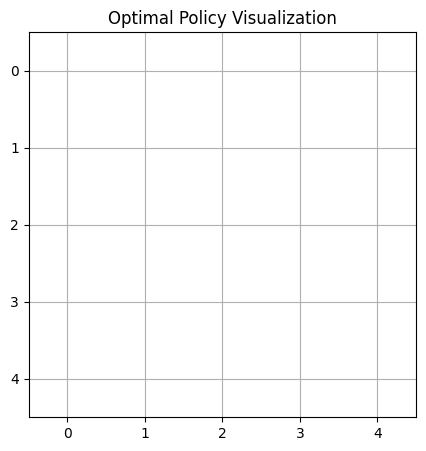



Episode 140:
Taxi starting position: 0
First customer request: A


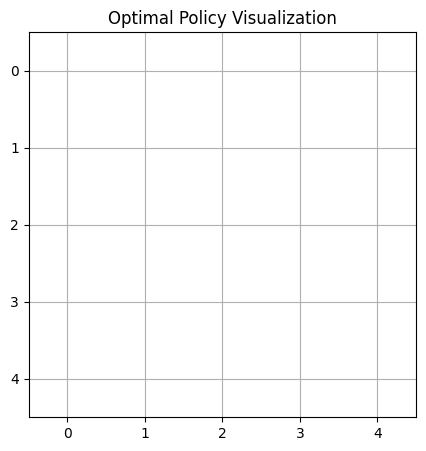



Episode 141:
Taxi starting position: 1
First customer request: C


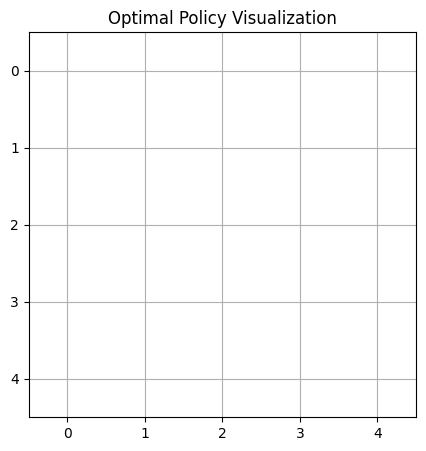



Episode 142:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


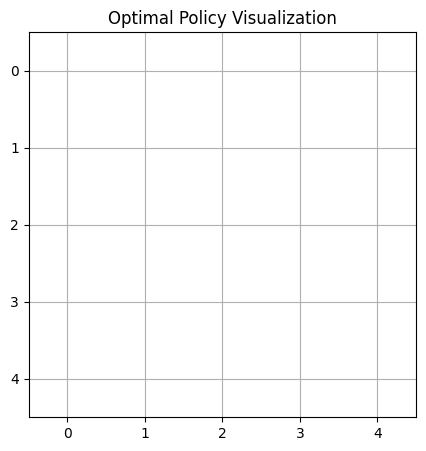



Episode 143:
Taxi starting position: 0
First customer request: A
Second customer request: C


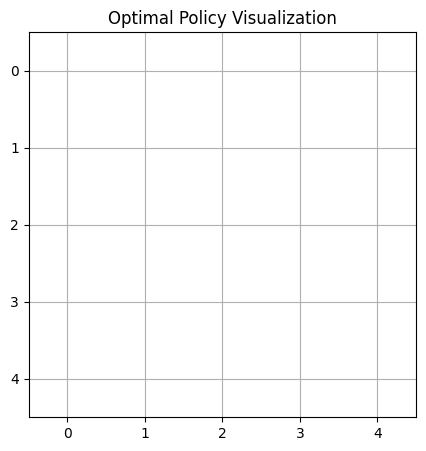



Episode 144:
Taxi starting position: 0
First customer request: B
Second customer request: B


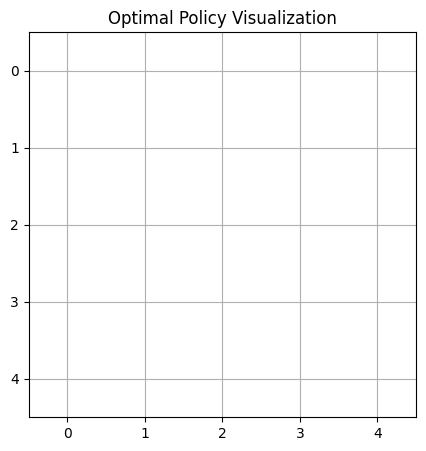



Episode 145:
Taxi starting position: 2
First customer request: D
Second customer request: A


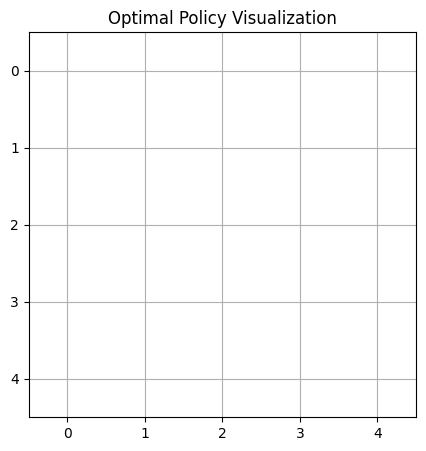



Episode 146:
Taxi starting position: 4
First customer request: C


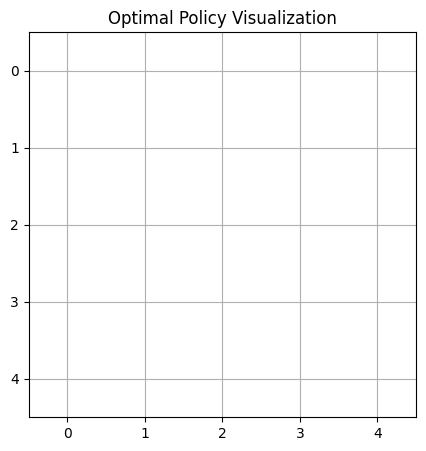



Episode 147:
Taxi starting position: 0
First customer request: C
Second customer request: D


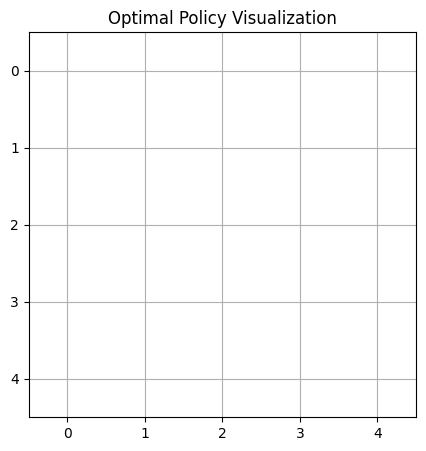



Episode 148:
Taxi starting position: 4
First customer request: A
Second customer request: A


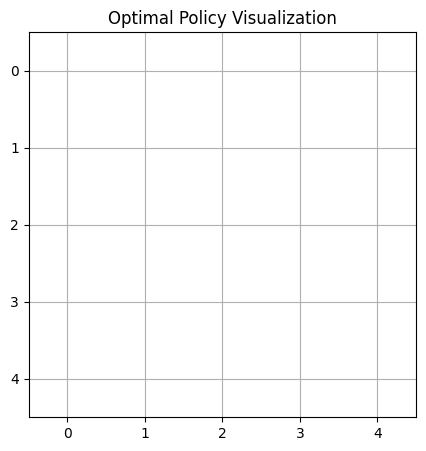



Episode 149:
Taxi starting position: 4
First customer request: D
Second customer request: C


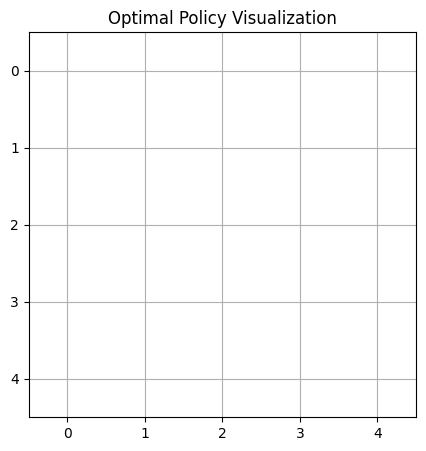



Episode 150:
Taxi starting position: 4
First customer request: D


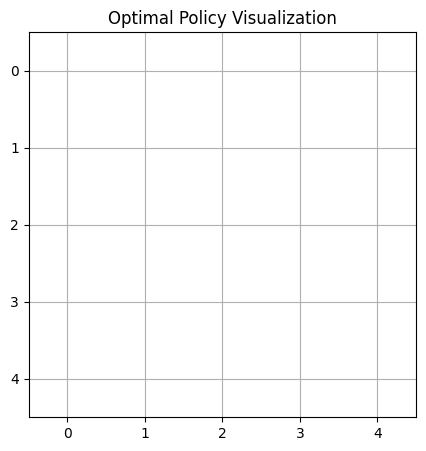



Episode 151:
Taxi starting position: 0
First customer request: D


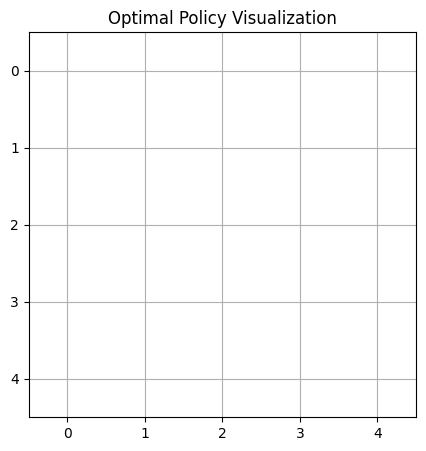



Episode 152:
Taxi starting position: 1
First customer request: B
Second customer request: A


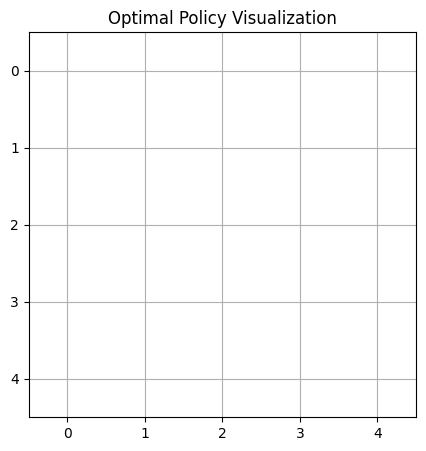



Episode 153:
Taxi starting position: 1
First customer request: C
Second customer request: C


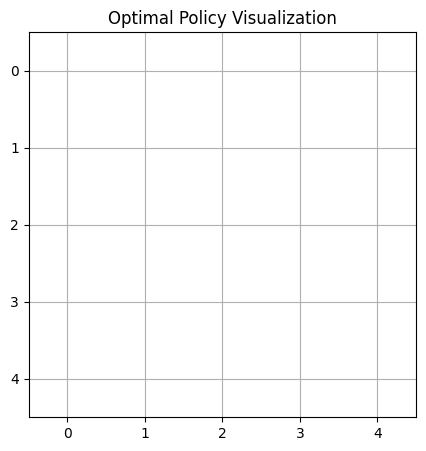



Episode 154:
Taxi starting position: 1
First customer request: D
Second customer request: C


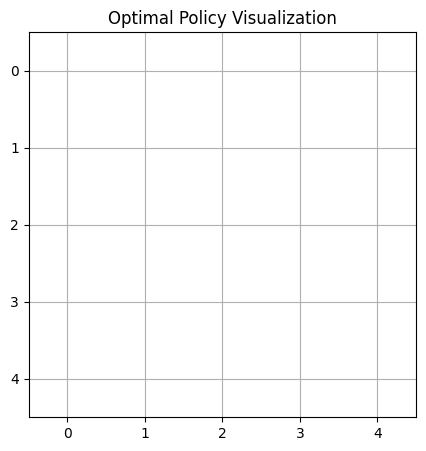



Episode 155:
Taxi starting position: 2
First customer request: C
Second customer request: A
Second customer is a premium customer.


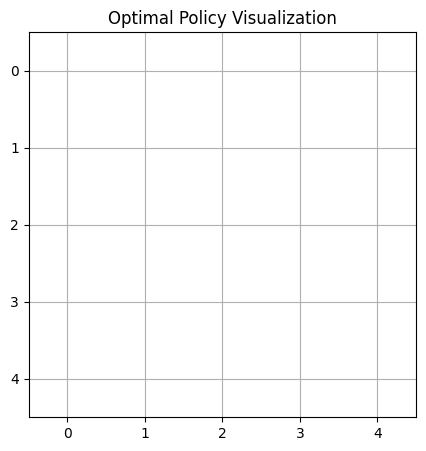



Episode 156:
Taxi starting position: 1
First customer request: A


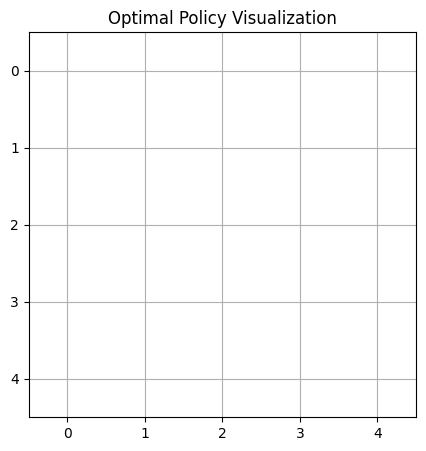



Episode 157:
Taxi starting position: 0
First customer request: C
Second customer request: C


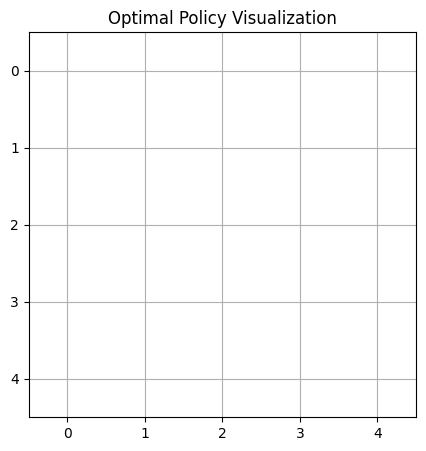



Episode 158:
Taxi starting position: 1
First customer request: D


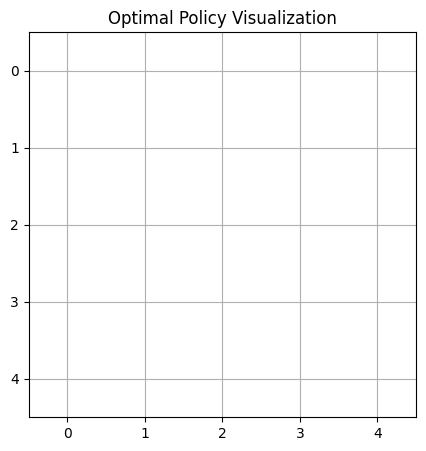



Episode 159:
Taxi starting position: 2
First customer request: D
Second customer request: B


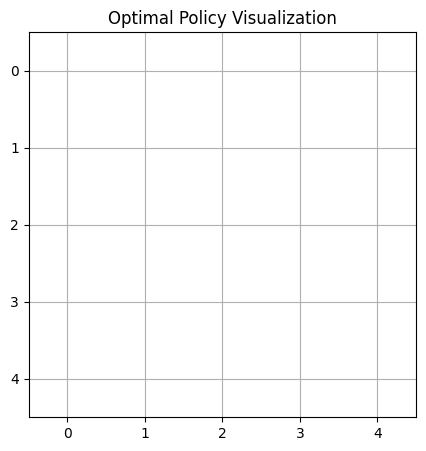



Episode 160:
Taxi starting position: 2
First customer request: C


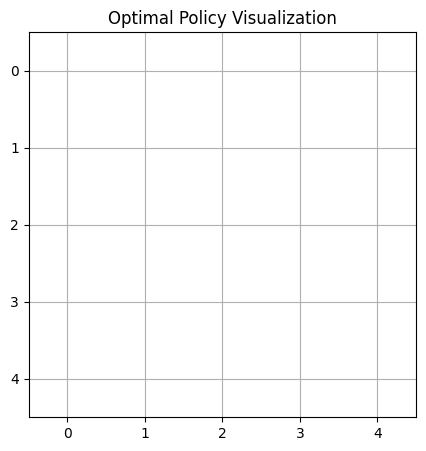



Episode 161:
Taxi starting position: 0
First customer request: A


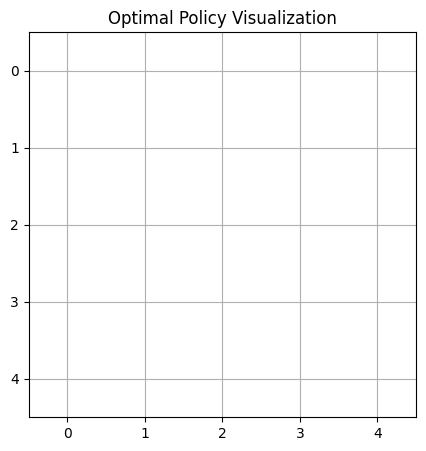



Episode 162:
Taxi starting position: 1
First customer request: C
Second customer request: A


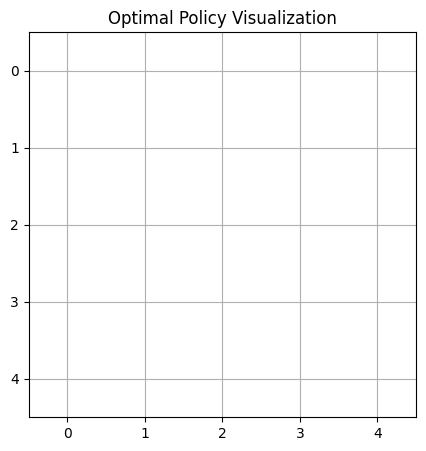



Episode 163:
Taxi starting position: 1
First customer request: C


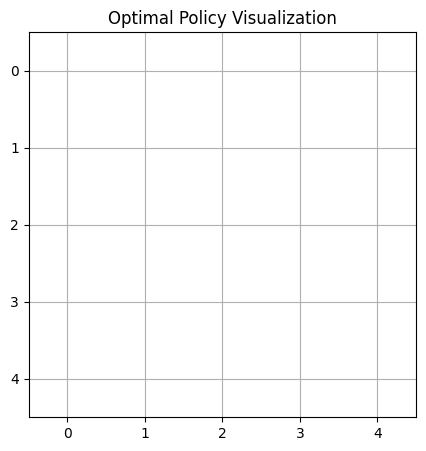



Episode 164:
Taxi starting position: 4
First customer request: D


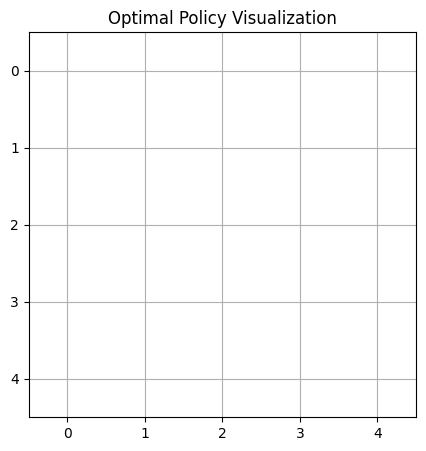



Episode 165:
Taxi starting position: 2
First customer request: A


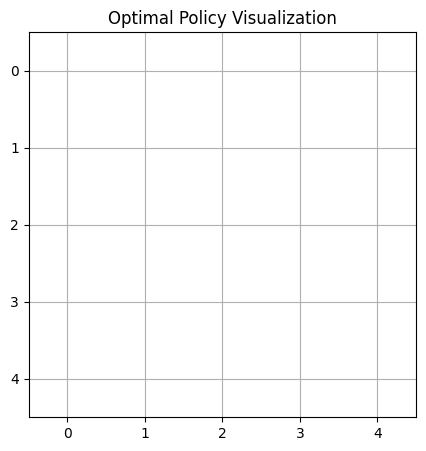



Episode 166:
Taxi starting position: 1
First customer request: C
Second customer request: C


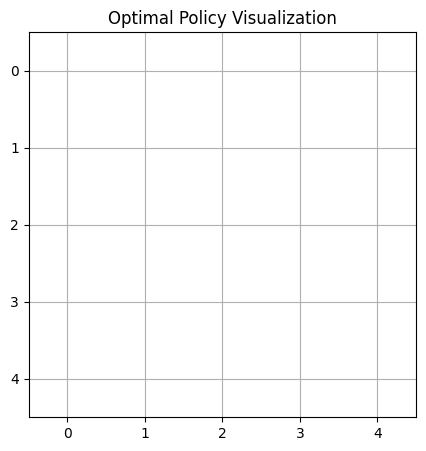



Episode 167:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


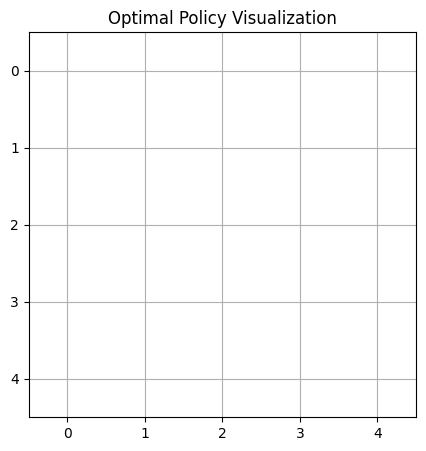



Episode 168:
Taxi starting position: 0
First customer request: C
Second customer request: C


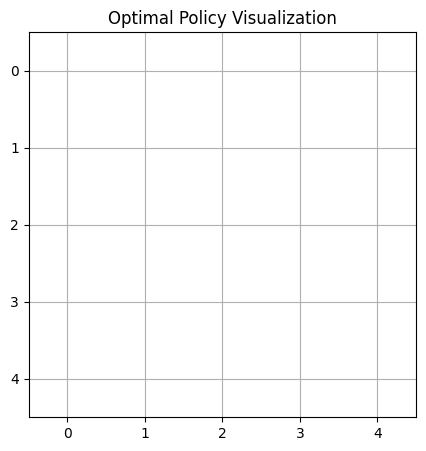



Episode 169:
Taxi starting position: 2
First customer request: B


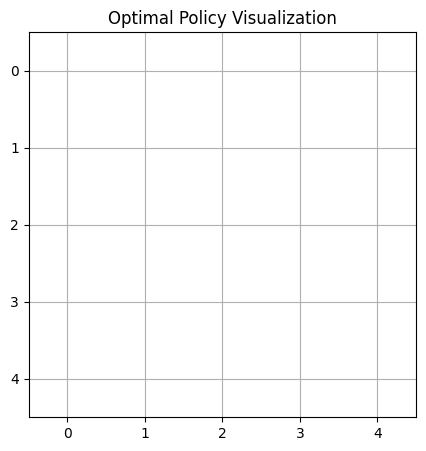



Episode 170:
Taxi starting position: 4
First customer request: B
Second customer request: A
Second customer is a premium customer.


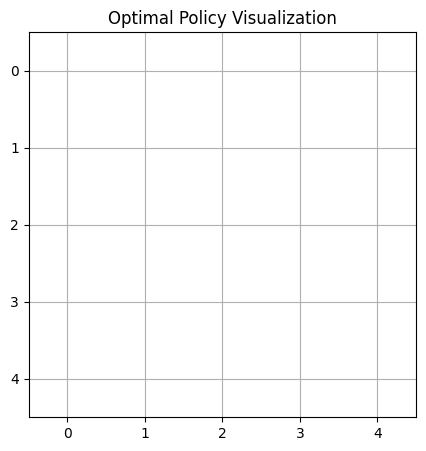



Episode 171:
Taxi starting position: 2
First customer request: A


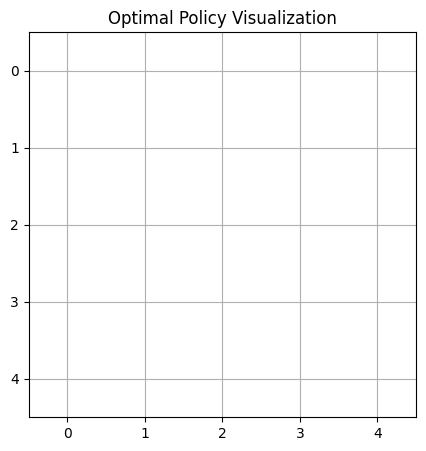



Episode 172:
Taxi starting position: 4
First customer request: B
Second customer request: A


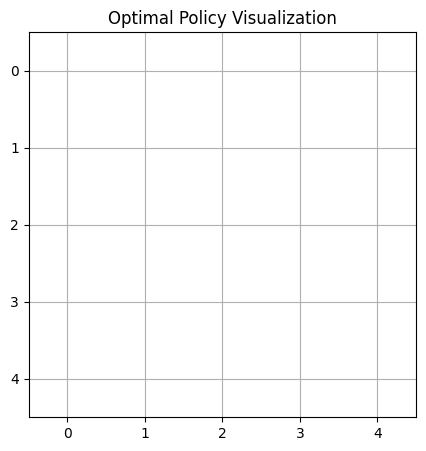



Episode 173:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


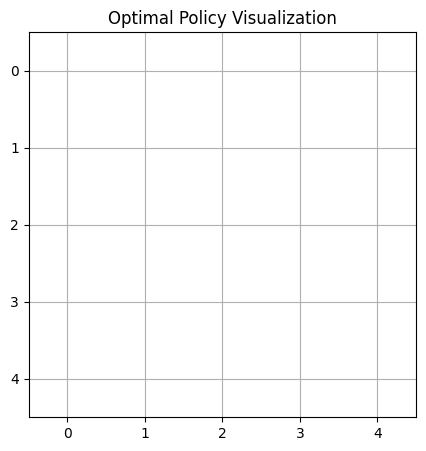



Episode 174:
Taxi starting position: 4
First customer request: D
Second customer request: C


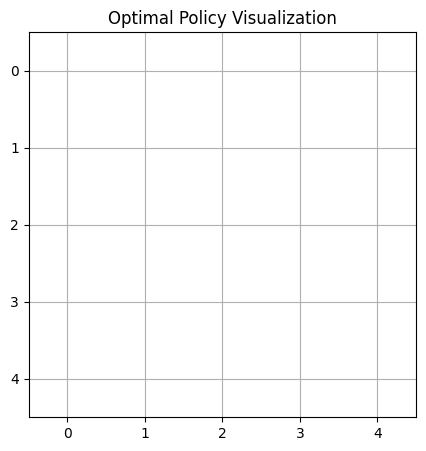



Episode 175:
Taxi starting position: 4
First customer request: C
Second customer request: D


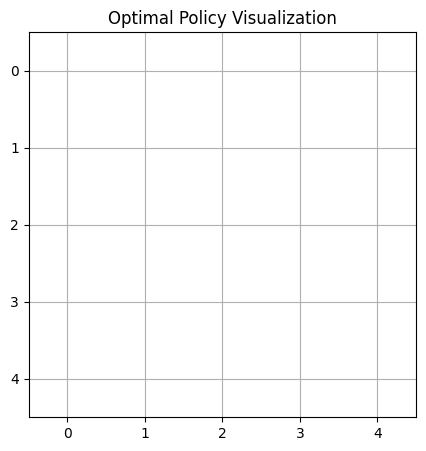



Episode 176:
Taxi starting position: 3
First customer request: D


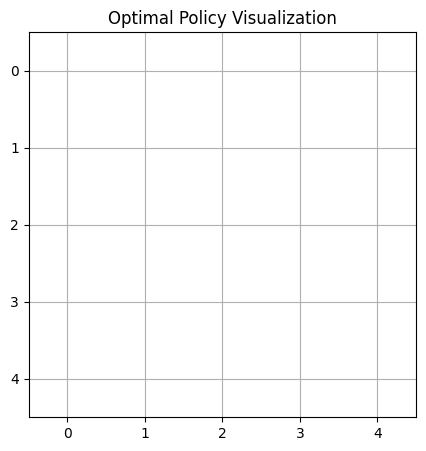



Episode 177:
Taxi starting position: 1
First customer request: B
Second customer request: B


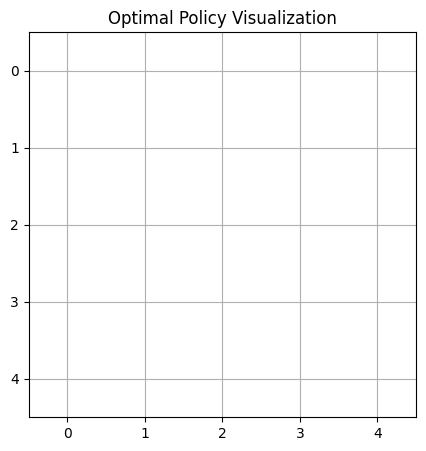



Episode 178:
Taxi starting position: 4
First customer request: B


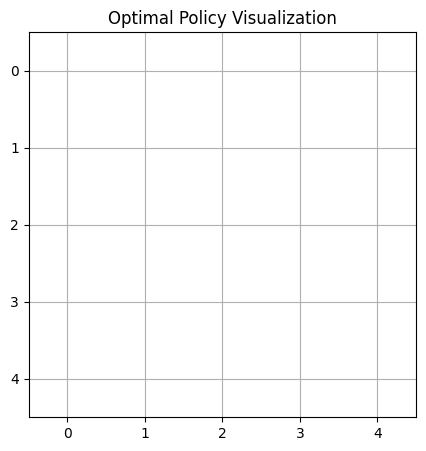



Episode 179:
Taxi starting position: 2
First customer request: B
Second customer request: B


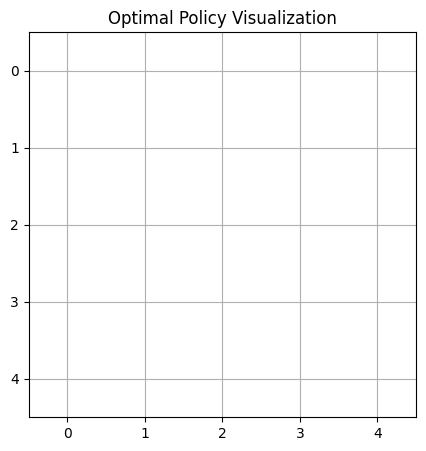



Episode 180:
Taxi starting position: 0
First customer request: A


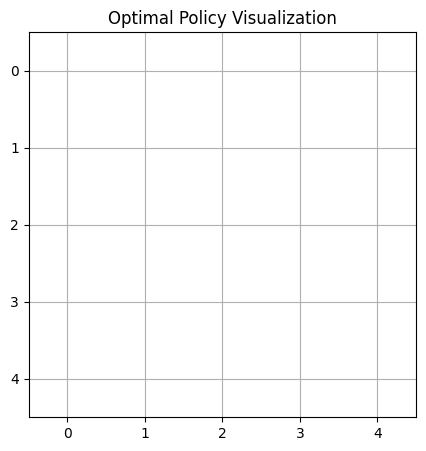



Episode 181:
Taxi starting position: 1
First customer request: A
Second customer request: D


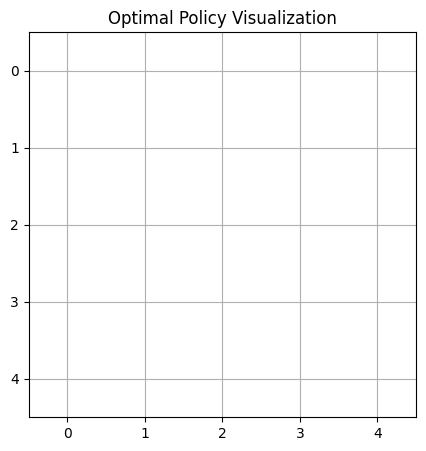



Episode 182:
Taxi starting position: 3
First customer request: A
Second customer request: A
Second customer is a premium customer.


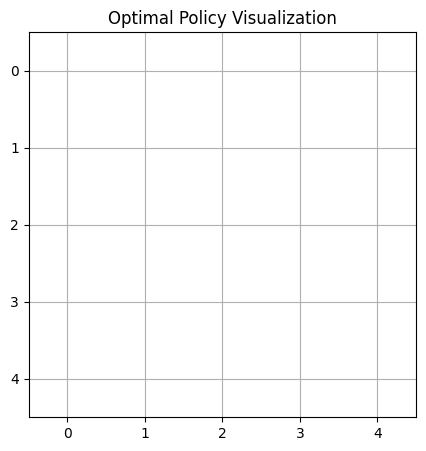



Episode 183:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


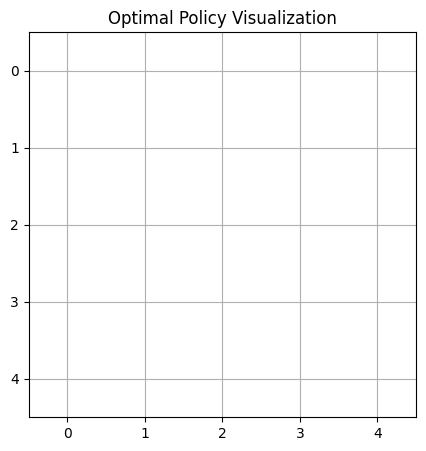



Episode 184:
Taxi starting position: 3
First customer request: D


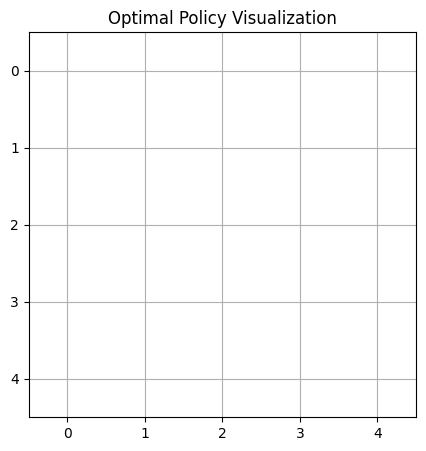



Episode 185:
Taxi starting position: 1
First customer request: B
Second customer request: A


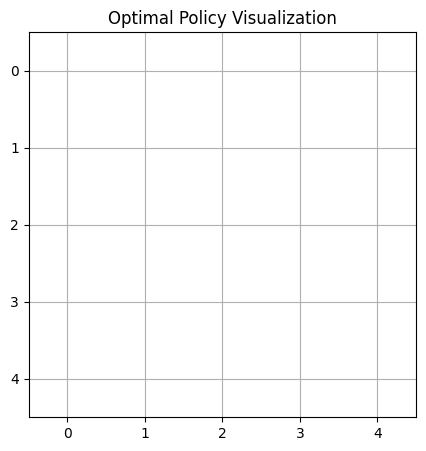



Episode 186:
Taxi starting position: 0
First customer request: C
Second customer request: C


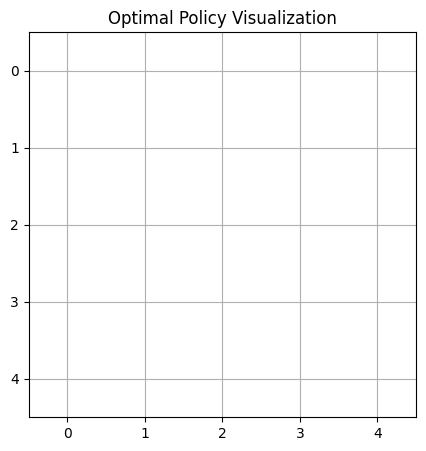



Episode 187:
Taxi starting position: 1
First customer request: D


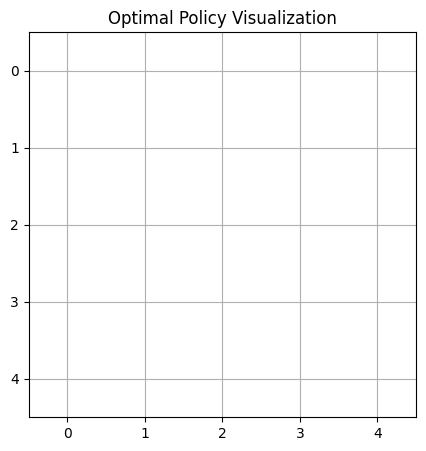



Episode 188:
Taxi starting position: 3
First customer request: C
Second customer request: A
Second customer is a premium customer.


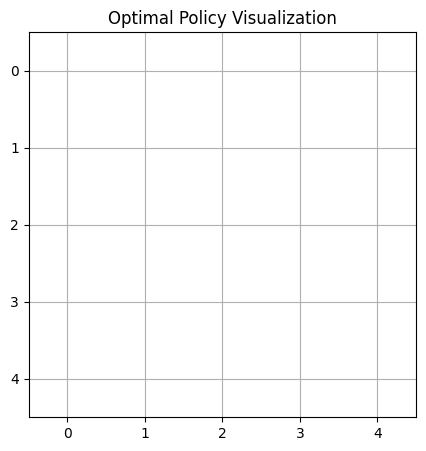



Episode 189:
Taxi starting position: 0
First customer request: B


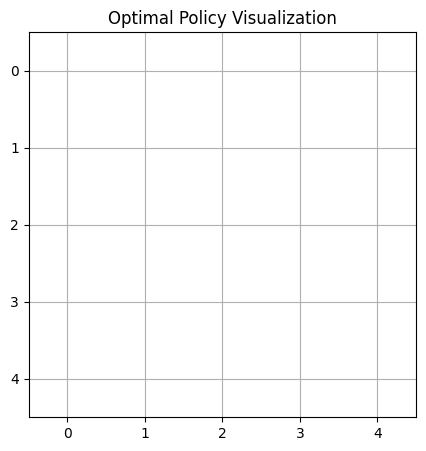



Episode 190:
Taxi starting position: 3
First customer request: A
Second customer request: A
Second customer is a premium customer.


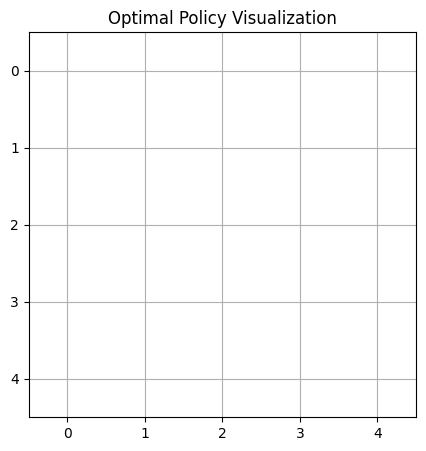



Episode 191:
Taxi starting position: 0
First customer request: B
Second customer request: B
Second customer is a premium customer.


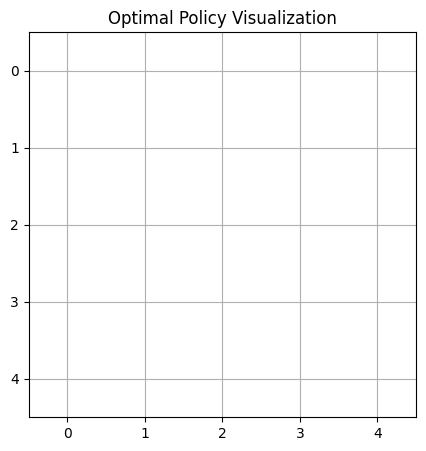



Episode 192:
Taxi starting position: 2
First customer request: A


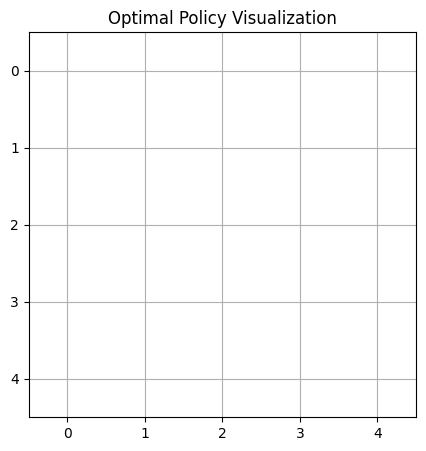



Episode 193:
Taxi starting position: 4
First customer request: D
Second customer request: B


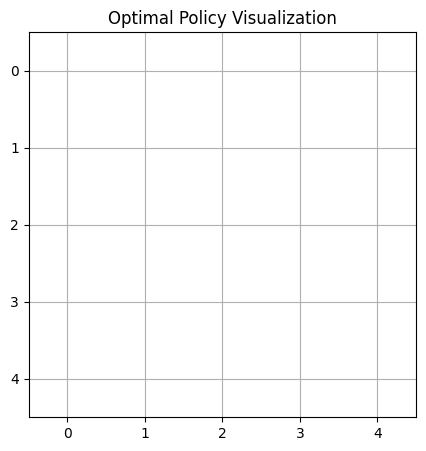



Episode 194:
Taxi starting position: 4
First customer request: B


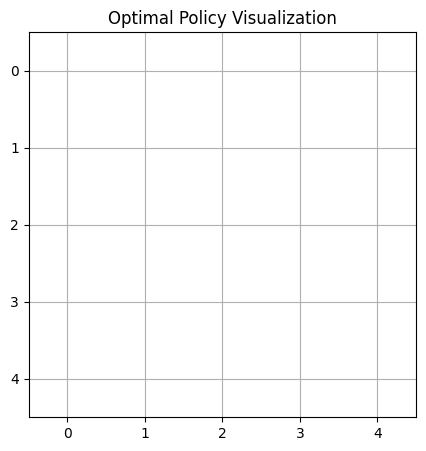



Episode 195:
Taxi starting position: 2
First customer request: C


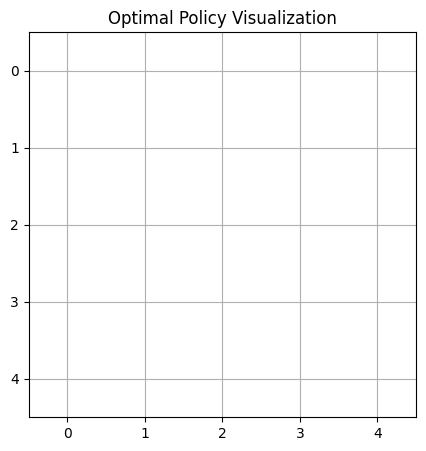



Episode 196:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


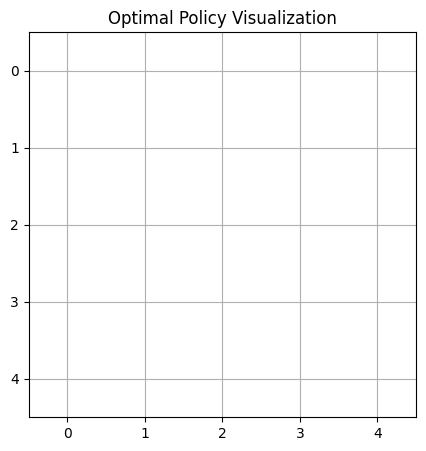



Episode 197:
Taxi starting position: 0
First customer request: C
Second customer request: D


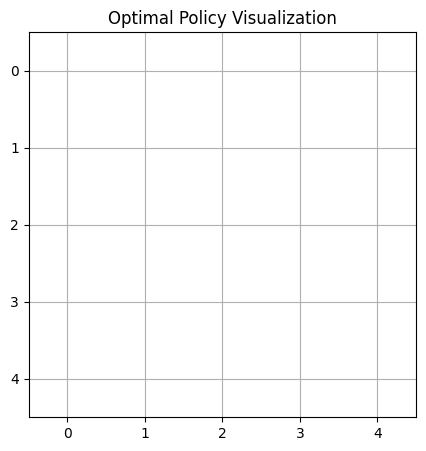



Episode 198:
Taxi starting position: 1
First customer request: B


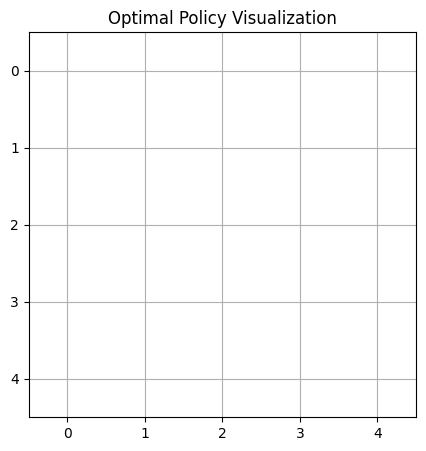



Episode 199:
Taxi starting position: 2
First customer request: A


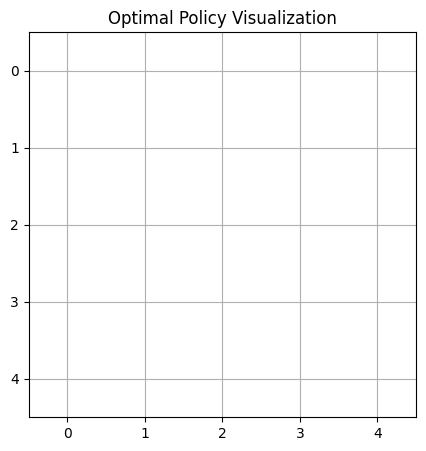



Episode 200:
Taxi starting position: 2
First customer request: C
Second customer request: B


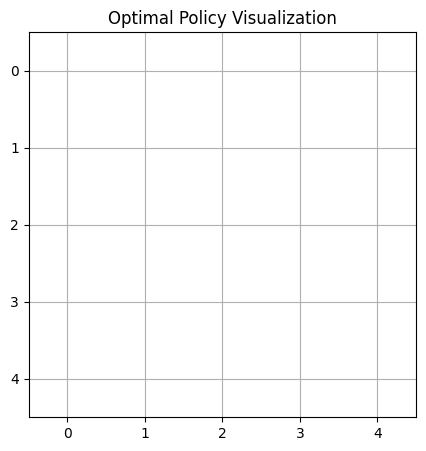



Episode 201:
Taxi starting position: 4
First customer request: D
Second customer request: D
Second customer is a premium customer.


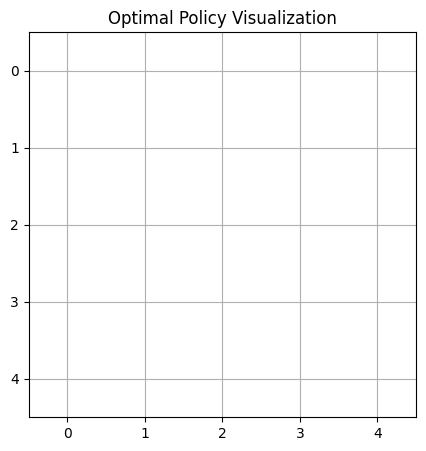



Episode 202:
Taxi starting position: 0
First customer request: A


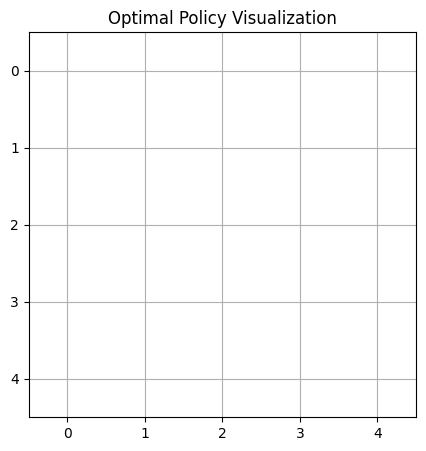



Episode 203:
Taxi starting position: 1
First customer request: B
Second customer request: B


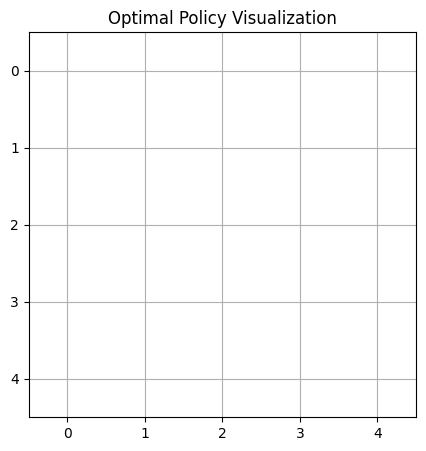



Episode 204:
Taxi starting position: 2
First customer request: A
Second customer request: B


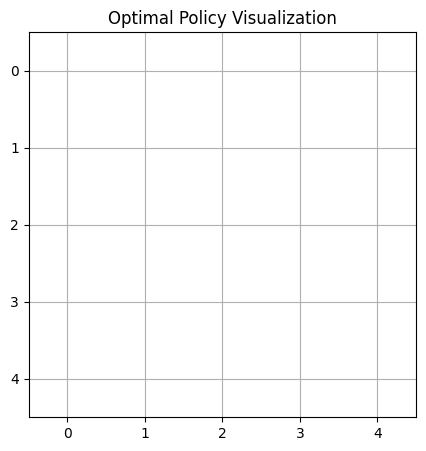



Episode 205:
Taxi starting position: 1
First customer request: A


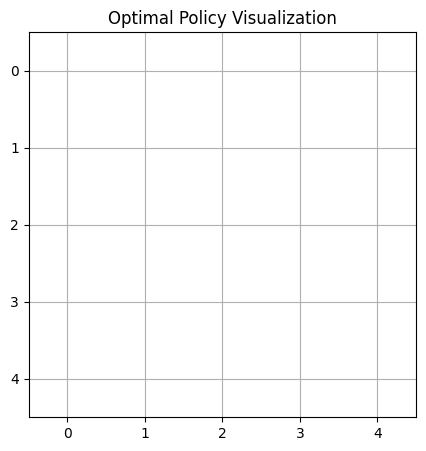



Episode 206:
Taxi starting position: 0
First customer request: D
Second customer request: D
Second customer is a premium customer.


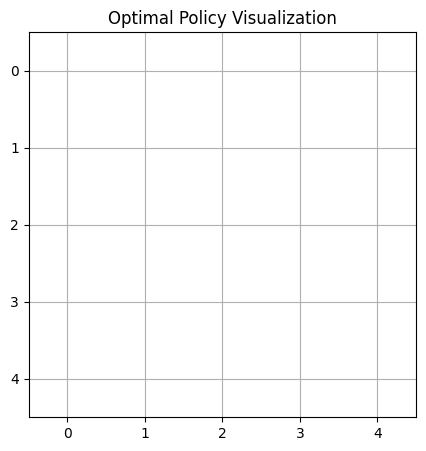



Episode 207:
Taxi starting position: 3
First customer request: C
Second customer request: A
Second customer is a premium customer.


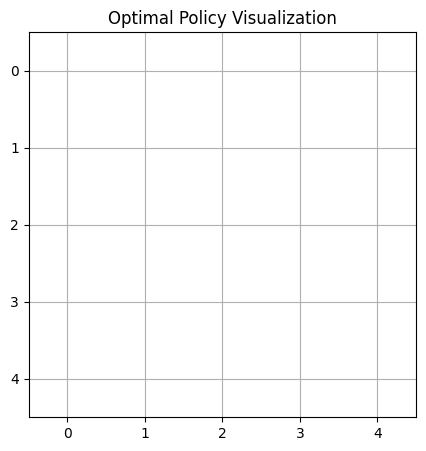



Episode 208:
Taxi starting position: 4
First customer request: C
Second customer request: D
Second customer is a premium customer.


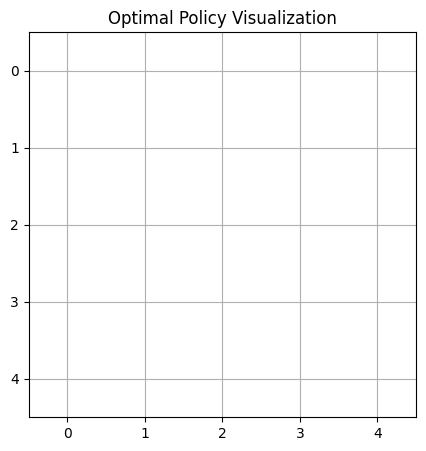



Episode 209:
Taxi starting position: 2
First customer request: D
Second customer request: B


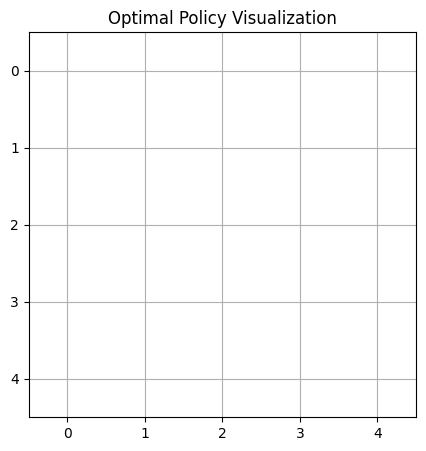



Episode 210:
Taxi starting position: 4
First customer request: C


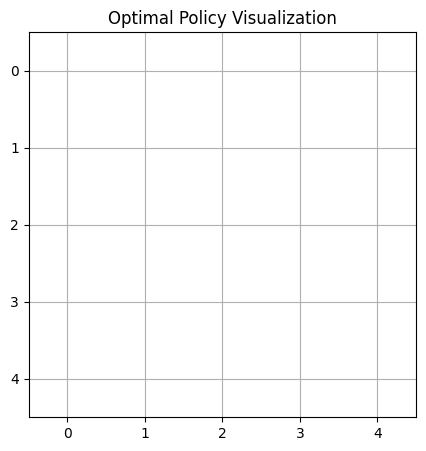



Episode 211:
Taxi starting position: 0
First customer request: C


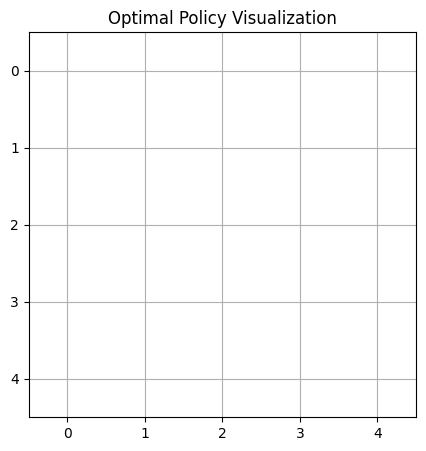



Episode 212:
Taxi starting position: 3
First customer request: A
Second customer request: B
Second customer is a premium customer.


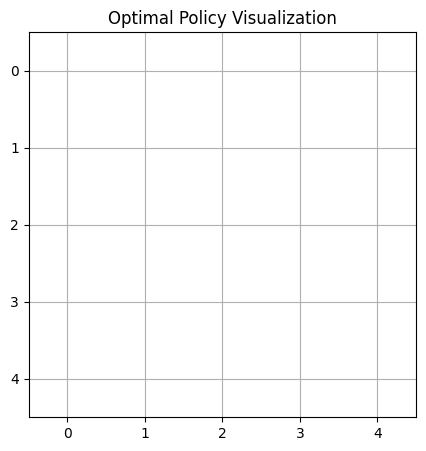



Episode 213:
Taxi starting position: 0
First customer request: B


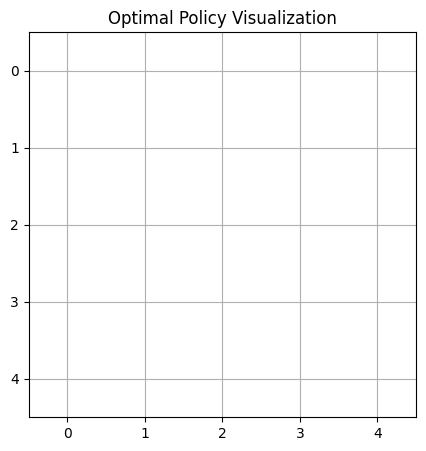



Episode 214:
Taxi starting position: 3
First customer request: A
Second customer request: B


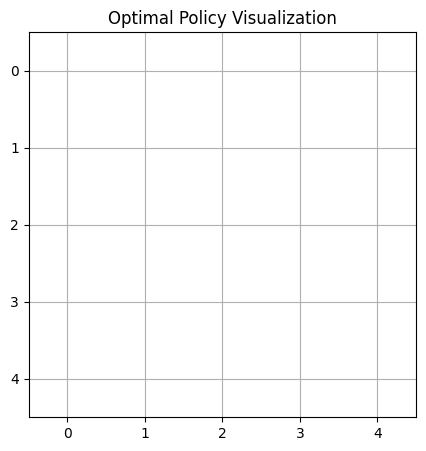



Episode 215:
Taxi starting position: 1
First customer request: A


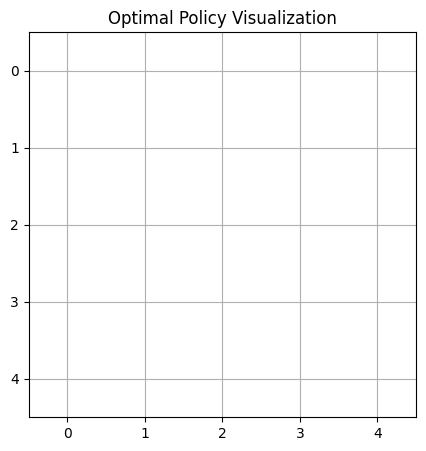



Episode 216:
Taxi starting position: 2
First customer request: A
Second customer request: A


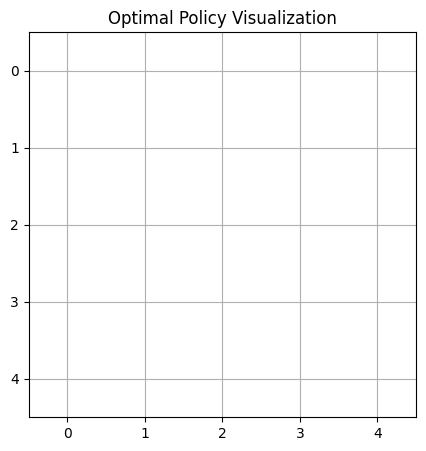



Episode 217:
Taxi starting position: 0
First customer request: B
Second customer request: C


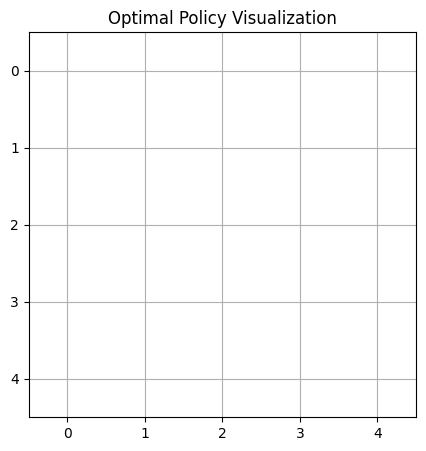



Episode 218:
Taxi starting position: 4
First customer request: B
Second customer request: A


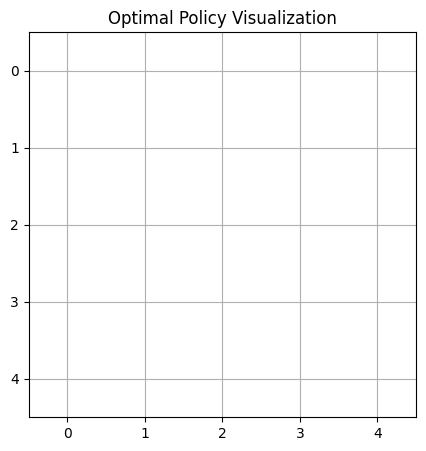



Episode 219:
Taxi starting position: 3
First customer request: D
Second customer request: A


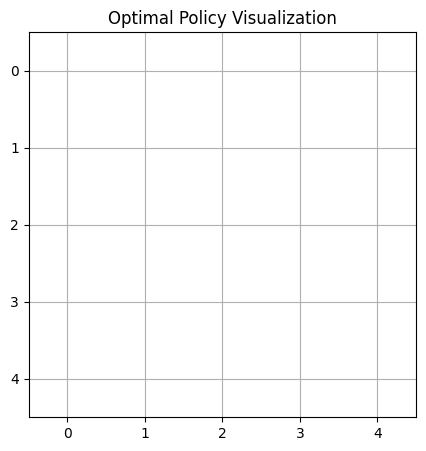



Episode 220:
Taxi starting position: 3
First customer request: B


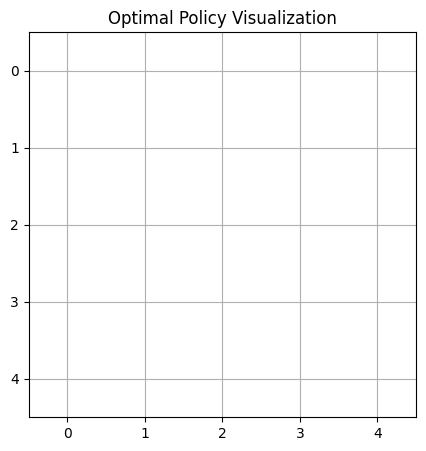



Episode 221:
Taxi starting position: 0
First customer request: B


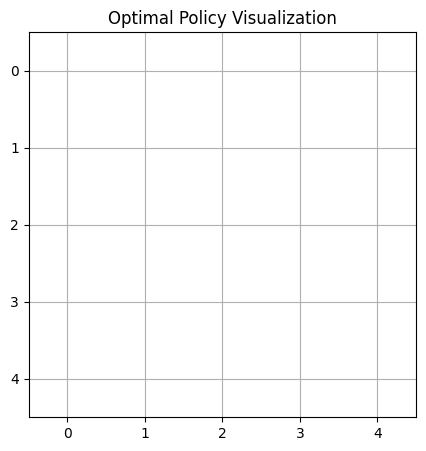



Episode 222:
Taxi starting position: 1
First customer request: B


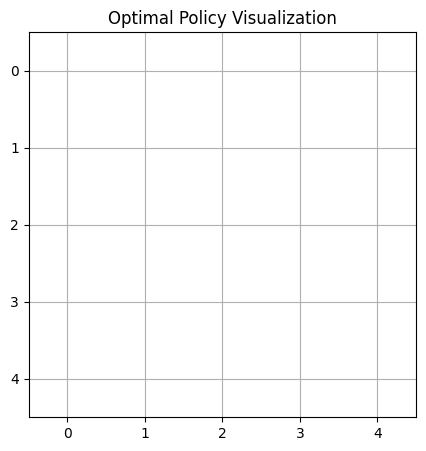



Episode 223:
Taxi starting position: 3
First customer request: A
Second customer request: C


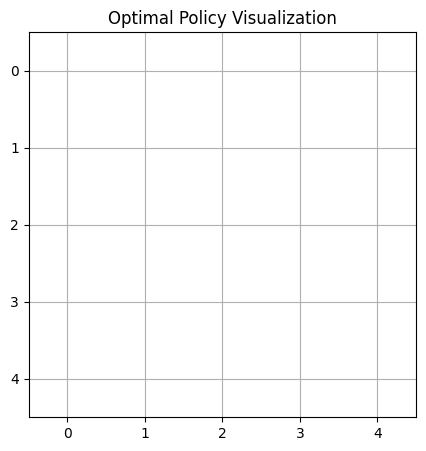



Episode 224:
Taxi starting position: 0
First customer request: D


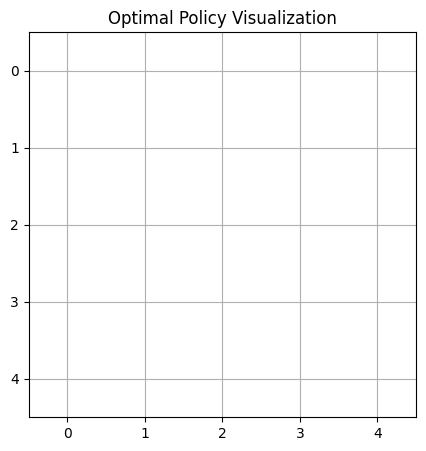



Episode 225:
Taxi starting position: 1
First customer request: C
Second customer request: D


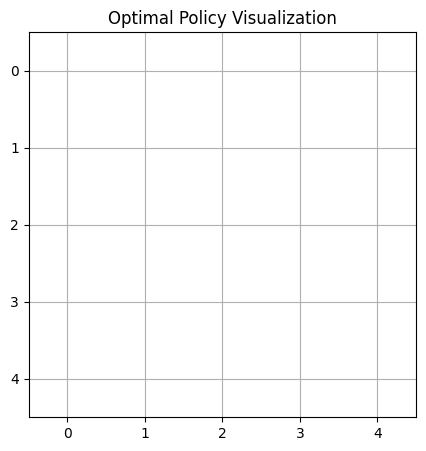



Episode 226:
Taxi starting position: 1
First customer request: A
Second customer request: D


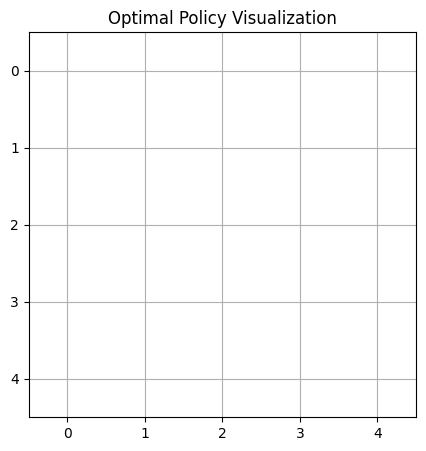



Episode 227:
Taxi starting position: 0
First customer request: A
Second customer request: D
Second customer is a premium customer.


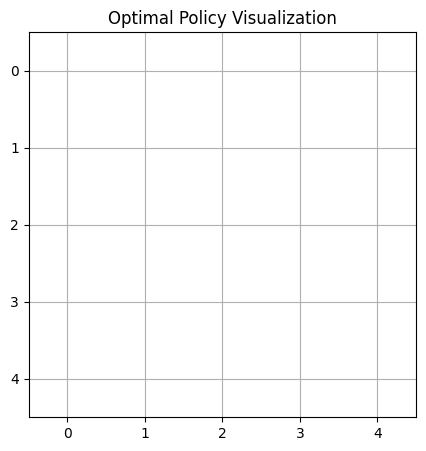



Episode 228:
Taxi starting position: 4
First customer request: B


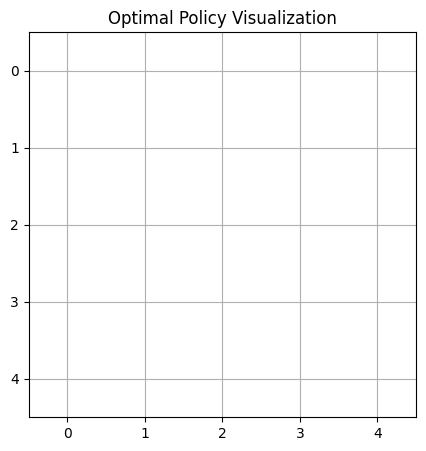



Episode 229:
Taxi starting position: 3
First customer request: B
Second customer request: A


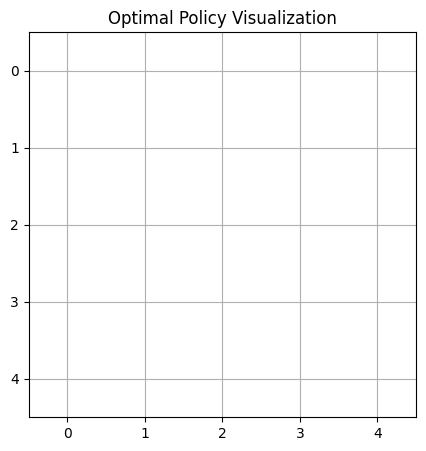



Episode 230:
Taxi starting position: 4
First customer request: D


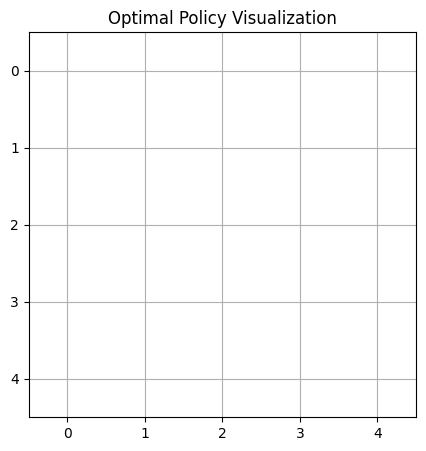



Episode 231:
Taxi starting position: 1
First customer request: D


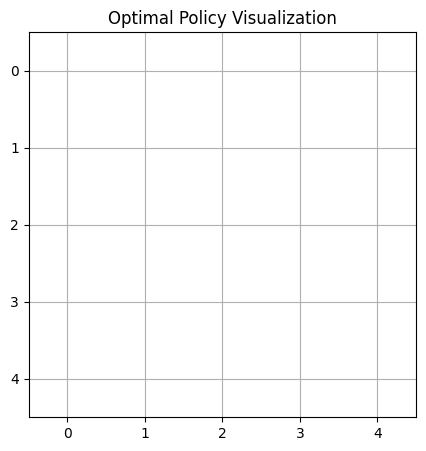



Episode 232:
Taxi starting position: 3
First customer request: B
Second customer request: C


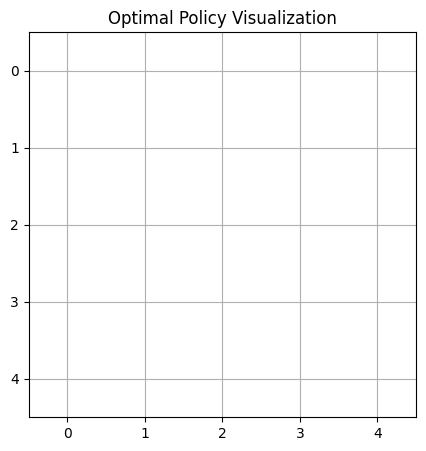



Episode 233:
Taxi starting position: 0
First customer request: A
Second customer request: A


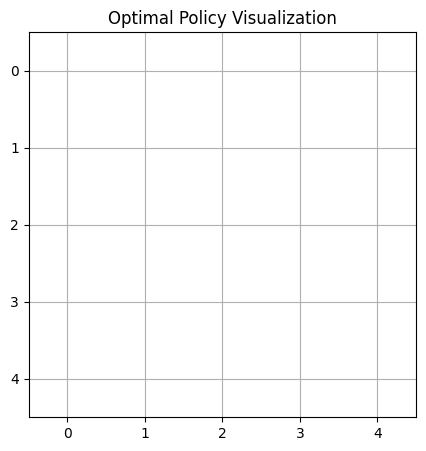



Episode 234:
Taxi starting position: 3
First customer request: C


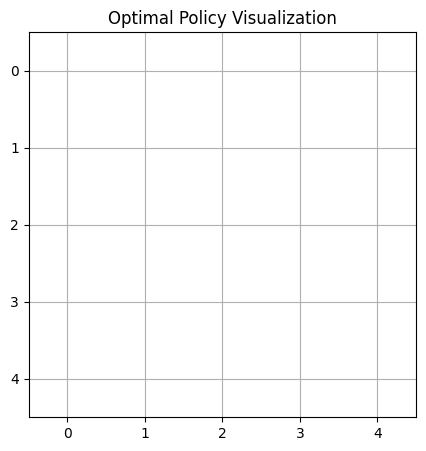



Episode 235:
Taxi starting position: 2
First customer request: D
Second customer request: A


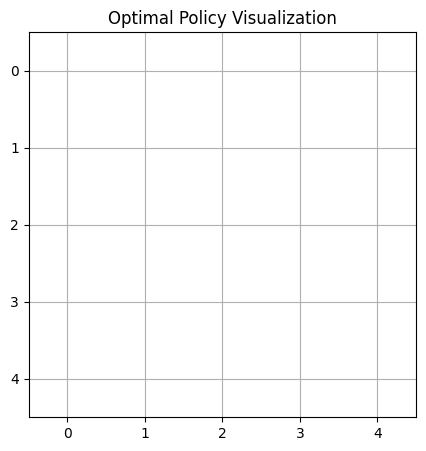



Episode 236:
Taxi starting position: 0
First customer request: A


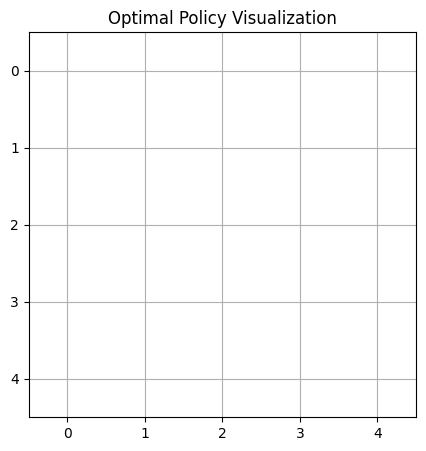



Episode 237:
Taxi starting position: 1
First customer request: B
Second customer request: C


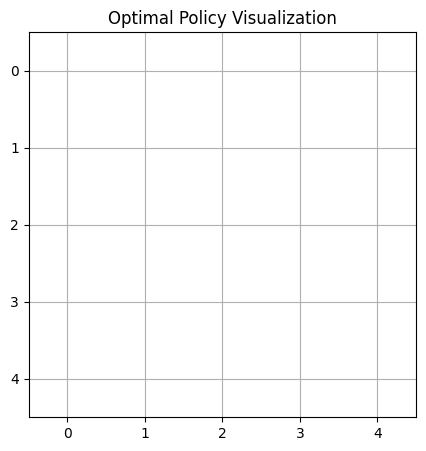



Episode 238:
Taxi starting position: 2
First customer request: C


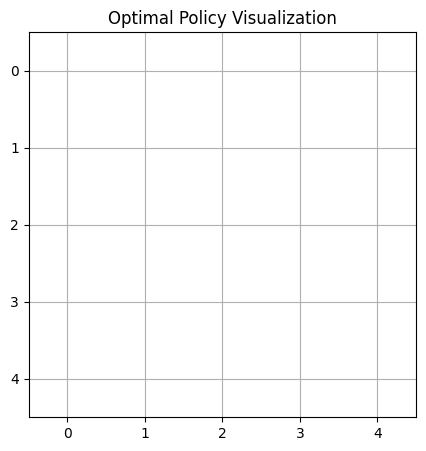



Episode 239:
Taxi starting position: 2
First customer request: C


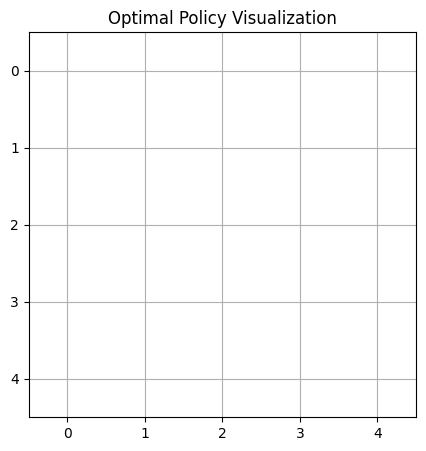



Episode 240:
Taxi starting position: 4
First customer request: D


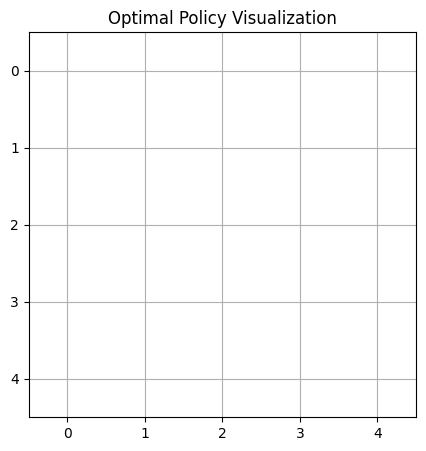



Episode 241:
Taxi starting position: 4
First customer request: C
Second customer request: A


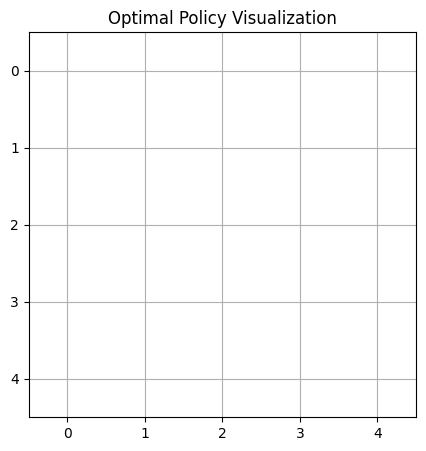



Episode 242:
Taxi starting position: 4
First customer request: A


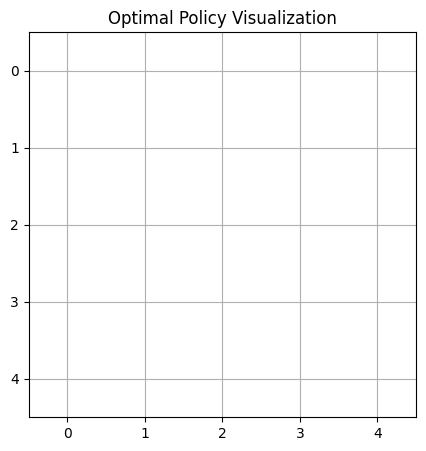



Episode 243:
Taxi starting position: 1
First customer request: C
Second customer request: D


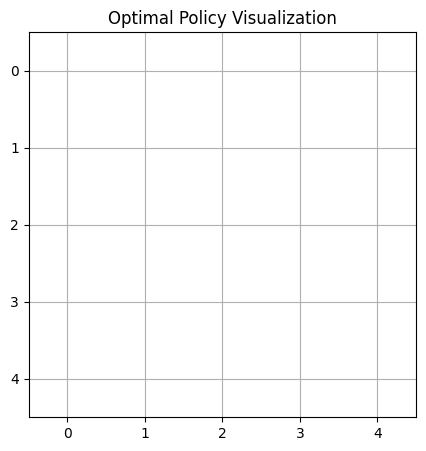



Episode 244:
Taxi starting position: 1
First customer request: C


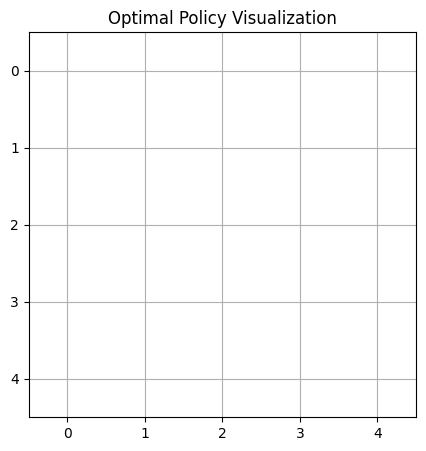



Episode 245:
Taxi starting position: 3
First customer request: C
Second customer request: A


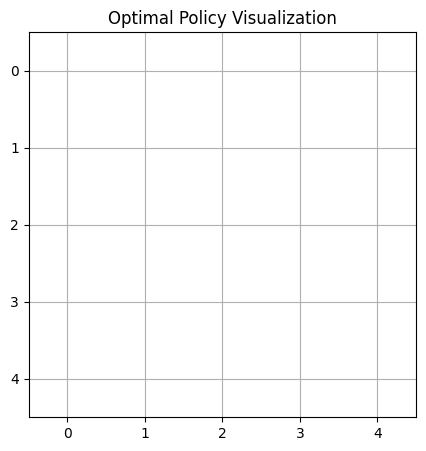



Episode 246:
Taxi starting position: 4
First customer request: B


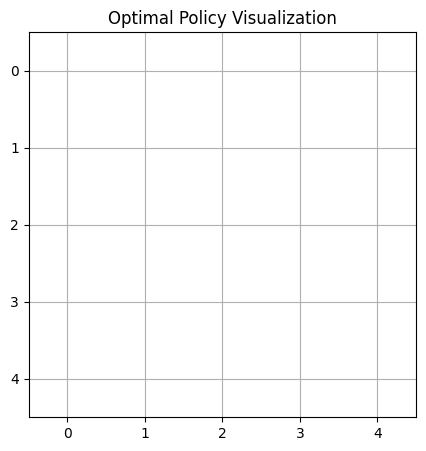



Episode 247:
Taxi starting position: 4
First customer request: B
Second customer request: B


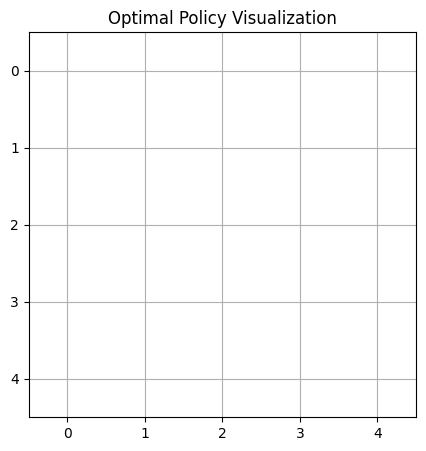



Episode 248:
Taxi starting position: 1
First customer request: A
Second customer request: B


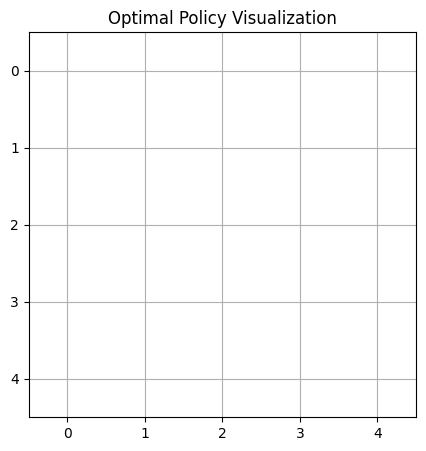



Episode 249:
Taxi starting position: 4
First customer request: C


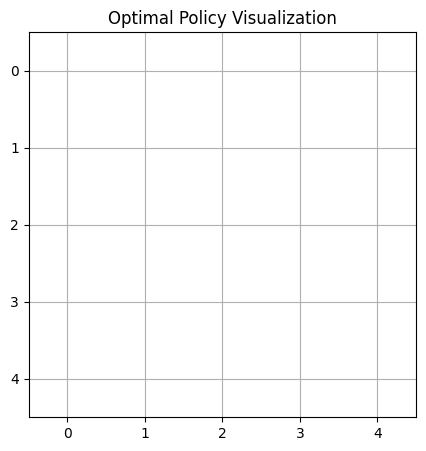



Episode 250:
Taxi starting position: 2
First customer request: D


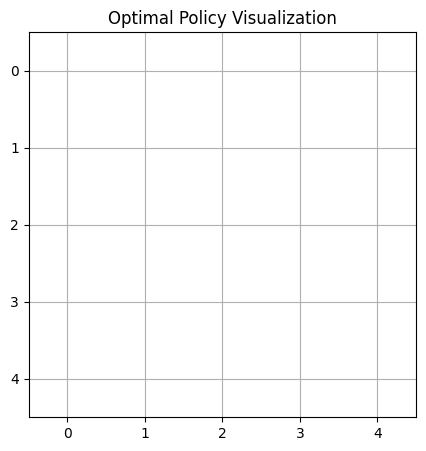



Episode 251:
Taxi starting position: 1
First customer request: D
Second customer request: A
Second customer is a premium customer.


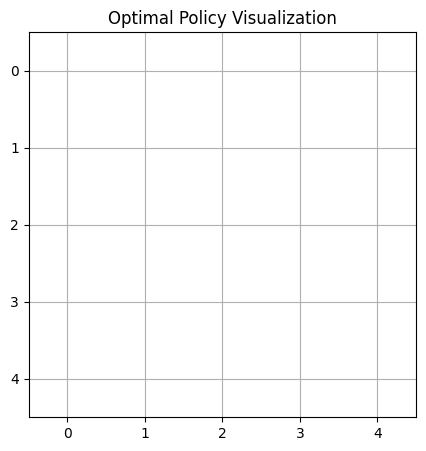



Episode 252:
Taxi starting position: 0
First customer request: D


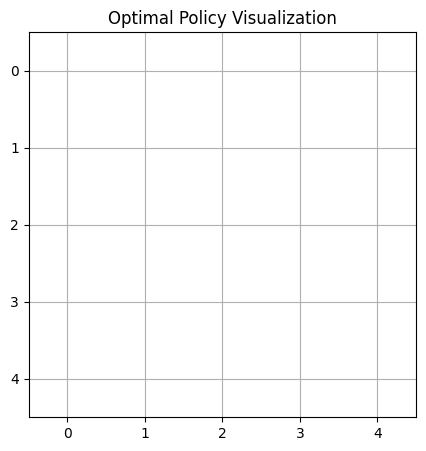



Episode 253:
Taxi starting position: 4
First customer request: C


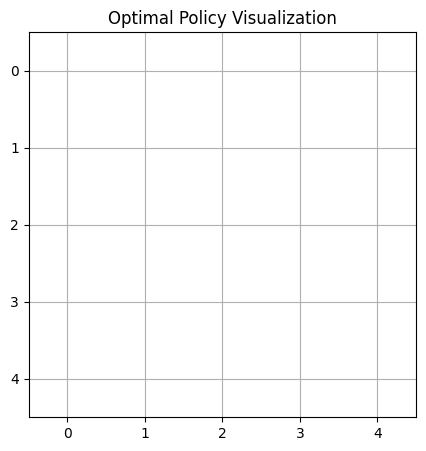



Episode 254:
Taxi starting position: 3
First customer request: C


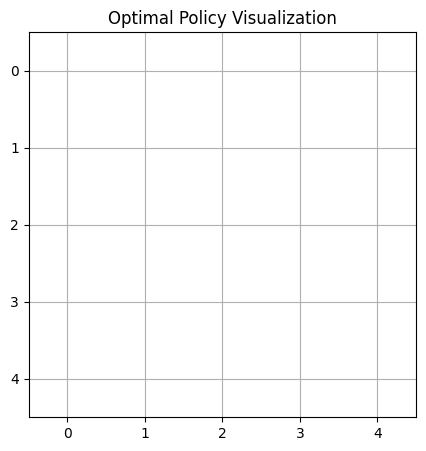



Episode 255:
Taxi starting position: 4
First customer request: D
Second customer request: A
Second customer is a premium customer.


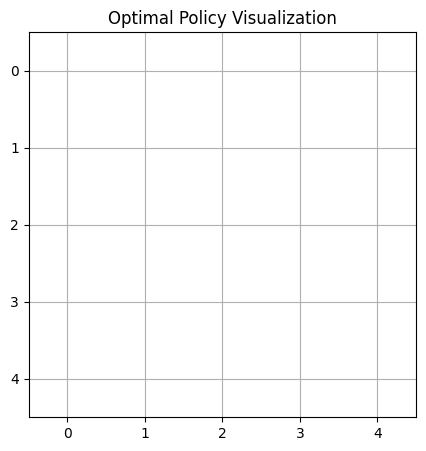



Episode 256:
Taxi starting position: 4
First customer request: C
Second customer request: C


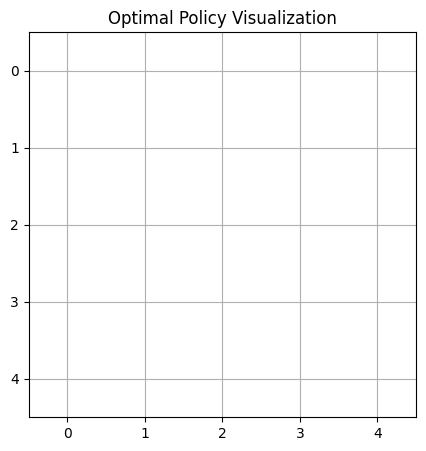



Episode 257:
Taxi starting position: 0
First customer request: B
Second customer request: A


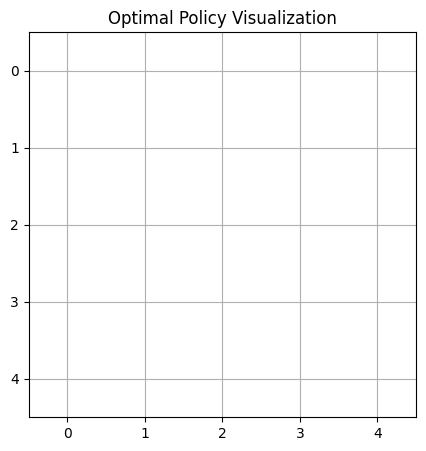



Episode 258:
Taxi starting position: 3
First customer request: D
Second customer request: A


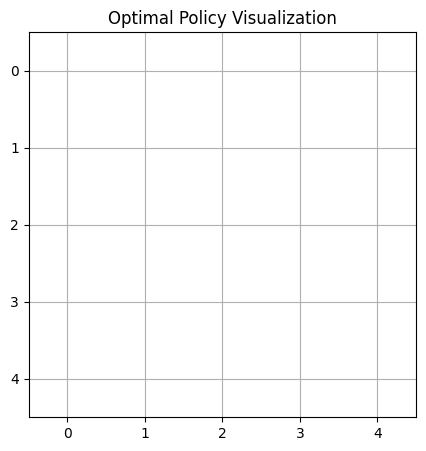



Episode 259:
Taxi starting position: 2
First customer request: D
Second customer request: B
Second customer is a premium customer.


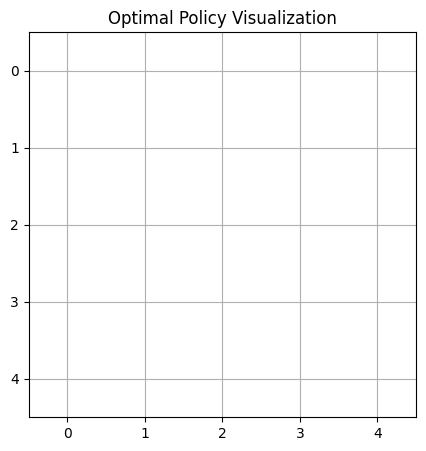



Episode 260:
Taxi starting position: 3
First customer request: B


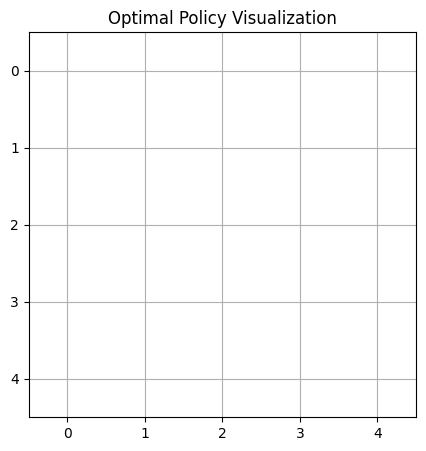



Episode 261:
Taxi starting position: 2
First customer request: A
Second customer request: A


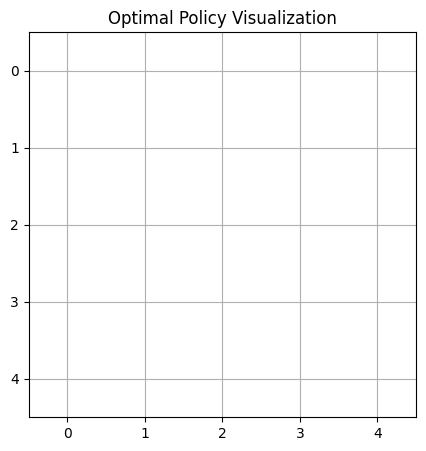



Episode 262:
Taxi starting position: 1
First customer request: C
Second customer request: A


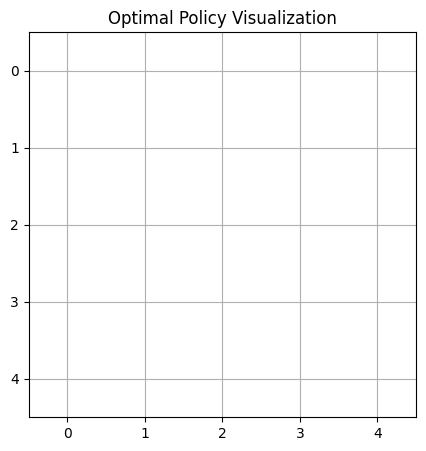



Episode 263:
Taxi starting position: 2
First customer request: B
Second customer request: C


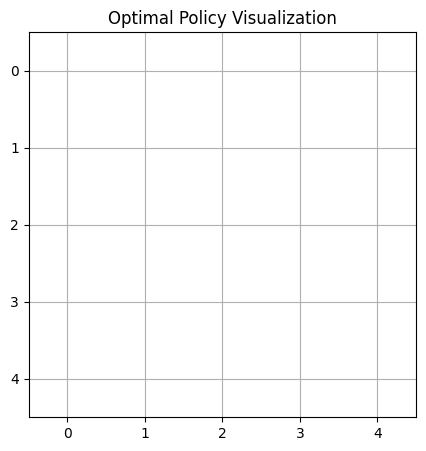



Episode 264:
Taxi starting position: 4
First customer request: B
Second customer request: C


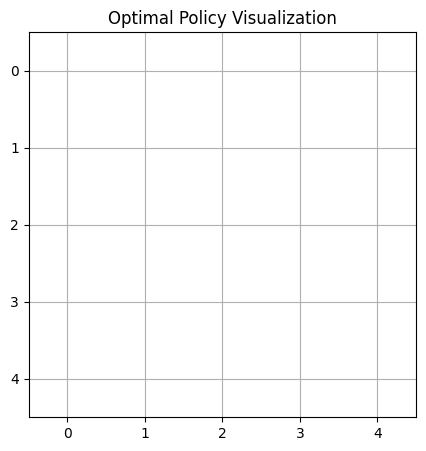



Episode 265:
Taxi starting position: 4
First customer request: C
Second customer request: B


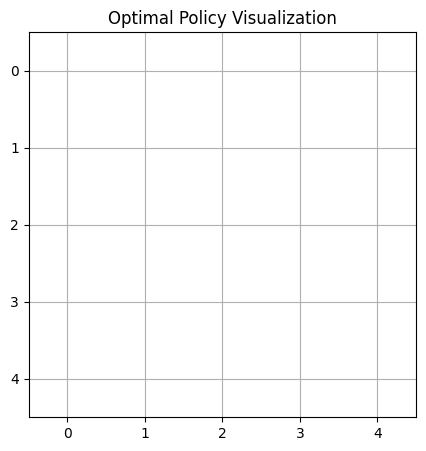



Episode 266:
Taxi starting position: 4
First customer request: B


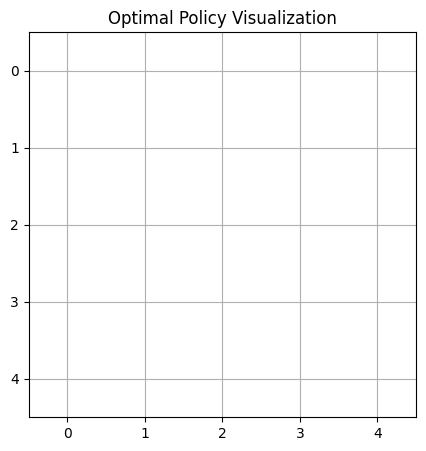



Episode 267:
Taxi starting position: 3
First customer request: B


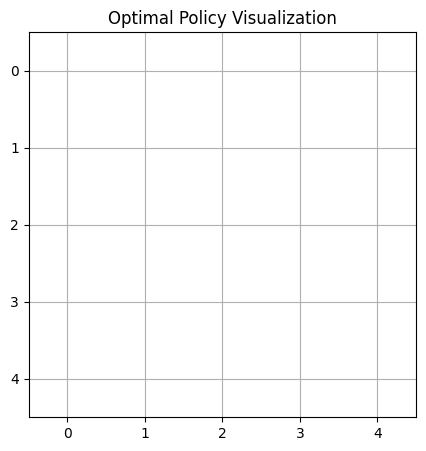



Episode 268:
Taxi starting position: 0
First customer request: A
Second customer request: B


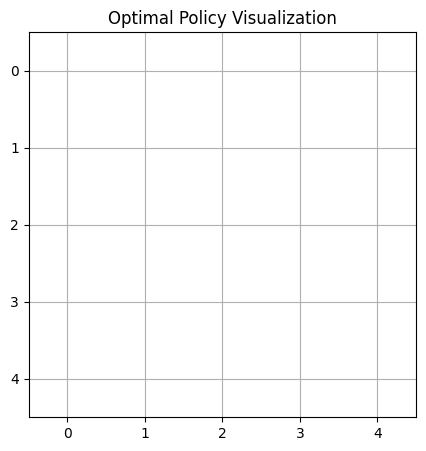



Episode 269:
Taxi starting position: 4
First customer request: D


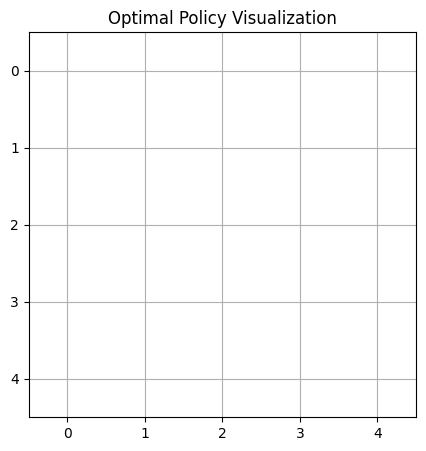



Episode 270:
Taxi starting position: 3
First customer request: C
Second customer request: D


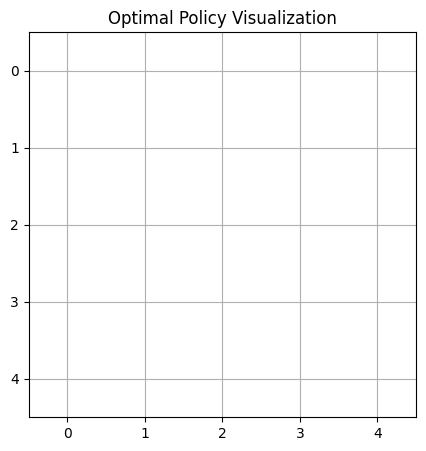



Episode 271:
Taxi starting position: 2
First customer request: B
Second customer request: C


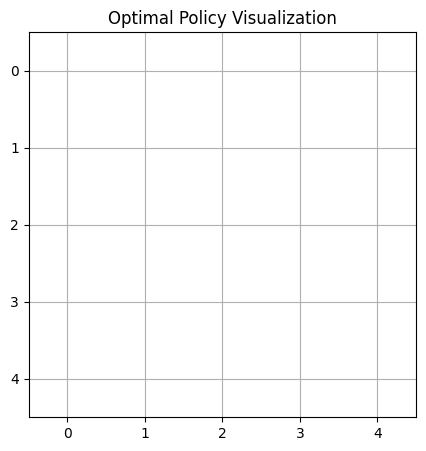



Episode 272:
Taxi starting position: 1
First customer request: D
Second customer request: A


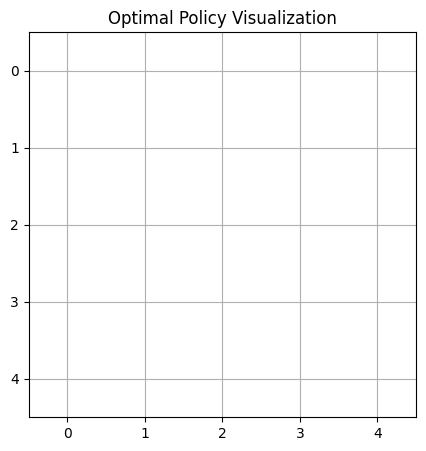



Episode 273:
Taxi starting position: 2
First customer request: D


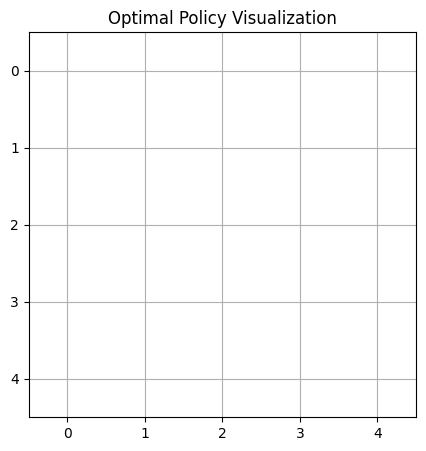



Episode 274:
Taxi starting position: 3
First customer request: B
Second customer request: D
Second customer is a premium customer.


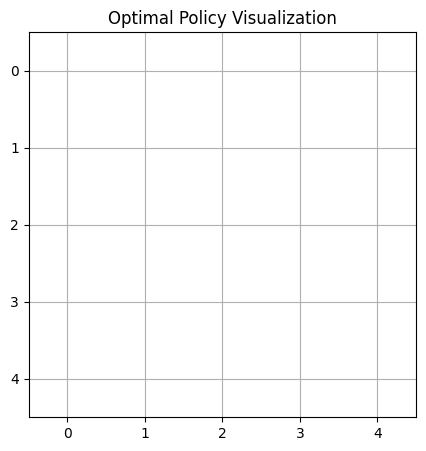



Episode 275:
Taxi starting position: 2
First customer request: C
Second customer request: B


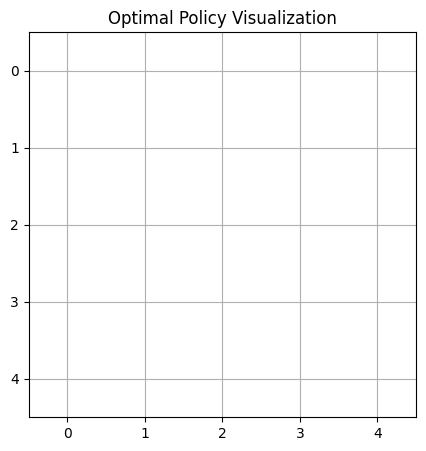



Episode 276:
Taxi starting position: 3
First customer request: D
Second customer request: A


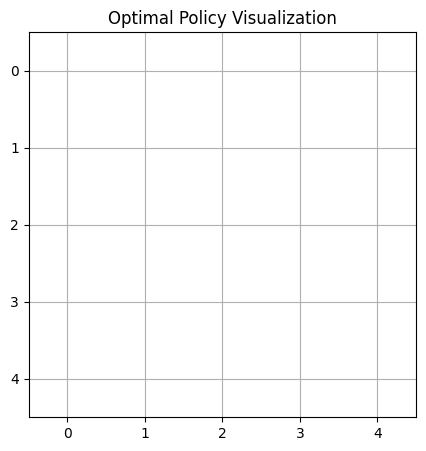



Episode 277:
Taxi starting position: 0
First customer request: A
Second customer request: B
Second customer is a premium customer.


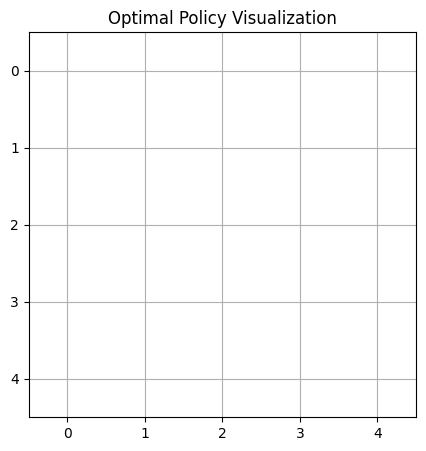



Episode 278:
Taxi starting position: 1
First customer request: B
Second customer request: C
Second customer is a premium customer.


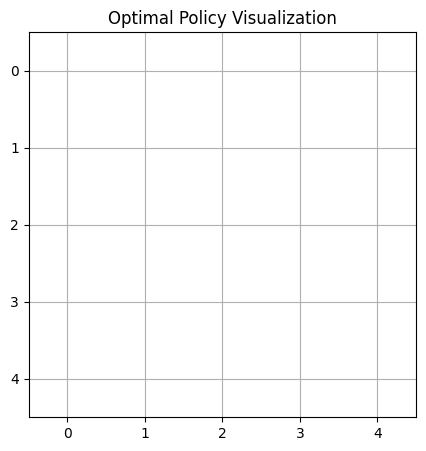



Episode 279:
Taxi starting position: 0
First customer request: C
Second customer request: B


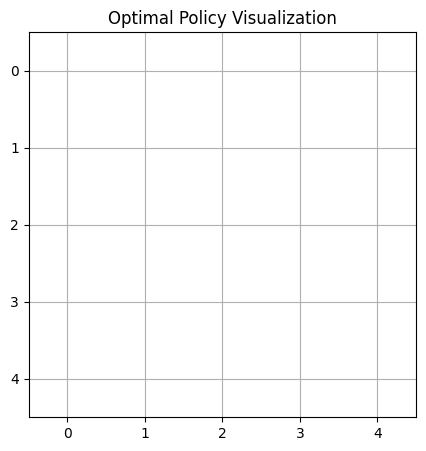



Episode 280:
Taxi starting position: 1
First customer request: D
Second customer request: C
Second customer is a premium customer.


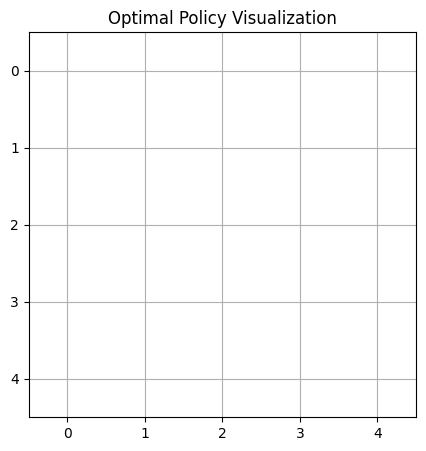



Episode 281:
Taxi starting position: 3
First customer request: B


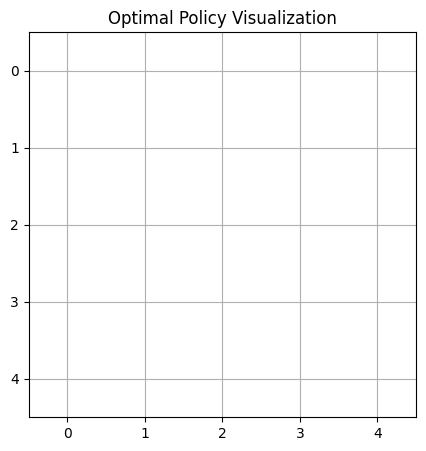



Episode 282:
Taxi starting position: 3
First customer request: C


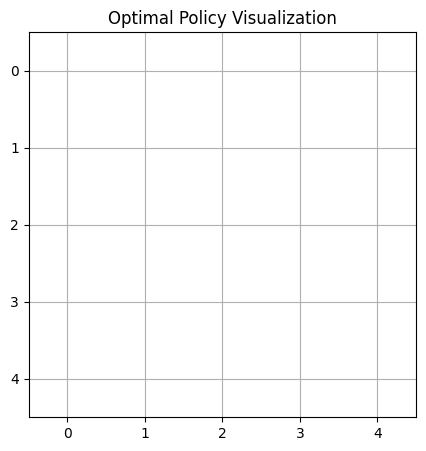



Episode 283:
Taxi starting position: 4
First customer request: B


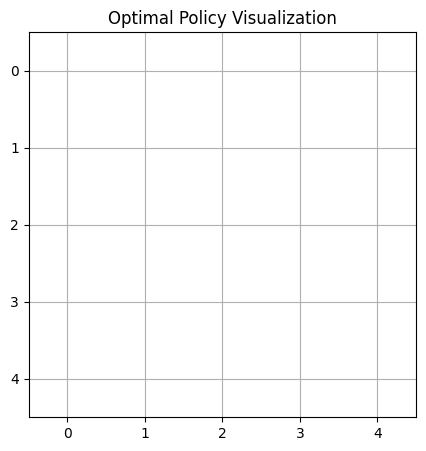



Episode 284:
Taxi starting position: 0
First customer request: A
Second customer request: A


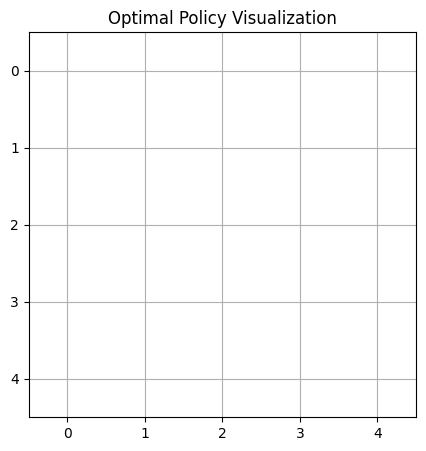



Episode 285:
Taxi starting position: 4
First customer request: C
Second customer request: C


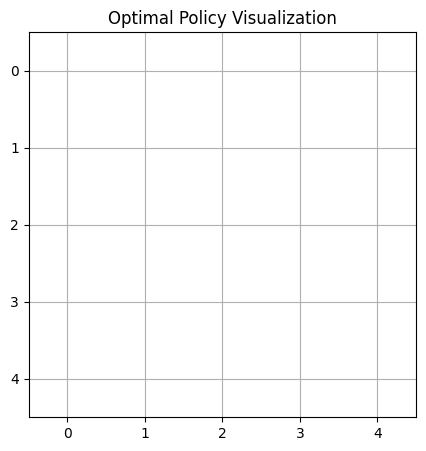



Episode 286:
Taxi starting position: 4
First customer request: A


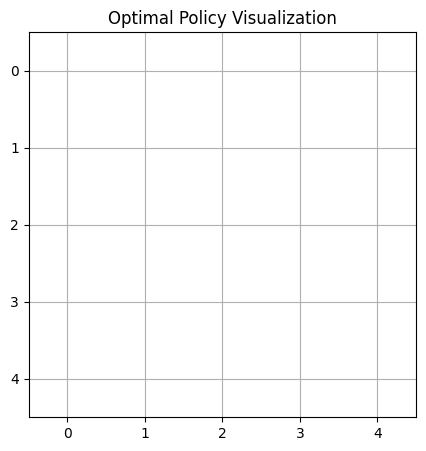



Episode 287:
Taxi starting position: 3
First customer request: A


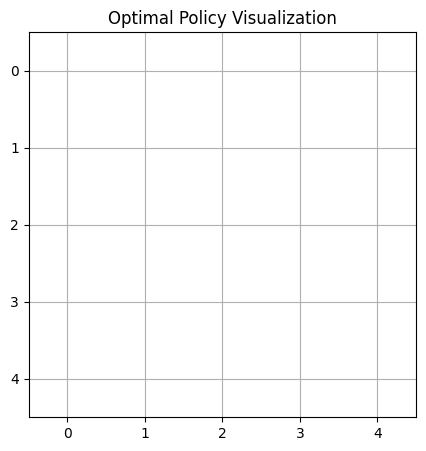



Episode 288:
Taxi starting position: 0
First customer request: A
Second customer request: A
Second customer is a premium customer.


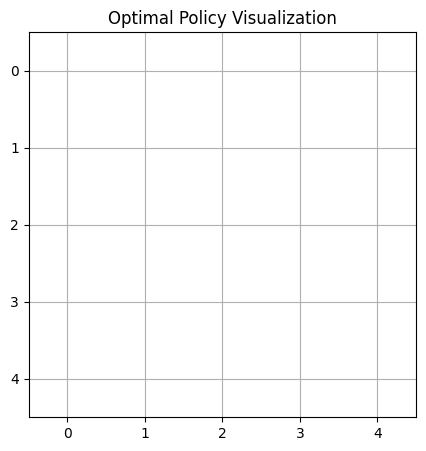



Episode 289:
Taxi starting position: 3
First customer request: A
Second customer request: D
Second customer is a premium customer.


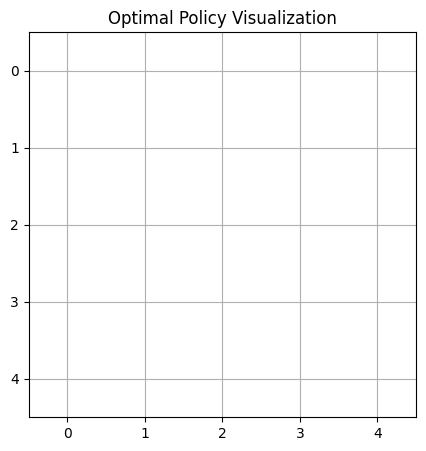



Episode 290:
Taxi starting position: 1
First customer request: A


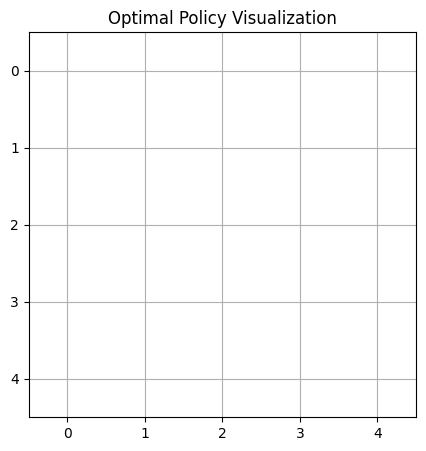



Episode 291:
Taxi starting position: 2
First customer request: C
Second customer request: D


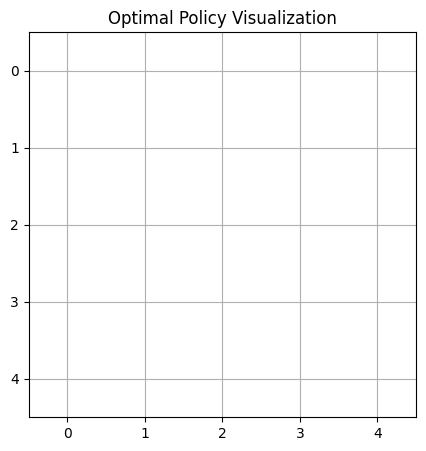



Episode 292:
Taxi starting position: 2
First customer request: B


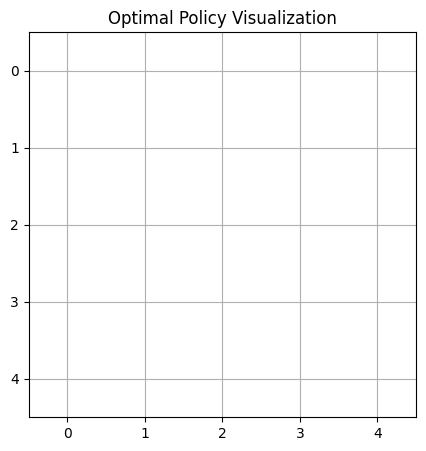



Episode 293:
Taxi starting position: 0
First customer request: B


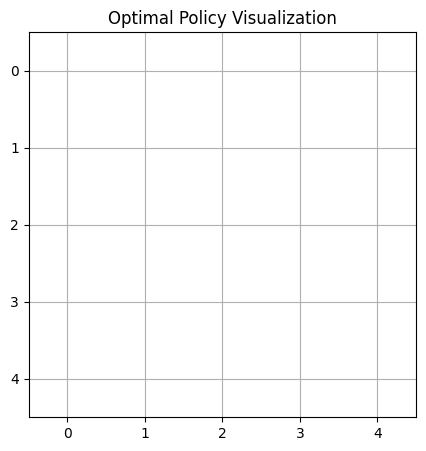



Episode 294:
Taxi starting position: 3
First customer request: B


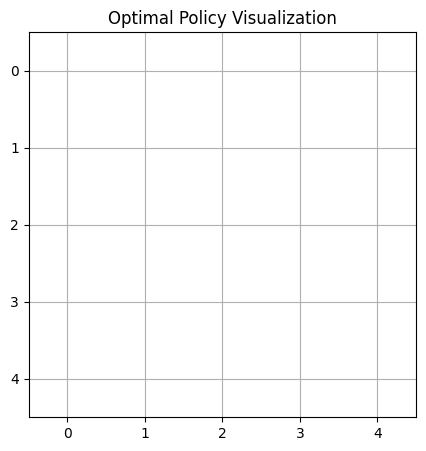



Episode 295:
Taxi starting position: 3
First customer request: B
Second customer request: D
Second customer is a premium customer.


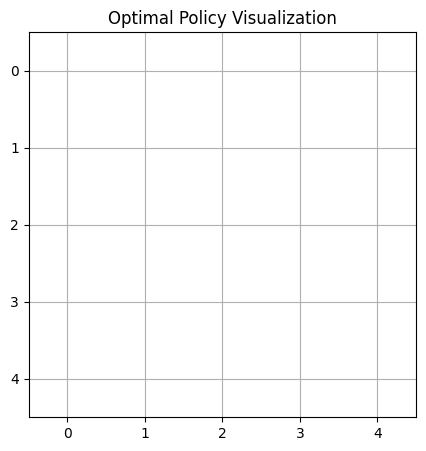



Episode 296:
Taxi starting position: 4
First customer request: C
Second customer request: A


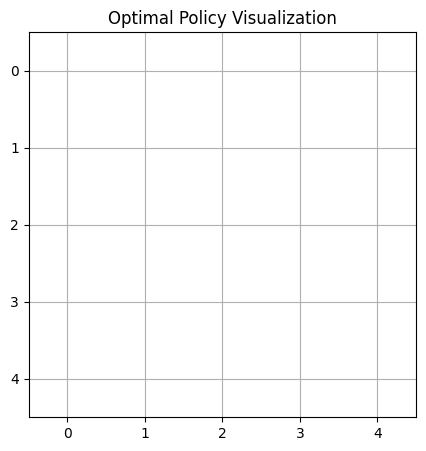



Episode 297:
Taxi starting position: 0
First customer request: A


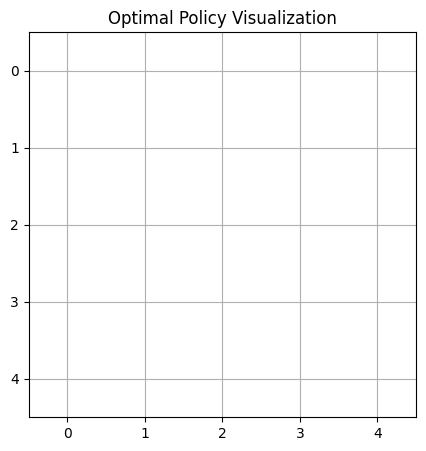



Episode 298:
Taxi starting position: 1
First customer request: D


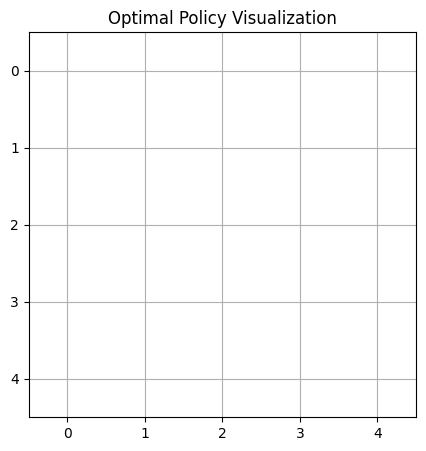



Episode 299:
Taxi starting position: 0
First customer request: C


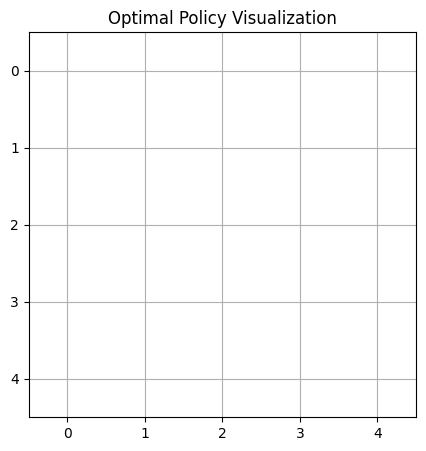



Episode 300:
Taxi starting position: 2
First customer request: B


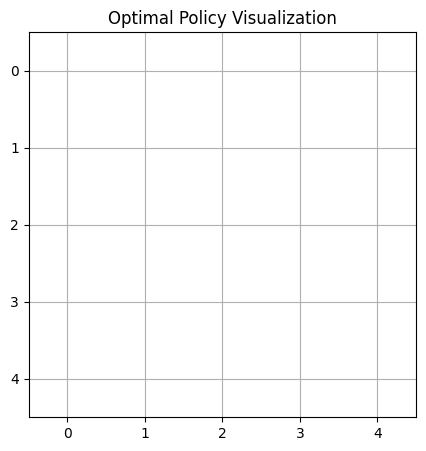



Episode 301:
Taxi starting position: 2
First customer request: B


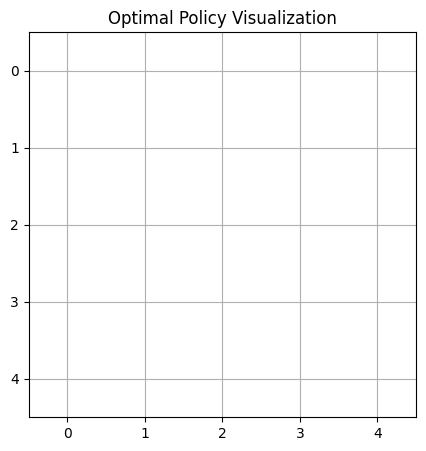



Episode 302:
Taxi starting position: 0
First customer request: C


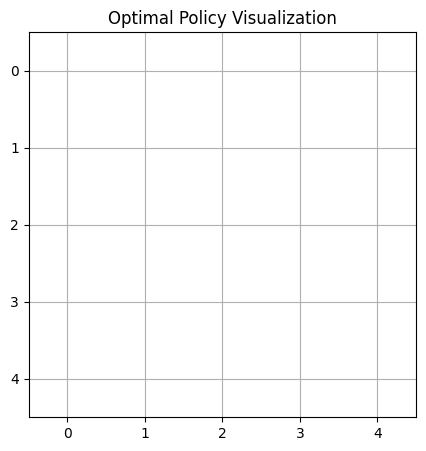



Episode 303:
Taxi starting position: 4
First customer request: C


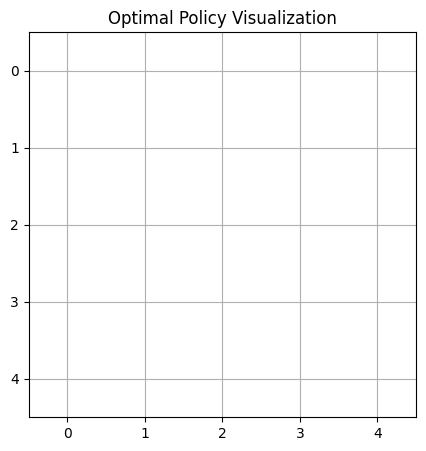



Episode 304:
Taxi starting position: 3
First customer request: A
Second customer request: C


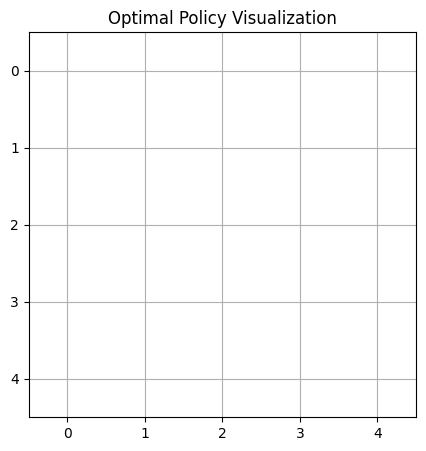



Episode 305:
Taxi starting position: 4
First customer request: D
Second customer request: D


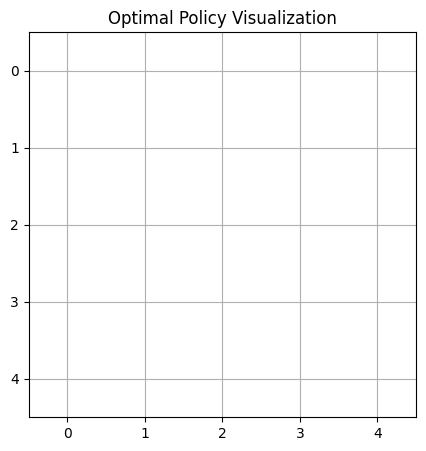



Episode 306:
Taxi starting position: 0
First customer request: C
Second customer request: B
Second customer is a premium customer.


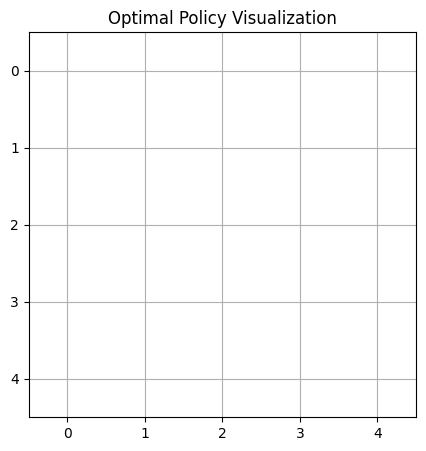



Episode 307:
Taxi starting position: 4
First customer request: A


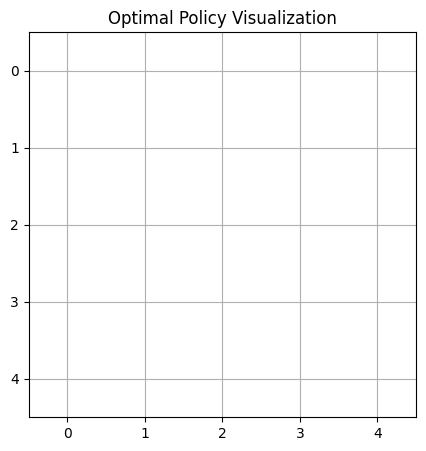



Episode 308:
Taxi starting position: 1
First customer request: A


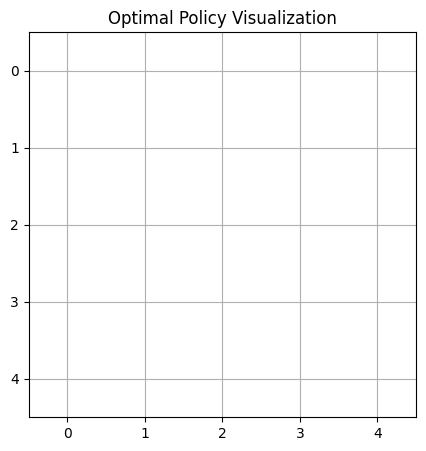



Episode 309:
Taxi starting position: 0
First customer request: A


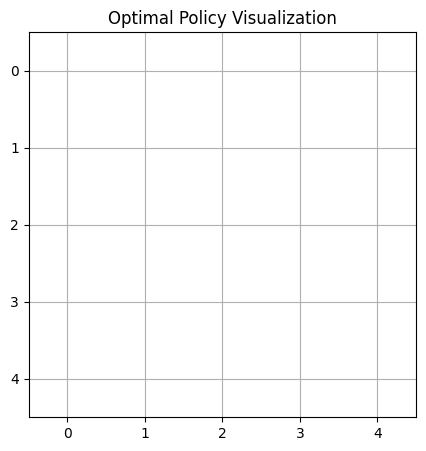



Episode 310:
Taxi starting position: 0
First customer request: C
Second customer request: D
Second customer is a premium customer.


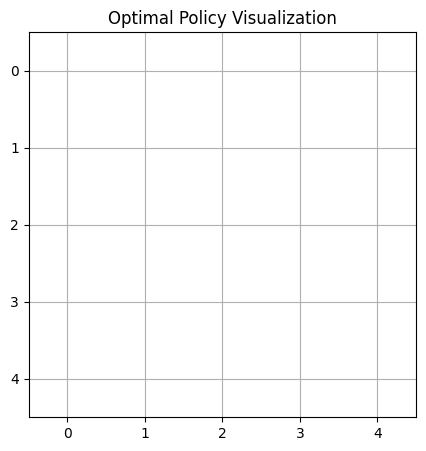



Episode 311:
Taxi starting position: 0
First customer request: C
Second customer request: D
Second customer is a premium customer.


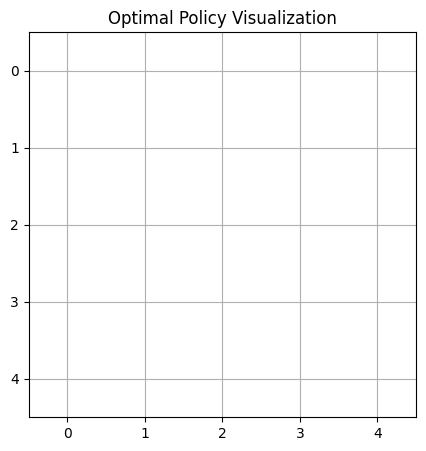



Episode 312:
Taxi starting position: 4
First customer request: A
Second customer request: A


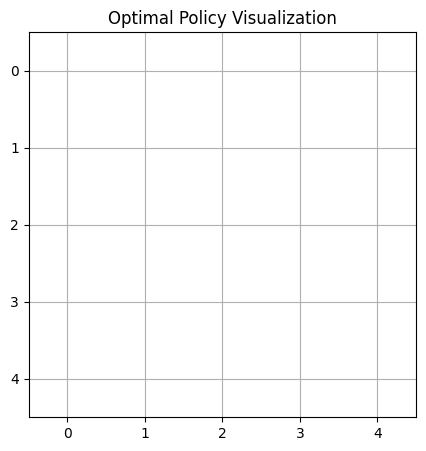



Episode 313:
Taxi starting position: 2
First customer request: D
Second customer request: A


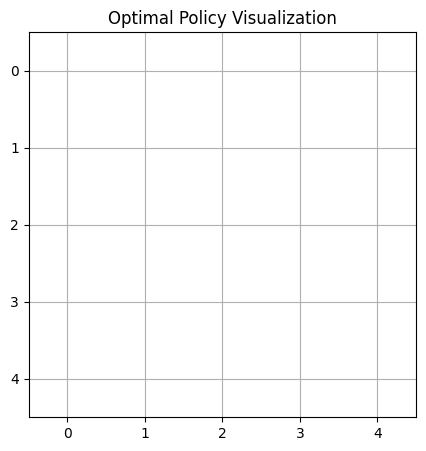



Episode 314:
Taxi starting position: 4
First customer request: C
Second customer request: D
Second customer is a premium customer.


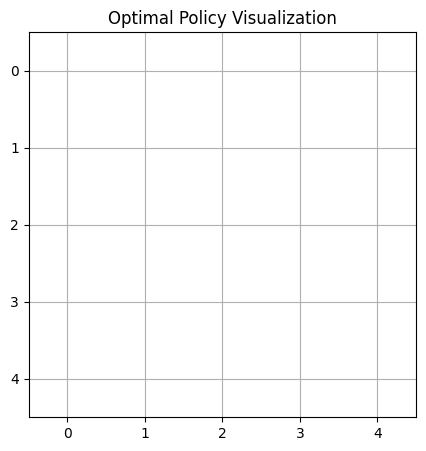



Episode 315:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


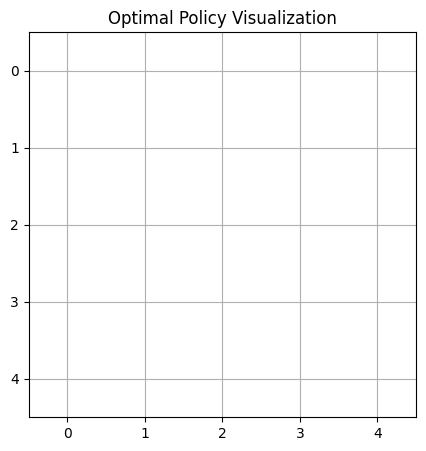



Episode 316:
Taxi starting position: 1
First customer request: C


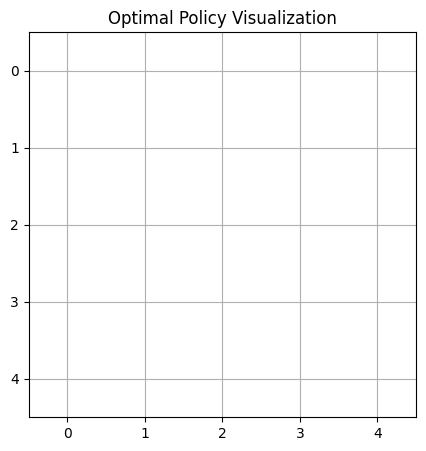



Episode 317:
Taxi starting position: 3
First customer request: D


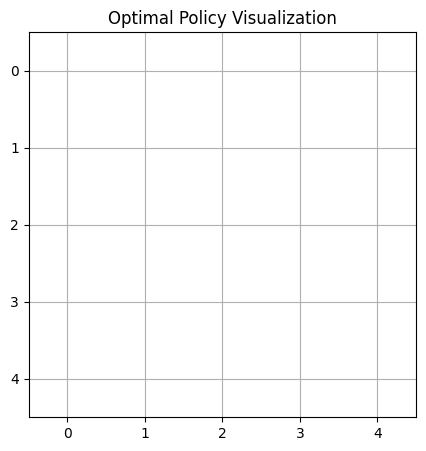



Episode 318:
Taxi starting position: 2
First customer request: B
Second customer request: B


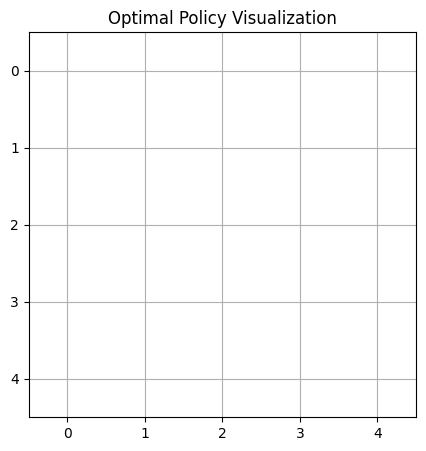



Episode 319:
Taxi starting position: 0
First customer request: B
Second customer request: B


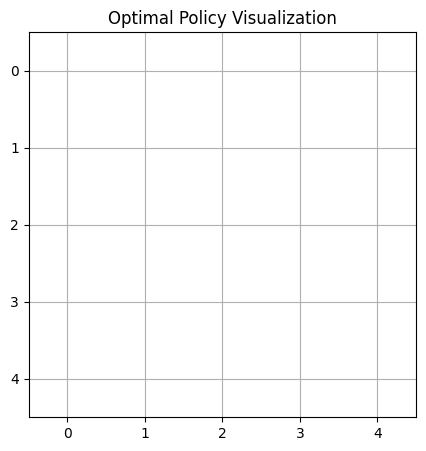



Episode 320:
Taxi starting position: 1
First customer request: C


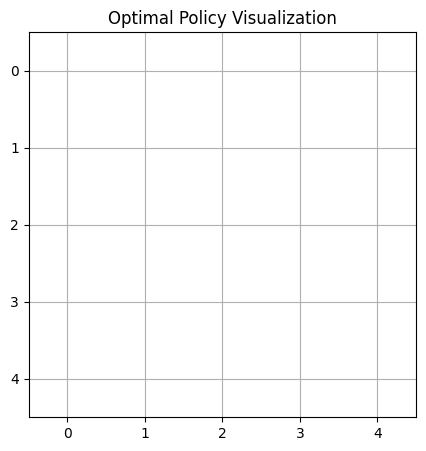



Episode 321:
Taxi starting position: 1
First customer request: C


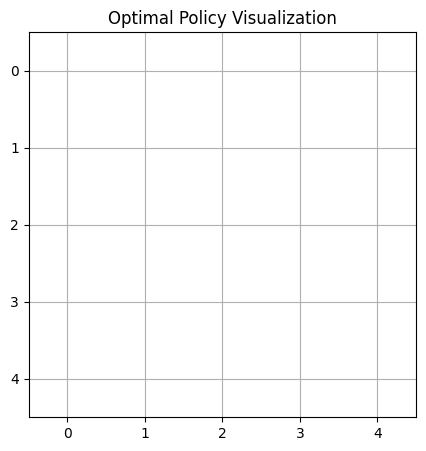



Episode 322:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


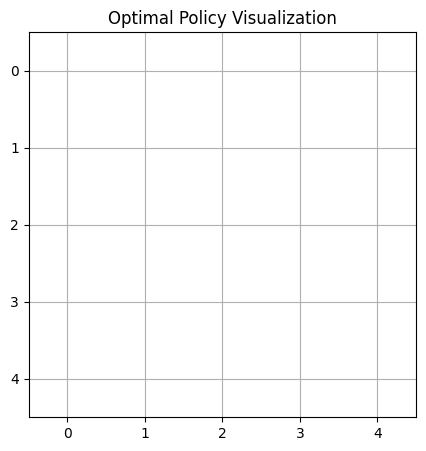



Episode 323:
Taxi starting position: 1
First customer request: A
Second customer request: B


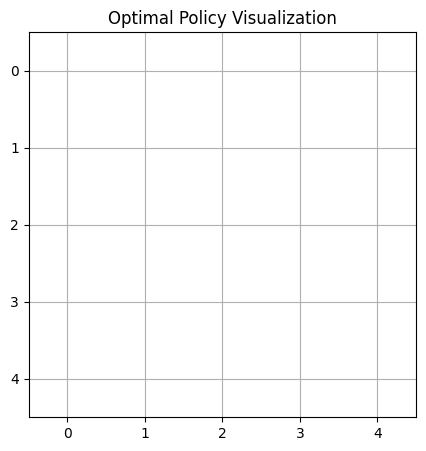



Episode 324:
Taxi starting position: 1
First customer request: B
Second customer request: D


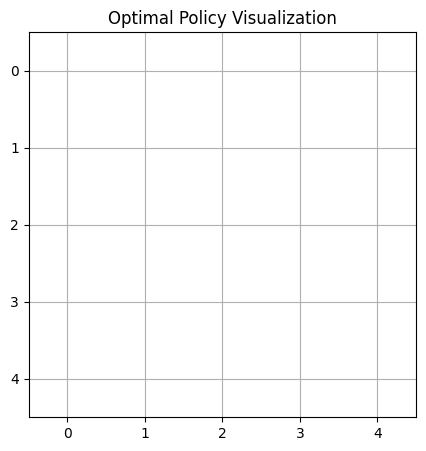



Episode 325:
Taxi starting position: 3
First customer request: C


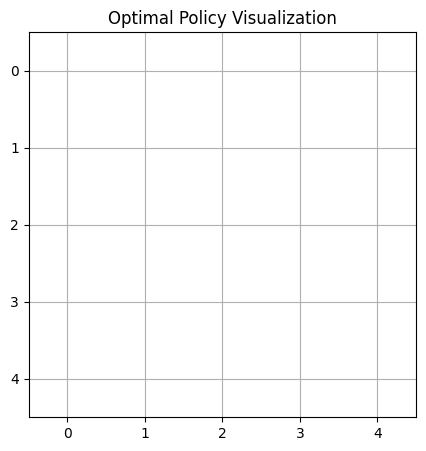



Episode 326:
Taxi starting position: 2
First customer request: B
Second customer request: C


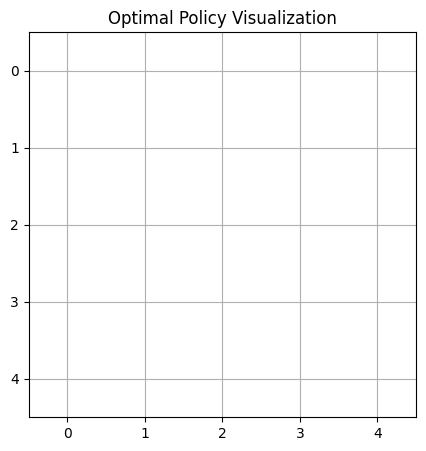



Episode 327:
Taxi starting position: 1
First customer request: A


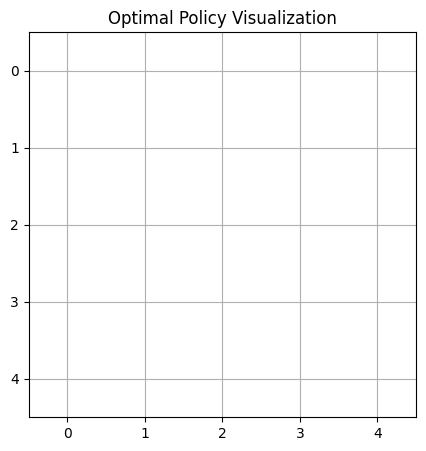



Episode 328:
Taxi starting position: 2
First customer request: D
Second customer request: D
Second customer is a premium customer.


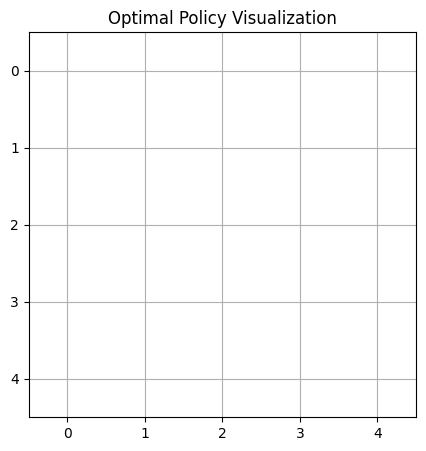



Episode 329:
Taxi starting position: 4
First customer request: C


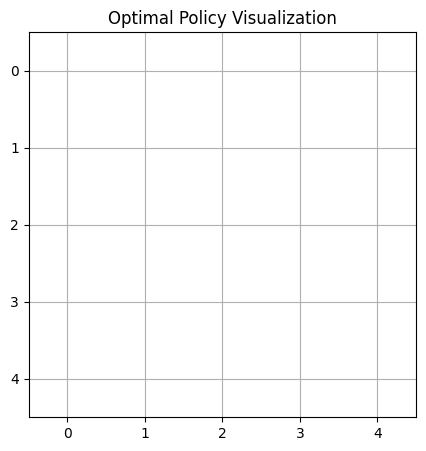



Episode 330:
Taxi starting position: 0
First customer request: A


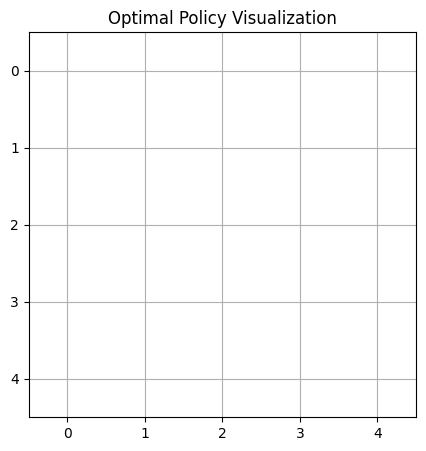



Episode 331:
Taxi starting position: 1
First customer request: D


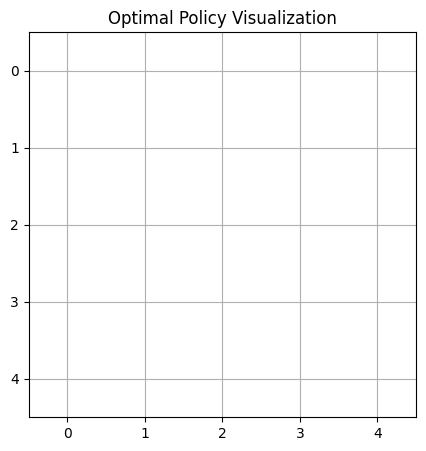



Episode 332:
Taxi starting position: 0
First customer request: C


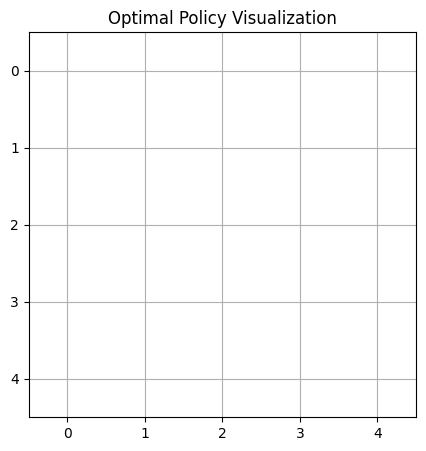



Episode 333:
Taxi starting position: 4
First customer request: C
Second customer request: D


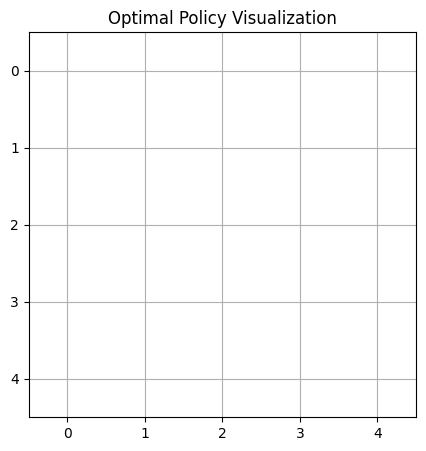



Episode 334:
Taxi starting position: 1
First customer request: A


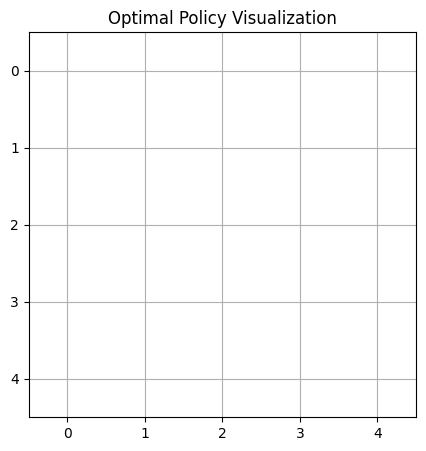



Episode 335:
Taxi starting position: 3
First customer request: C


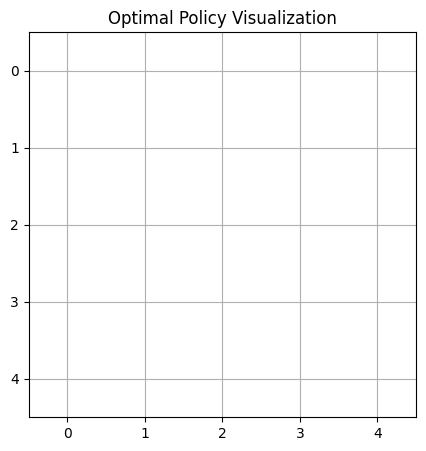



Episode 336:
Taxi starting position: 2
First customer request: C
Second customer request: D


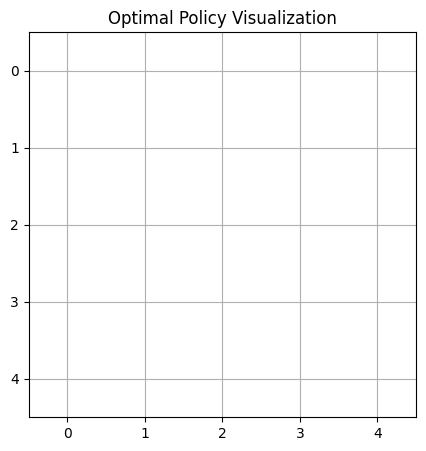



Episode 337:
Taxi starting position: 1
First customer request: C
Second customer request: A
Second customer is a premium customer.


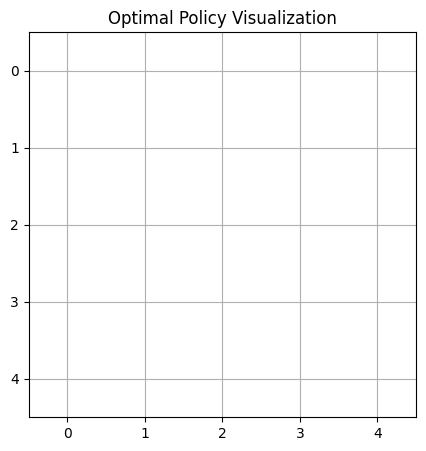



Episode 338:
Taxi starting position: 4
First customer request: D
Second customer request: D


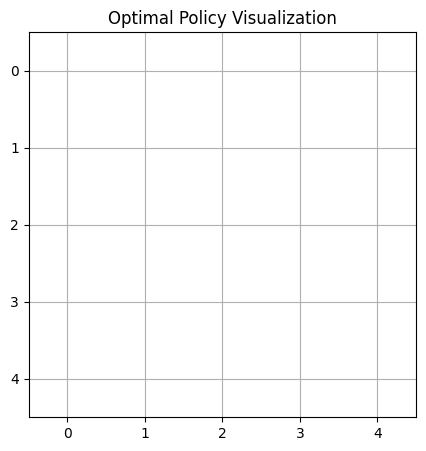



Episode 339:
Taxi starting position: 2
First customer request: A


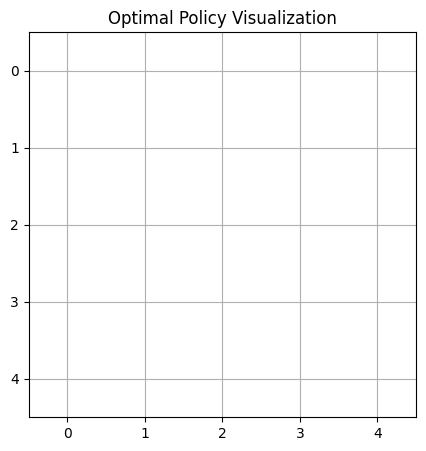



Episode 340:
Taxi starting position: 1
First customer request: C
Second customer request: A
Second customer is a premium customer.


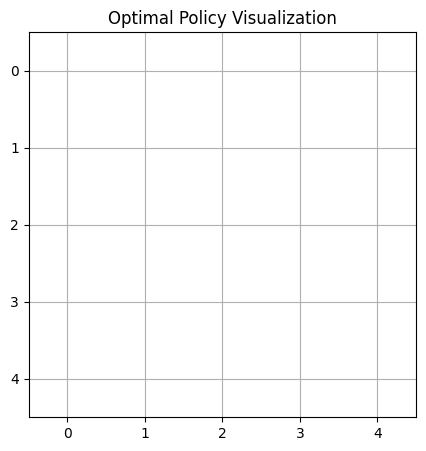



Episode 341:
Taxi starting position: 2
First customer request: A


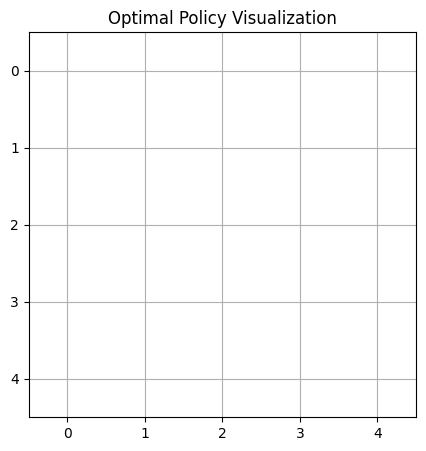



Episode 342:
Taxi starting position: 3
First customer request: A


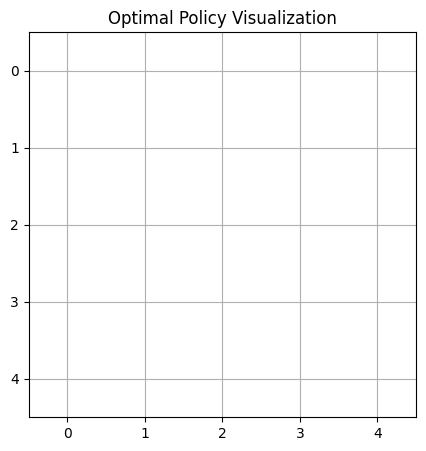



Episode 343:
Taxi starting position: 4
First customer request: D


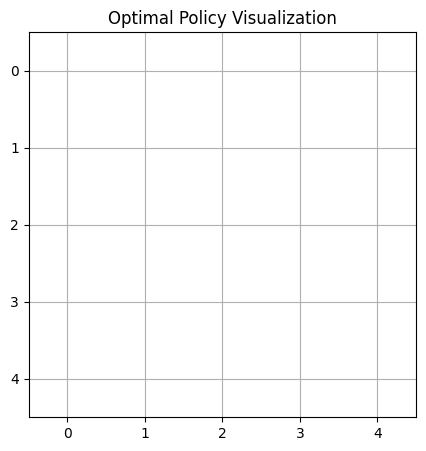



Episode 344:
Taxi starting position: 0
First customer request: D


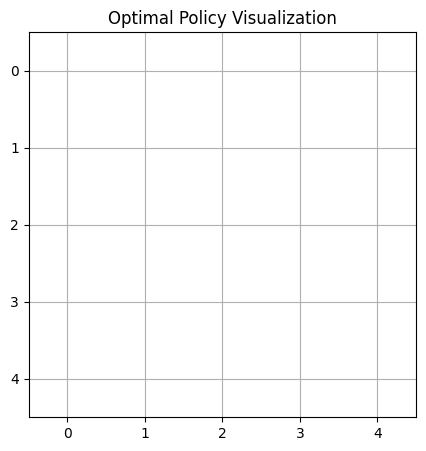



Episode 345:
Taxi starting position: 1
First customer request: D


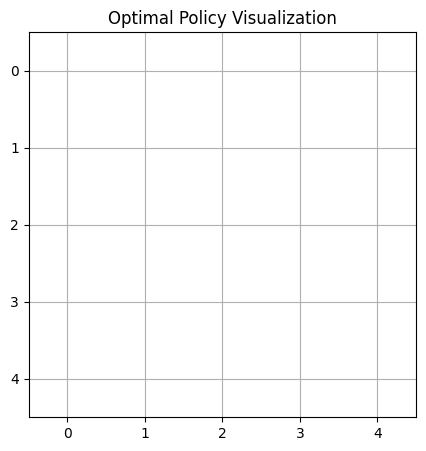



Episode 346:
Taxi starting position: 2
First customer request: B


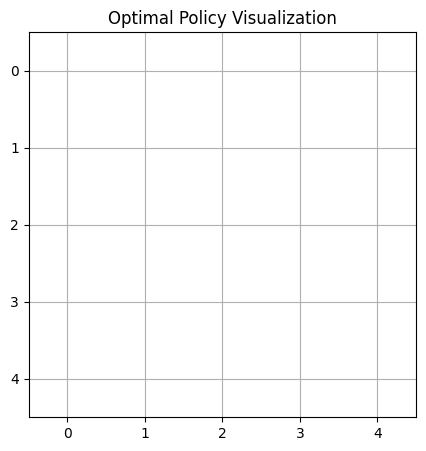



Episode 347:
Taxi starting position: 3
First customer request: D
Second customer request: B
Second customer is a premium customer.


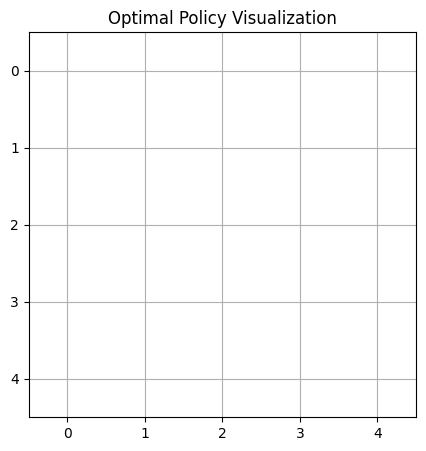



Episode 348:
Taxi starting position: 0
First customer request: B


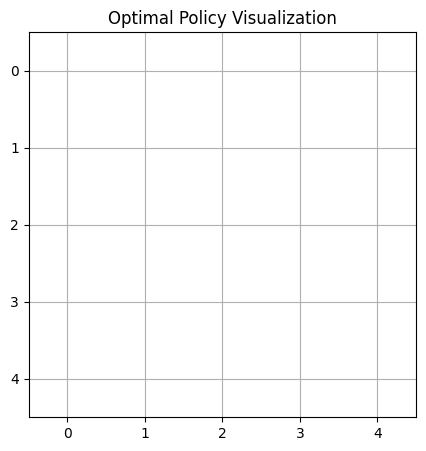



Episode 349:
Taxi starting position: 2
First customer request: B
Second customer request: C


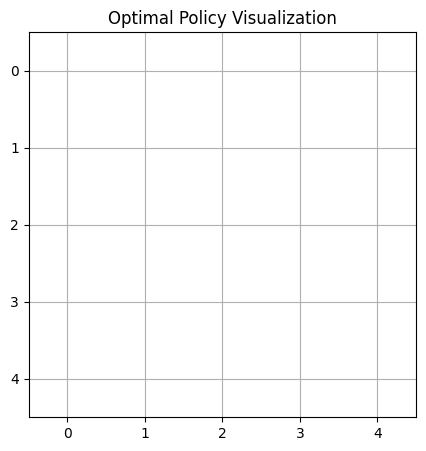



Episode 350:
Taxi starting position: 0
First customer request: B


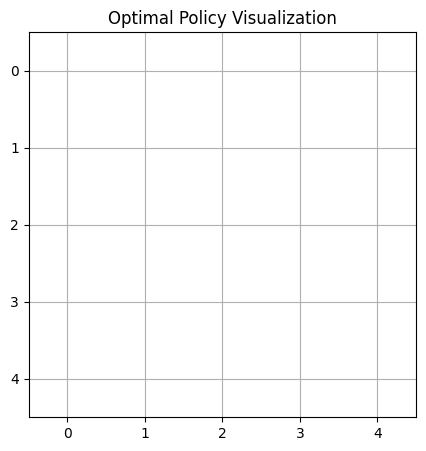



Episode 351:
Taxi starting position: 4
First customer request: C
Second customer request: C
Second customer is a premium customer.


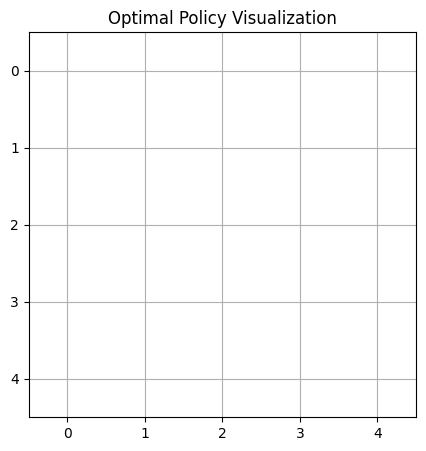



Episode 352:
Taxi starting position: 1
First customer request: A


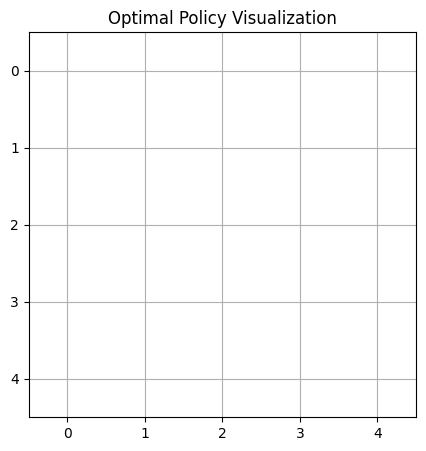



Episode 353:
Taxi starting position: 2
First customer request: B
Second customer request: B


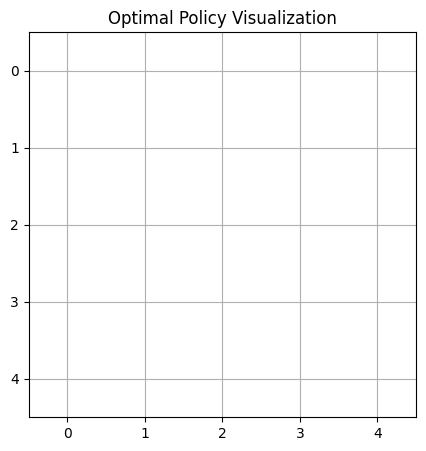



Episode 354:
Taxi starting position: 2
First customer request: B


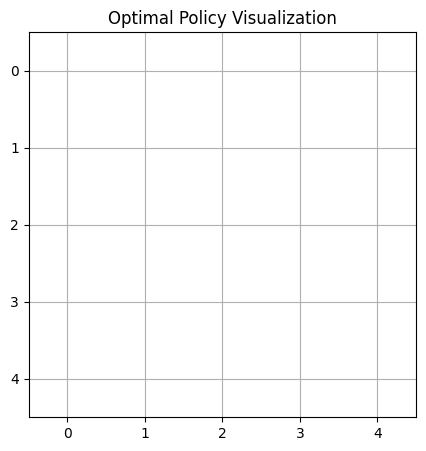



Episode 355:
Taxi starting position: 2
First customer request: B
Second customer request: A


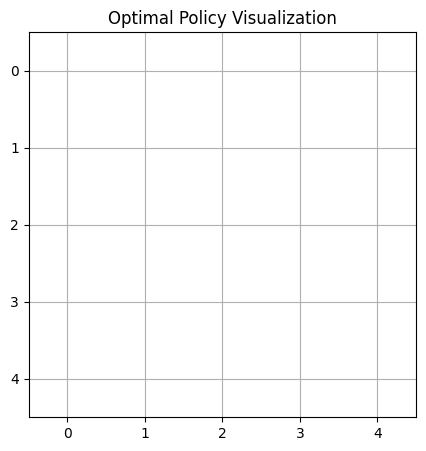



Episode 356:
Taxi starting position: 3
First customer request: A
Second customer request: A


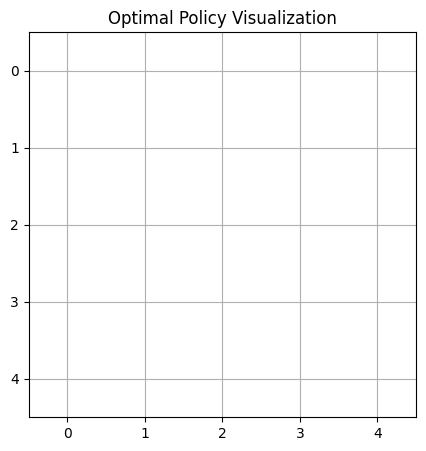



Episode 357:
Taxi starting position: 0
First customer request: A
Second customer request: B
Second customer is a premium customer.


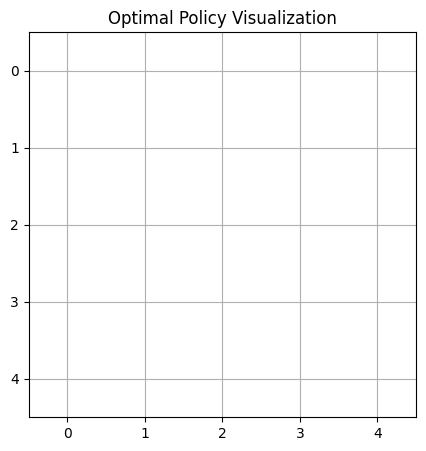



Episode 358:
Taxi starting position: 1
First customer request: C


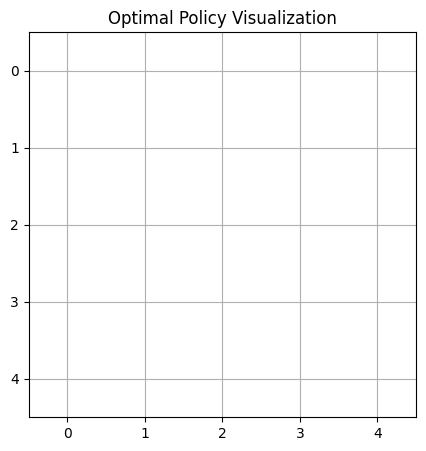



Episode 359:
Taxi starting position: 0
First customer request: C


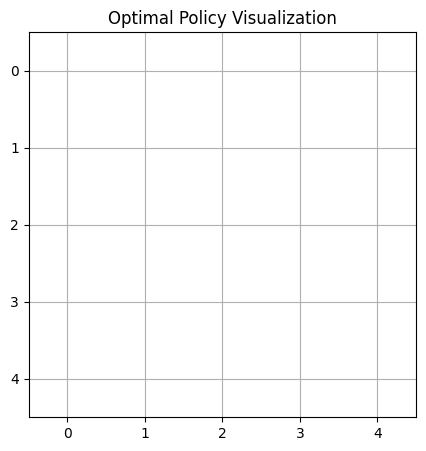



Episode 360:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


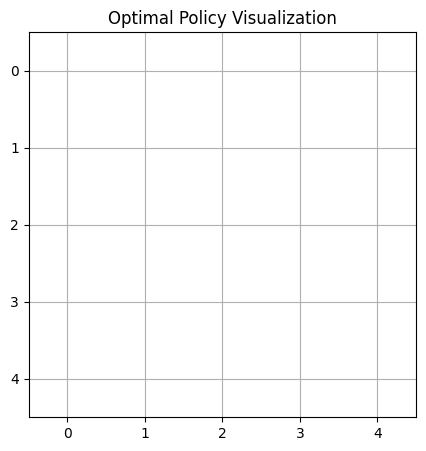



Episode 361:
Taxi starting position: 0
First customer request: A


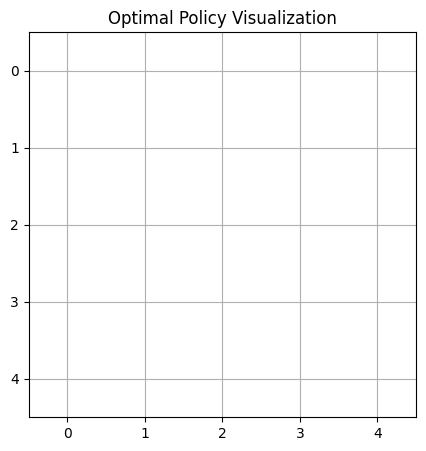



Episode 362:
Taxi starting position: 0
First customer request: C


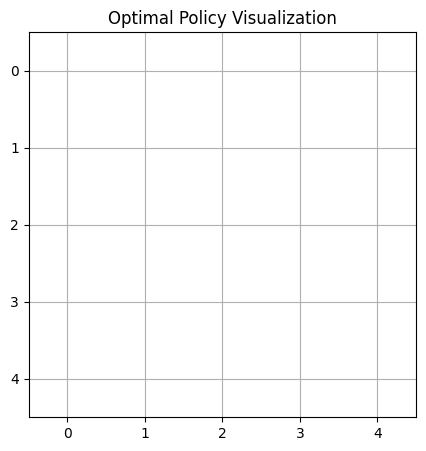



Episode 363:
Taxi starting position: 0
First customer request: D


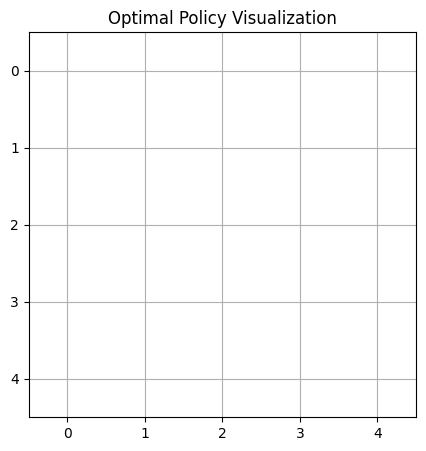



Episode 364:
Taxi starting position: 2
First customer request: C
Second customer request: C


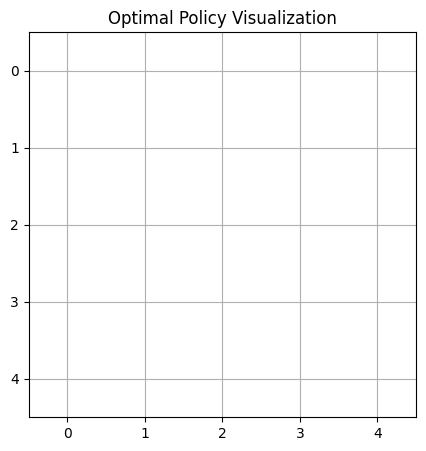



Episode 365:
Taxi starting position: 0
First customer request: C
Second customer request: D


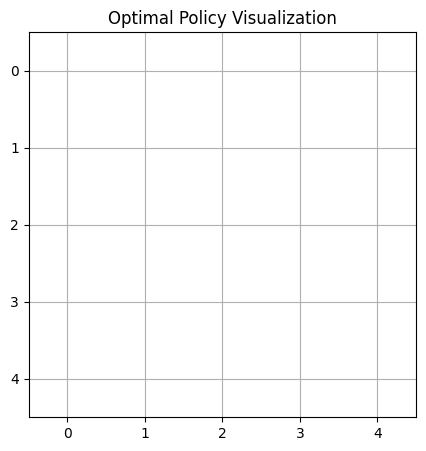



Episode 366:
Taxi starting position: 1
First customer request: D


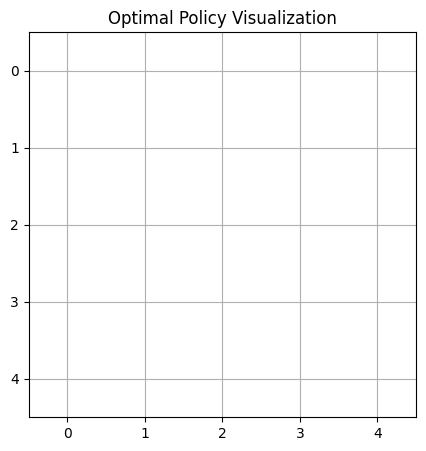



Episode 367:
Taxi starting position: 0
First customer request: C


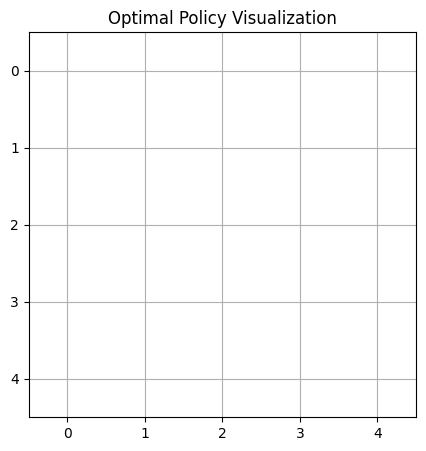



Episode 368:
Taxi starting position: 4
First customer request: C
Second customer request: C


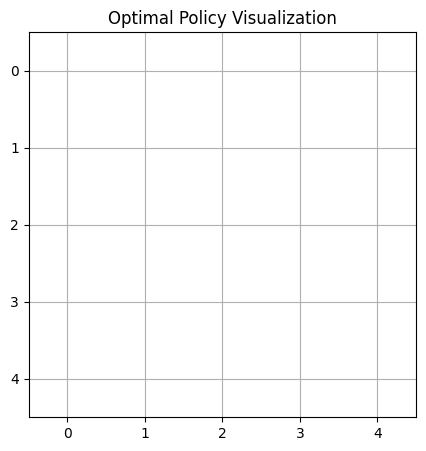



Episode 369:
Taxi starting position: 0
First customer request: B


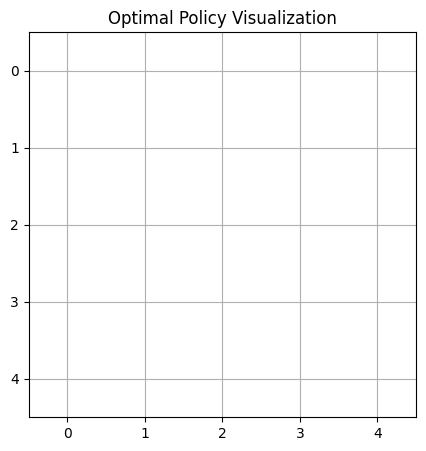



Episode 370:
Taxi starting position: 3
First customer request: A
Second customer request: D


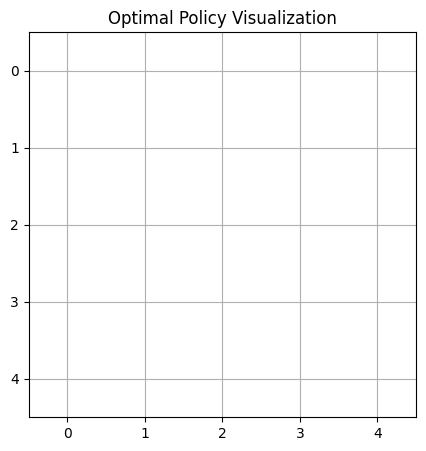



Episode 371:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


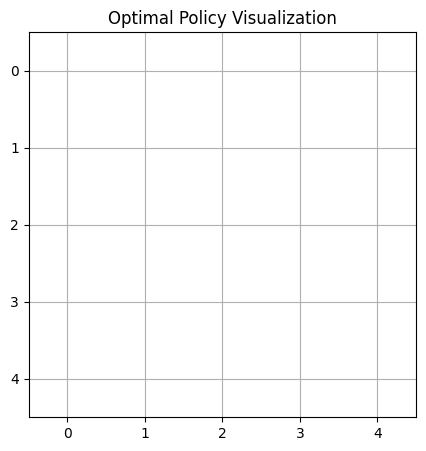



Episode 372:
Taxi starting position: 4
First customer request: B
Second customer request: A


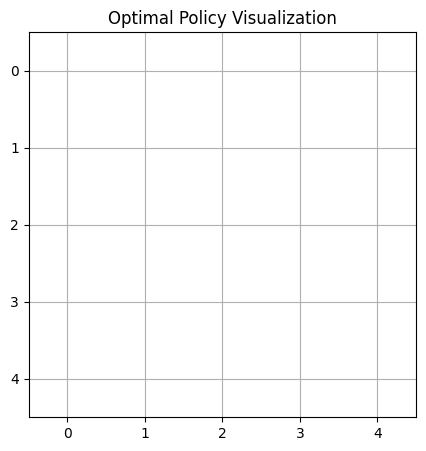



Episode 373:
Taxi starting position: 0
First customer request: B


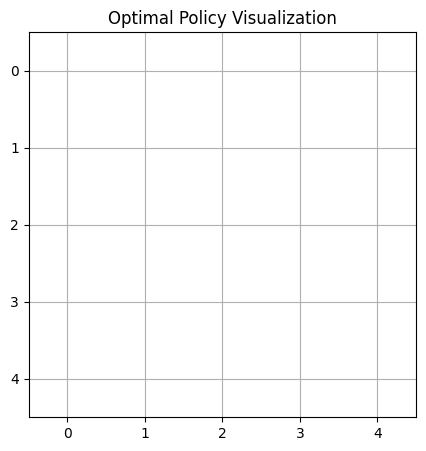



Episode 374:
Taxi starting position: 2
First customer request: D
Second customer request: A


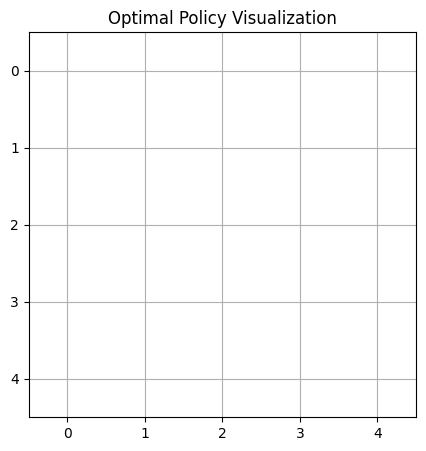



Episode 375:
Taxi starting position: 2
First customer request: C
Second customer request: D
Second customer is a premium customer.


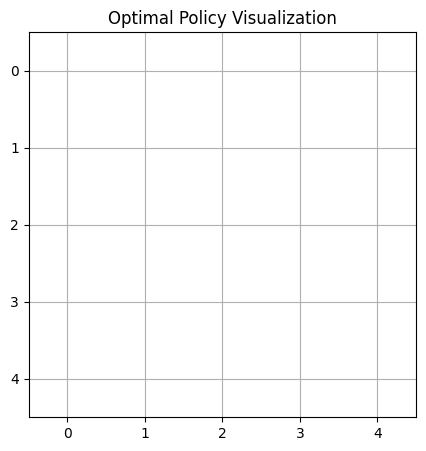



Episode 376:
Taxi starting position: 4
First customer request: B
Second customer request: D


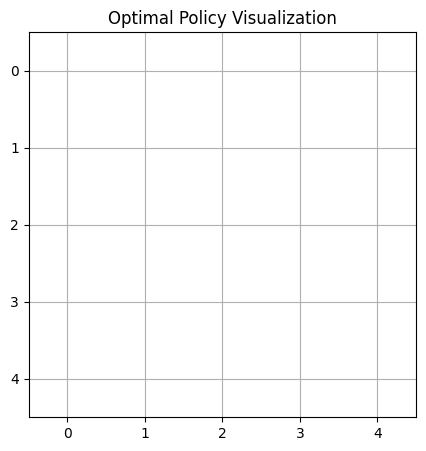



Episode 377:
Taxi starting position: 2
First customer request: B


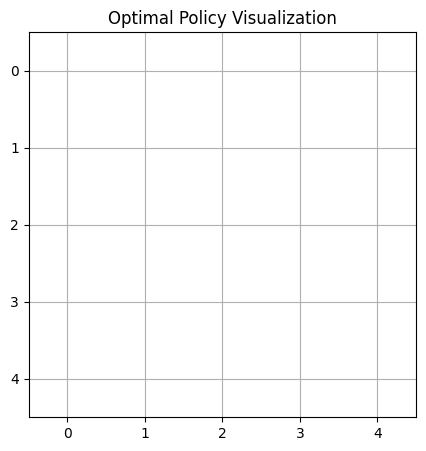



Episode 378:
Taxi starting position: 3
First customer request: B
Second customer request: B


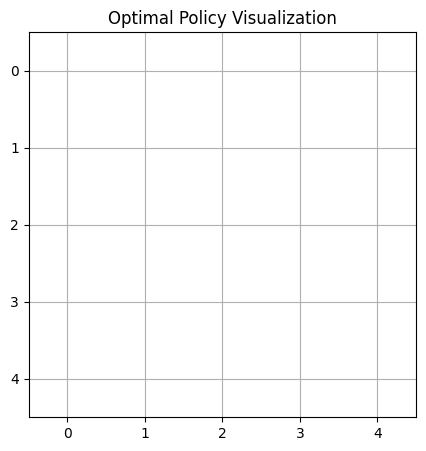



Episode 379:
Taxi starting position: 1
First customer request: A
Second customer request: A
Second customer is a premium customer.


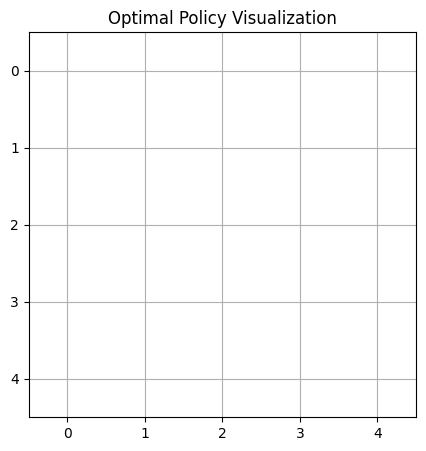



Episode 380:
Taxi starting position: 4
First customer request: B
Second customer request: A


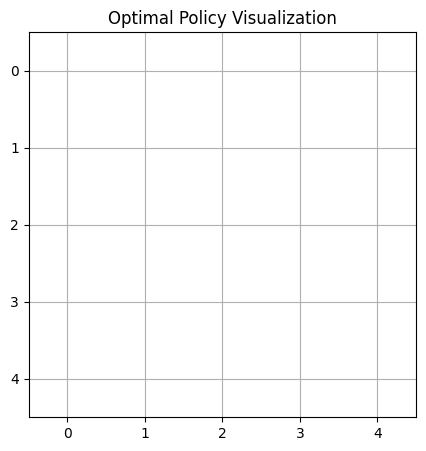



Episode 381:
Taxi starting position: 0
First customer request: C
Second customer request: C
Second customer is a premium customer.


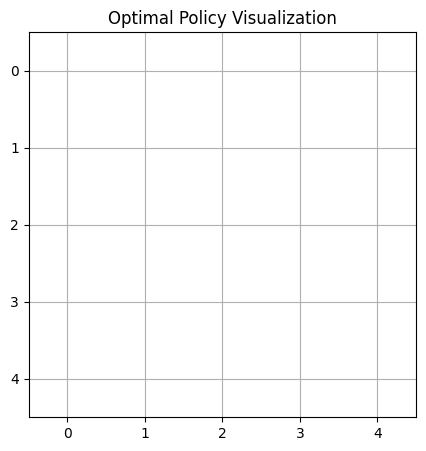



Episode 382:
Taxi starting position: 0
First customer request: C


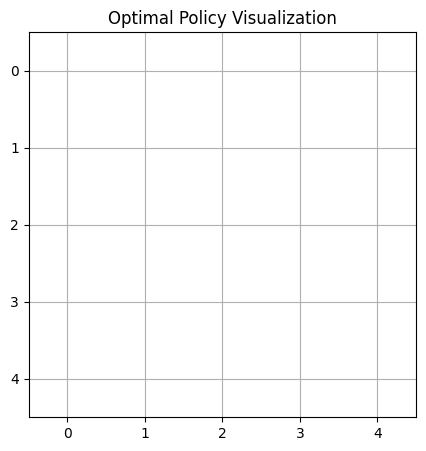



Episode 383:
Taxi starting position: 0
First customer request: A
Second customer request: A


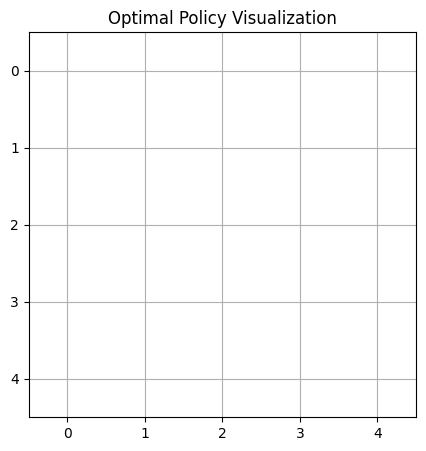



Episode 384:
Taxi starting position: 1
First customer request: B
Second customer request: B


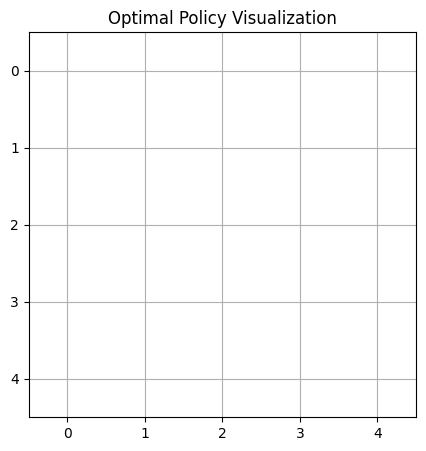



Episode 385:
Taxi starting position: 0
First customer request: C
Second customer request: C
Second customer is a premium customer.


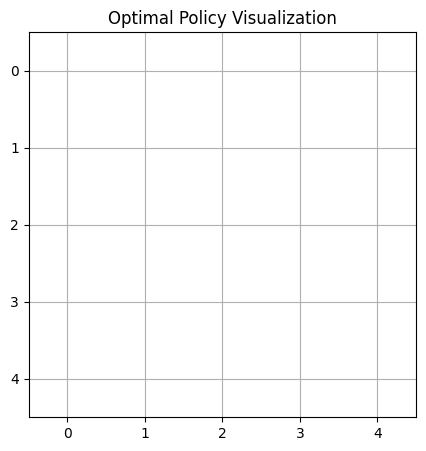



Episode 386:
Taxi starting position: 3
First customer request: B


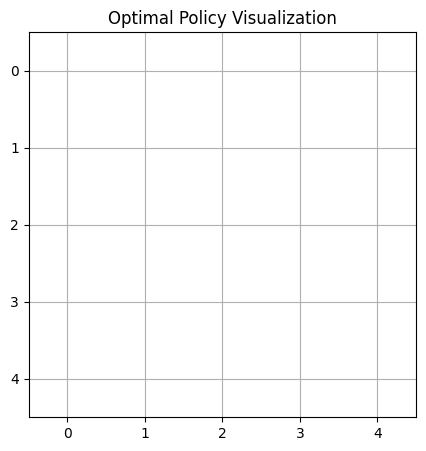



Episode 387:
Taxi starting position: 2
First customer request: C
Second customer request: B


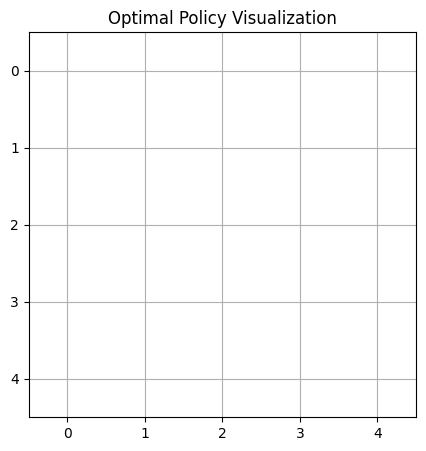



Episode 388:
Taxi starting position: 0
First customer request: A


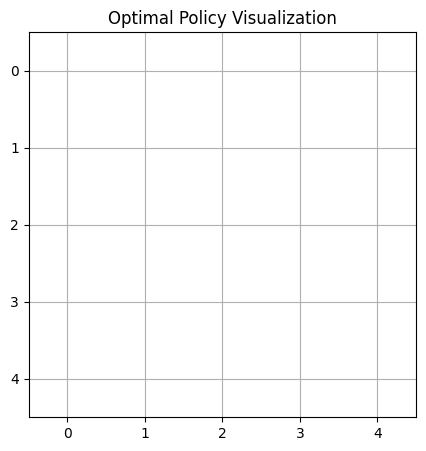



Episode 389:
Taxi starting position: 3
First customer request: B


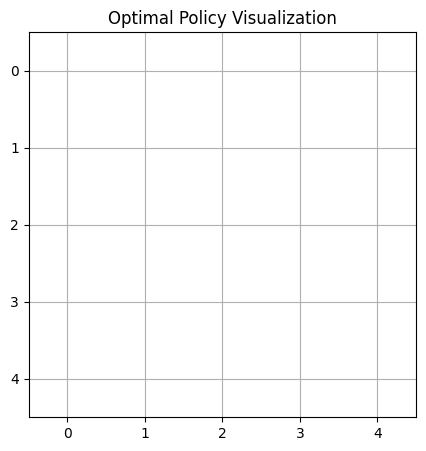



Episode 390:
Taxi starting position: 0
First customer request: D
Second customer request: B


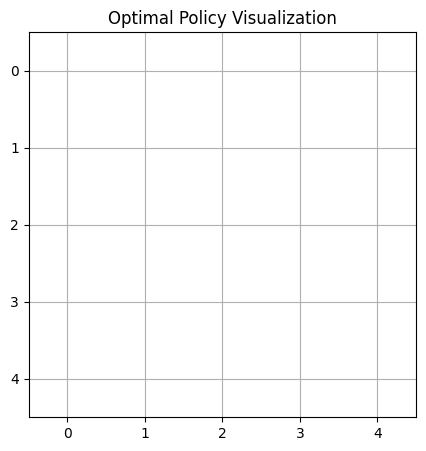



Episode 391:
Taxi starting position: 0
First customer request: C


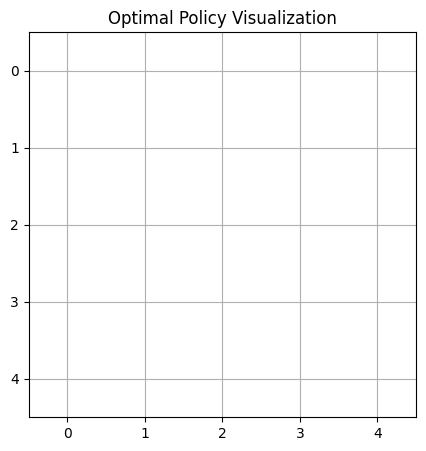



Episode 392:
Taxi starting position: 2
First customer request: A
Second customer request: A


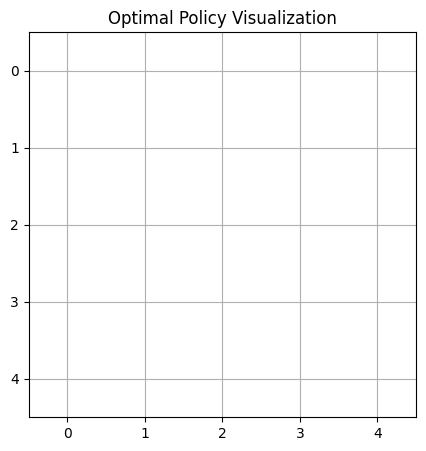



Episode 393:
Taxi starting position: 3
First customer request: D


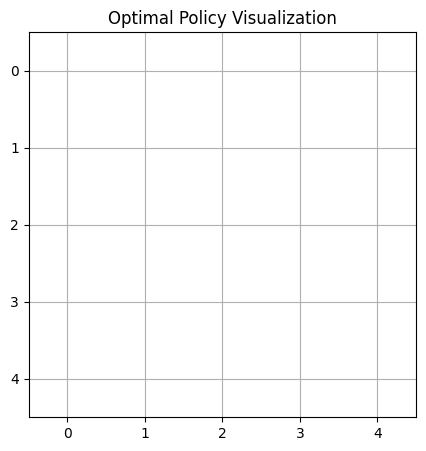



Episode 394:
Taxi starting position: 1
First customer request: A
Second customer request: A


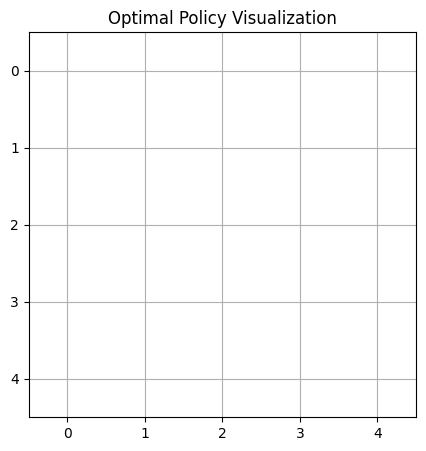



Episode 395:
Taxi starting position: 4
First customer request: B
Second customer request: C


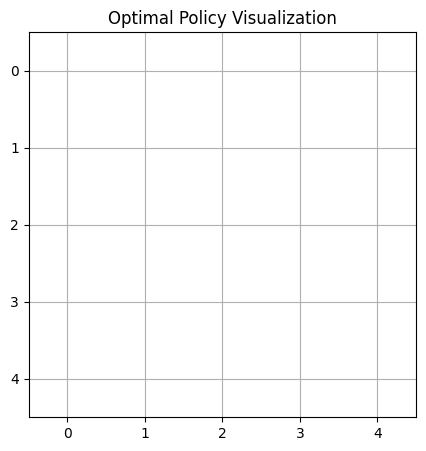



Episode 396:
Taxi starting position: 3
First customer request: B


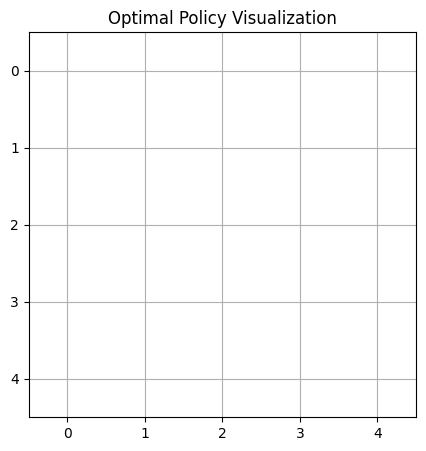



Episode 397:
Taxi starting position: 2
First customer request: A


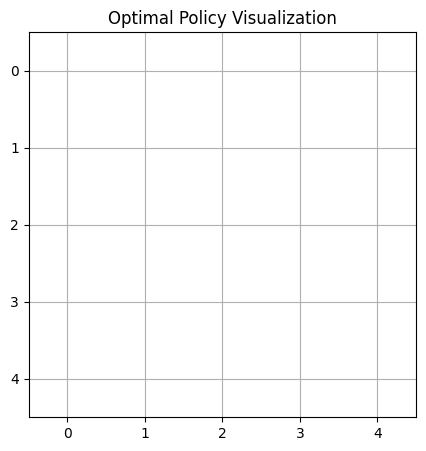



Episode 398:
Taxi starting position: 1
First customer request: A


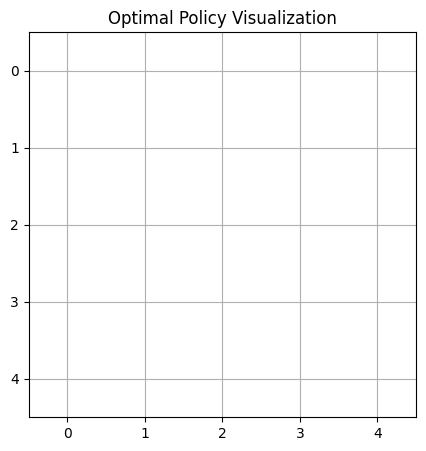



Episode 399:
Taxi starting position: 3
First customer request: C


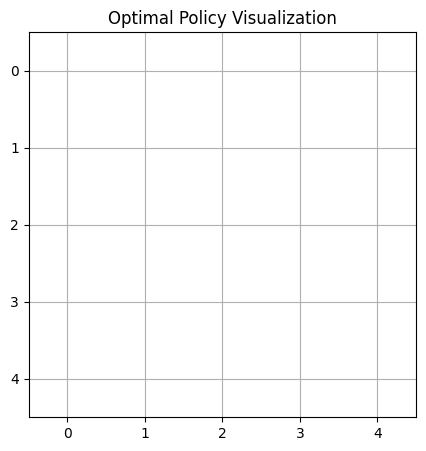



Episode 400:
Taxi starting position: 4
First customer request: D


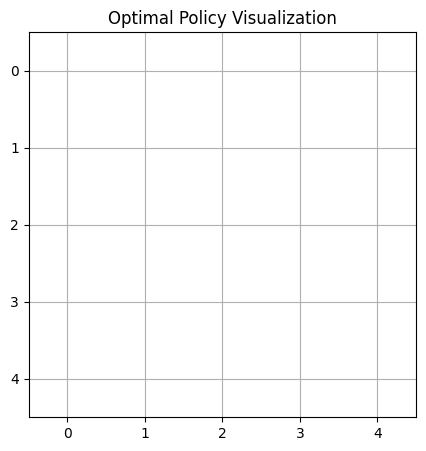



Episode 401:
Taxi starting position: 0
First customer request: C


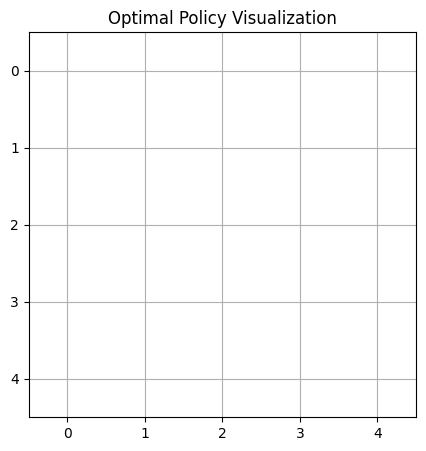



Episode 402:
Taxi starting position: 2
First customer request: C


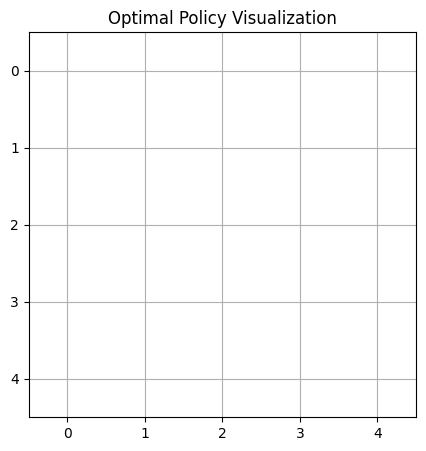



Episode 403:
Taxi starting position: 2
First customer request: B
Second customer request: A
Second customer is a premium customer.


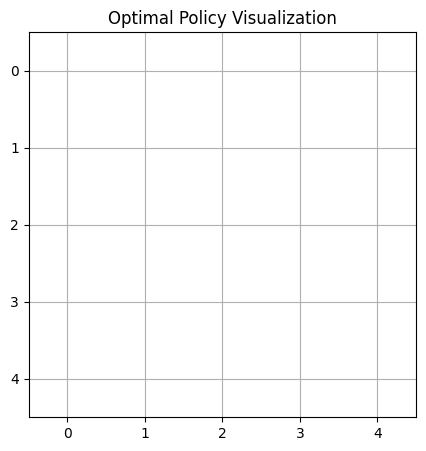



Episode 404:
Taxi starting position: 3
First customer request: C
Second customer request: D


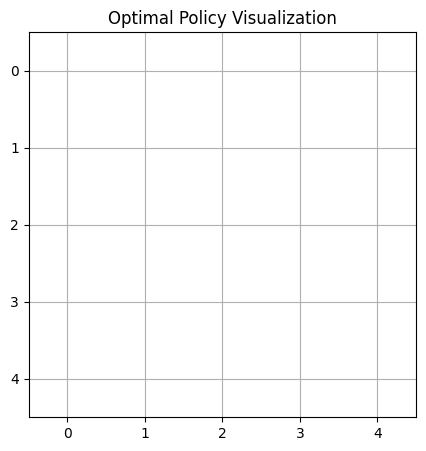



Episode 405:
Taxi starting position: 0
First customer request: C


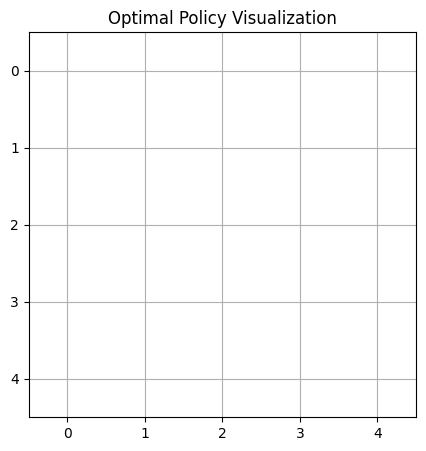



Episode 406:
Taxi starting position: 4
First customer request: B


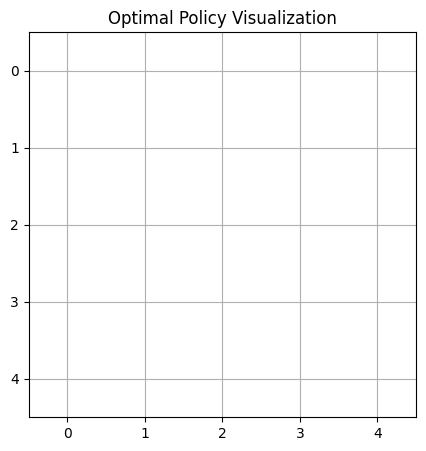



Episode 407:
Taxi starting position: 4
First customer request: A
Second customer request: B


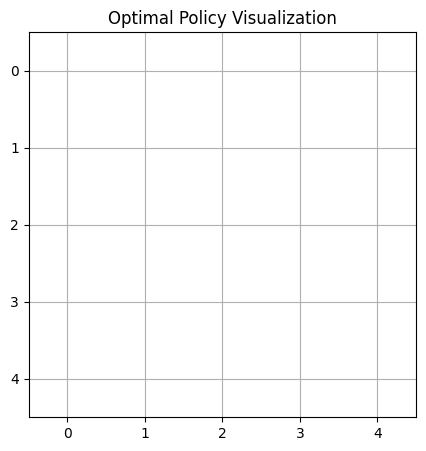



Episode 408:
Taxi starting position: 0
First customer request: B


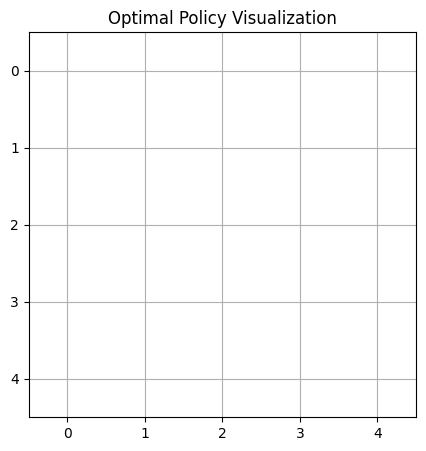



Episode 409:
Taxi starting position: 2
First customer request: A
Second customer request: C
Second customer is a premium customer.


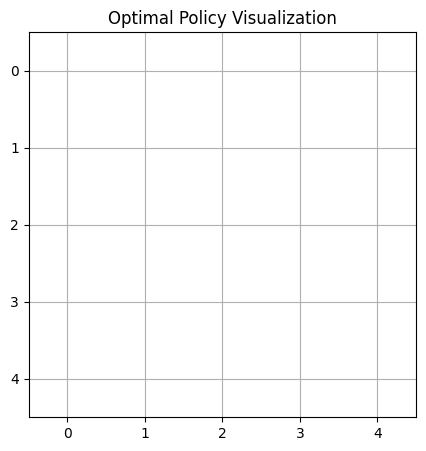



Episode 410:
Taxi starting position: 2
First customer request: B
Second customer request: A


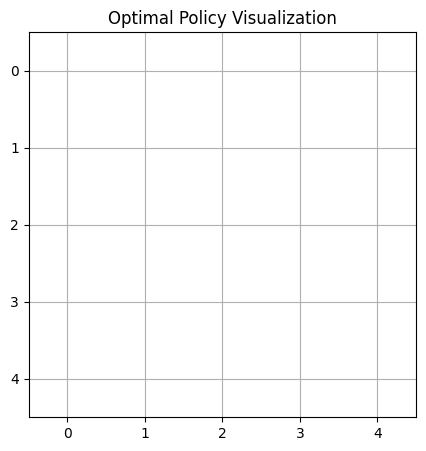



Episode 411:
Taxi starting position: 0
First customer request: C
Second customer request: C


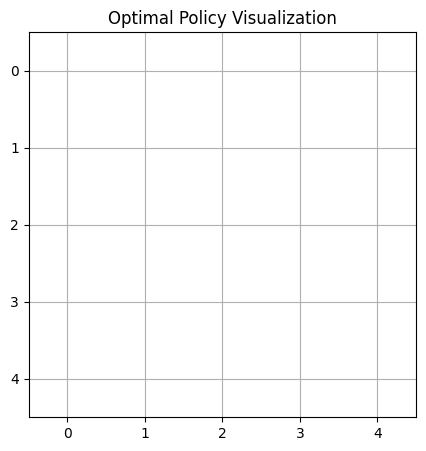



Episode 412:
Taxi starting position: 0
First customer request: B
Second customer request: C


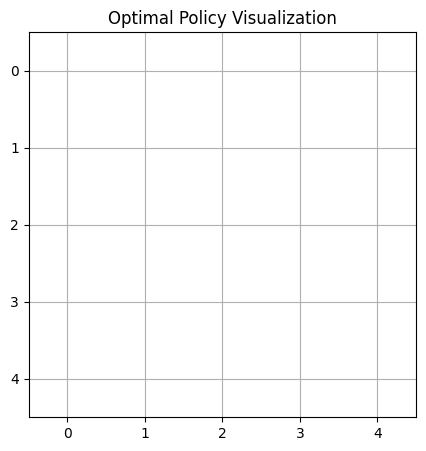



Episode 413:
Taxi starting position: 2
First customer request: B
Second customer request: A


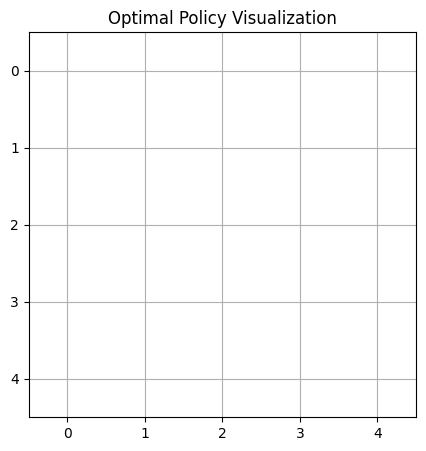



Episode 414:
Taxi starting position: 4
First customer request: C
Second customer request: C
Second customer is a premium customer.


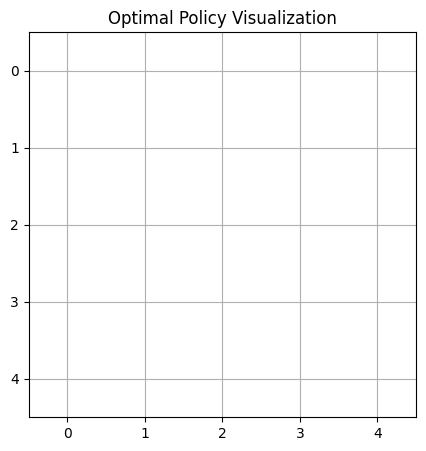



Episode 415:
Taxi starting position: 1
First customer request: C


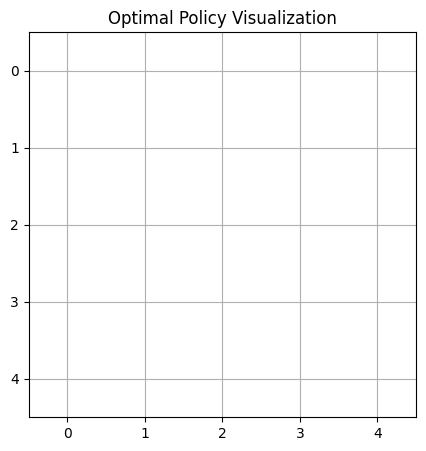



Episode 416:
Taxi starting position: 0
First customer request: C


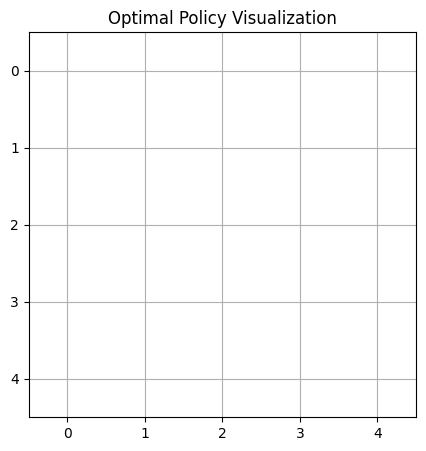



Episode 417:
Taxi starting position: 1
First customer request: B
Second customer request: A


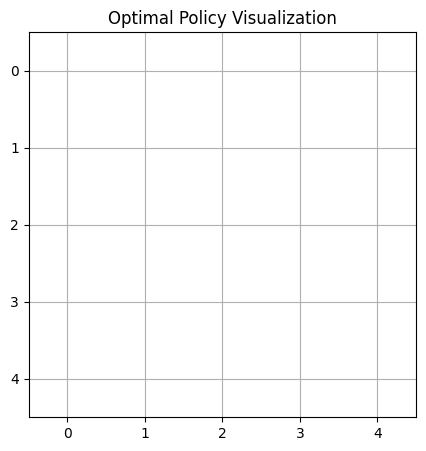



Episode 418:
Taxi starting position: 2
First customer request: B


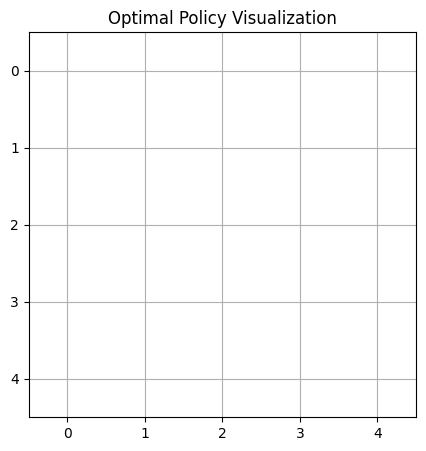



Episode 419:
Taxi starting position: 1
First customer request: C


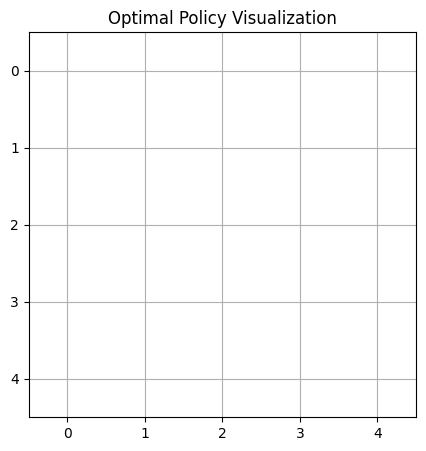



Episode 420:
Taxi starting position: 0
First customer request: B
Second customer request: A


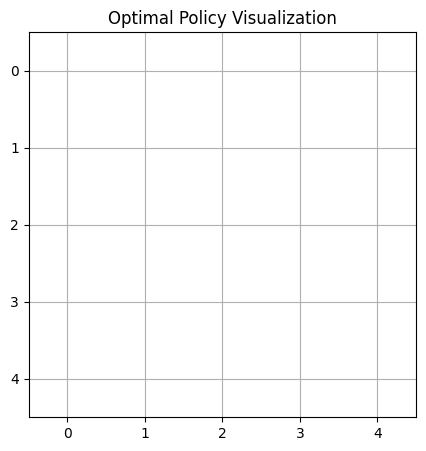



Episode 421:
Taxi starting position: 3
First customer request: C
Second customer request: D


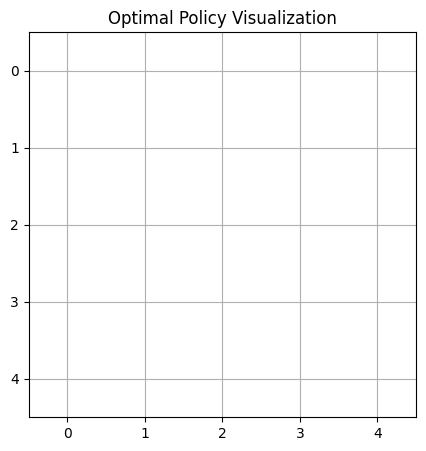



Episode 422:
Taxi starting position: 3
First customer request: D


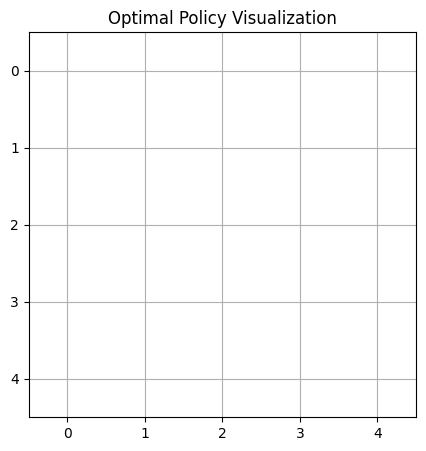



Episode 423:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


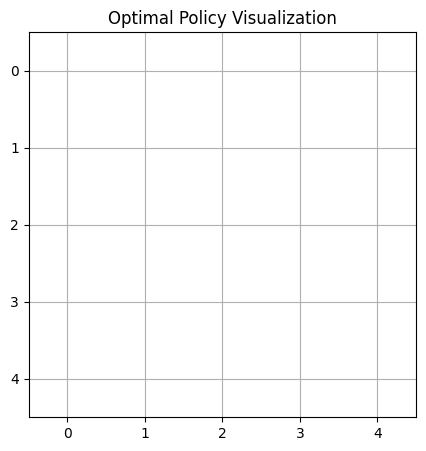



Episode 424:
Taxi starting position: 0
First customer request: D


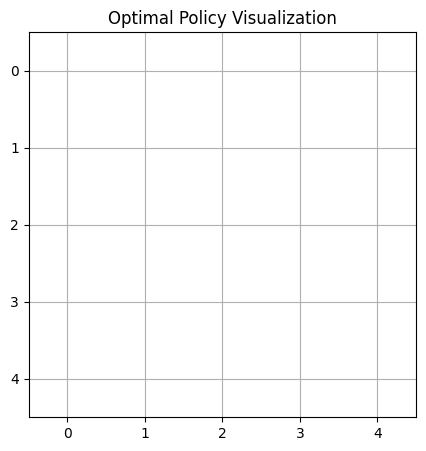



Episode 425:
Taxi starting position: 4
First customer request: C
Second customer request: C
Second customer is a premium customer.


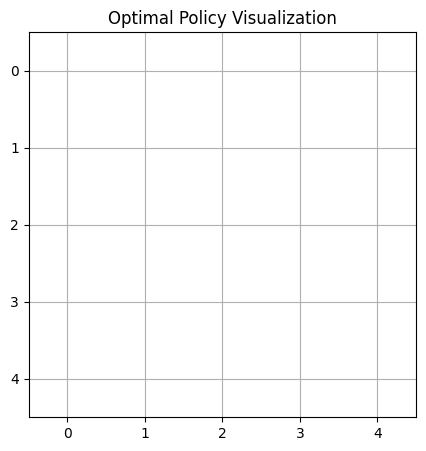



Episode 426:
Taxi starting position: 1
First customer request: D
Second customer request: D


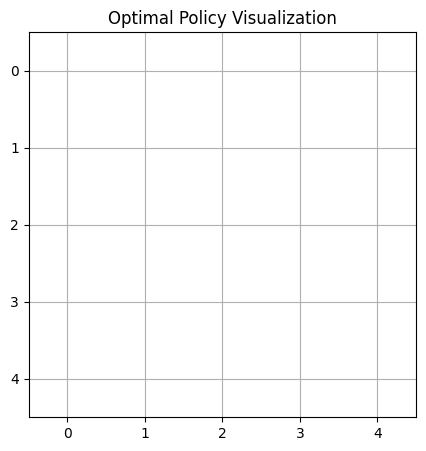



Episode 427:
Taxi starting position: 2
First customer request: B
Second customer request: B


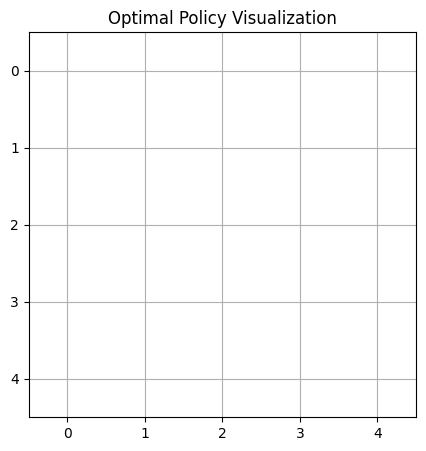



Episode 428:
Taxi starting position: 3
First customer request: C


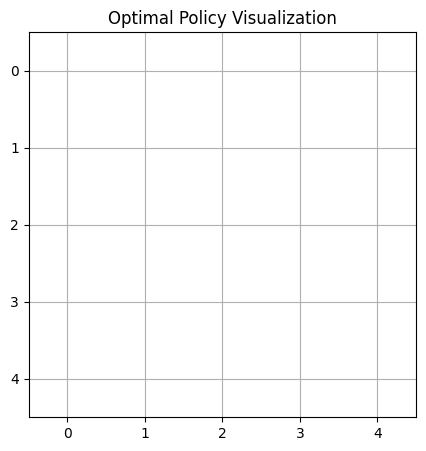



Episode 429:
Taxi starting position: 3
First customer request: C


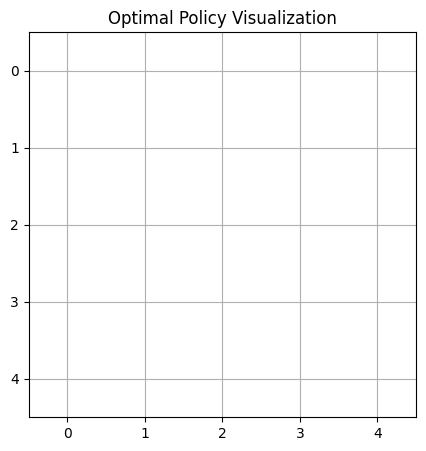



Episode 430:
Taxi starting position: 0
First customer request: D
Second customer request: B
Second customer is a premium customer.


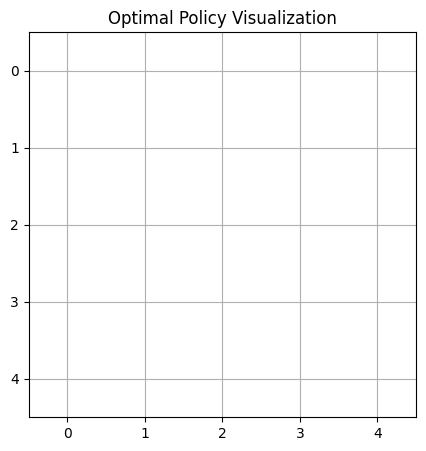



Episode 431:
Taxi starting position: 0
First customer request: D


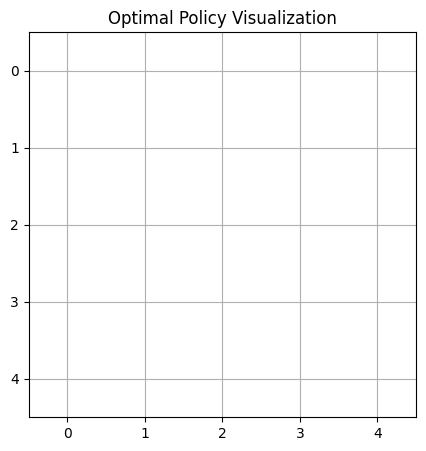



Episode 432:
Taxi starting position: 4
First customer request: D
Second customer request: D


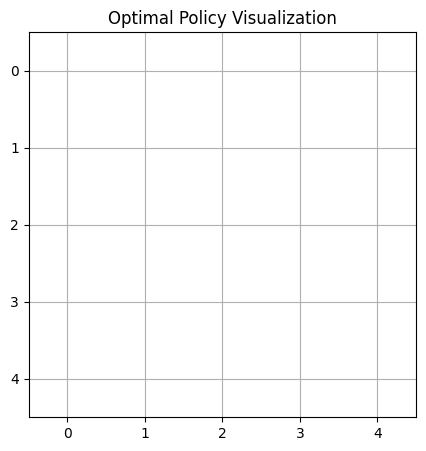



Episode 433:
Taxi starting position: 2
First customer request: C
Second customer request: C


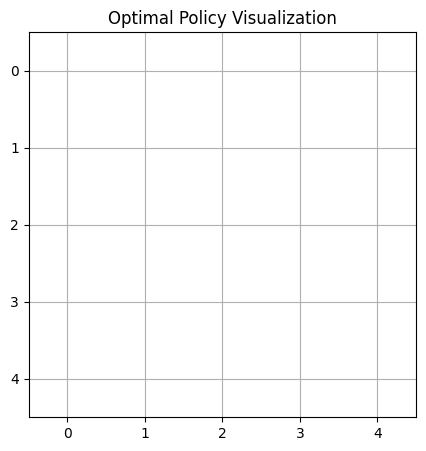



Episode 434:
Taxi starting position: 4
First customer request: D


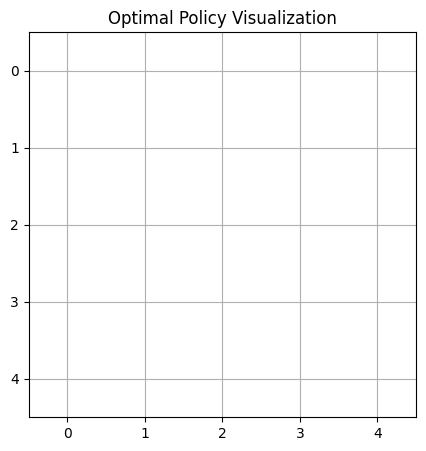



Episode 435:
Taxi starting position: 4
First customer request: D
Second customer request: A


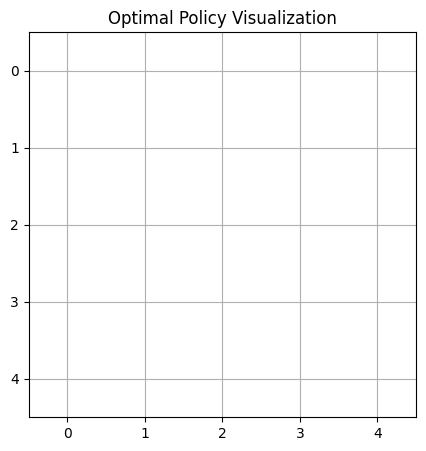



Episode 436:
Taxi starting position: 0
First customer request: A


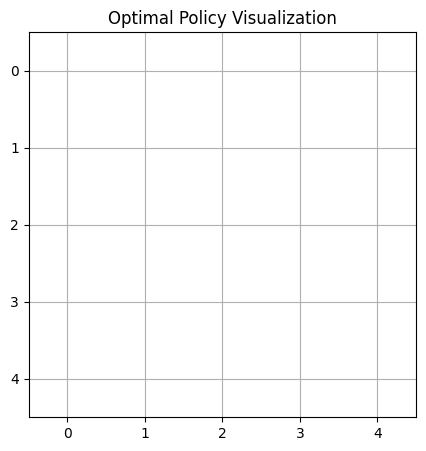



Episode 437:
Taxi starting position: 1
First customer request: A


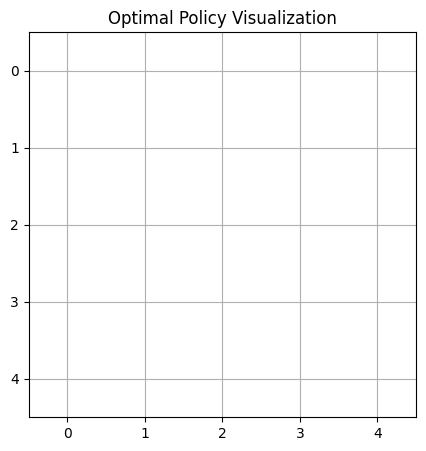



Episode 438:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


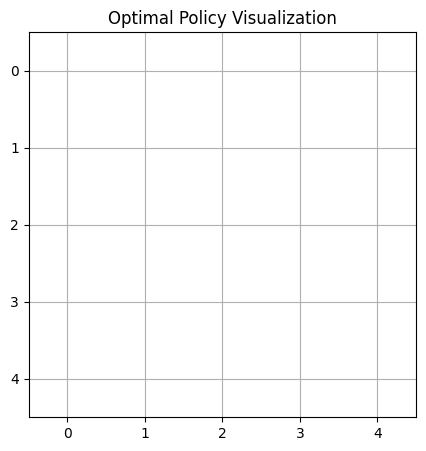



Episode 439:
Taxi starting position: 1
First customer request: A
Second customer request: A
Second customer is a premium customer.


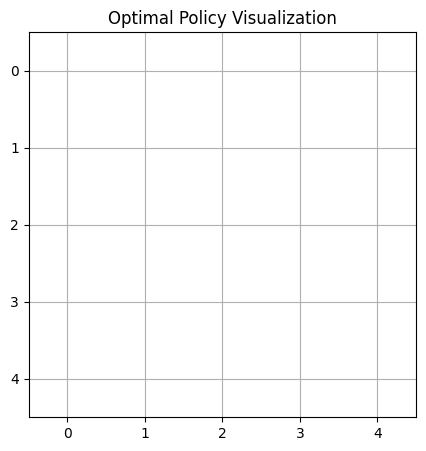



Episode 440:
Taxi starting position: 4
First customer request: B


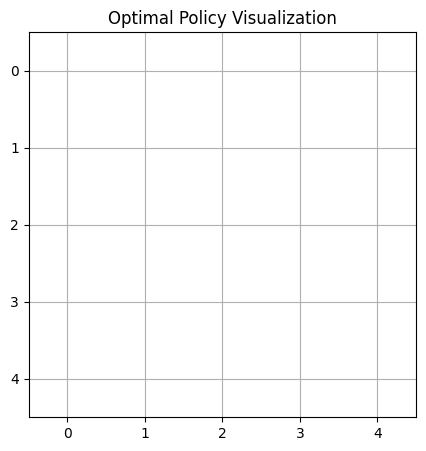



Episode 441:
Taxi starting position: 3
First customer request: B
Second customer request: D
Second customer is a premium customer.


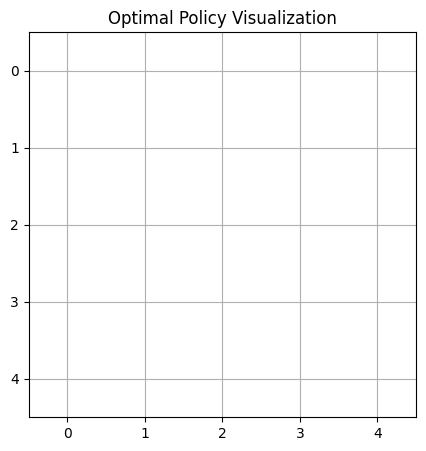



Episode 442:
Taxi starting position: 3
First customer request: A


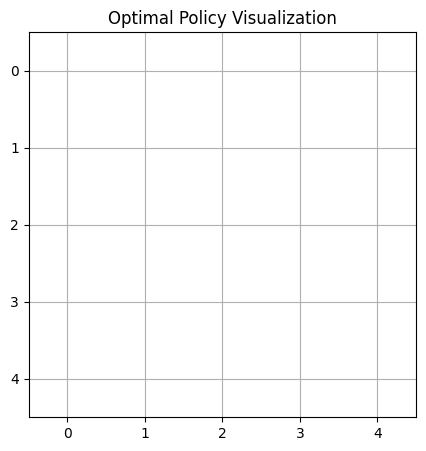



Episode 443:
Taxi starting position: 1
First customer request: D


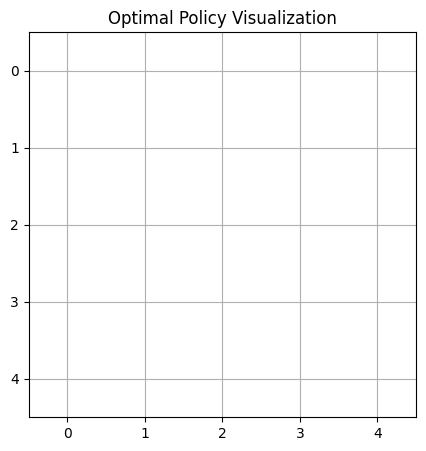



Episode 444:
Taxi starting position: 2
First customer request: A
Second customer request: D


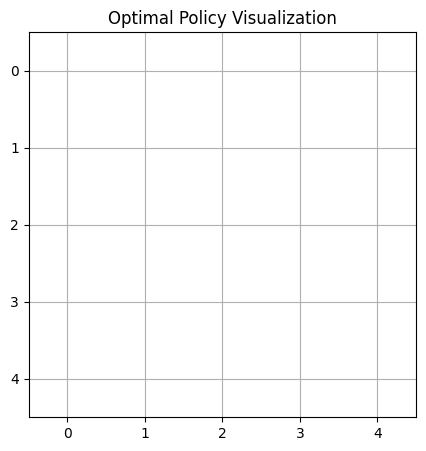



Episode 445:
Taxi starting position: 0
First customer request: D


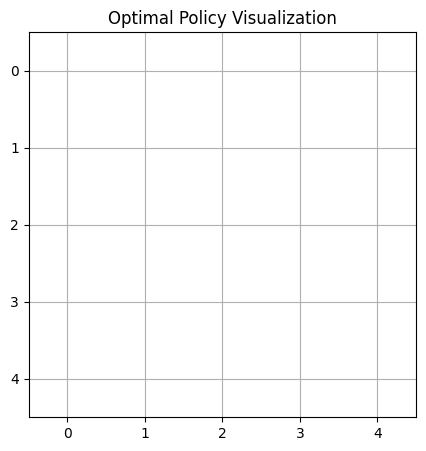



Episode 446:
Taxi starting position: 4
First customer request: C


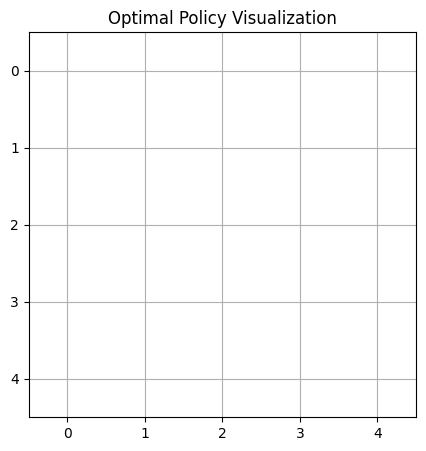



Episode 447:
Taxi starting position: 2
First customer request: C


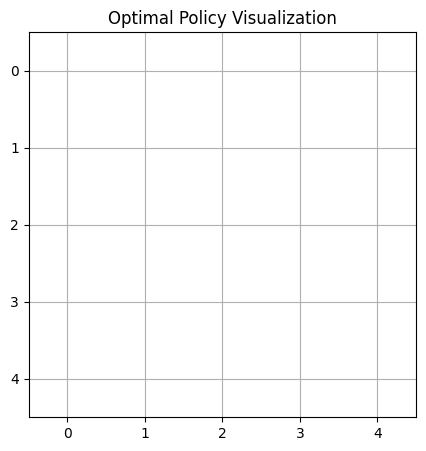



Episode 448:
Taxi starting position: 0
First customer request: D
Second customer request: C


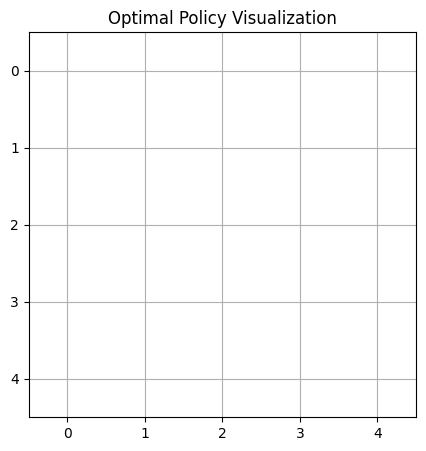



Episode 449:
Taxi starting position: 2
First customer request: C


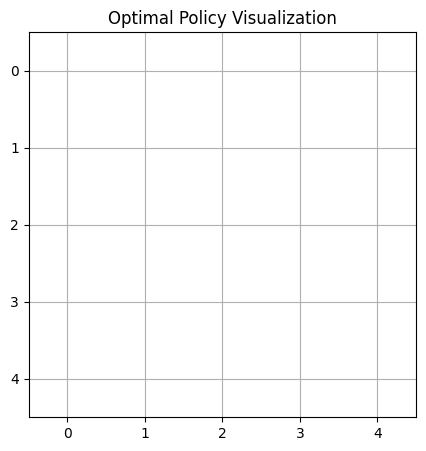



Episode 450:
Taxi starting position: 1
First customer request: D
Second customer request: C


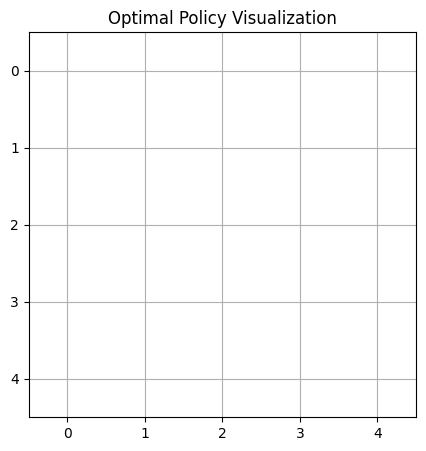



Episode 451:
Taxi starting position: 1
First customer request: A
Second customer request: C


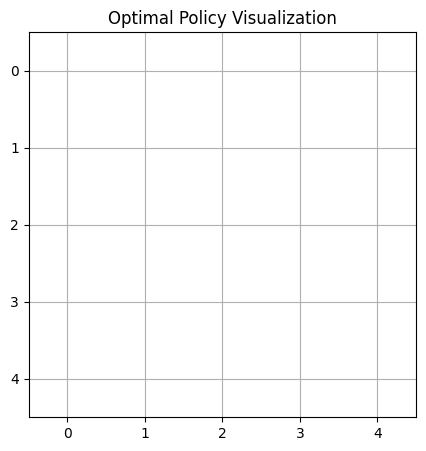



Episode 452:
Taxi starting position: 2
First customer request: B


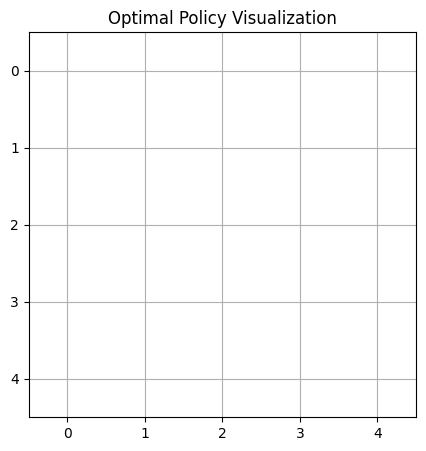



Episode 453:
Taxi starting position: 4
First customer request: B


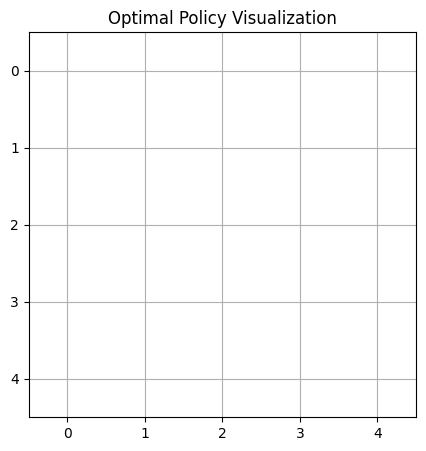



Episode 454:
Taxi starting position: 4
First customer request: C


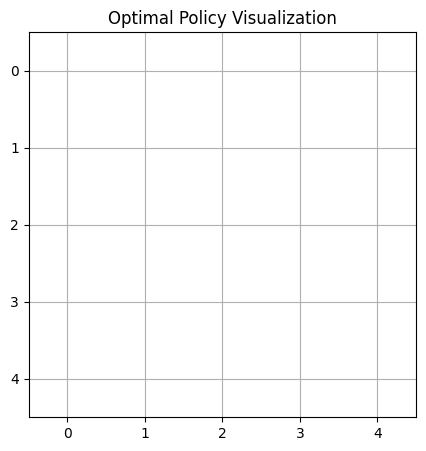



Episode 455:
Taxi starting position: 0
First customer request: D
Second customer request: D
Second customer is a premium customer.


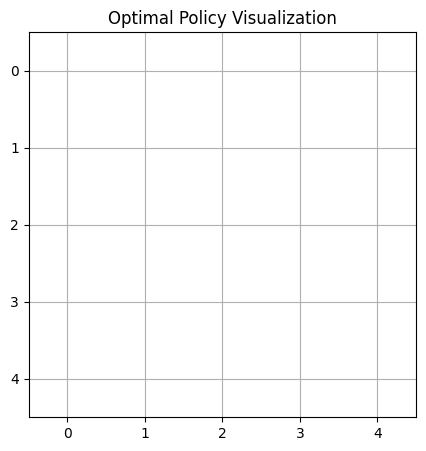



Episode 456:
Taxi starting position: 3
First customer request: D
Second customer request: C
Second customer is a premium customer.


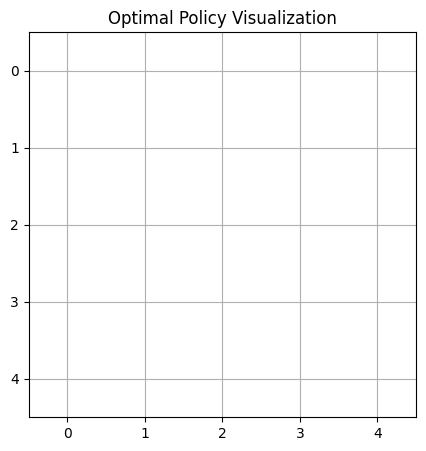



Episode 457:
Taxi starting position: 0
First customer request: B
Second customer request: A


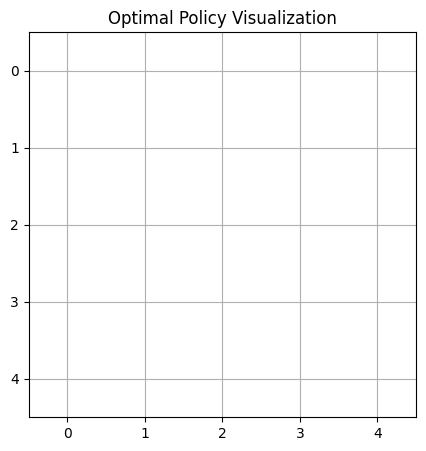



Episode 458:
Taxi starting position: 2
First customer request: C


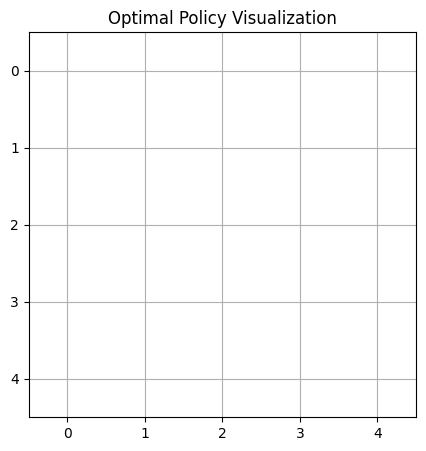



Episode 459:
Taxi starting position: 1
First customer request: A
Second customer request: A


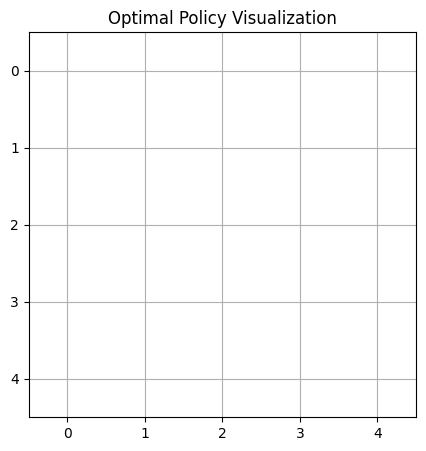



Episode 460:
Taxi starting position: 2
First customer request: D
Second customer request: D
Second customer is a premium customer.


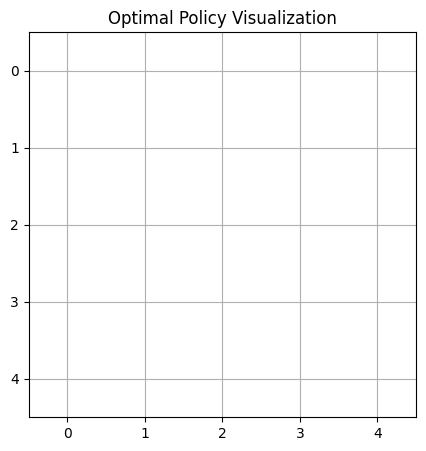



Episode 461:
Taxi starting position: 1
First customer request: C


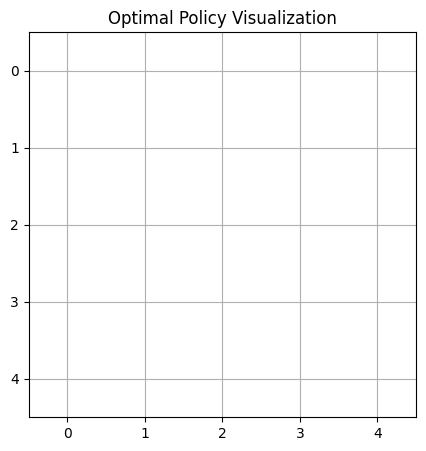



Episode 462:
Taxi starting position: 0
First customer request: A
Second customer request: A


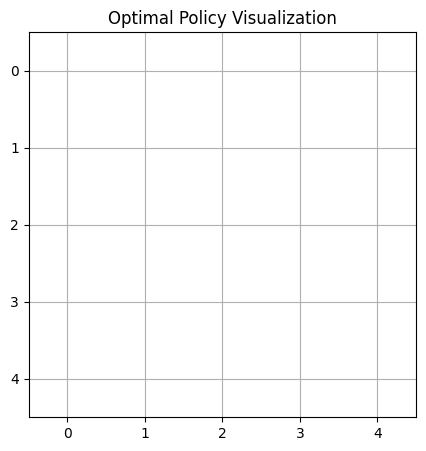



Episode 463:
Taxi starting position: 3
First customer request: D


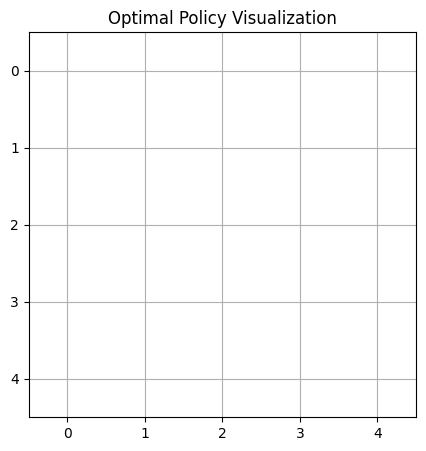



Episode 464:
Taxi starting position: 3
First customer request: A


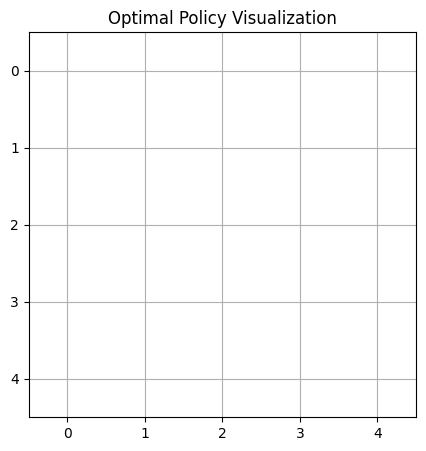



Episode 465:
Taxi starting position: 2
First customer request: C
Second customer request: B


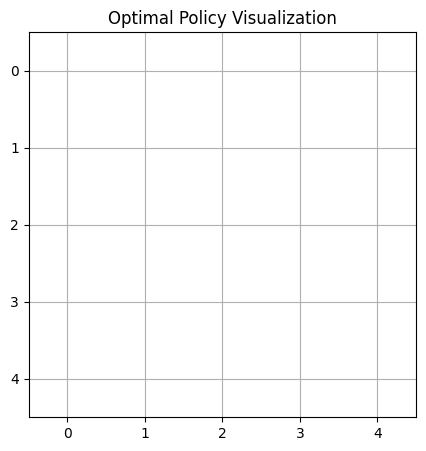



Episode 466:
Taxi starting position: 2
First customer request: A
Second customer request: B


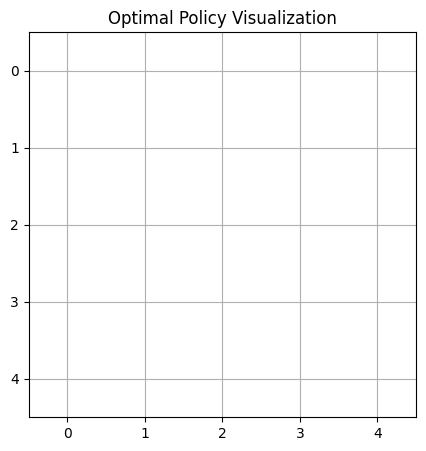



Episode 467:
Taxi starting position: 0
First customer request: A
Second customer request: C


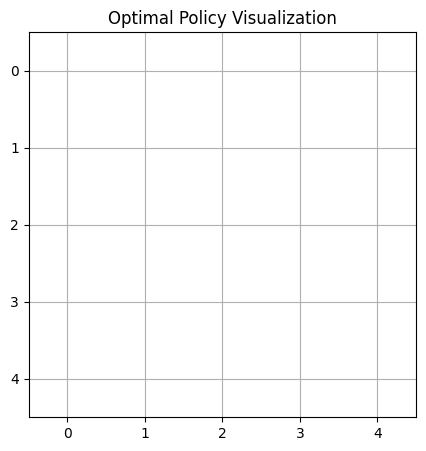



Episode 468:
Taxi starting position: 1
First customer request: B
Second customer request: A


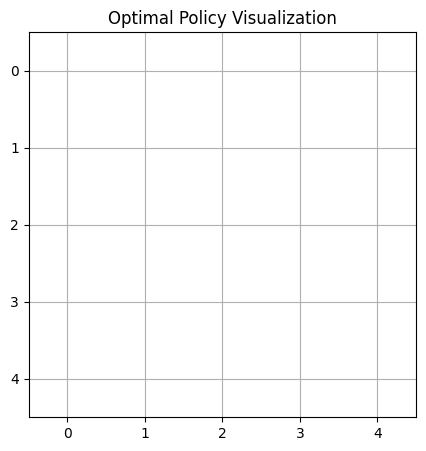



Episode 469:
Taxi starting position: 2
First customer request: B


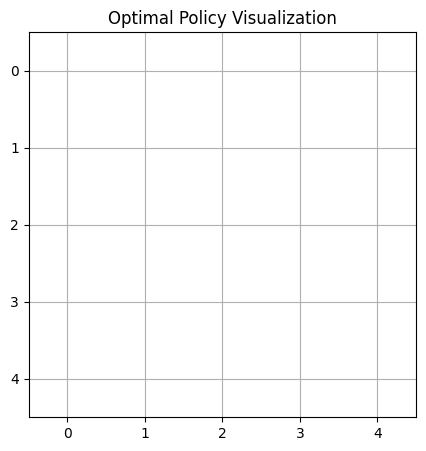



Episode 470:
Taxi starting position: 2
First customer request: D
Second customer request: D


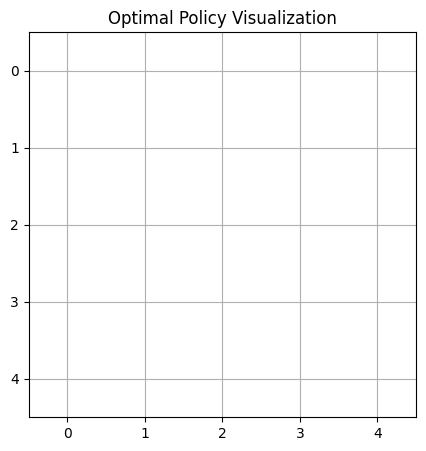



Episode 471:
Taxi starting position: 0
First customer request: C
Second customer request: C


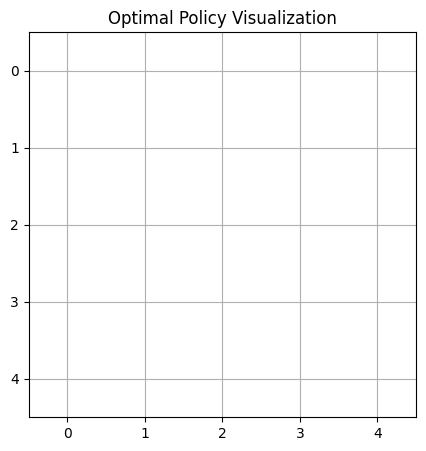



Episode 472:
Taxi starting position: 1
First customer request: A
Second customer request: D


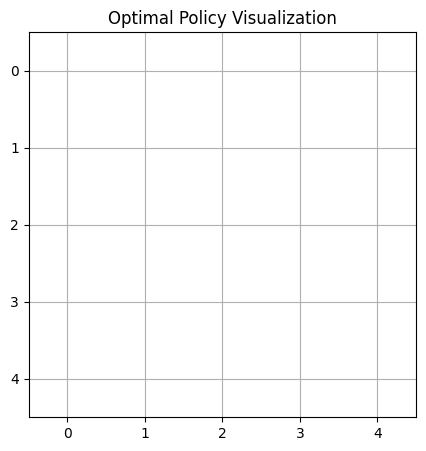



Episode 473:
Taxi starting position: 3
First customer request: D
Second customer request: B


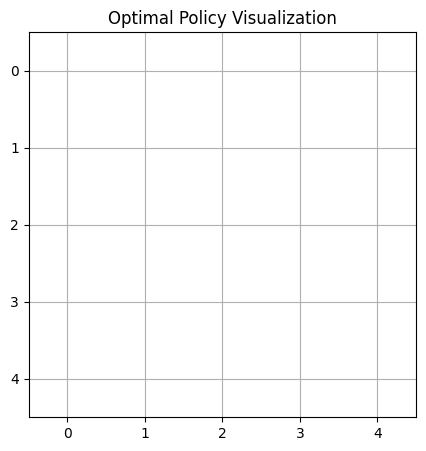



Episode 474:
Taxi starting position: 0
First customer request: A
Second customer request: D


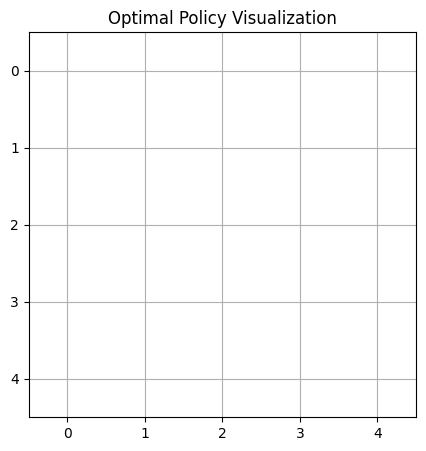



Episode 475:
Taxi starting position: 0
First customer request: B


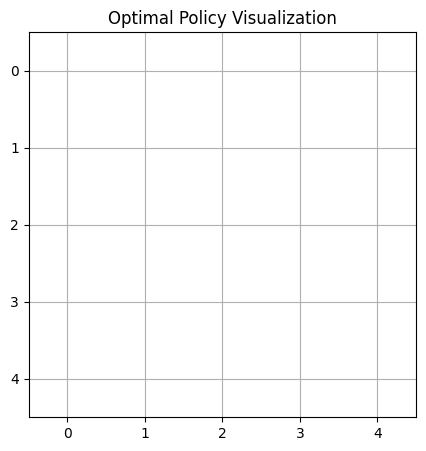



Episode 476:
Taxi starting position: 1
First customer request: B
Second customer request: D


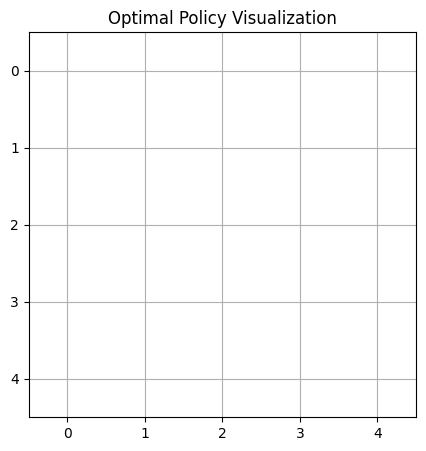



Episode 477:
Taxi starting position: 2
First customer request: D


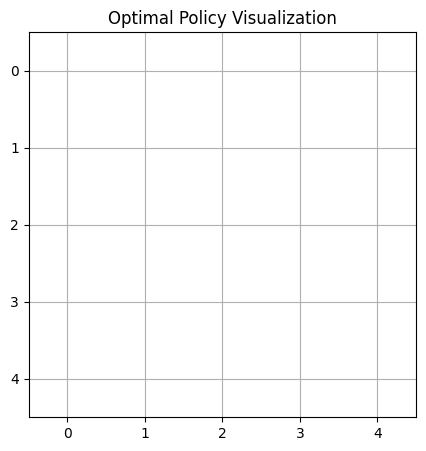



Episode 478:
Taxi starting position: 0
First customer request: A
Second customer request: A


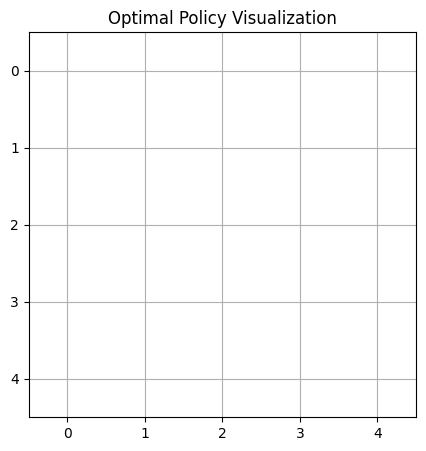



Episode 479:
Taxi starting position: 3
First customer request: A


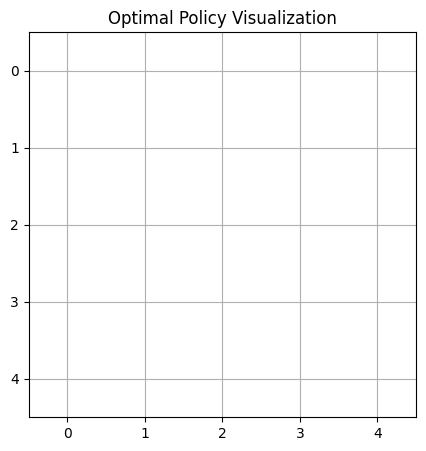



Episode 480:
Taxi starting position: 0
First customer request: D


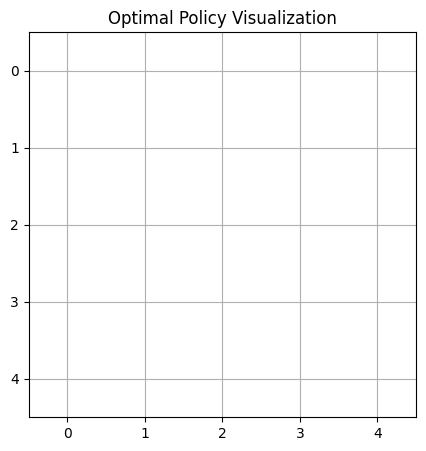



Episode 481:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


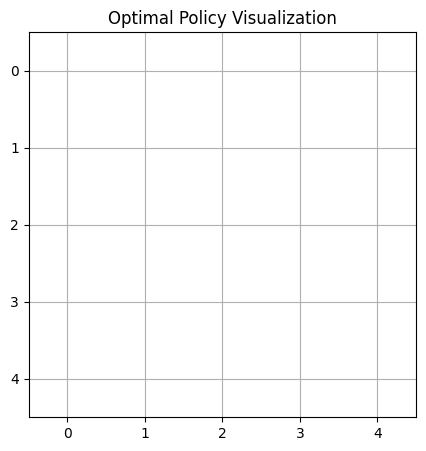



Episode 482:
Taxi starting position: 3
First customer request: B


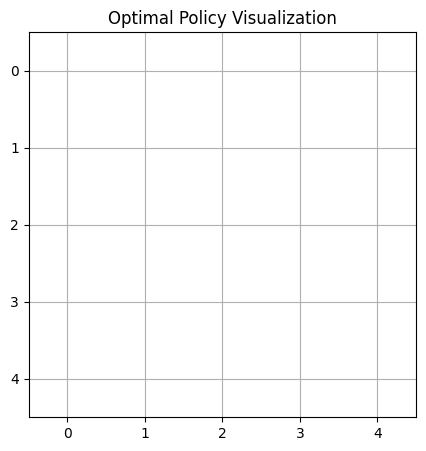



Episode 483:
Taxi starting position: 4
First customer request: A


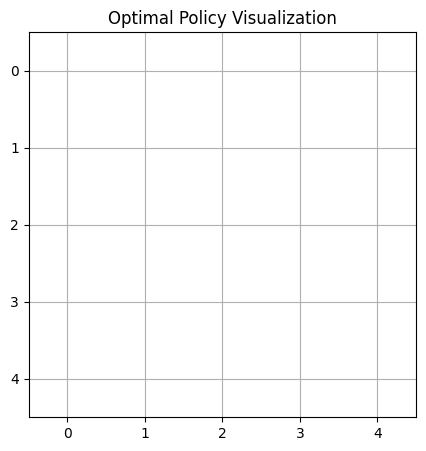



Episode 484:
Taxi starting position: 4
First customer request: B


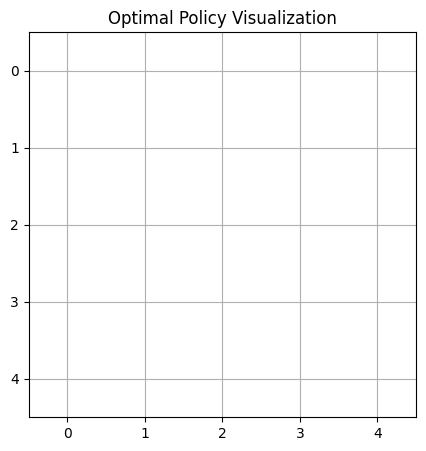



Episode 485:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


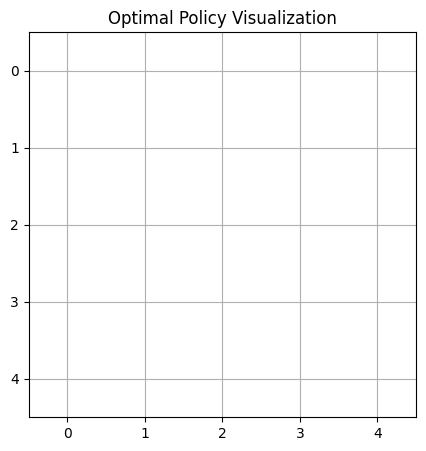



Episode 486:
Taxi starting position: 4
First customer request: C
Second customer request: D


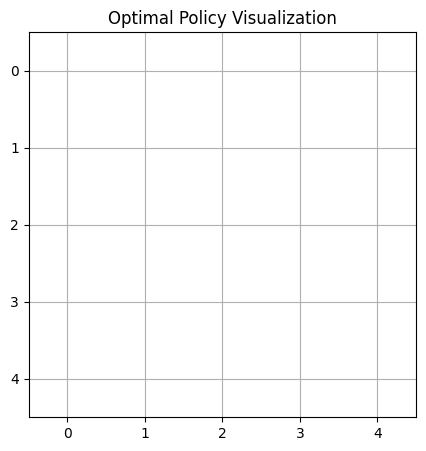



Episode 487:
Taxi starting position: 4
First customer request: A


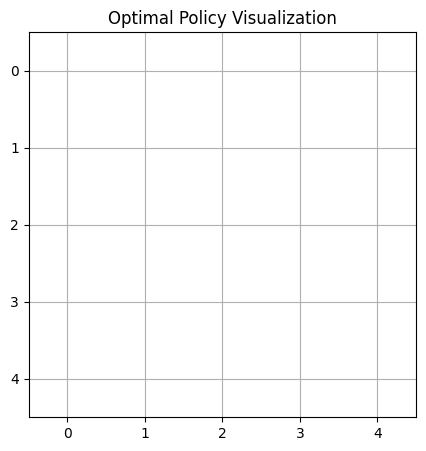



Episode 488:
Taxi starting position: 1
First customer request: A
Second customer request: A


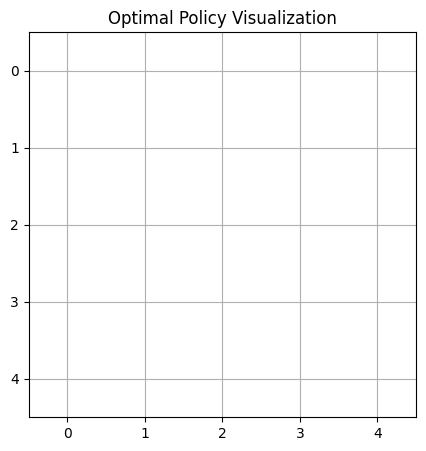



Episode 489:
Taxi starting position: 2
First customer request: C
Second customer request: B


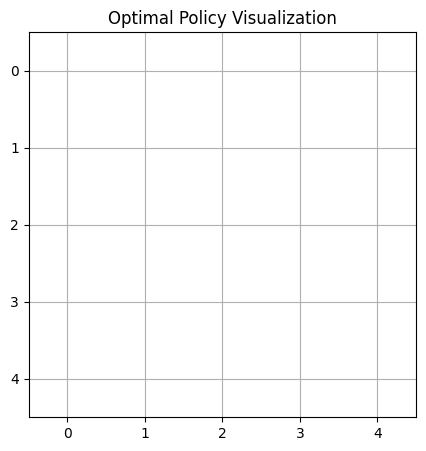



Episode 490:
Taxi starting position: 4
First customer request: A
Second customer request: B


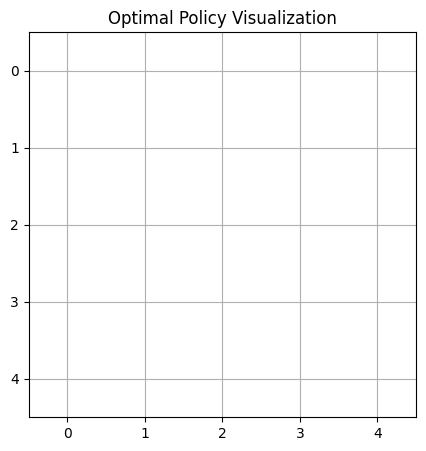



Episode 491:
Taxi starting position: 3
First customer request: B
Second customer request: B


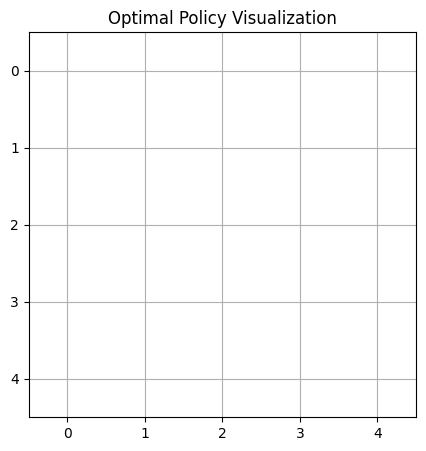



Episode 492:
Taxi starting position: 1
First customer request: B


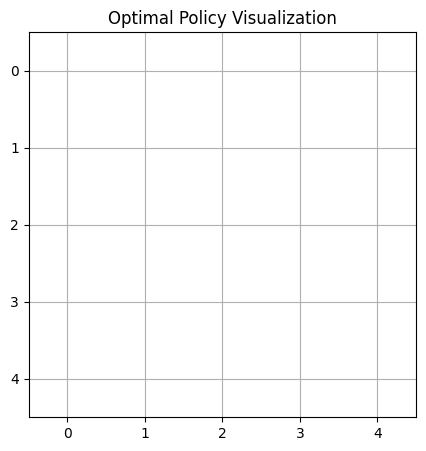



Episode 493:
Taxi starting position: 1
First customer request: C


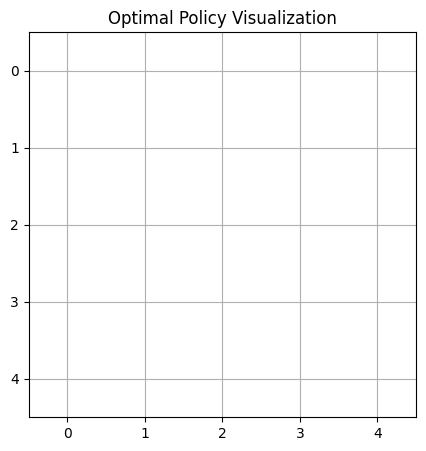



Episode 494:
Taxi starting position: 1
First customer request: B


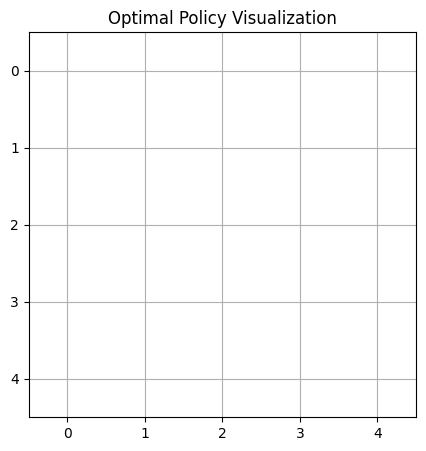



Episode 495:
Taxi starting position: 0
First customer request: D
Second customer request: D


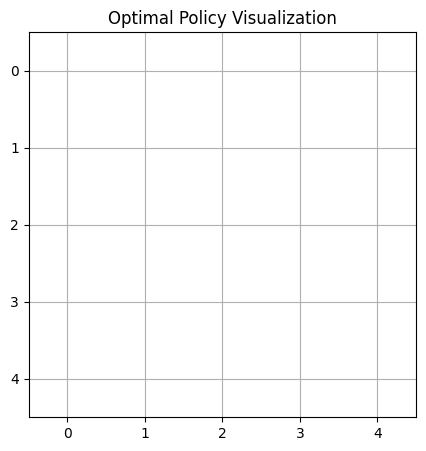



Episode 496:
Taxi starting position: 0
First customer request: D


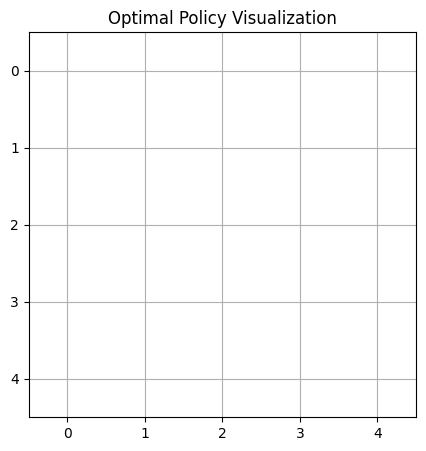



Episode 497:
Taxi starting position: 3
First customer request: D


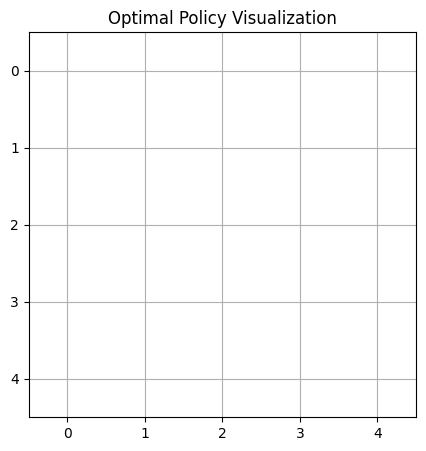



Episode 498:
Taxi starting position: 3
First customer request: A


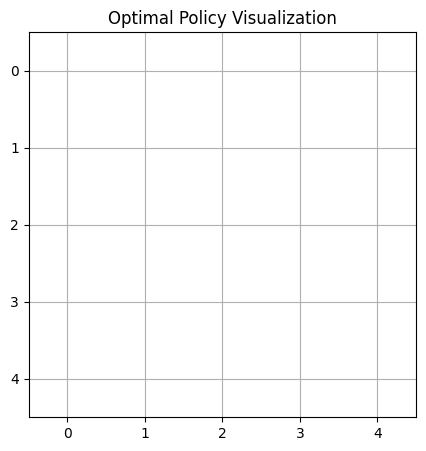



Episode 499:
Taxi starting position: 4
First customer request: A
Second customer request: A
Second customer is a premium customer.


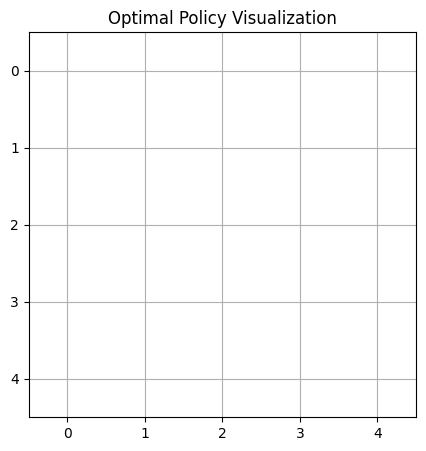



Episode 500:
Taxi starting position: 0
First customer request: D
Second customer request: B
Second customer is a premium customer.


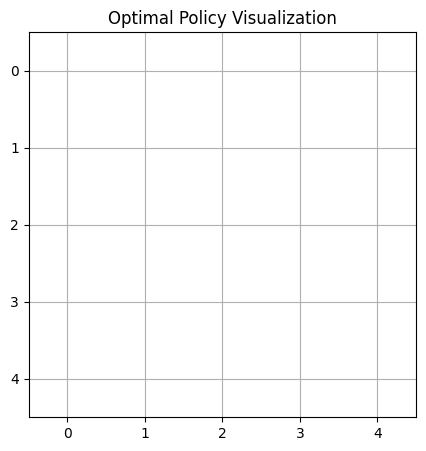



Episode 501:
Taxi starting position: 2
First customer request: B
Second customer request: C


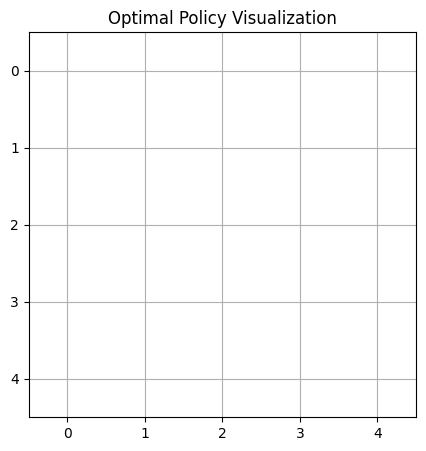



Episode 502:
Taxi starting position: 3
First customer request: A


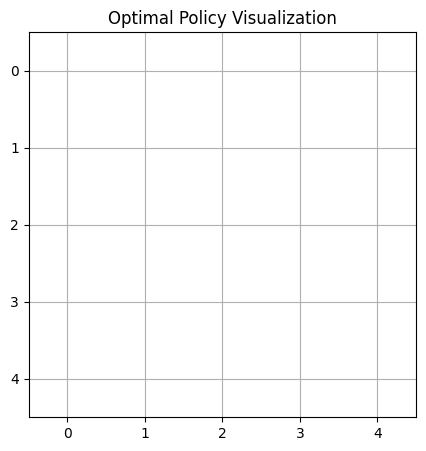



Episode 503:
Taxi starting position: 0
First customer request: C
Second customer request: C


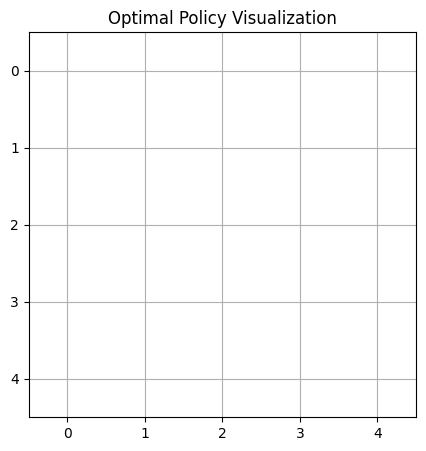



Episode 504:
Taxi starting position: 3
First customer request: A


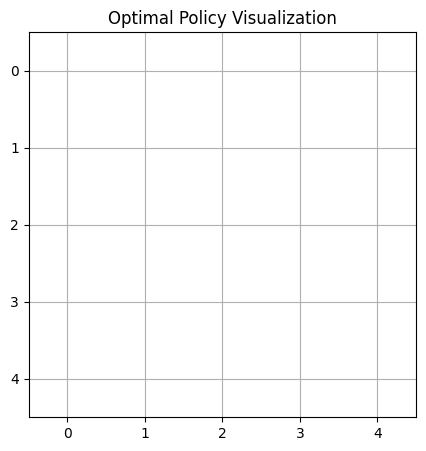



Episode 505:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


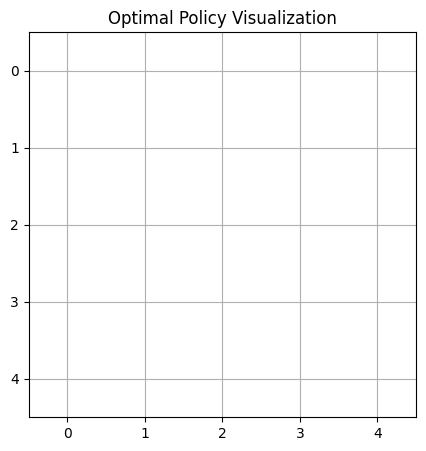



Episode 506:
Taxi starting position: 4
First customer request: A
Second customer request: C


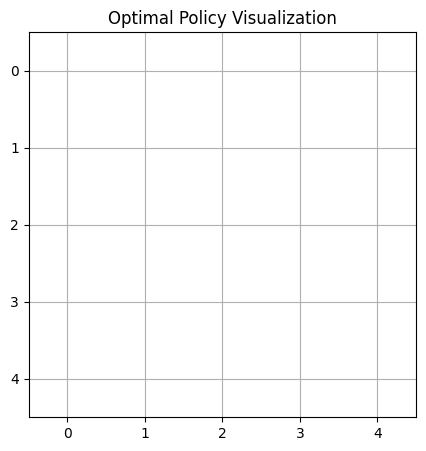



Episode 507:
Taxi starting position: 1
First customer request: C
Second customer request: D


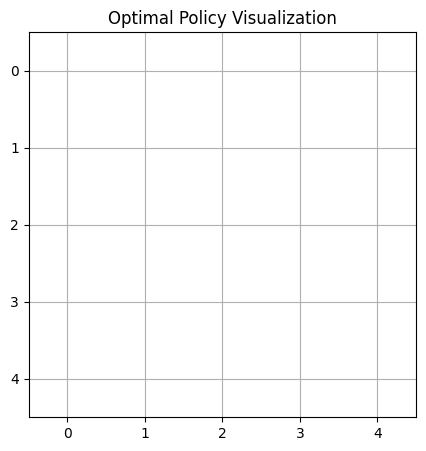



Episode 508:
Taxi starting position: 4
First customer request: D
Second customer request: A


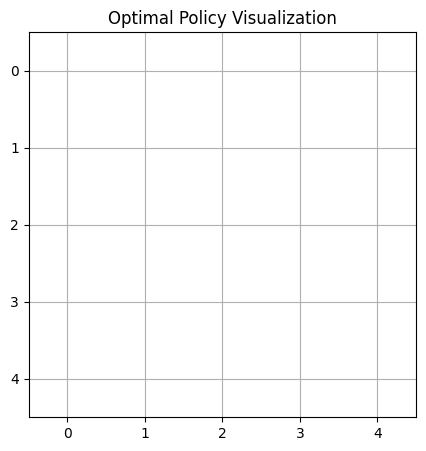



Episode 509:
Taxi starting position: 4
First customer request: C
Second customer request: A
Second customer is a premium customer.


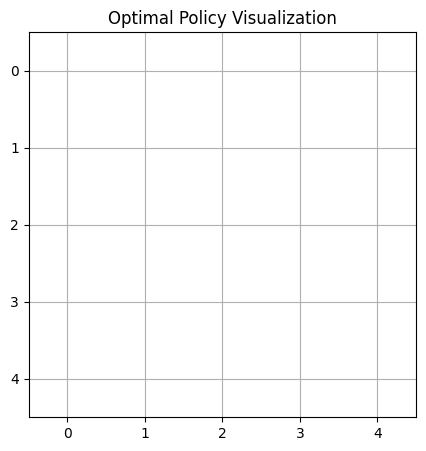



Episode 510:
Taxi starting position: 2
First customer request: B


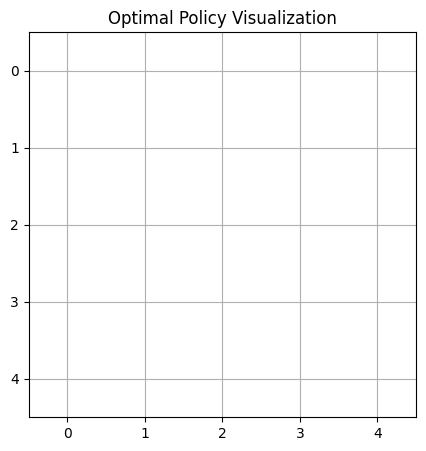



Episode 511:
Taxi starting position: 4
First customer request: D
Second customer request: D


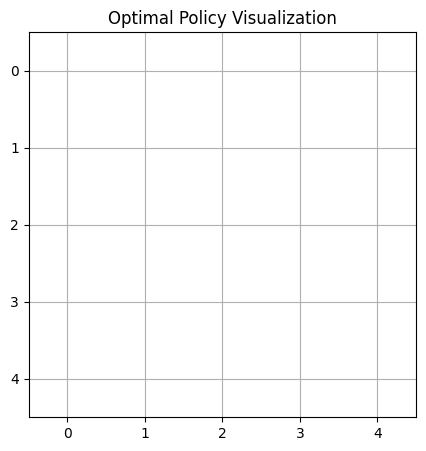



Episode 512:
Taxi starting position: 0
First customer request: D
Second customer request: A
Second customer is a premium customer.


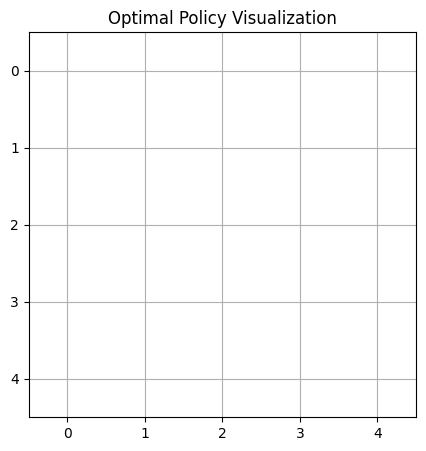



Episode 513:
Taxi starting position: 3
First customer request: A
Second customer request: D


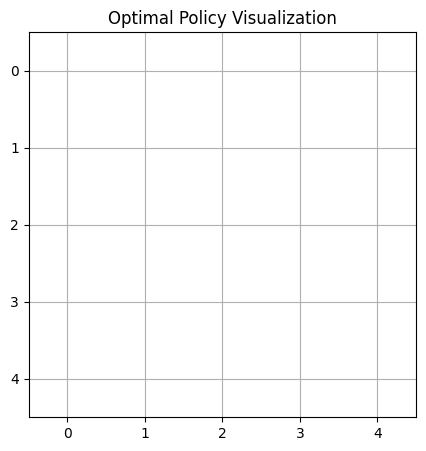



Episode 514:
Taxi starting position: 1
First customer request: D
Second customer request: C


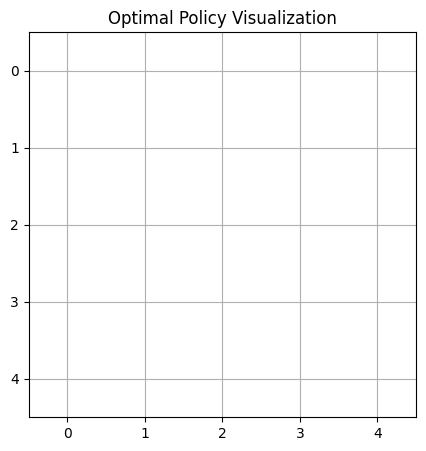



Episode 515:
Taxi starting position: 4
First customer request: B
Second customer request: C


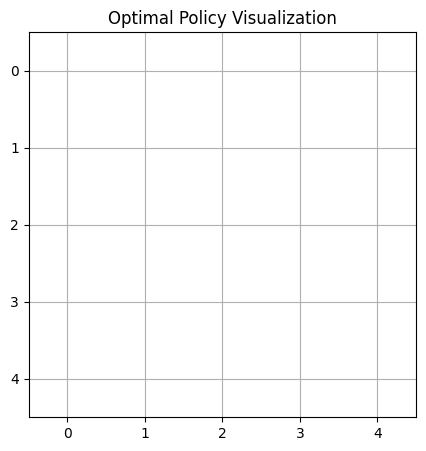



Episode 516:
Taxi starting position: 2
First customer request: C
Second customer request: C


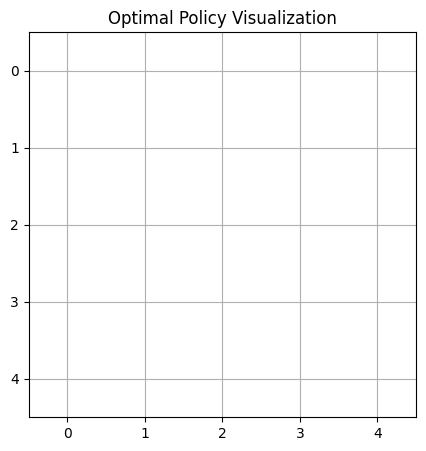



Episode 517:
Taxi starting position: 1
First customer request: A
Second customer request: B
Second customer is a premium customer.


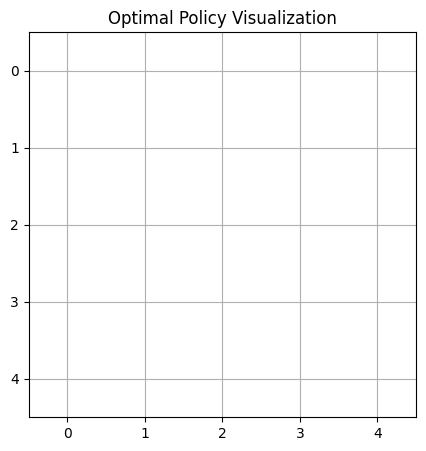



Episode 518:
Taxi starting position: 1
First customer request: A
Second customer request: A


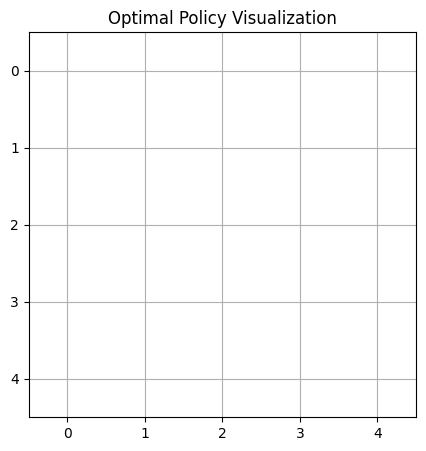



Episode 519:
Taxi starting position: 2
First customer request: A
Second customer request: A


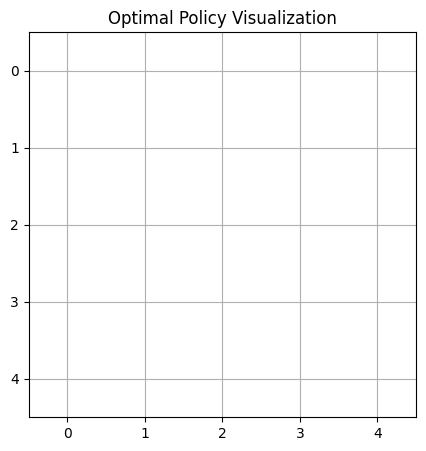



Episode 520:
Taxi starting position: 4
First customer request: D
Second customer request: B


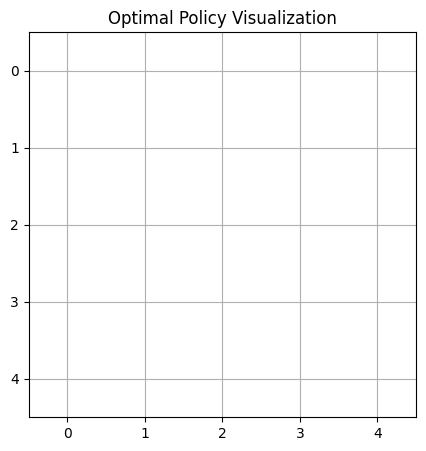



Episode 521:
Taxi starting position: 4
First customer request: D


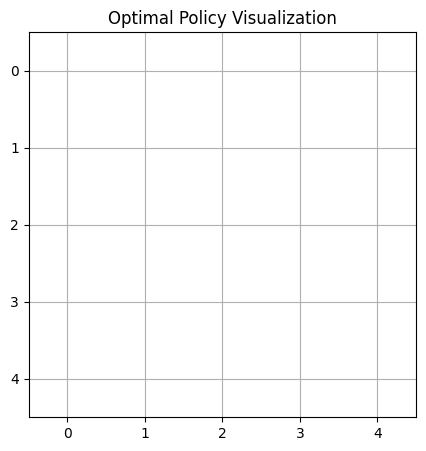



Episode 522:
Taxi starting position: 4
First customer request: C


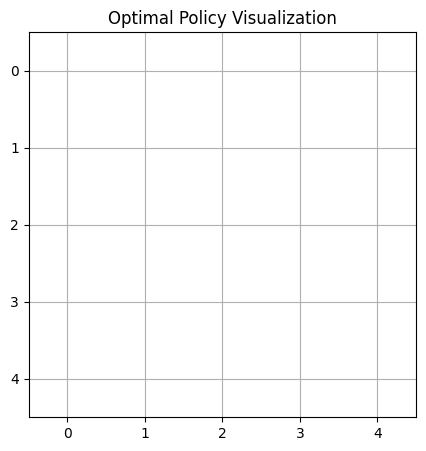



Episode 523:
Taxi starting position: 0
First customer request: C


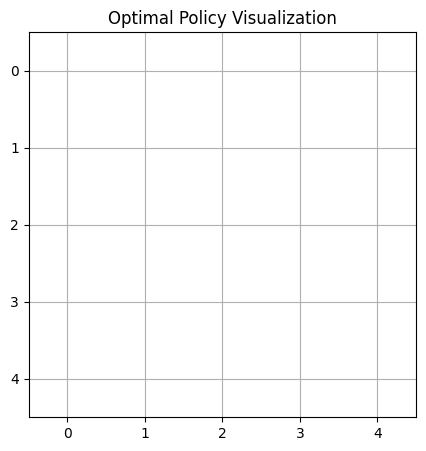



Episode 524:
Taxi starting position: 1
First customer request: D
Second customer request: C


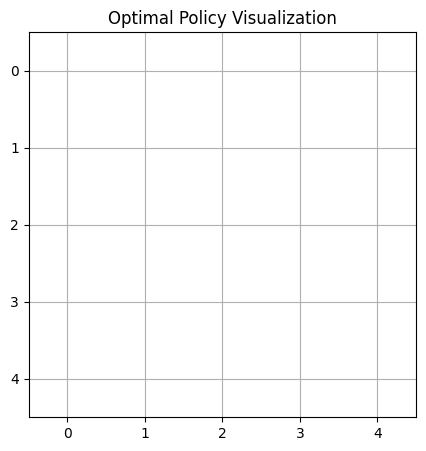



Episode 525:
Taxi starting position: 1
First customer request: C
Second customer request: B
Second customer is a premium customer.


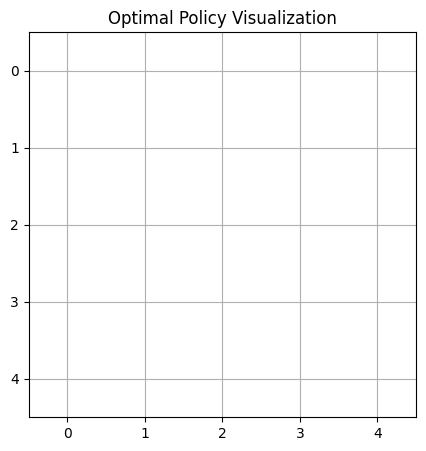



Episode 526:
Taxi starting position: 3
First customer request: D


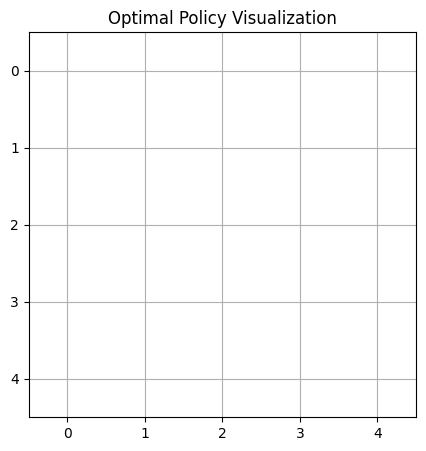



Episode 527:
Taxi starting position: 4
First customer request: D


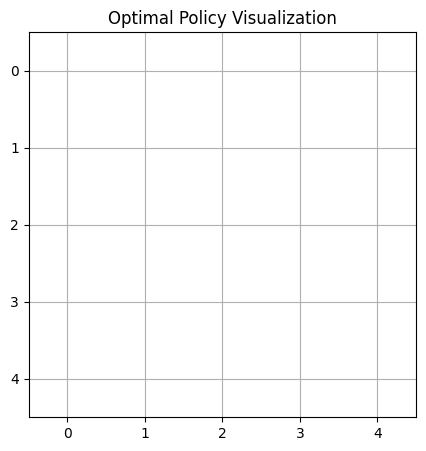



Episode 528:
Taxi starting position: 4
First customer request: D
Second customer request: D


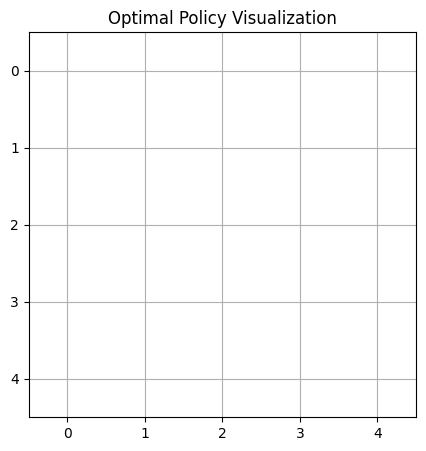



Episode 529:
Taxi starting position: 4
First customer request: B
Second customer request: B


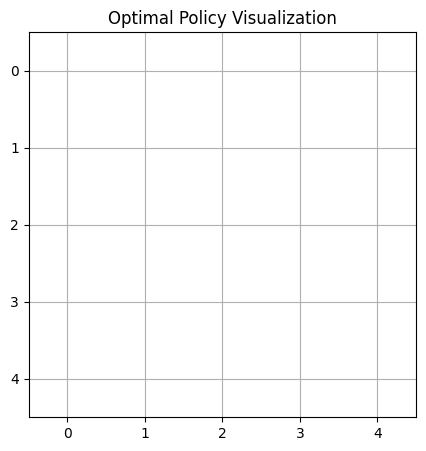



Episode 530:
Taxi starting position: 4
First customer request: A


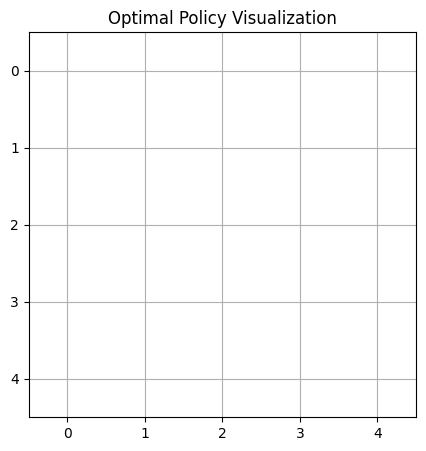



Episode 531:
Taxi starting position: 0
First customer request: A
Second customer request: D


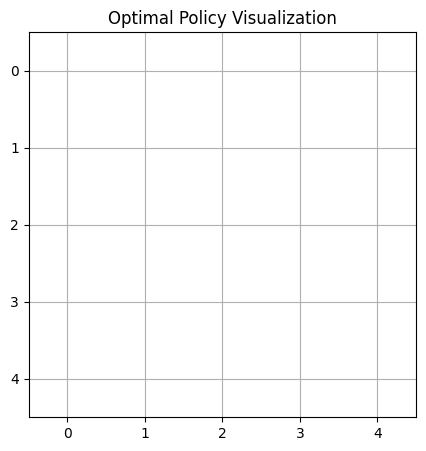



Episode 532:
Taxi starting position: 3
First customer request: B
Second customer request: B


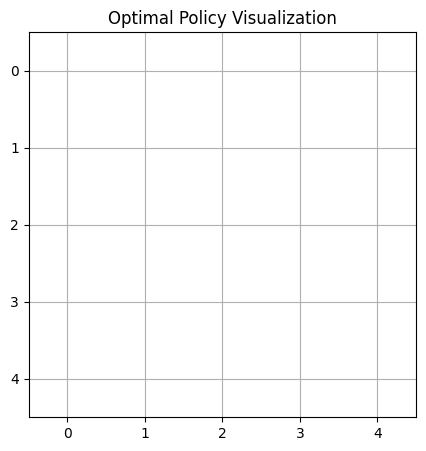



Episode 533:
Taxi starting position: 4
First customer request: B
Second customer request: B
Second customer is a premium customer.


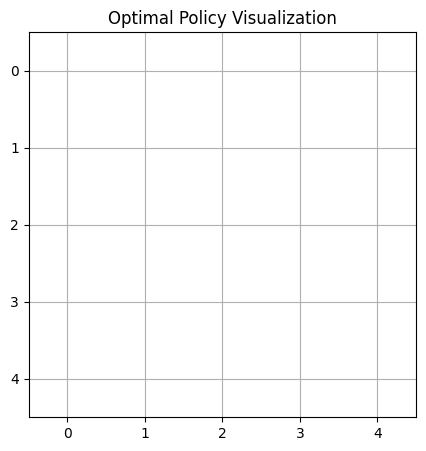



Episode 534:
Taxi starting position: 1
First customer request: D
Second customer request: B


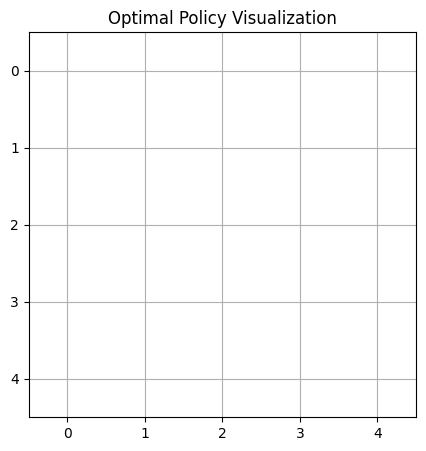



Episode 535:
Taxi starting position: 1
First customer request: D


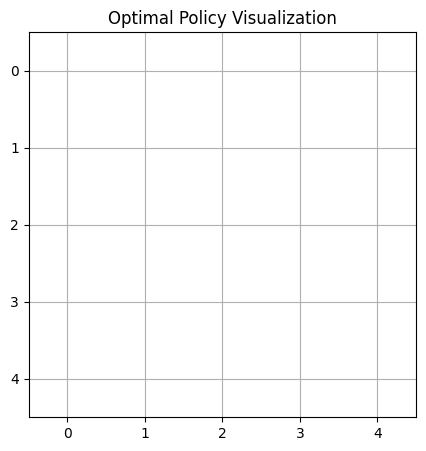



Episode 536:
Taxi starting position: 2
First customer request: B


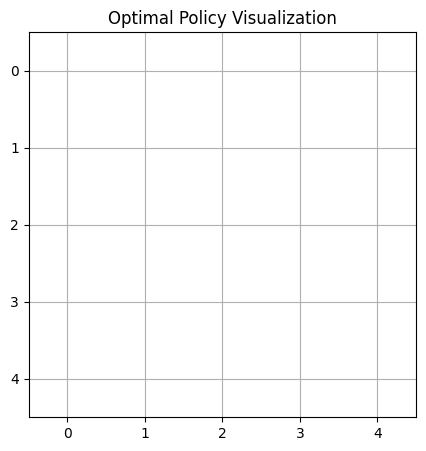



Episode 537:
Taxi starting position: 0
First customer request: C


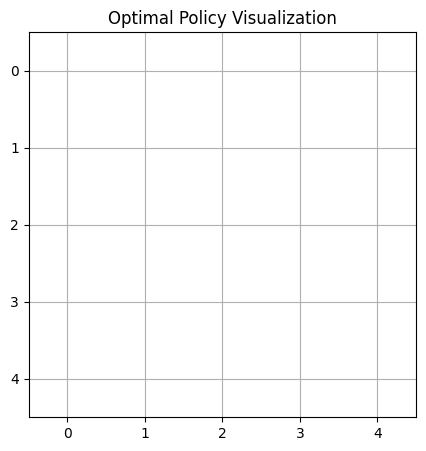



Episode 538:
Taxi starting position: 4
First customer request: B
Second customer request: B


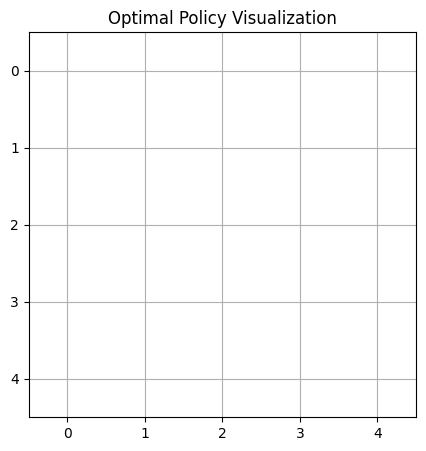



Episode 539:
Taxi starting position: 0
First customer request: B
Second customer request: C
Second customer is a premium customer.


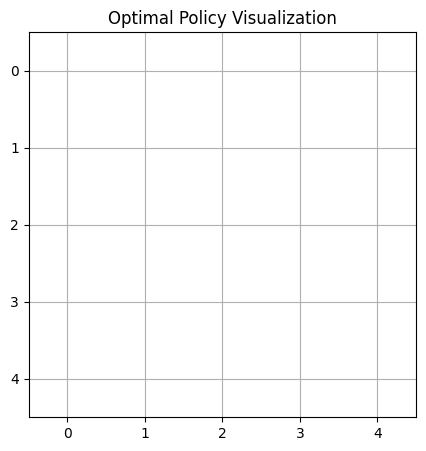



Episode 540:
Taxi starting position: 4
First customer request: D


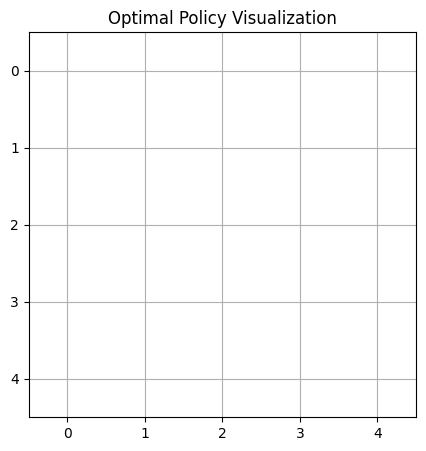



Episode 541:
Taxi starting position: 1
First customer request: D


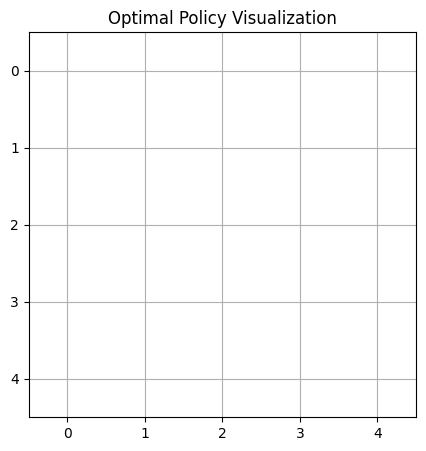



Episode 542:
Taxi starting position: 2
First customer request: D
Second customer request: A


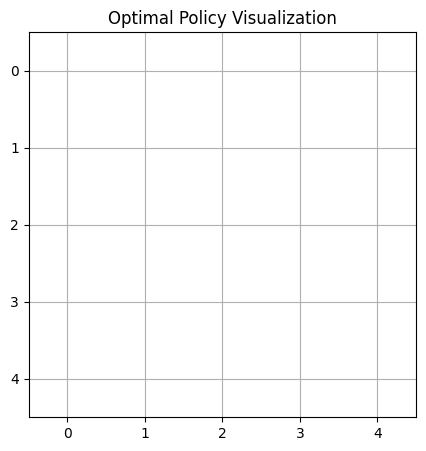



Episode 543:
Taxi starting position: 4
First customer request: A
Second customer request: D
Second customer is a premium customer.


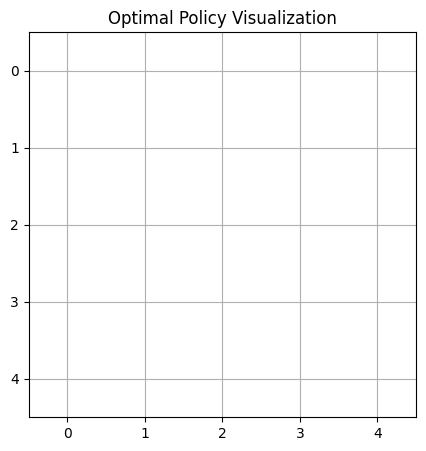



Episode 544:
Taxi starting position: 3
First customer request: D
Second customer request: A
Second customer is a premium customer.


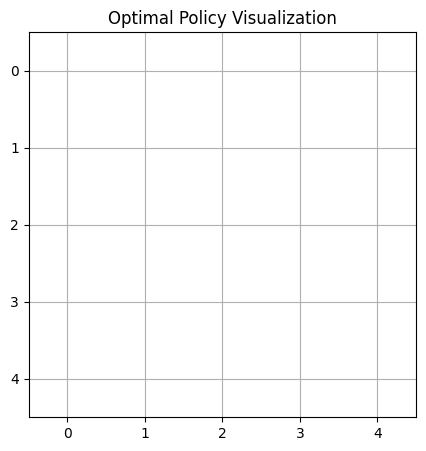



Episode 545:
Taxi starting position: 0
First customer request: B
Second customer request: C
Second customer is a premium customer.


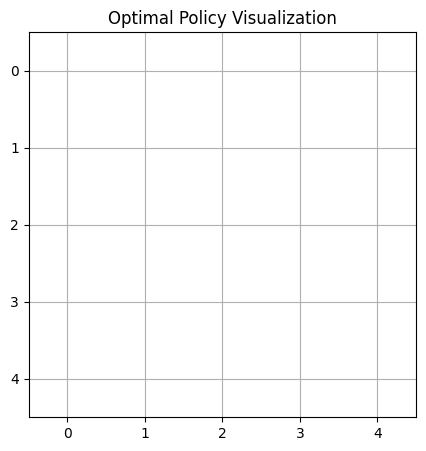



Episode 546:
Taxi starting position: 1
First customer request: D
Second customer request: D


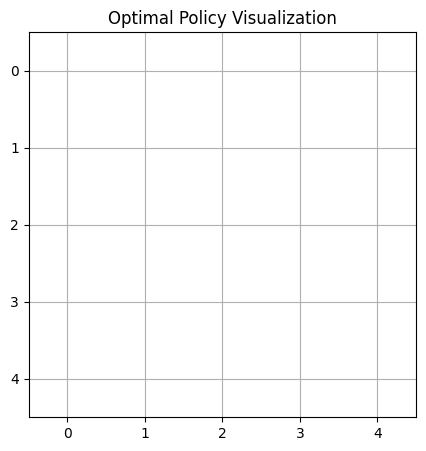



Episode 547:
Taxi starting position: 3
First customer request: A
Second customer request: A


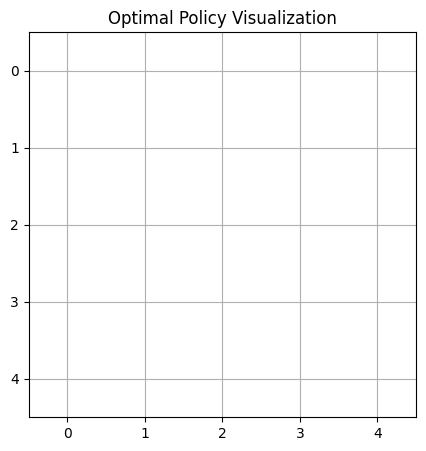



Episode 548:
Taxi starting position: 2
First customer request: D


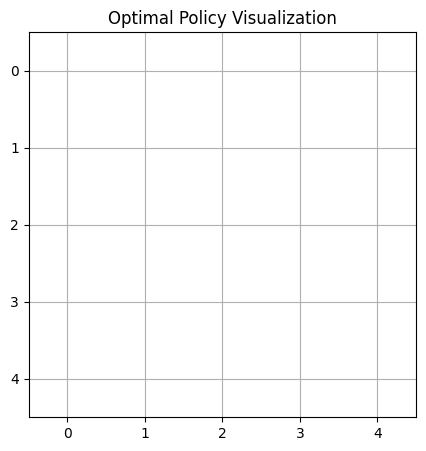



Episode 549:
Taxi starting position: 2
First customer request: C


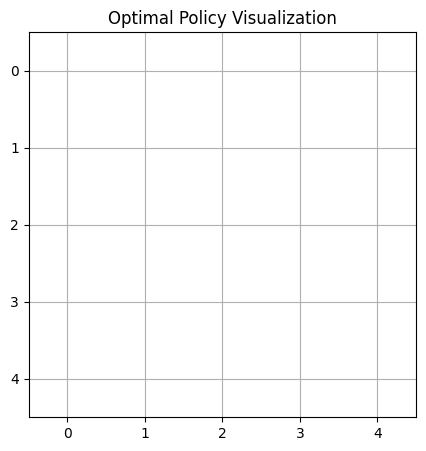



Episode 550:
Taxi starting position: 4
First customer request: D


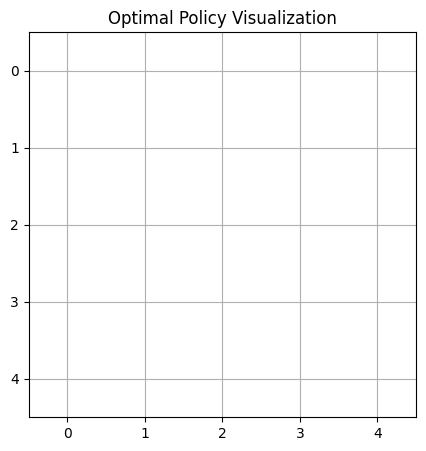



Episode 551:
Taxi starting position: 0
First customer request: B
Second customer request: A


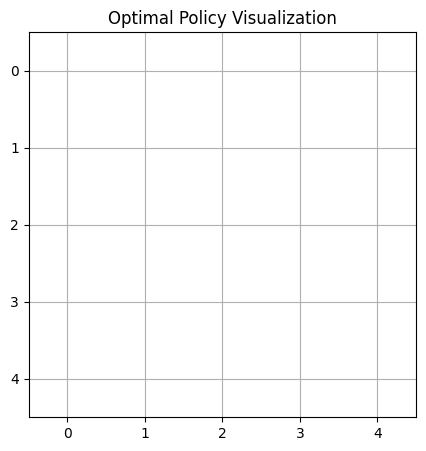



Episode 552:
Taxi starting position: 3
First customer request: A


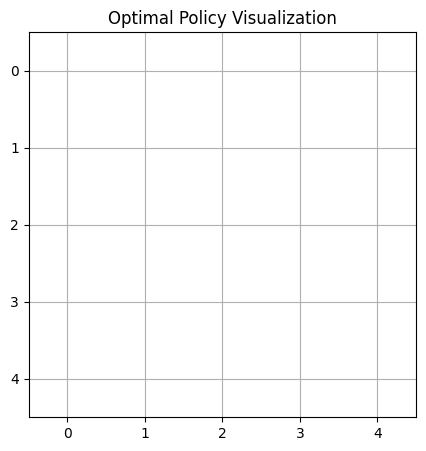



Episode 553:
Taxi starting position: 1
First customer request: C
Second customer request: C


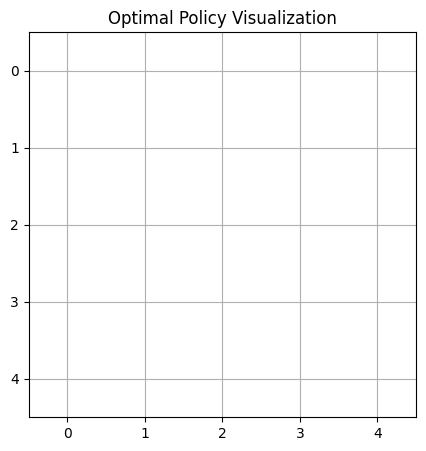



Episode 554:
Taxi starting position: 0
First customer request: B
Second customer request: A


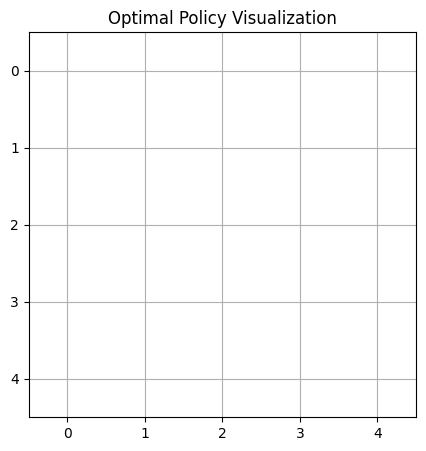



Episode 555:
Taxi starting position: 2
First customer request: D


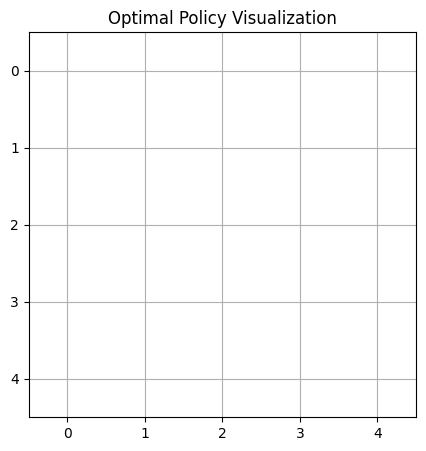



Episode 556:
Taxi starting position: 2
First customer request: B
Second customer request: C


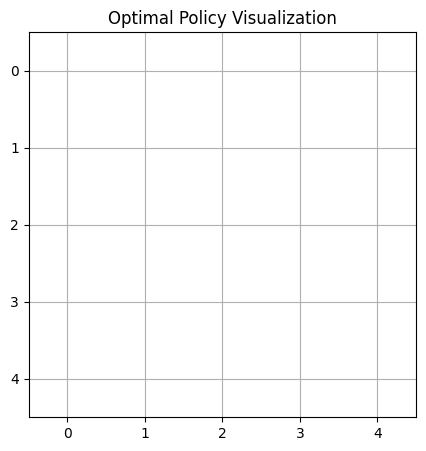



Episode 557:
Taxi starting position: 0
First customer request: B


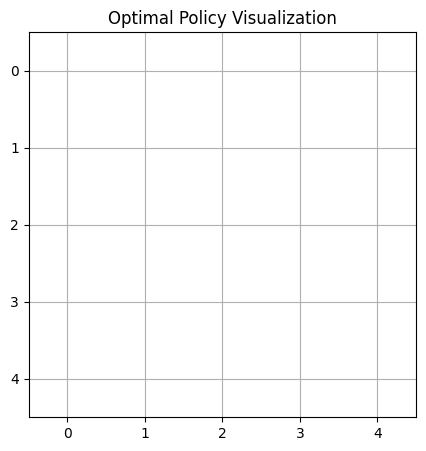



Episode 558:
Taxi starting position: 1
First customer request: D
Second customer request: D


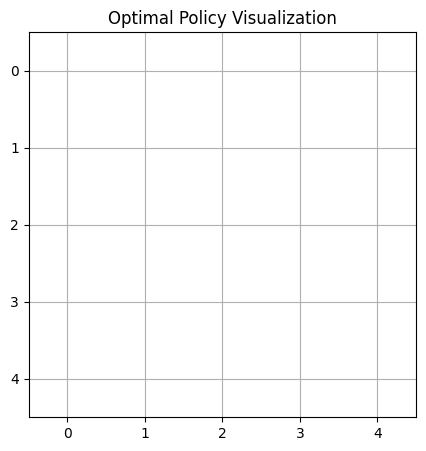



Episode 559:
Taxi starting position: 4
First customer request: C
Second customer request: D


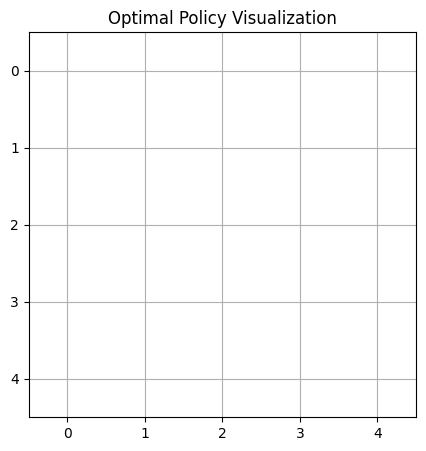



Episode 560:
Taxi starting position: 4
First customer request: B


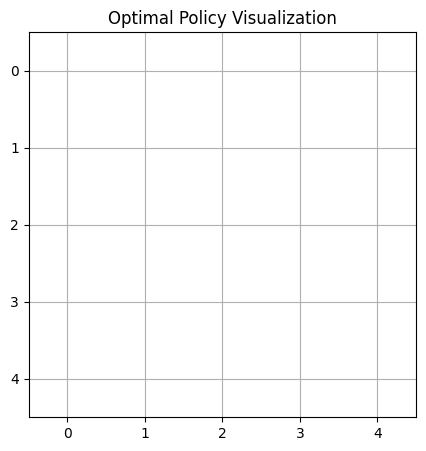



Episode 561:
Taxi starting position: 4
First customer request: C


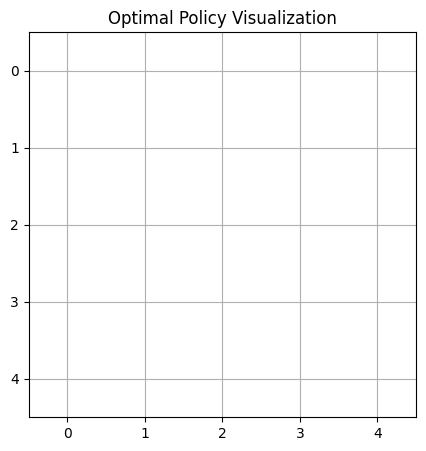



Episode 562:
Taxi starting position: 4
First customer request: C


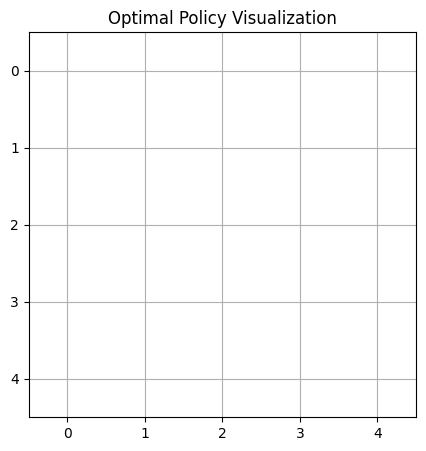



Episode 563:
Taxi starting position: 4
First customer request: C


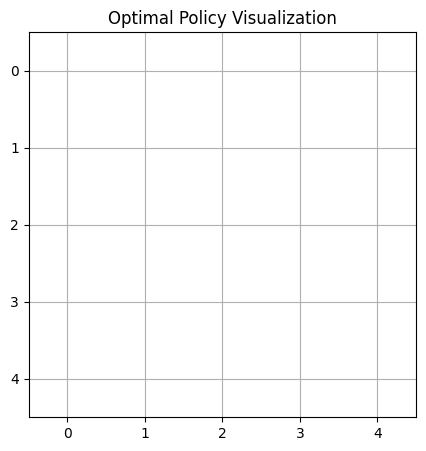



Episode 564:
Taxi starting position: 3
First customer request: A
Second customer request: D


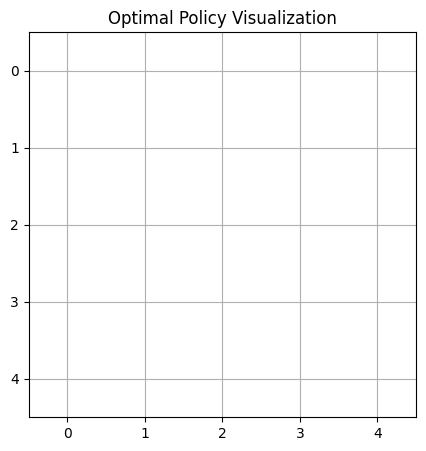



Episode 565:
Taxi starting position: 3
First customer request: B
Second customer request: B


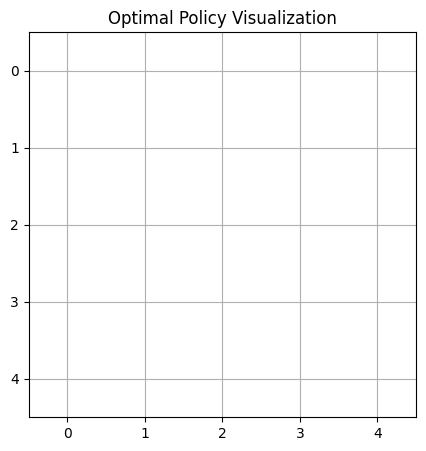



Episode 566:
Taxi starting position: 4
First customer request: A
Second customer request: A
Second customer is a premium customer.


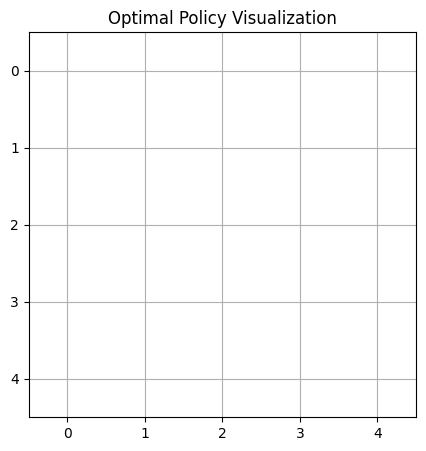



Episode 567:
Taxi starting position: 3
First customer request: C
Second customer request: C
Second customer is a premium customer.


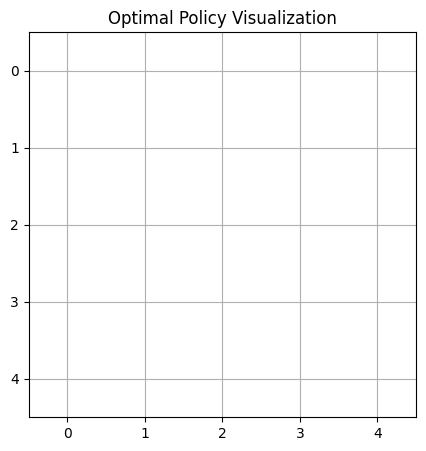



Episode 568:
Taxi starting position: 1
First customer request: B
Second customer request: B


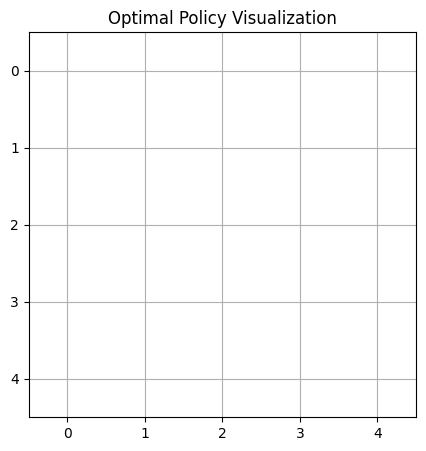



Episode 569:
Taxi starting position: 2
First customer request: B
Second customer request: D


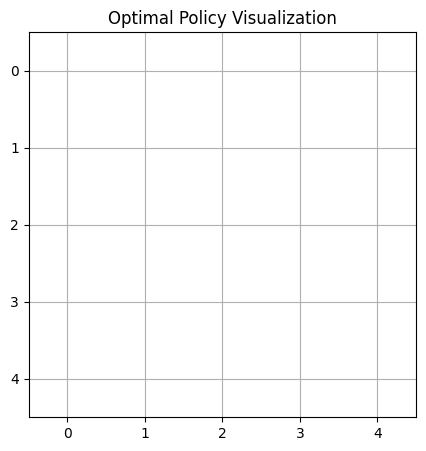



Episode 570:
Taxi starting position: 4
First customer request: A
Second customer request: A
Second customer is a premium customer.


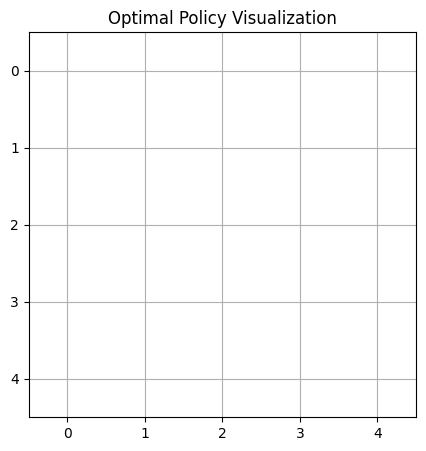



Episode 571:
Taxi starting position: 2
First customer request: C
Second customer request: A


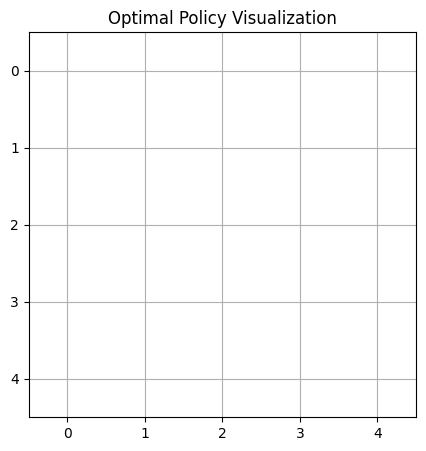



Episode 572:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


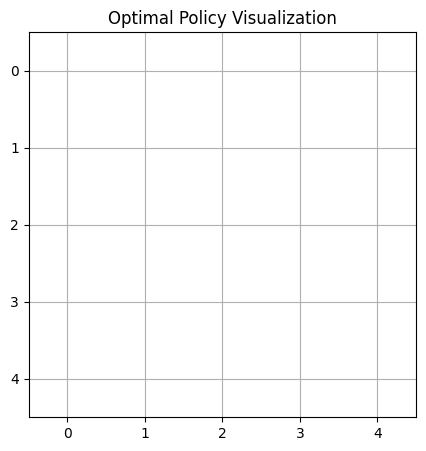



Episode 573:
Taxi starting position: 0
First customer request: D


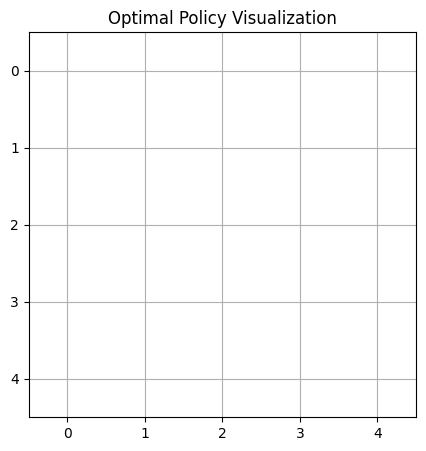



Episode 574:
Taxi starting position: 1
First customer request: A
Second customer request: C


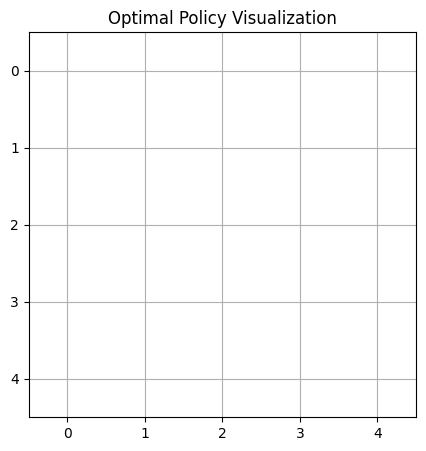



Episode 575:
Taxi starting position: 4
First customer request: D
Second customer request: B


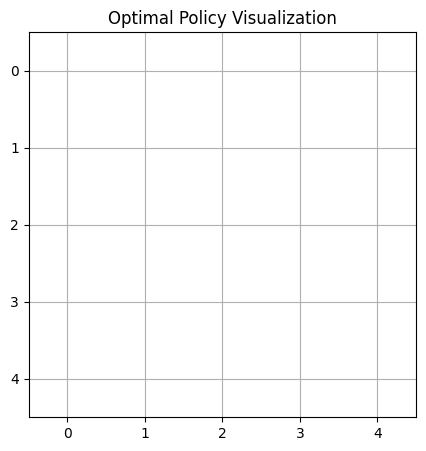



Episode 576:
Taxi starting position: 3
First customer request: B


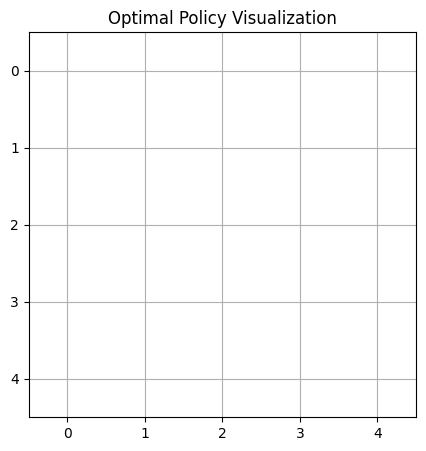



Episode 577:
Taxi starting position: 4
First customer request: A
Second customer request: B
Second customer is a premium customer.


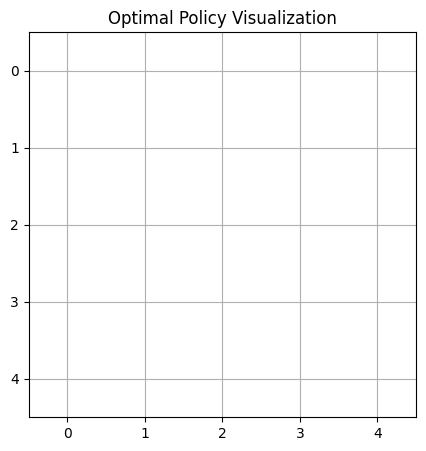



Episode 578:
Taxi starting position: 1
First customer request: D
Second customer request: B


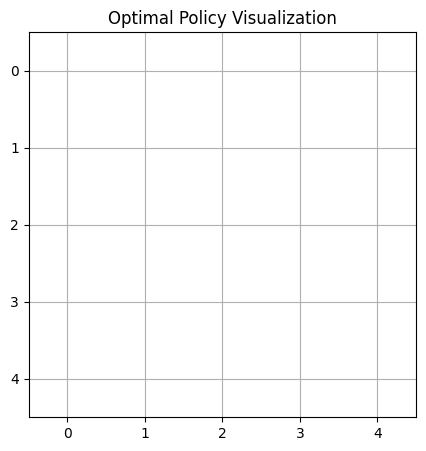



Episode 579:
Taxi starting position: 0
First customer request: A


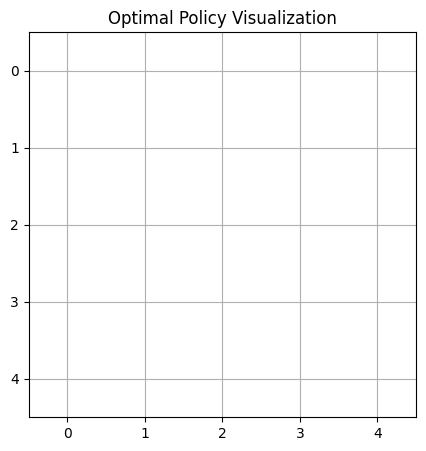



Episode 580:
Taxi starting position: 4
First customer request: B


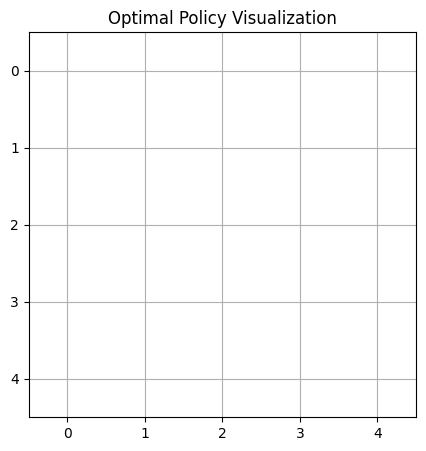



Episode 581:
Taxi starting position: 2
First customer request: D


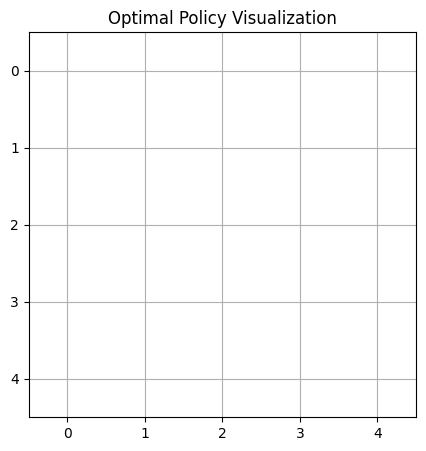



Episode 582:
Taxi starting position: 4
First customer request: A
Second customer request: D
Second customer is a premium customer.


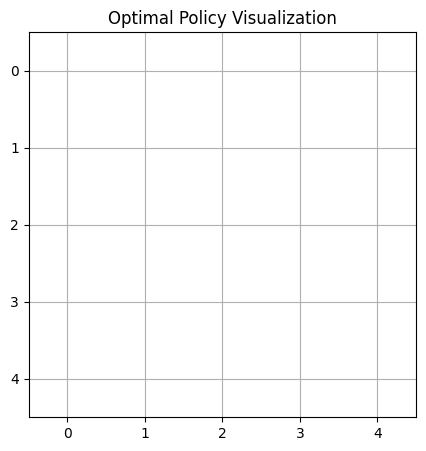



Episode 583:
Taxi starting position: 0
First customer request: D
Second customer request: B


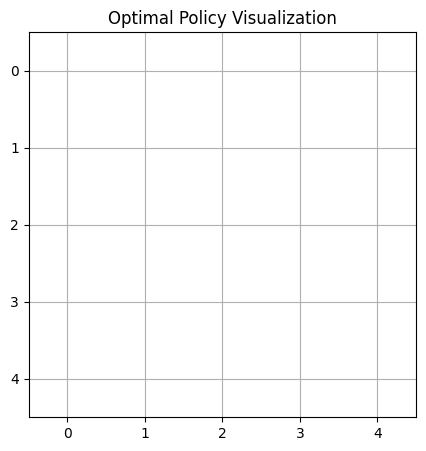



Episode 584:
Taxi starting position: 4
First customer request: D
Second customer request: A
Second customer is a premium customer.


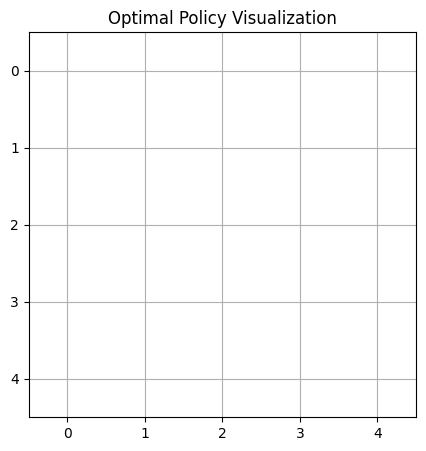



Episode 585:
Taxi starting position: 4
First customer request: C
Second customer request: B


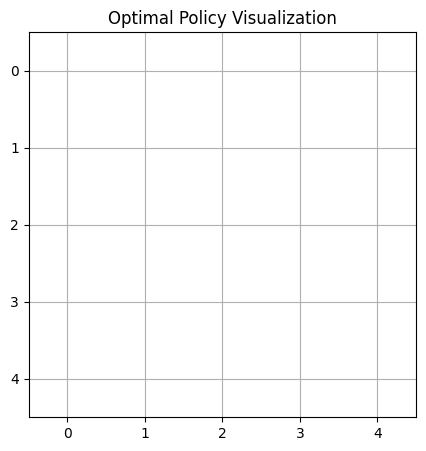



Episode 586:
Taxi starting position: 3
First customer request: B


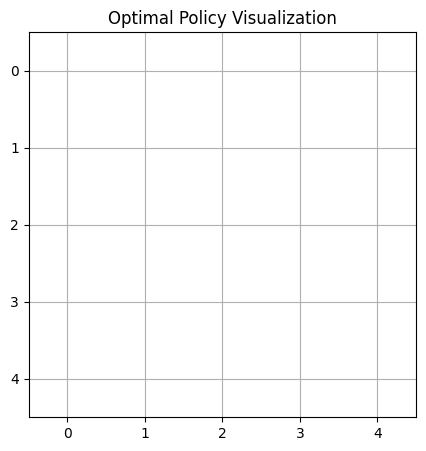



Episode 587:
Taxi starting position: 3
First customer request: A
Second customer request: D


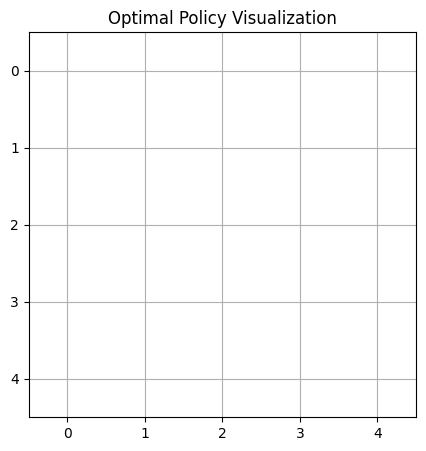



Episode 588:
Taxi starting position: 3
First customer request: B
Second customer request: C


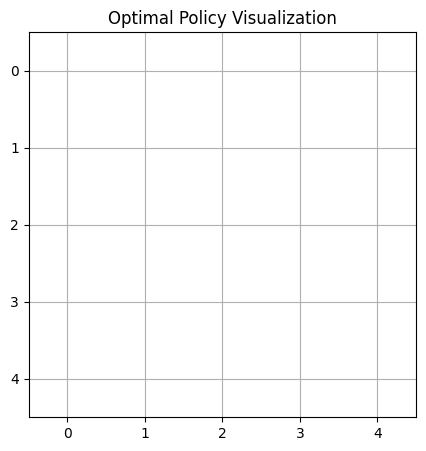



Episode 589:
Taxi starting position: 3
First customer request: C


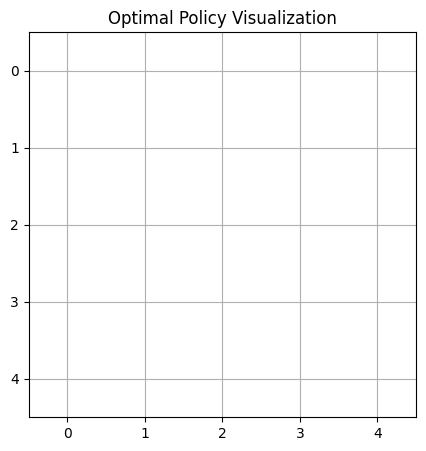



Episode 590:
Taxi starting position: 0
First customer request: A
Second customer request: B
Second customer is a premium customer.


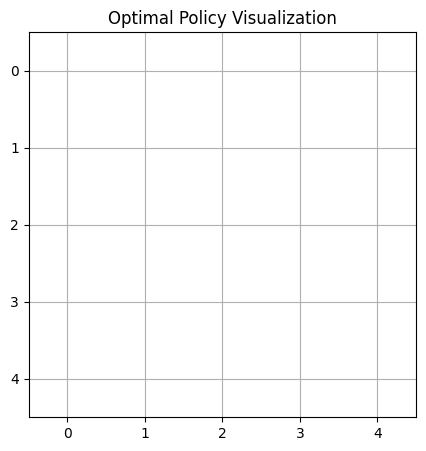



Episode 591:
Taxi starting position: 0
First customer request: A
Second customer request: B
Second customer is a premium customer.


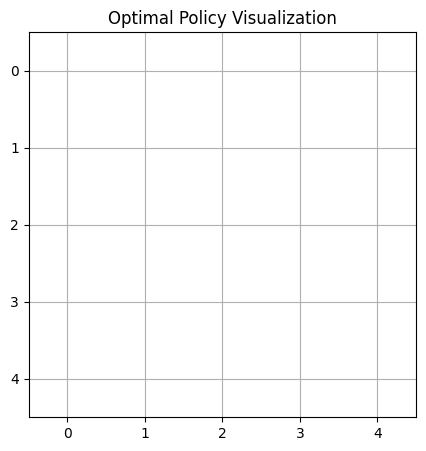



Episode 592:
Taxi starting position: 2
First customer request: D
Second customer request: A


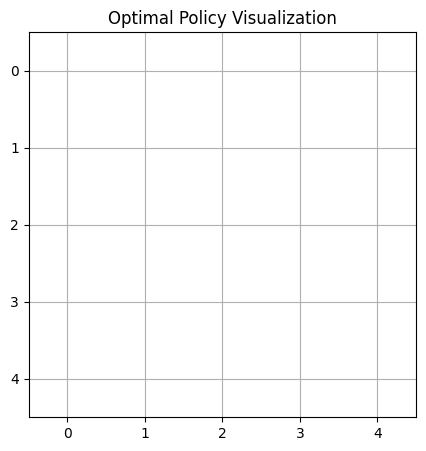



Episode 593:
Taxi starting position: 3
First customer request: C


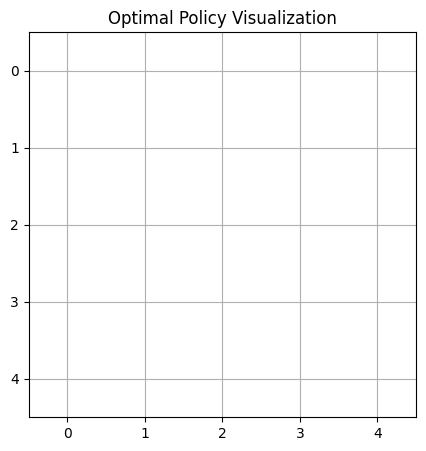



Episode 594:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


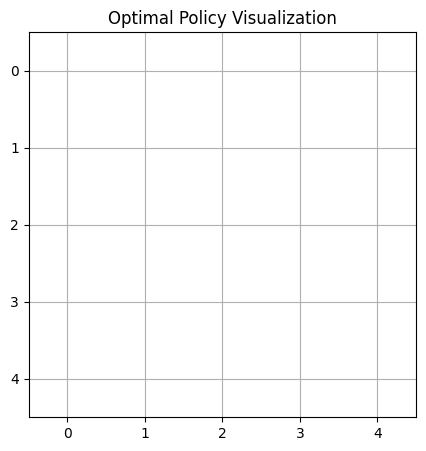



Episode 595:
Taxi starting position: 4
First customer request: A
Second customer request: D
Second customer is a premium customer.


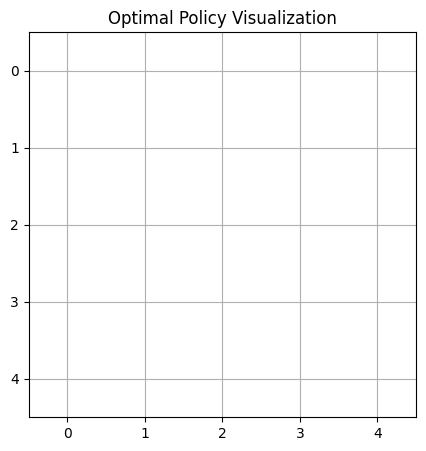



Episode 596:
Taxi starting position: 0
First customer request: D


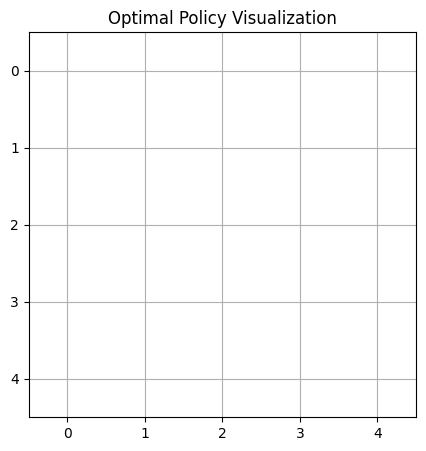



Episode 597:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


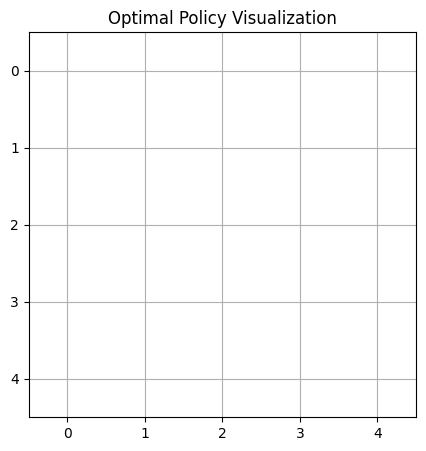



Episode 598:
Taxi starting position: 0
First customer request: D


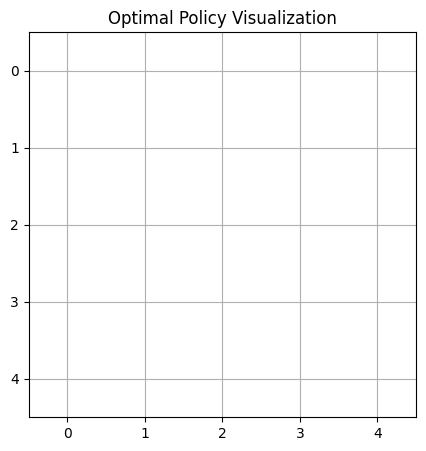



Episode 599:
Taxi starting position: 0
First customer request: C
Second customer request: C


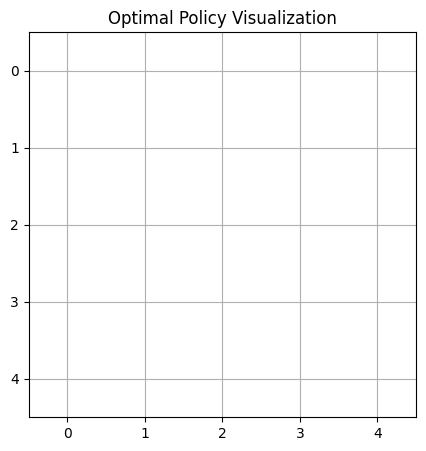



Episode 600:
Taxi starting position: 2
First customer request: B


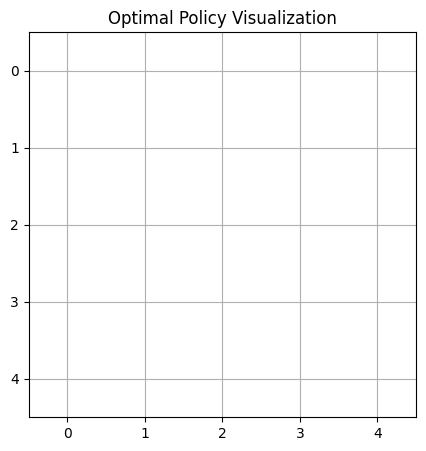



Episode 601:
Taxi starting position: 0
First customer request: C


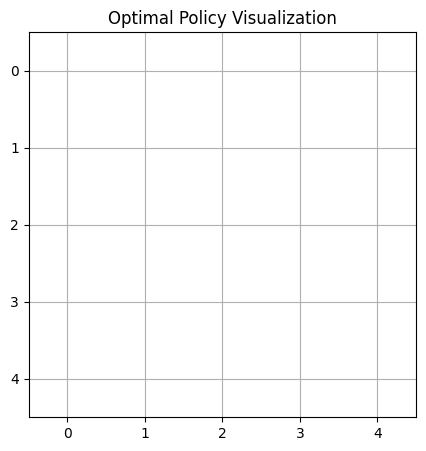



Episode 602:
Taxi starting position: 3
First customer request: C
Second customer request: A
Second customer is a premium customer.


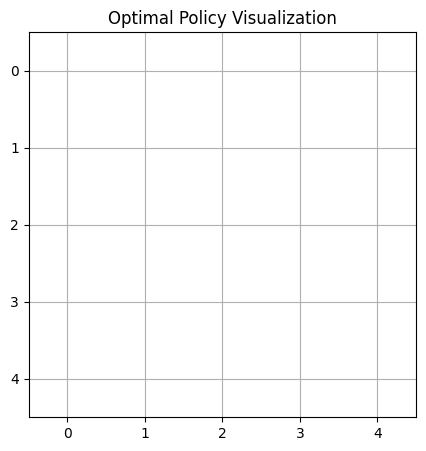



Episode 603:
Taxi starting position: 0
First customer request: B
Second customer request: C


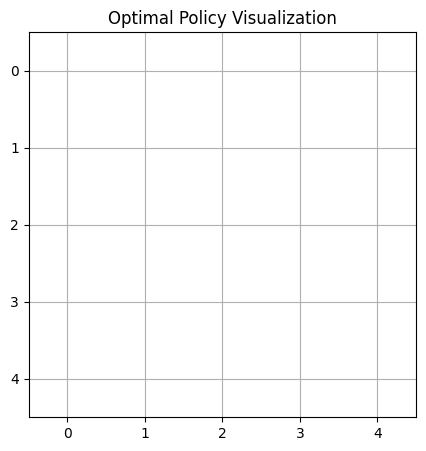



Episode 604:
Taxi starting position: 0
First customer request: A
Second customer request: D


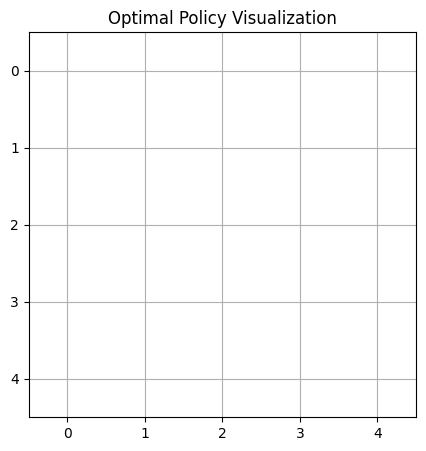



Episode 605:
Taxi starting position: 4
First customer request: D
Second customer request: A


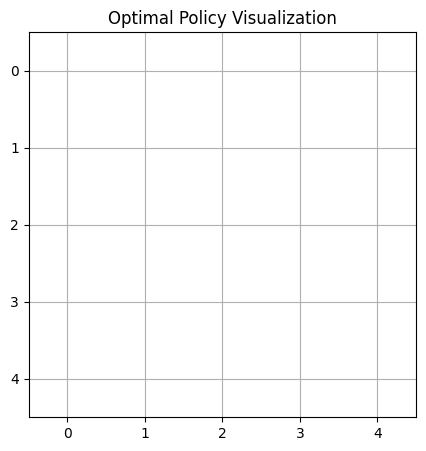



Episode 606:
Taxi starting position: 0
First customer request: A


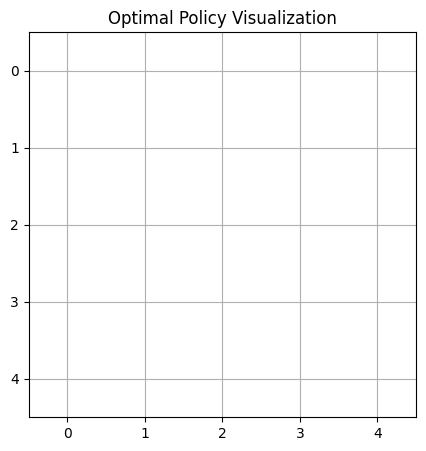



Episode 607:
Taxi starting position: 4
First customer request: C
Second customer request: D


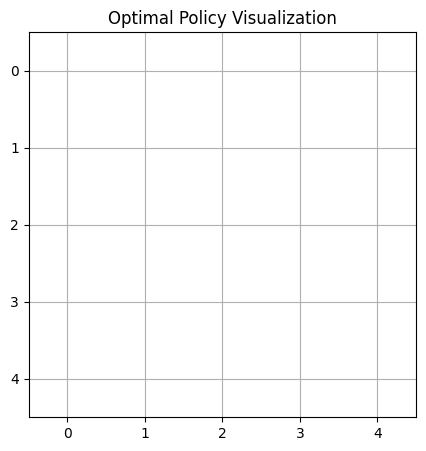



Episode 608:
Taxi starting position: 3
First customer request: B
Second customer request: D


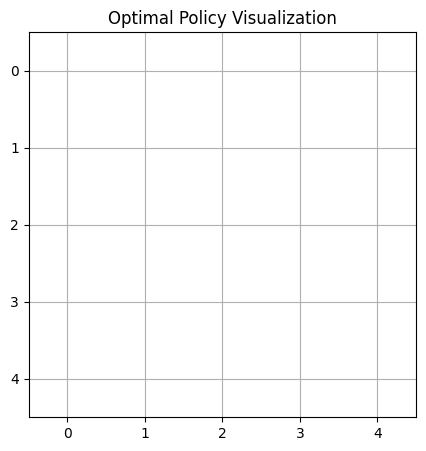



Episode 609:
Taxi starting position: 0
First customer request: B


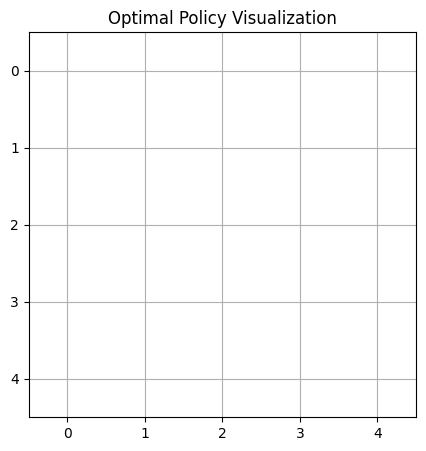



Episode 610:
Taxi starting position: 2
First customer request: D
Second customer request: B


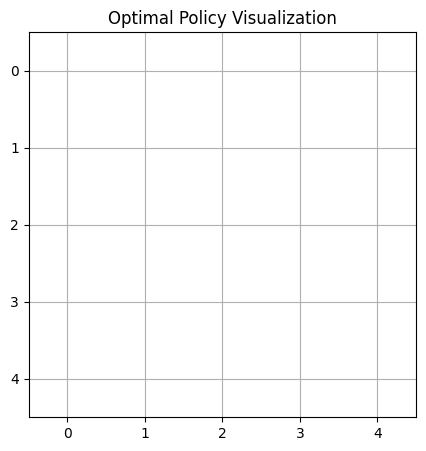



Episode 611:
Taxi starting position: 2
First customer request: A
Second customer request: B


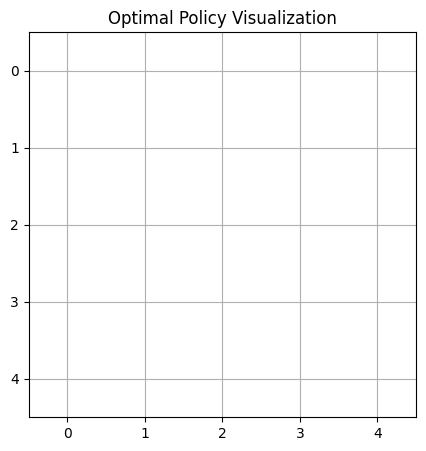



Episode 612:
Taxi starting position: 1
First customer request: B
Second customer request: A


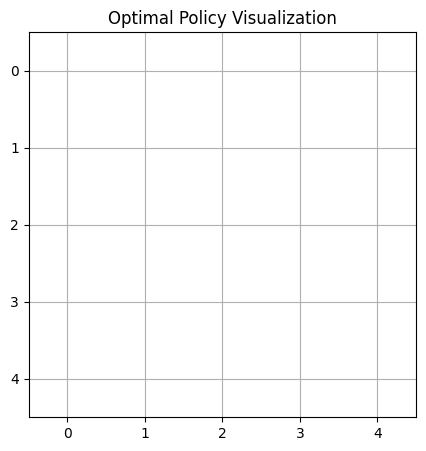



Episode 613:
Taxi starting position: 4
First customer request: D
Second customer request: D
Second customer is a premium customer.


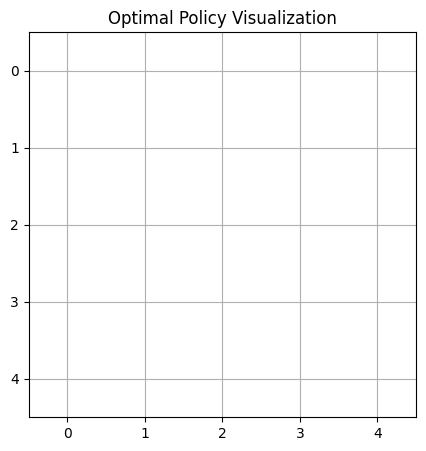



Episode 614:
Taxi starting position: 0
First customer request: D
Second customer request: A


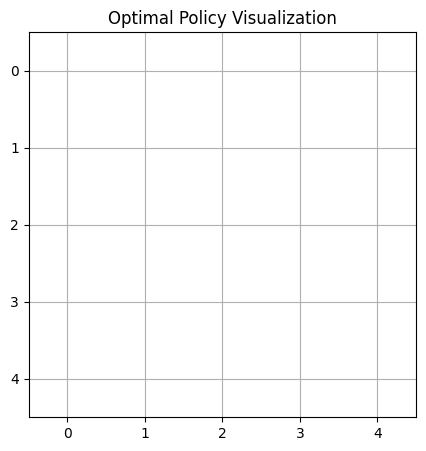



Episode 615:
Taxi starting position: 4
First customer request: C


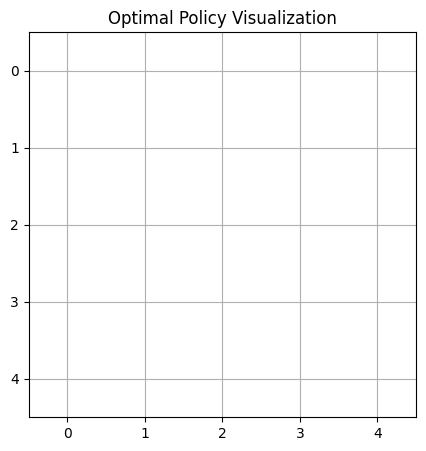



Episode 616:
Taxi starting position: 3
First customer request: A
Second customer request: A


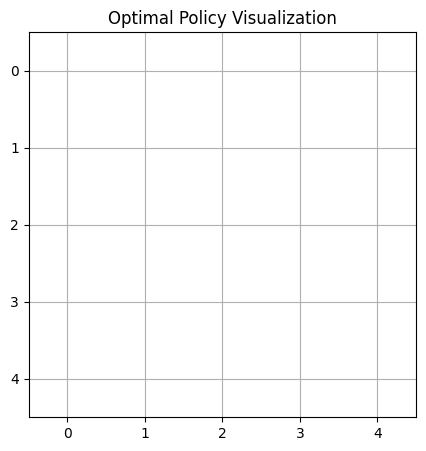



Episode 617:
Taxi starting position: 3
First customer request: C
Second customer request: B


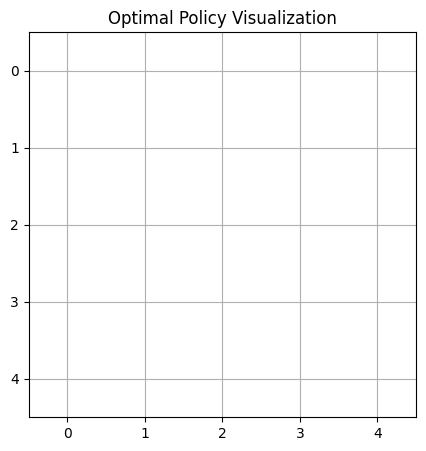



Episode 618:
Taxi starting position: 2
First customer request: D


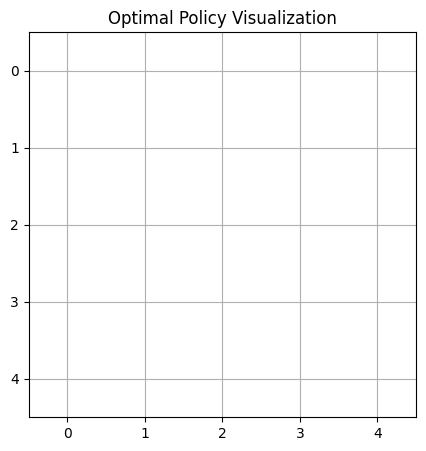



Episode 619:
Taxi starting position: 3
First customer request: B


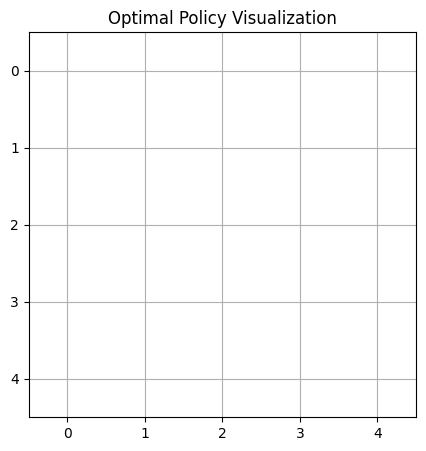



Episode 620:
Taxi starting position: 3
First customer request: B


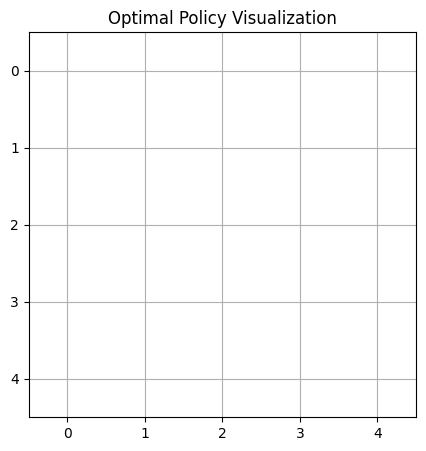



Episode 621:
Taxi starting position: 2
First customer request: C


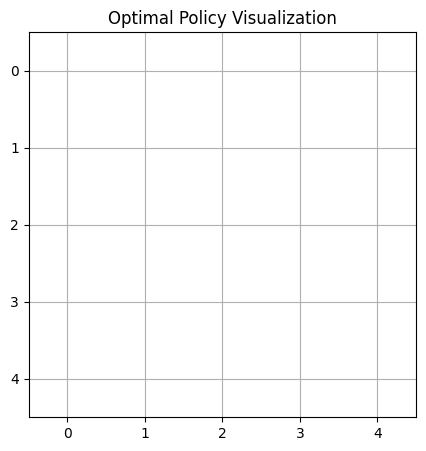



Episode 622:
Taxi starting position: 3
First customer request: A


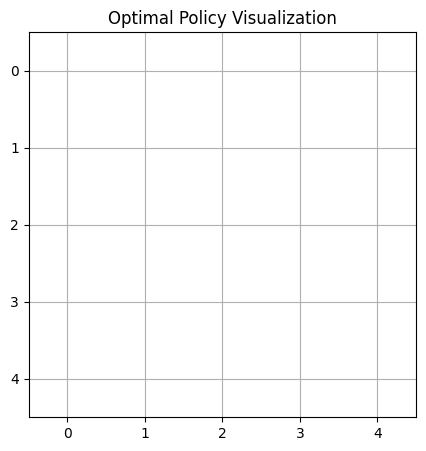



Episode 623:
Taxi starting position: 3
First customer request: B


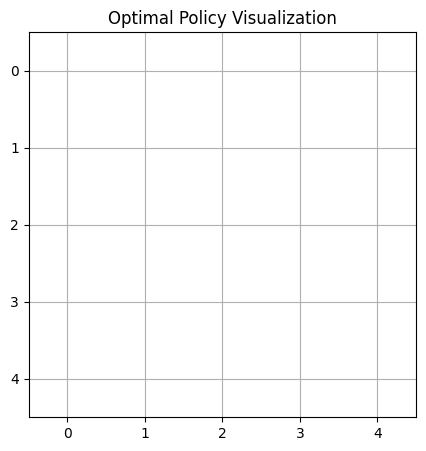



Episode 624:
Taxi starting position: 2
First customer request: C
Second customer request: C
Second customer is a premium customer.


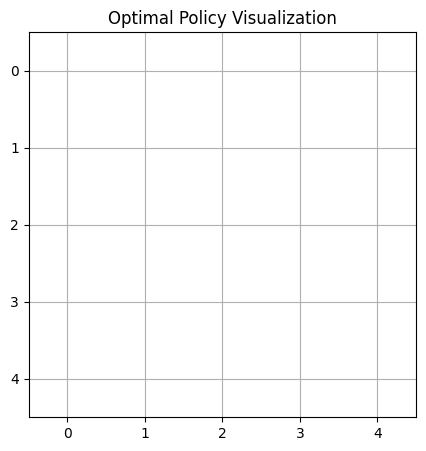



Episode 625:
Taxi starting position: 3
First customer request: D


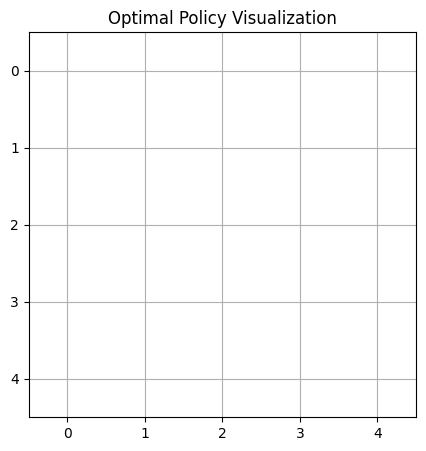



Episode 626:
Taxi starting position: 2
First customer request: B


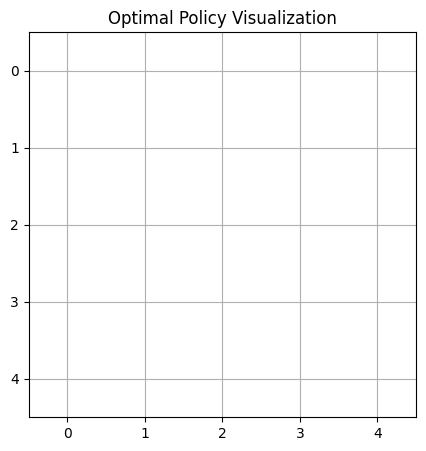



Episode 627:
Taxi starting position: 3
First customer request: C


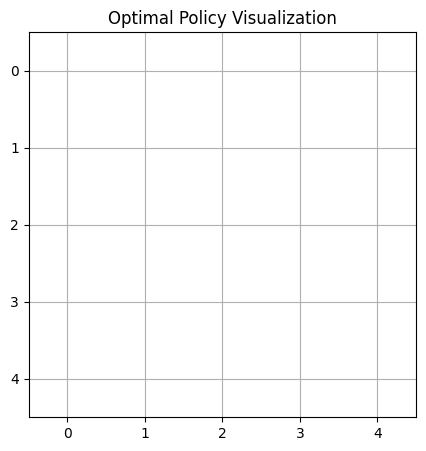



Episode 628:
Taxi starting position: 1
First customer request: A


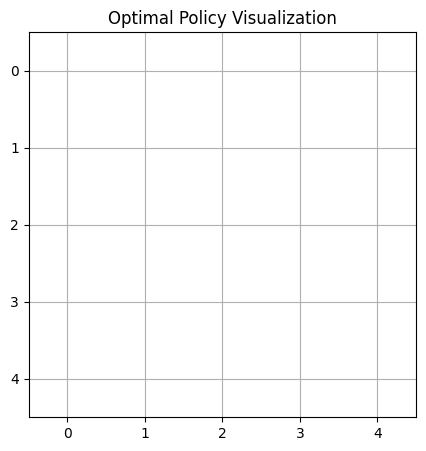



Episode 629:
Taxi starting position: 2
First customer request: D
Second customer request: C


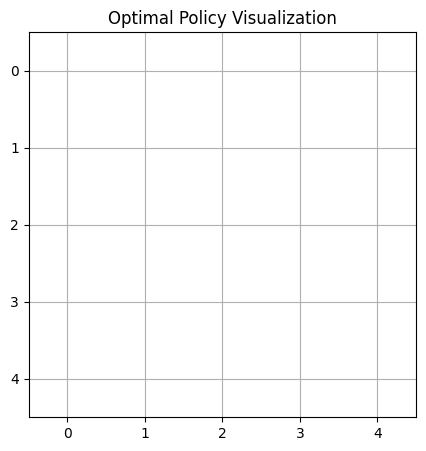



Episode 630:
Taxi starting position: 0
First customer request: B


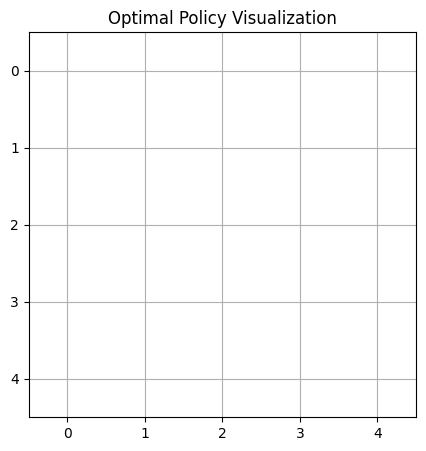



Episode 631:
Taxi starting position: 0
First customer request: D
Second customer request: A


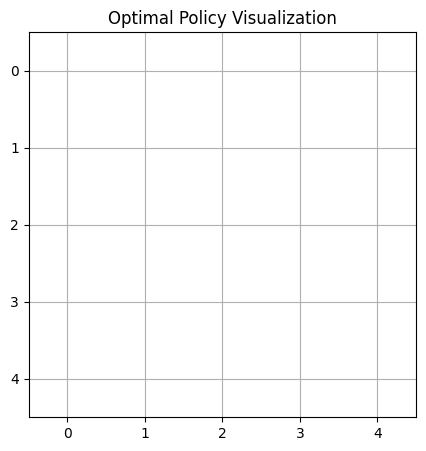



Episode 632:
Taxi starting position: 0
First customer request: C
Second customer request: A


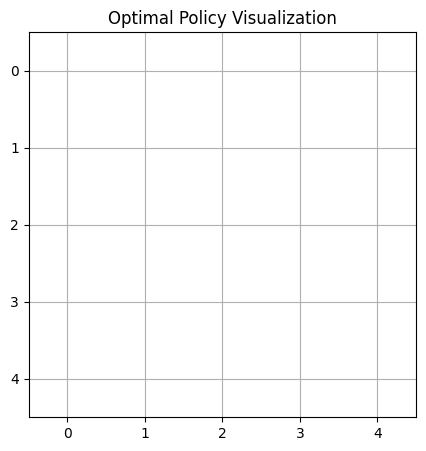



Episode 633:
Taxi starting position: 0
First customer request: C


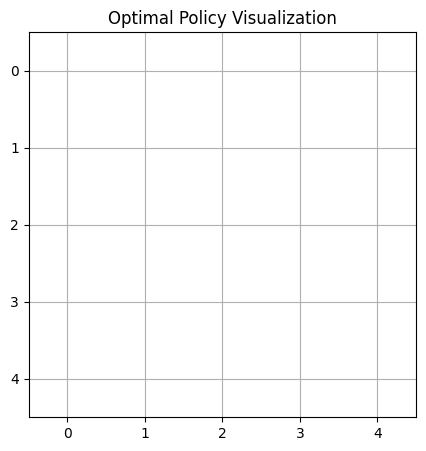



Episode 634:
Taxi starting position: 4
First customer request: B
Second customer request: B


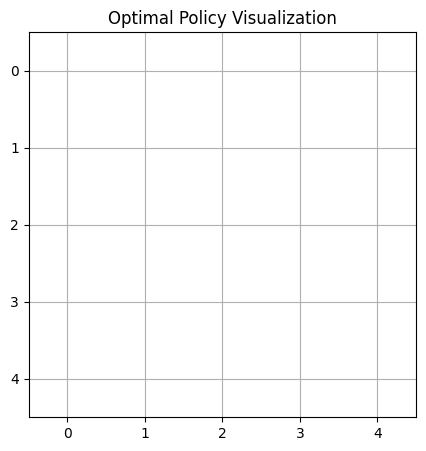



Episode 635:
Taxi starting position: 4
First customer request: C
Second customer request: B


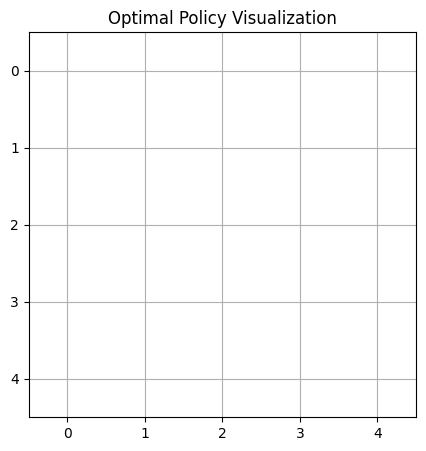



Episode 636:
Taxi starting position: 4
First customer request: D
Second customer request: C
Second customer is a premium customer.


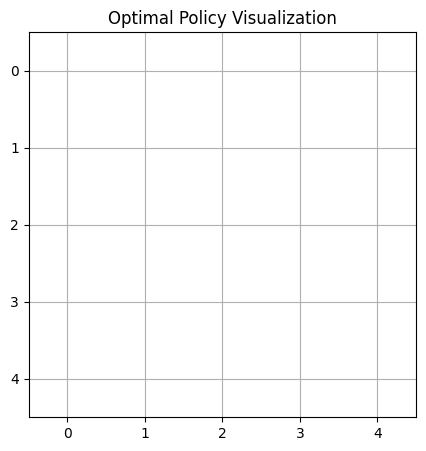



Episode 637:
Taxi starting position: 0
First customer request: A
Second customer request: A


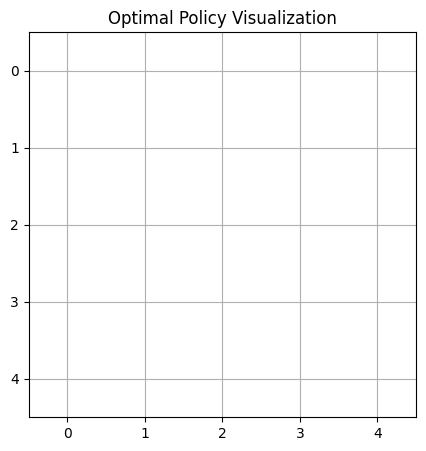



Episode 638:
Taxi starting position: 4
First customer request: A


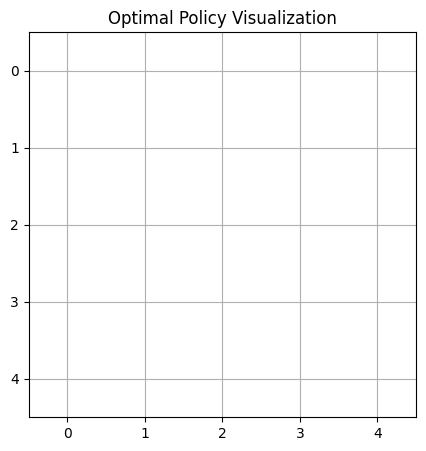



Episode 639:
Taxi starting position: 2
First customer request: B
Second customer request: B
Second customer is a premium customer.


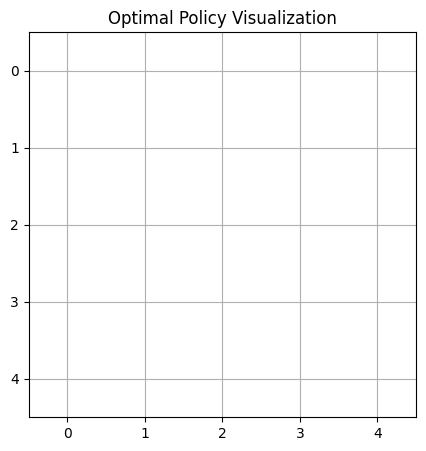



Episode 640:
Taxi starting position: 1
First customer request: B
Second customer request: D


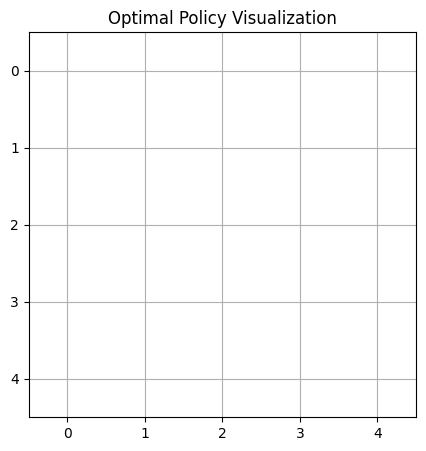



Episode 641:
Taxi starting position: 1
First customer request: D
Second customer request: A
Second customer is a premium customer.


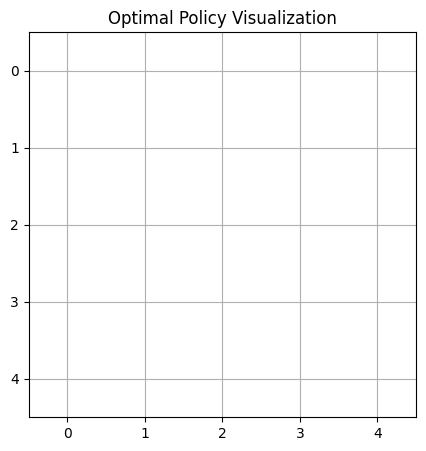



Episode 642:
Taxi starting position: 2
First customer request: D
Second customer request: A


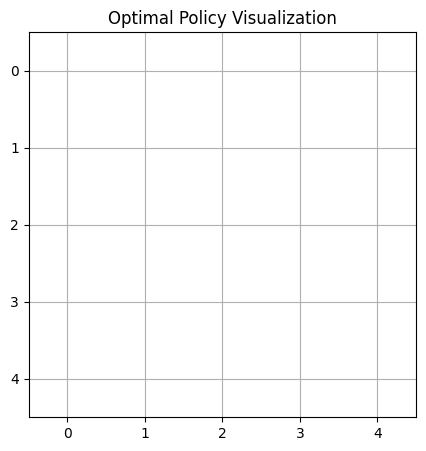



Episode 643:
Taxi starting position: 1
First customer request: A
Second customer request: D
Second customer is a premium customer.


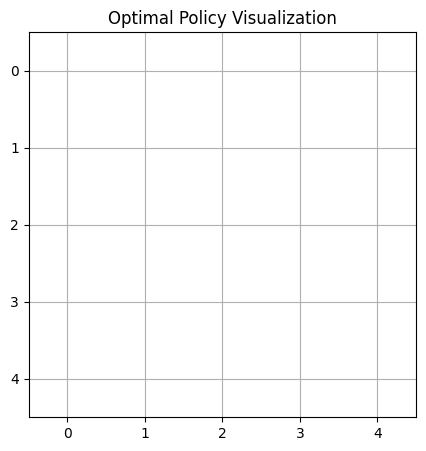



Episode 644:
Taxi starting position: 3
First customer request: B


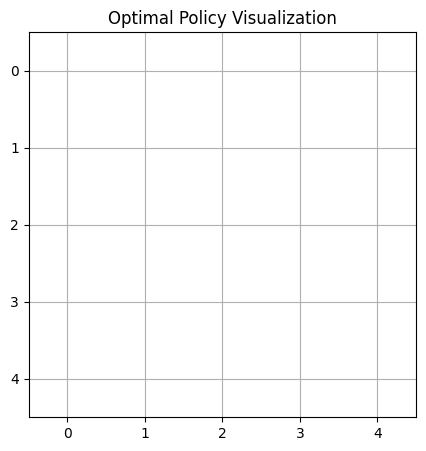



Episode 645:
Taxi starting position: 2
First customer request: D
Second customer request: D
Second customer is a premium customer.


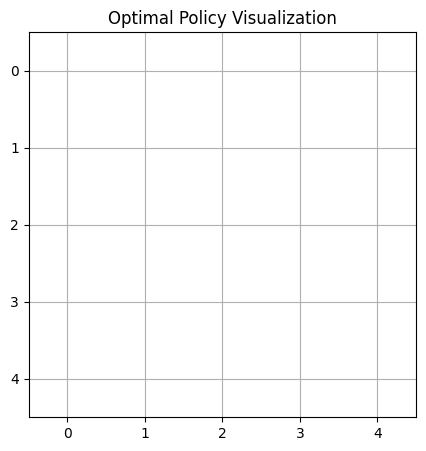



Episode 646:
Taxi starting position: 0
First customer request: C
Second customer request: C
Second customer is a premium customer.


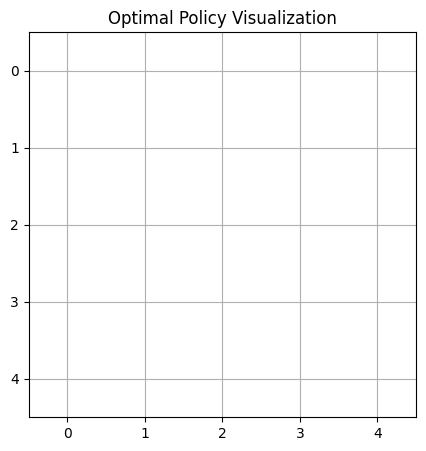



Episode 647:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


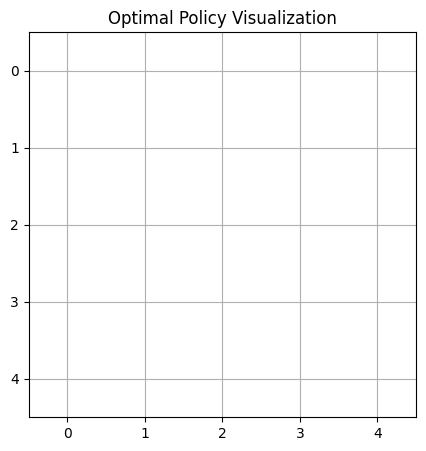



Episode 648:
Taxi starting position: 2
First customer request: B
Second customer request: C


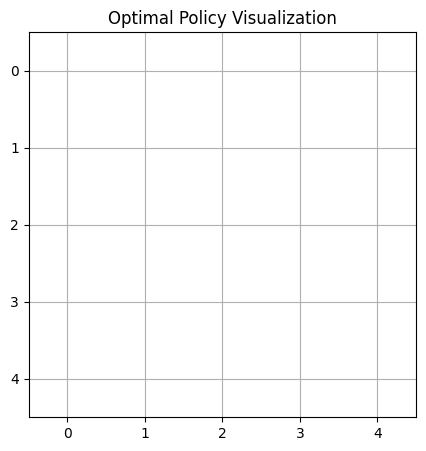



Episode 649:
Taxi starting position: 1
First customer request: A
Second customer request: A


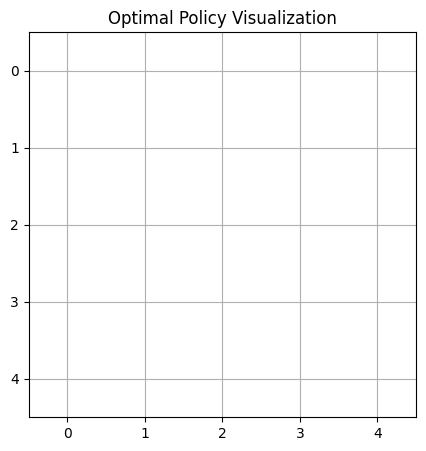



Episode 650:
Taxi starting position: 4
First customer request: D
Second customer request: A
Second customer is a premium customer.


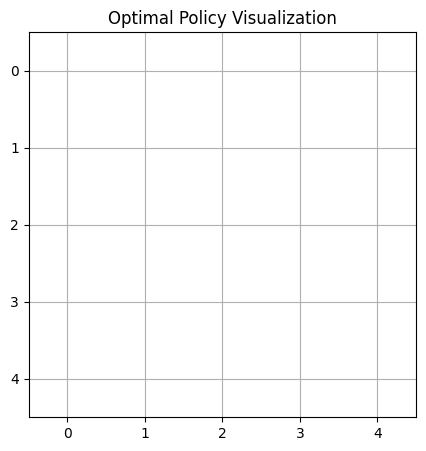



Episode 651:
Taxi starting position: 0
First customer request: C
Second customer request: C


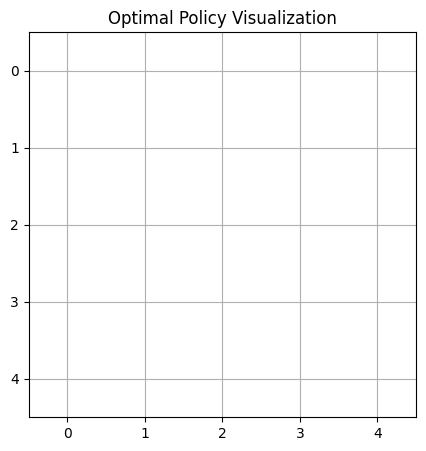



Episode 652:
Taxi starting position: 0
First customer request: B
Second customer request: C


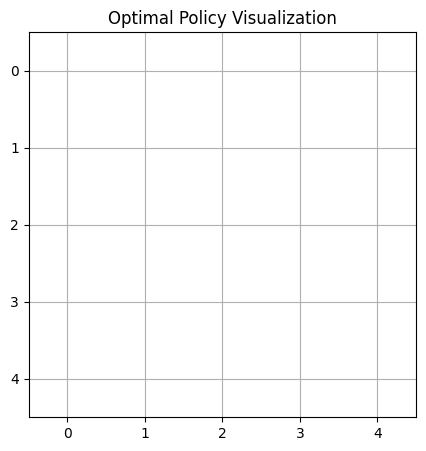



Episode 653:
Taxi starting position: 4
First customer request: C
Second customer request: C


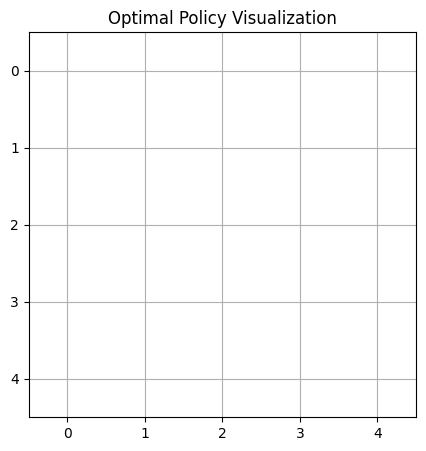



Episode 654:
Taxi starting position: 2
First customer request: C
Second customer request: B


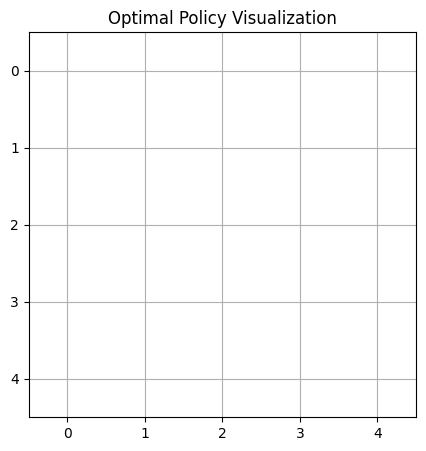



Episode 655:
Taxi starting position: 4
First customer request: B
Second customer request: A


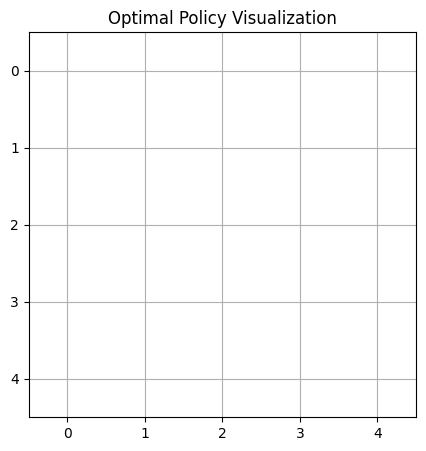



Episode 656:
Taxi starting position: 2
First customer request: A


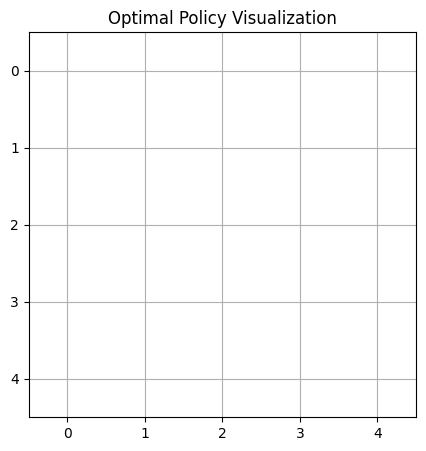



Episode 657:
Taxi starting position: 0
First customer request: A
Second customer request: D


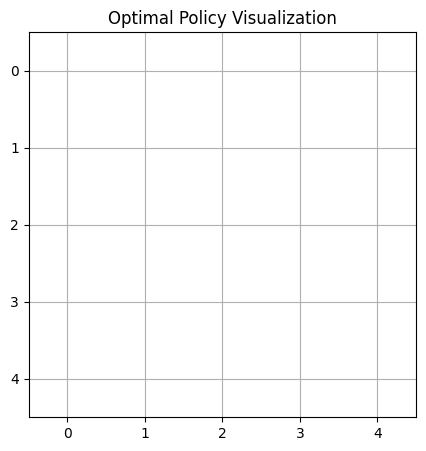



Episode 658:
Taxi starting position: 3
First customer request: C
Second customer request: D


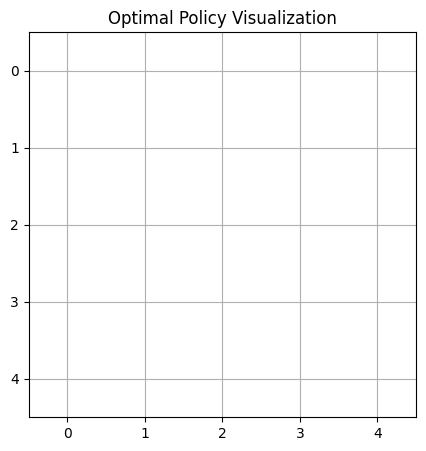



Episode 659:
Taxi starting position: 4
First customer request: B


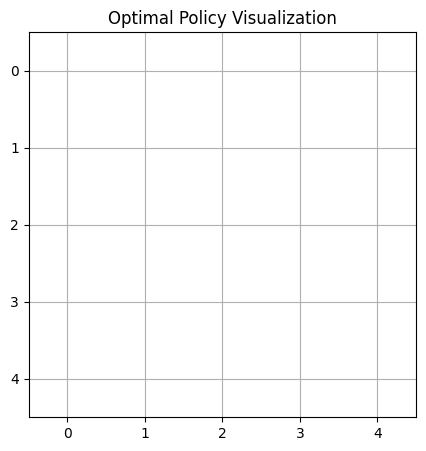



Episode 660:
Taxi starting position: 4
First customer request: A
Second customer request: B


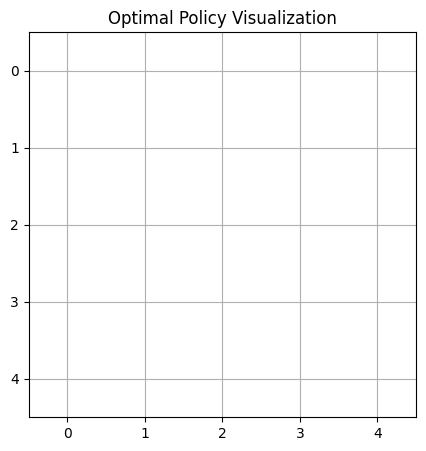



Episode 661:
Taxi starting position: 1
First customer request: D
Second customer request: A
Second customer is a premium customer.


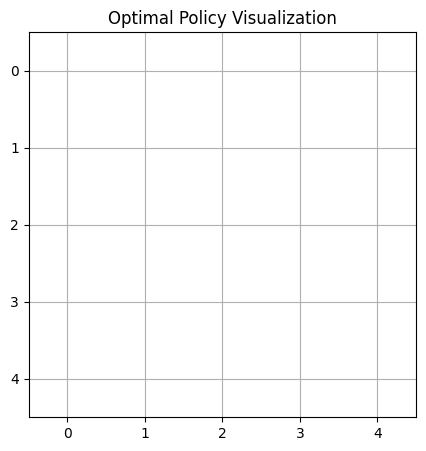



Episode 662:
Taxi starting position: 3
First customer request: B
Second customer request: C


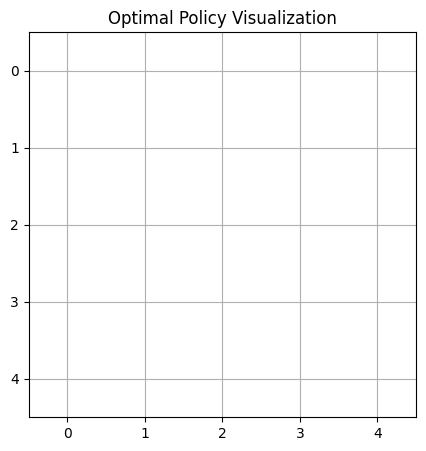



Episode 663:
Taxi starting position: 0
First customer request: C


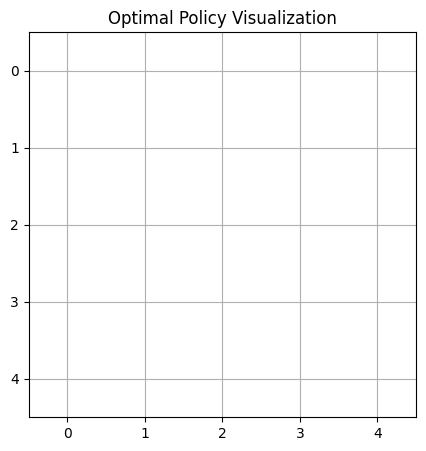



Episode 664:
Taxi starting position: 2
First customer request: D
Second customer request: C


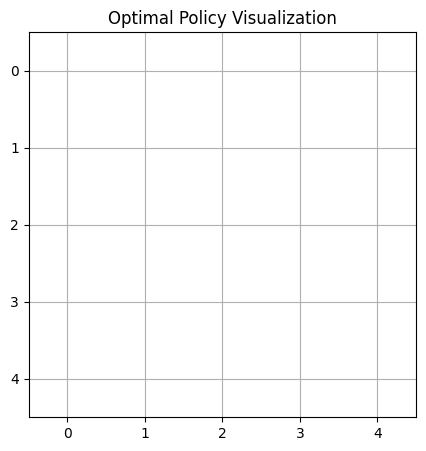



Episode 665:
Taxi starting position: 1
First customer request: A
Second customer request: A


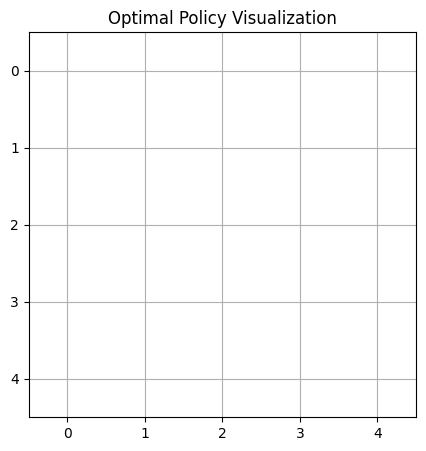



Episode 666:
Taxi starting position: 0
First customer request: C
Second customer request: B
Second customer is a premium customer.


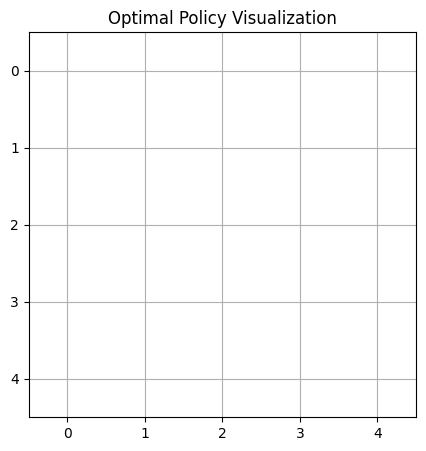



Episode 667:
Taxi starting position: 4
First customer request: A


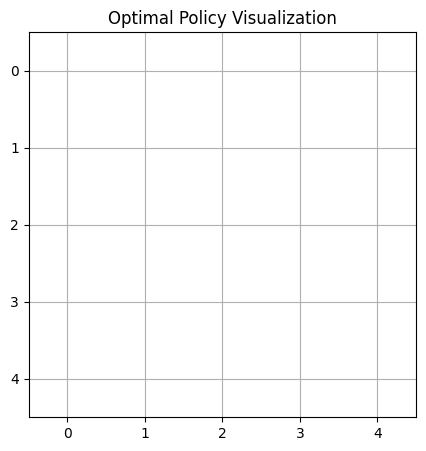



Episode 668:
Taxi starting position: 2
First customer request: D
Second customer request: D


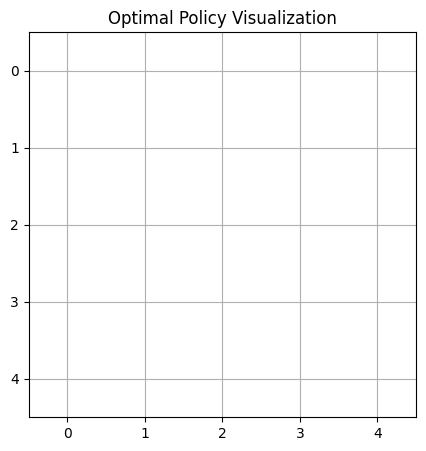



Episode 669:
Taxi starting position: 2
First customer request: B
Second customer request: A


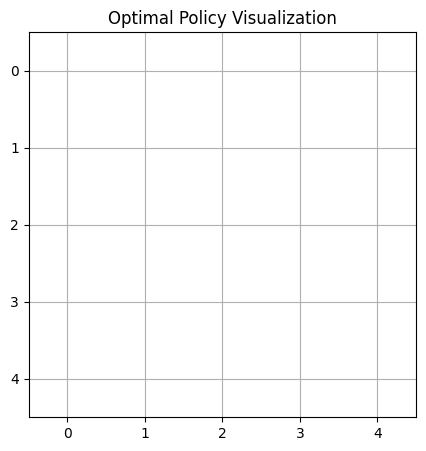



Episode 670:
Taxi starting position: 0
First customer request: B
Second customer request: C
Second customer is a premium customer.


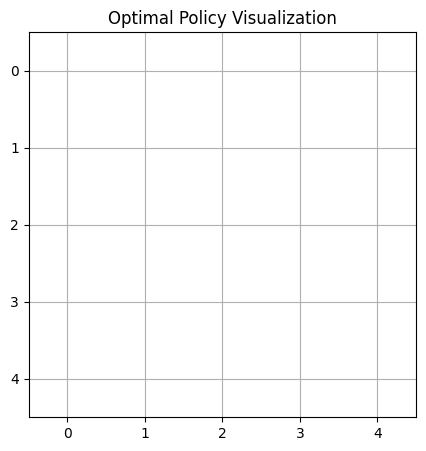



Episode 671:
Taxi starting position: 1
First customer request: B
Second customer request: A


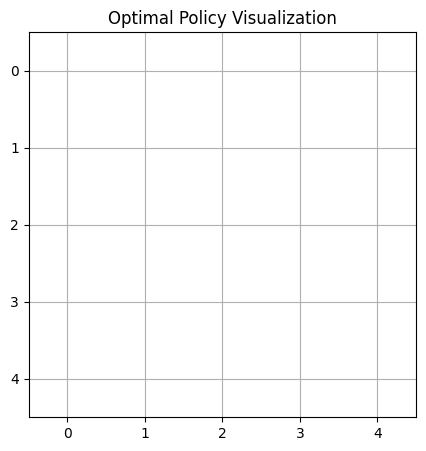



Episode 672:
Taxi starting position: 3
First customer request: A
Second customer request: D
Second customer is a premium customer.


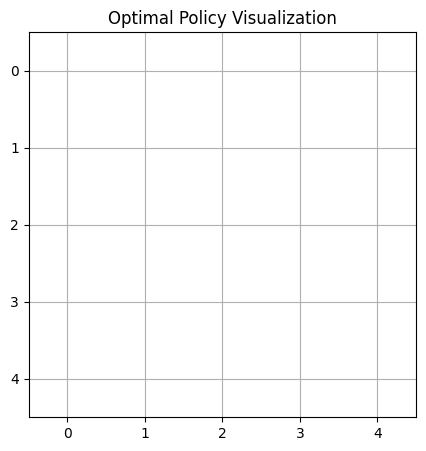



Episode 673:
Taxi starting position: 2
First customer request: A


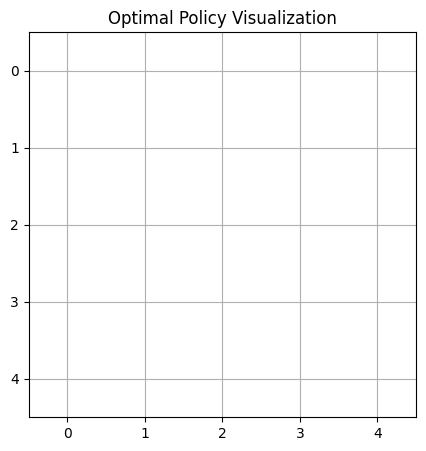



Episode 674:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


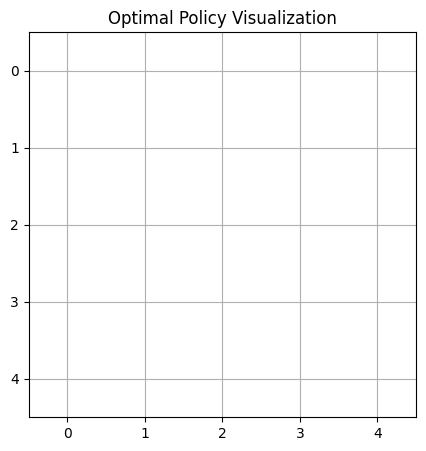



Episode 675:
Taxi starting position: 4
First customer request: A
Second customer request: A
Second customer is a premium customer.


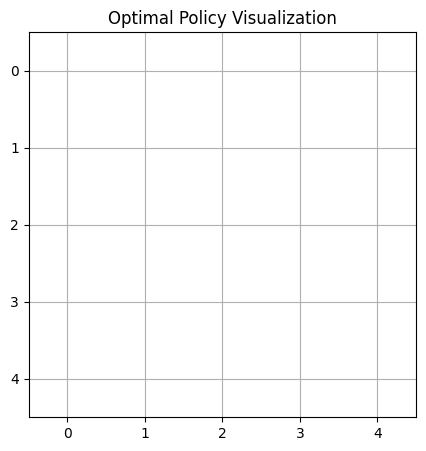



Episode 676:
Taxi starting position: 1
First customer request: A
Second customer request: A
Second customer is a premium customer.


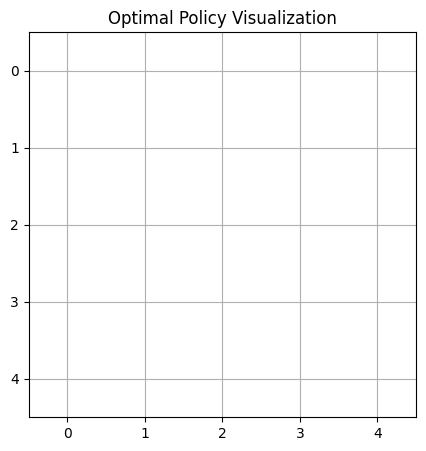



Episode 677:
Taxi starting position: 3
First customer request: A


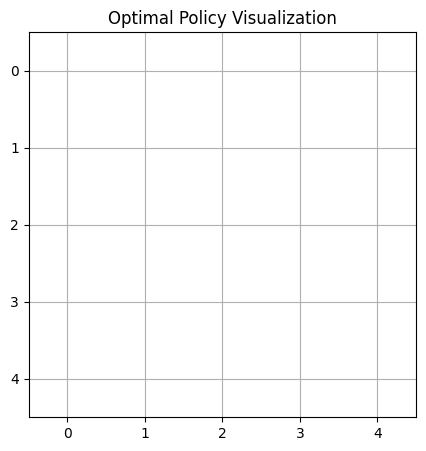



Episode 678:
Taxi starting position: 2
First customer request: D
Second customer request: A
Second customer is a premium customer.


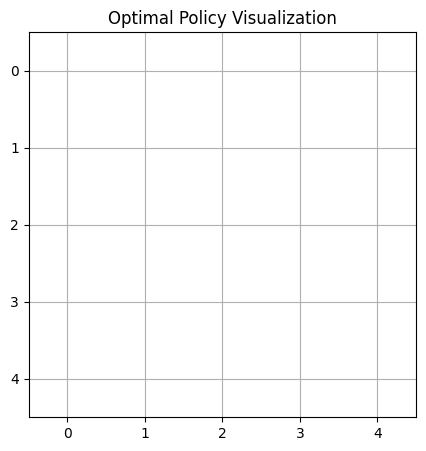



Episode 679:
Taxi starting position: 2
First customer request: A
Second customer request: A
Second customer is a premium customer.


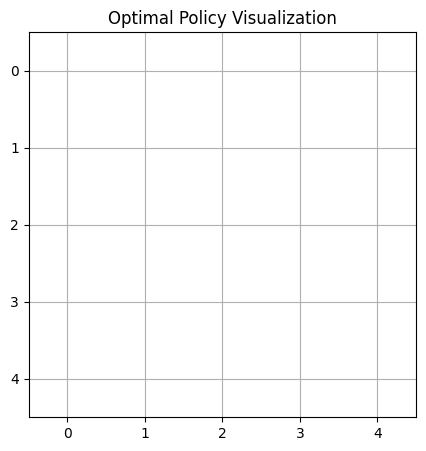



Episode 680:
Taxi starting position: 0
First customer request: B
Second customer request: B


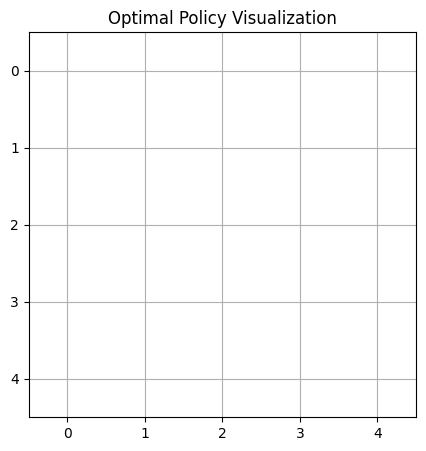



Episode 681:
Taxi starting position: 1
First customer request: C


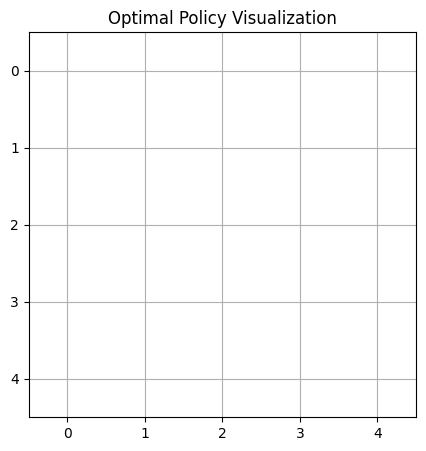



Episode 682:
Taxi starting position: 2
First customer request: A
Second customer request: D
Second customer is a premium customer.


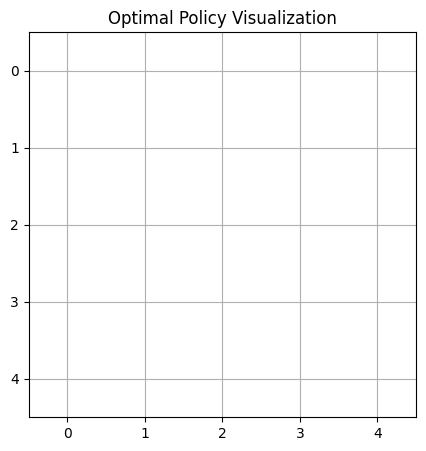



Episode 683:
Taxi starting position: 2
First customer request: A


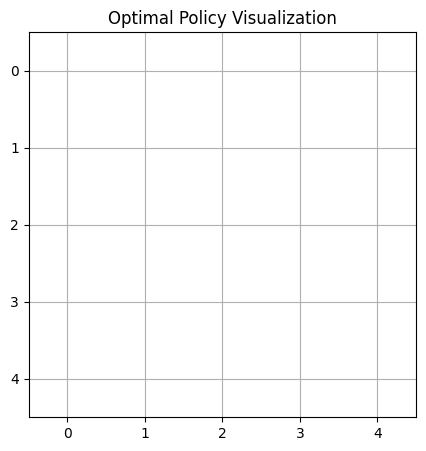



Episode 684:
Taxi starting position: 1
First customer request: A


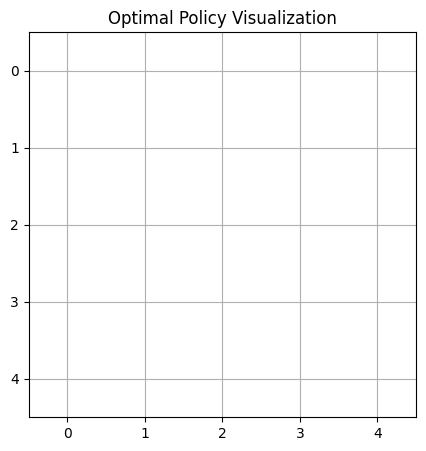



Episode 685:
Taxi starting position: 0
First customer request: A
Second customer request: C
Second customer is a premium customer.


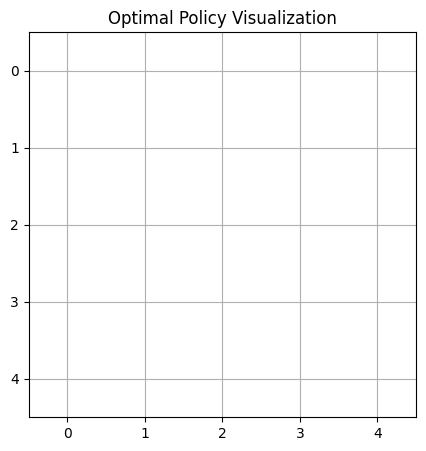



Episode 686:
Taxi starting position: 0
First customer request: B


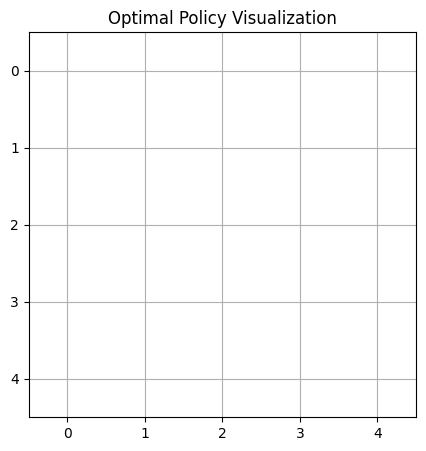



Episode 687:
Taxi starting position: 2
First customer request: D
Second customer request: B


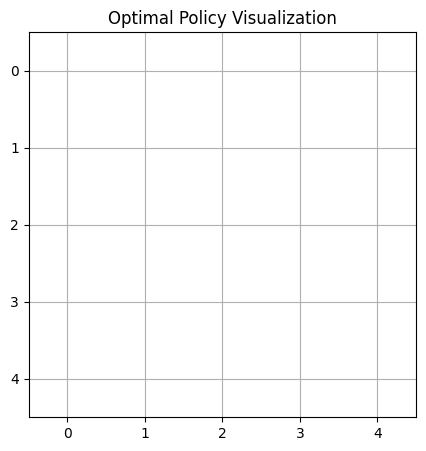



Episode 688:
Taxi starting position: 4
First customer request: A
Second customer request: C


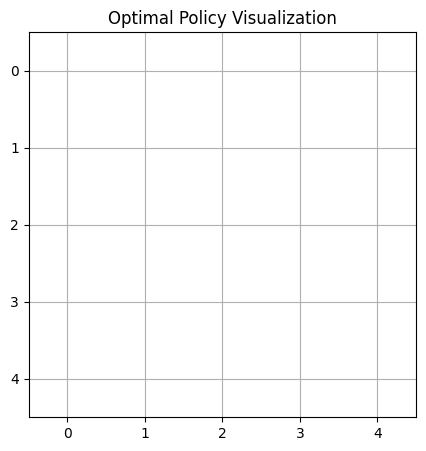



Episode 689:
Taxi starting position: 2
First customer request: A
Second customer request: A
Second customer is a premium customer.


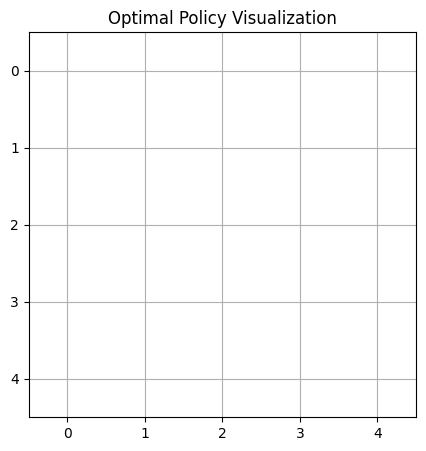



Episode 690:
Taxi starting position: 0
First customer request: D
Second customer request: A


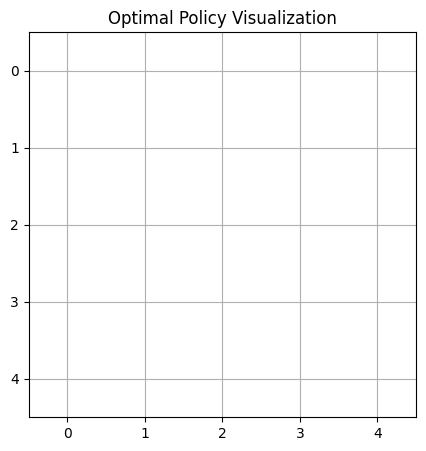



Episode 691:
Taxi starting position: 3
First customer request: A
Second customer request: C
Second customer is a premium customer.


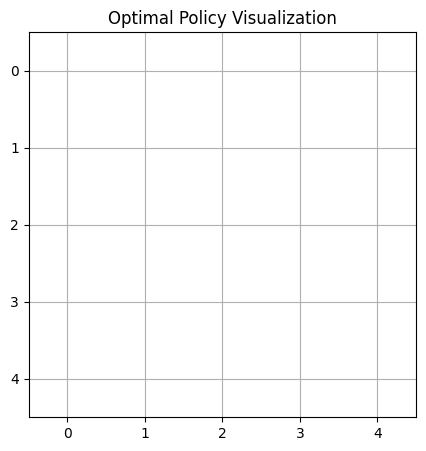



Episode 692:
Taxi starting position: 4
First customer request: B


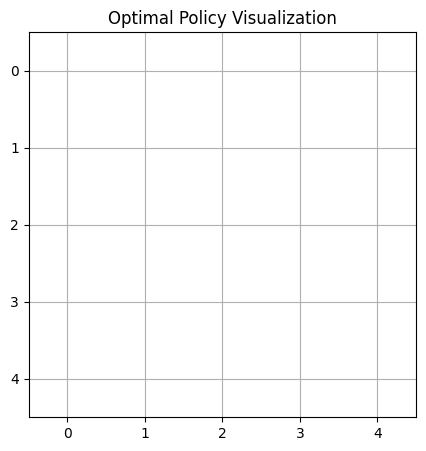



Episode 693:
Taxi starting position: 4
First customer request: C


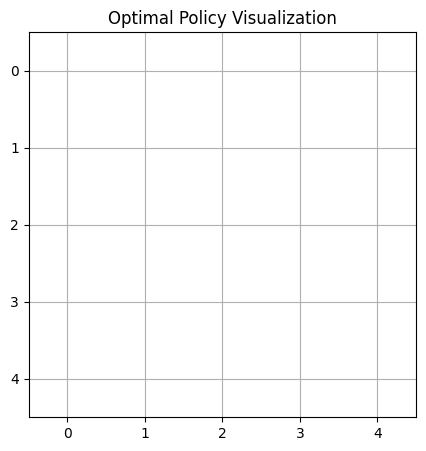



Episode 694:
Taxi starting position: 4
First customer request: B


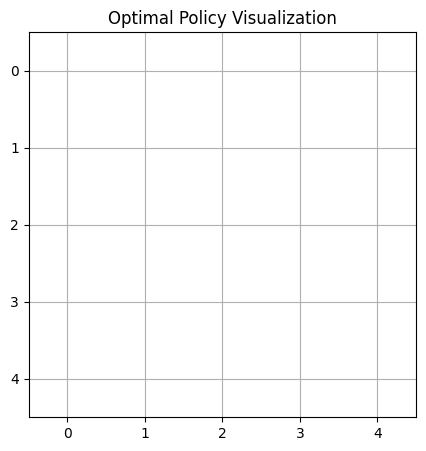



Episode 695:
Taxi starting position: 0
First customer request: B
Second customer request: B
Second customer is a premium customer.


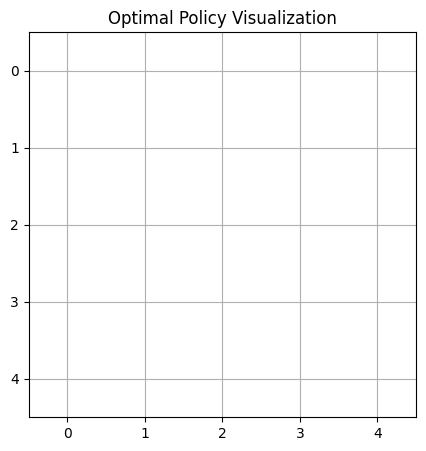



Episode 696:
Taxi starting position: 4
First customer request: A
Second customer request: A


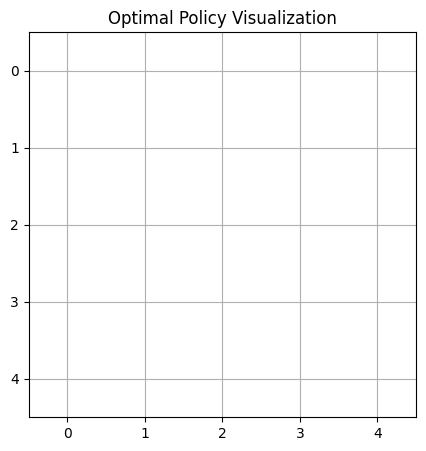



Episode 697:
Taxi starting position: 4
First customer request: A


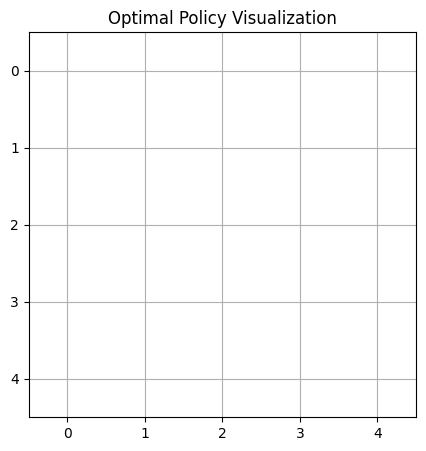



Episode 698:
Taxi starting position: 2
First customer request: D


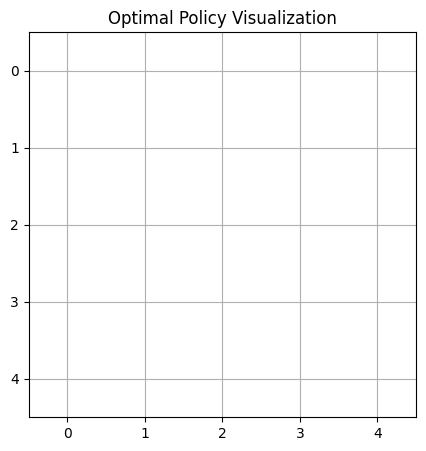



Episode 699:
Taxi starting position: 2
First customer request: C
Second customer request: C


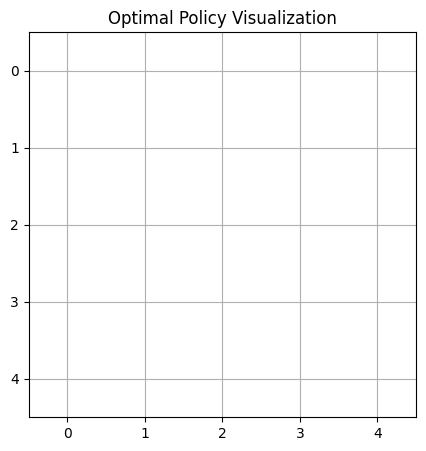



Episode 700:
Taxi starting position: 2
First customer request: B
Second customer request: D


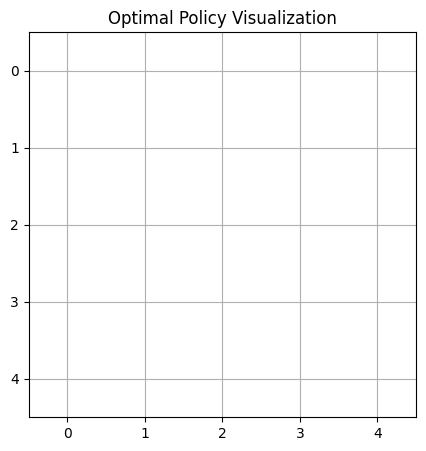



Episode 701:
Taxi starting position: 4
First customer request: D


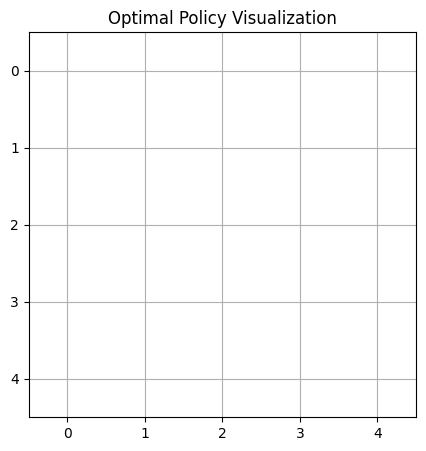



Episode 702:
Taxi starting position: 0
First customer request: D


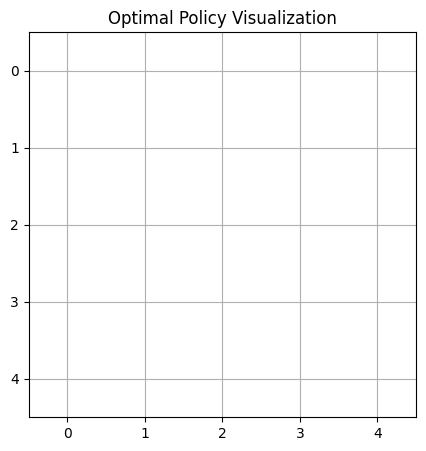



Episode 703:
Taxi starting position: 2
First customer request: C
Second customer request: A


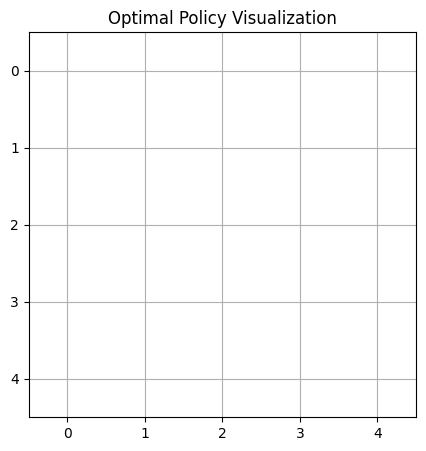



Episode 704:
Taxi starting position: 0
First customer request: B
Second customer request: B
Second customer is a premium customer.


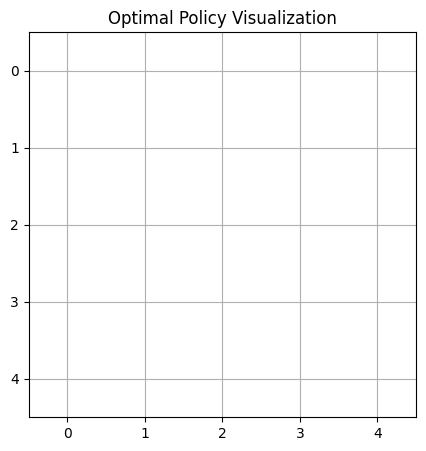



Episode 705:
Taxi starting position: 0
First customer request: C
Second customer request: A


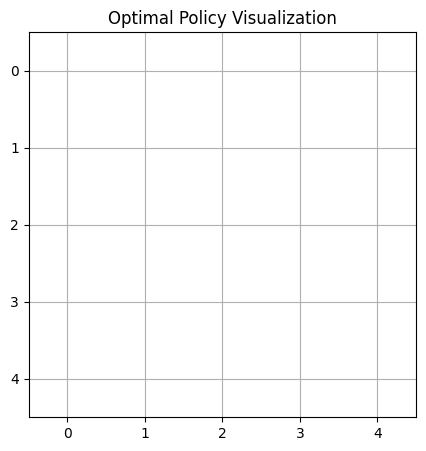



Episode 706:
Taxi starting position: 2
First customer request: B


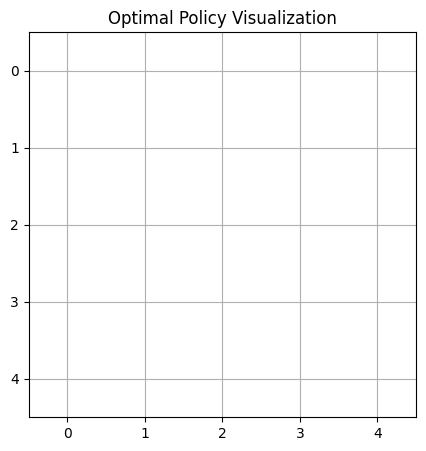



Episode 707:
Taxi starting position: 4
First customer request: C
Second customer request: D


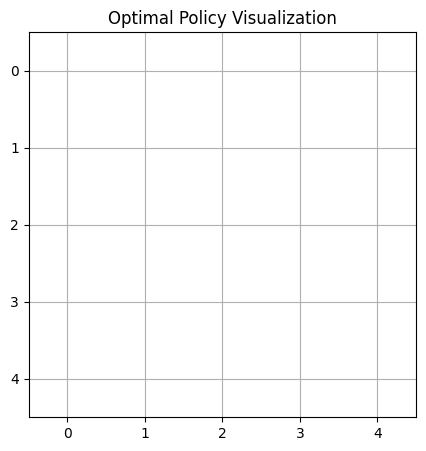



Episode 708:
Taxi starting position: 4
First customer request: B


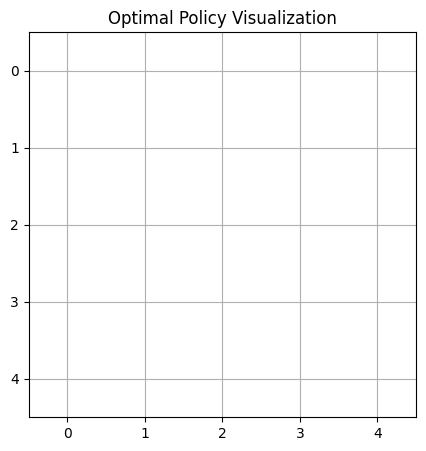



Episode 709:
Taxi starting position: 2
First customer request: B


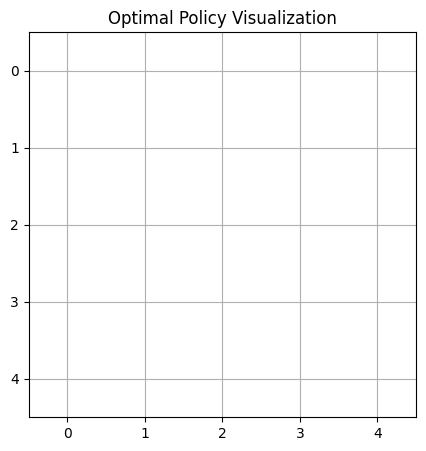



Episode 710:
Taxi starting position: 0
First customer request: D
Second customer request: B


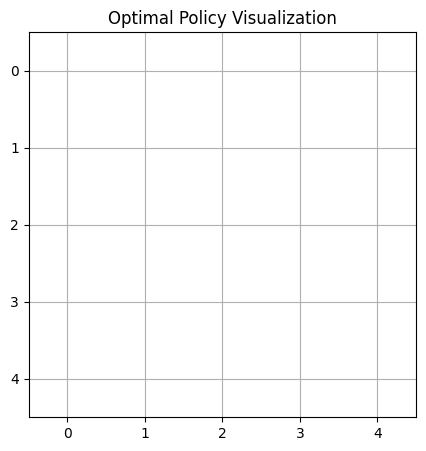



Episode 711:
Taxi starting position: 1
First customer request: B


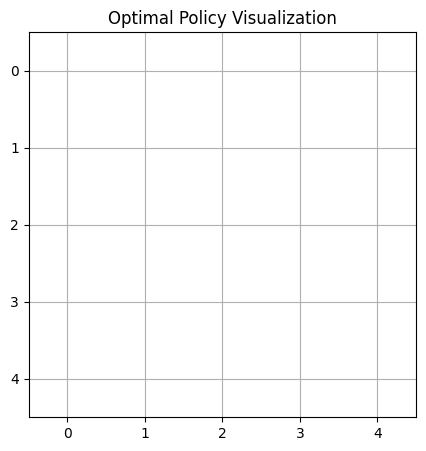



Episode 712:
Taxi starting position: 1
First customer request: B


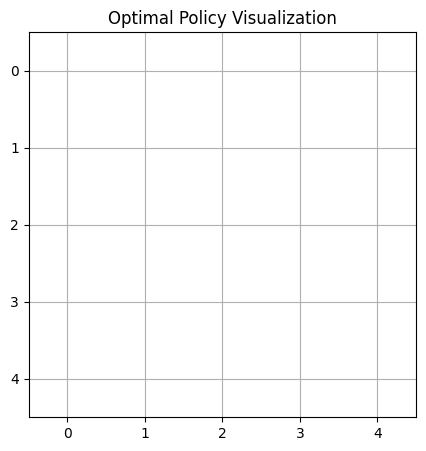



Episode 713:
Taxi starting position: 4
First customer request: D


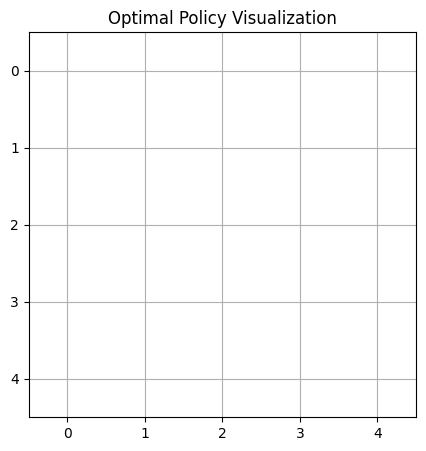



Episode 714:
Taxi starting position: 1
First customer request: A


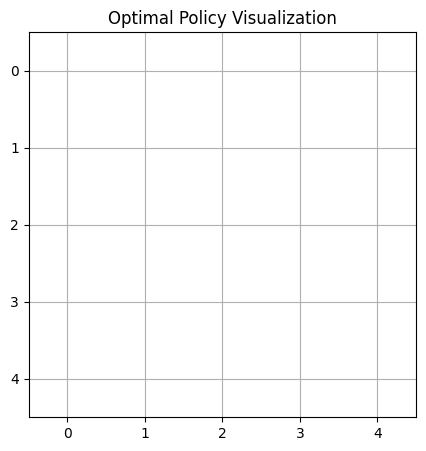



Episode 715:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


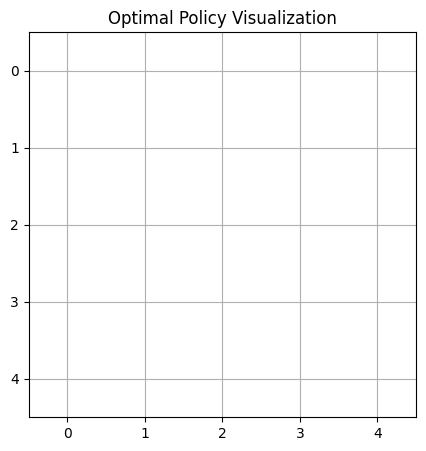



Episode 716:
Taxi starting position: 4
First customer request: B


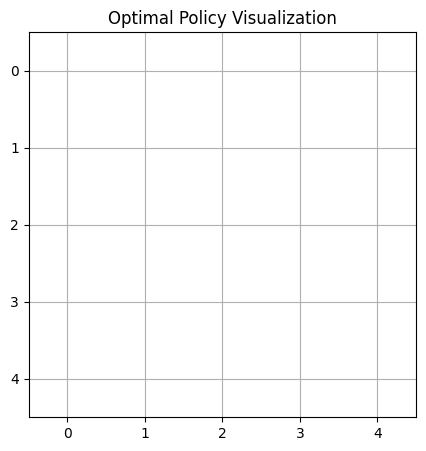



Episode 717:
Taxi starting position: 1
First customer request: C
Second customer request: B


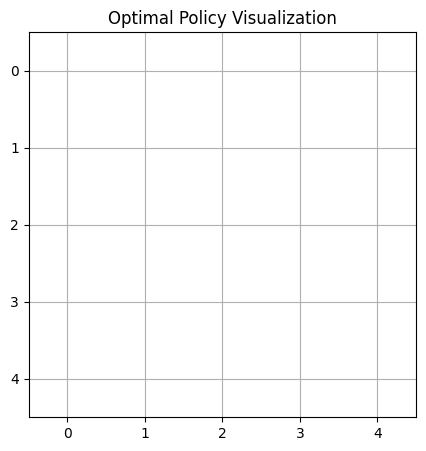



Episode 718:
Taxi starting position: 2
First customer request: A


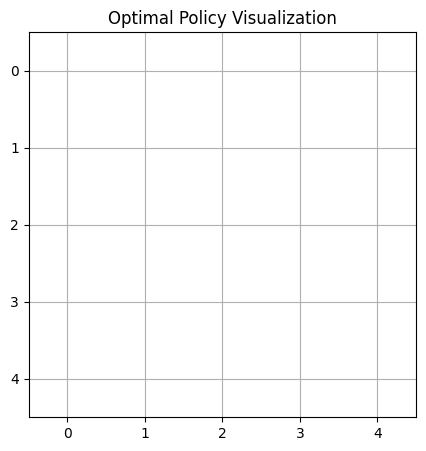



Episode 719:
Taxi starting position: 0
First customer request: B


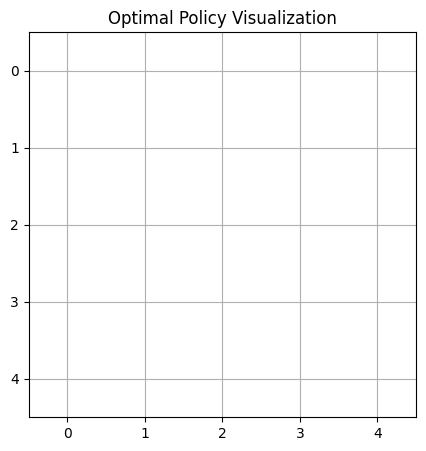



Episode 720:
Taxi starting position: 1
First customer request: A


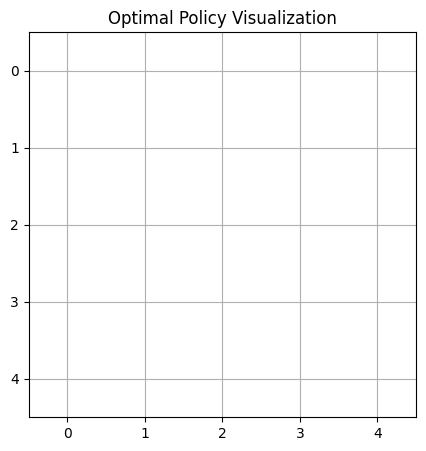



Episode 721:
Taxi starting position: 3
First customer request: B
Second customer request: B


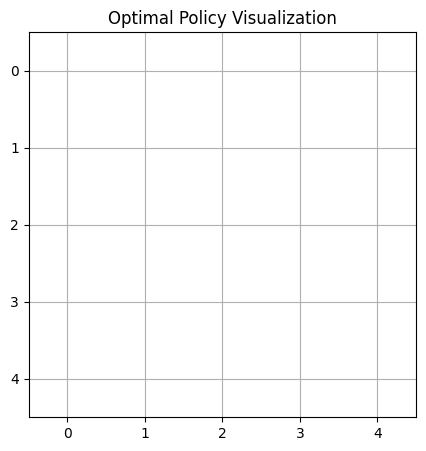



Episode 722:
Taxi starting position: 0
First customer request: B


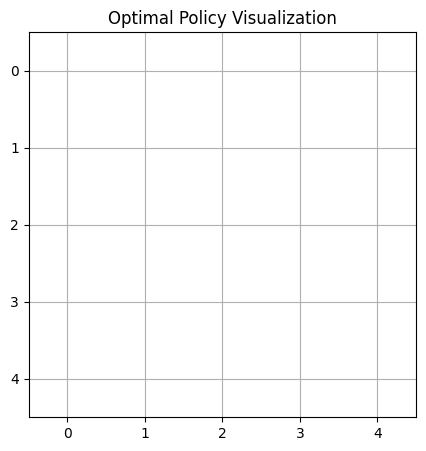



Episode 723:
Taxi starting position: 1
First customer request: D


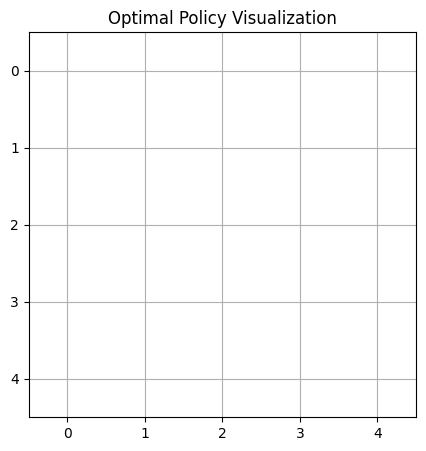



Episode 724:
Taxi starting position: 2
First customer request: B
Second customer request: D


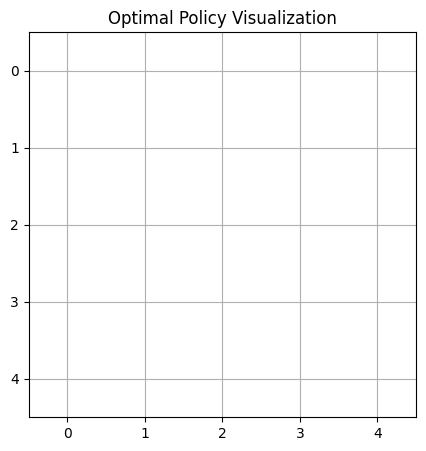



Episode 725:
Taxi starting position: 3
First customer request: D
Second customer request: C


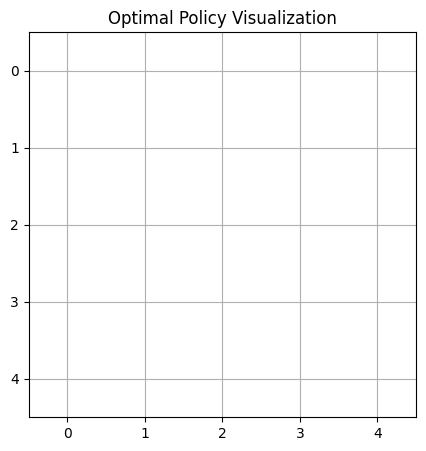



Episode 726:
Taxi starting position: 1
First customer request: D


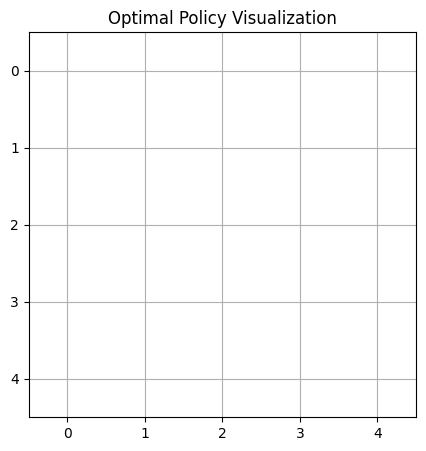



Episode 727:
Taxi starting position: 2
First customer request: B


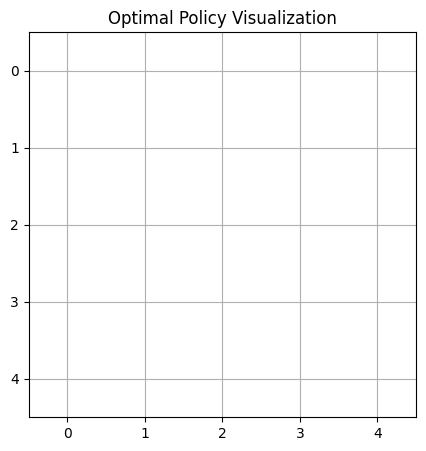



Episode 728:
Taxi starting position: 1
First customer request: D
Second customer request: A


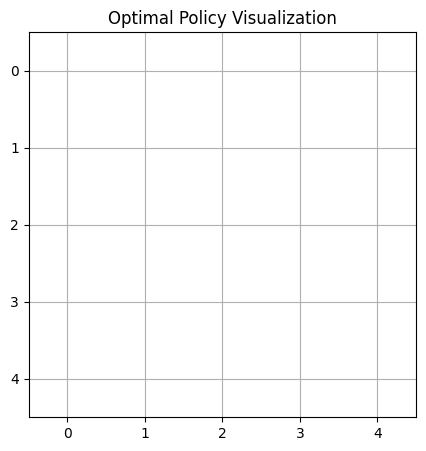



Episode 729:
Taxi starting position: 0
First customer request: B


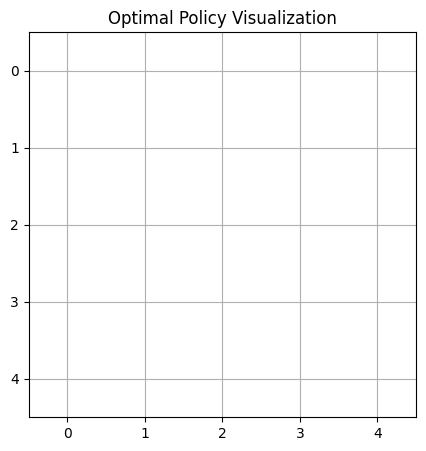



Episode 730:
Taxi starting position: 3
First customer request: B
Second customer request: A


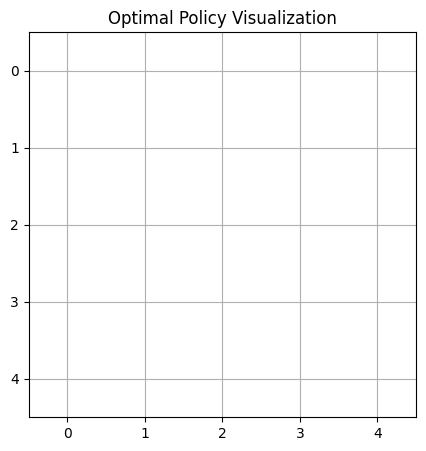



Episode 731:
Taxi starting position: 2
First customer request: B
Second customer request: A


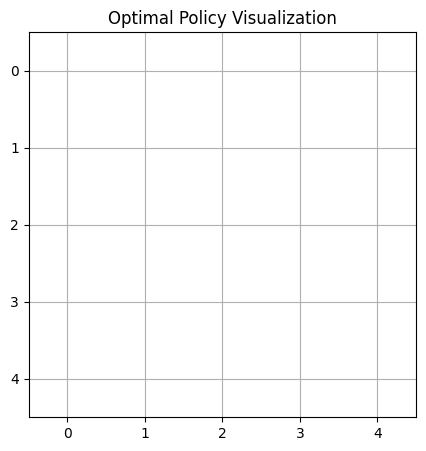



Episode 732:
Taxi starting position: 3
First customer request: D
Second customer request: B


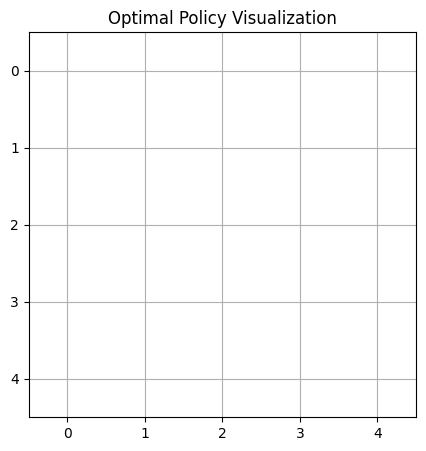



Episode 733:
Taxi starting position: 3
First customer request: B


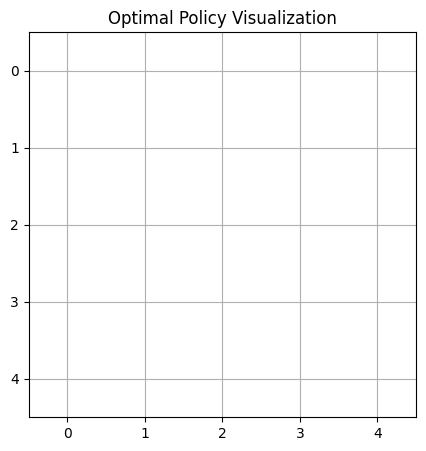



Episode 734:
Taxi starting position: 0
First customer request: C
Second customer request: A


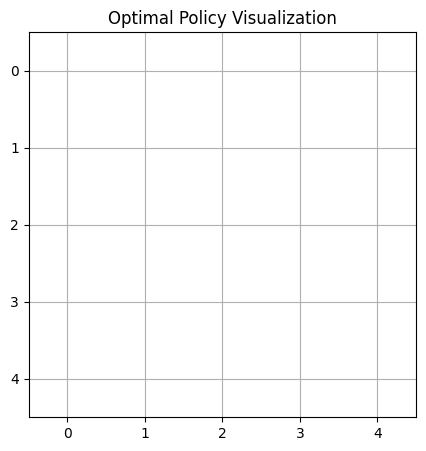



Episode 735:
Taxi starting position: 2
First customer request: C
Second customer request: C


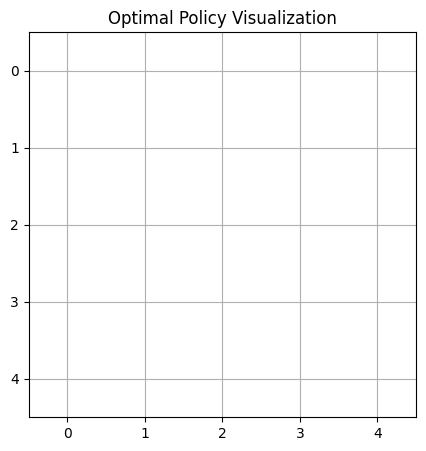



Episode 736:
Taxi starting position: 4
First customer request: B
Second customer request: B


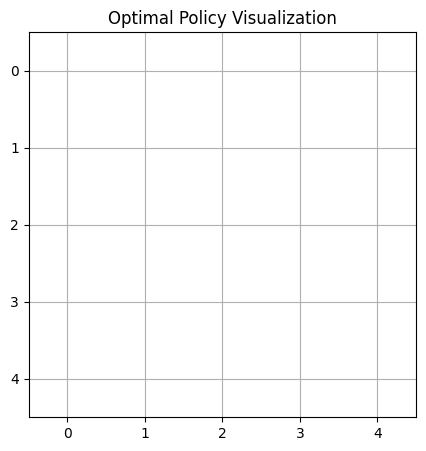



Episode 737:
Taxi starting position: 3
First customer request: B
Second customer request: C
Second customer is a premium customer.


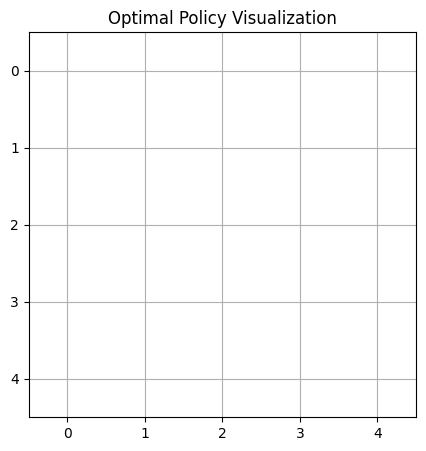



Episode 738:
Taxi starting position: 0
First customer request: D


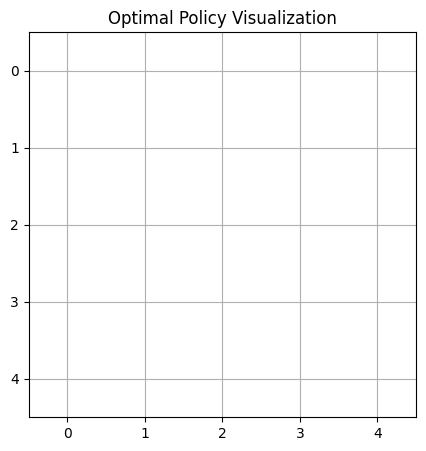



Episode 739:
Taxi starting position: 2
First customer request: A


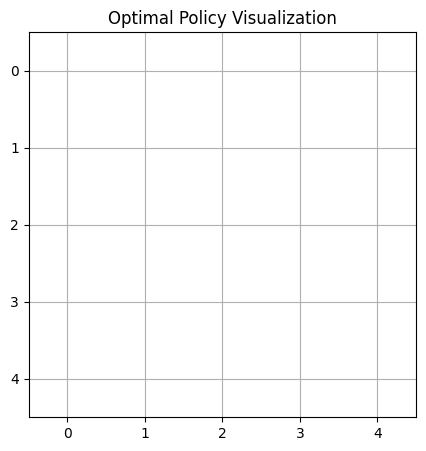



Episode 740:
Taxi starting position: 2
First customer request: B


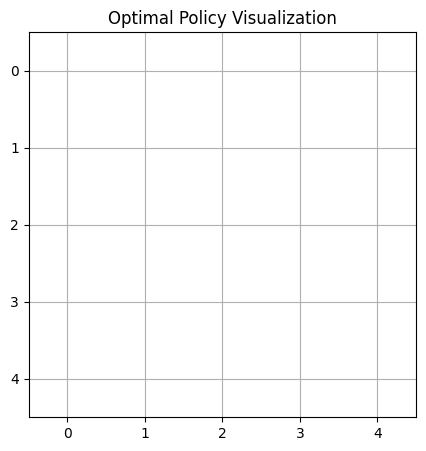



Episode 741:
Taxi starting position: 0
First customer request: B
Second customer request: A
Second customer is a premium customer.


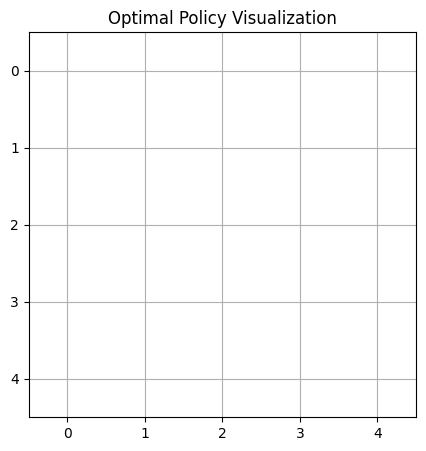



Episode 742:
Taxi starting position: 4
First customer request: A
Second customer request: C
Second customer is a premium customer.


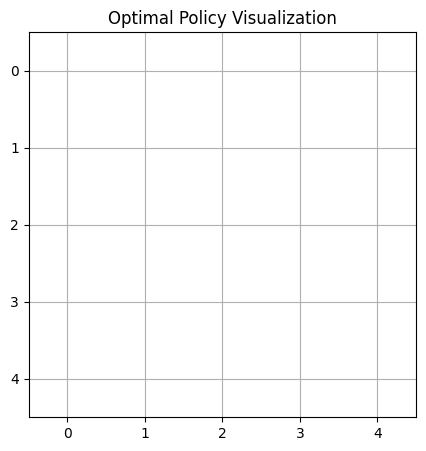



Episode 743:
Taxi starting position: 0
First customer request: C
Second customer request: A


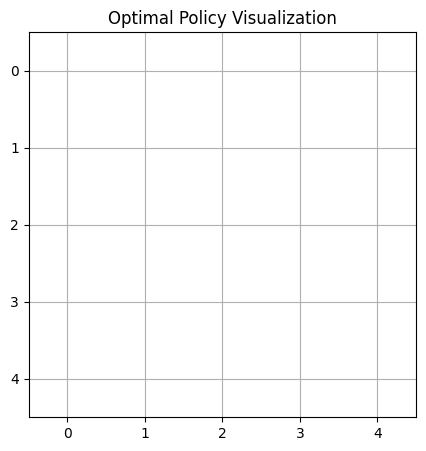



Episode 744:
Taxi starting position: 0
First customer request: C
Second customer request: D
Second customer is a premium customer.


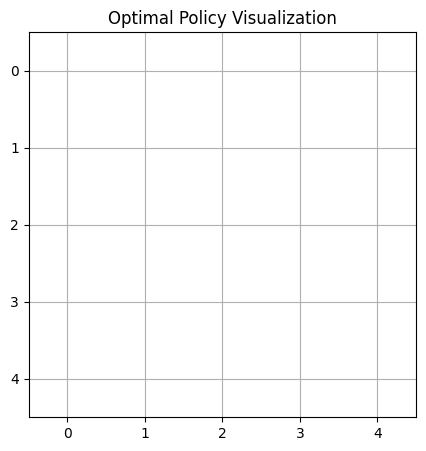



Episode 745:
Taxi starting position: 4
First customer request: A


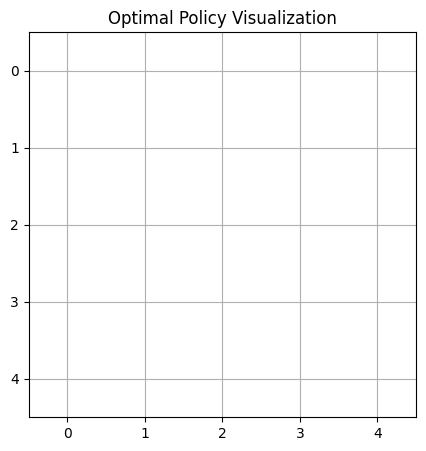



Episode 746:
Taxi starting position: 4
First customer request: D
Second customer request: D
Second customer is a premium customer.


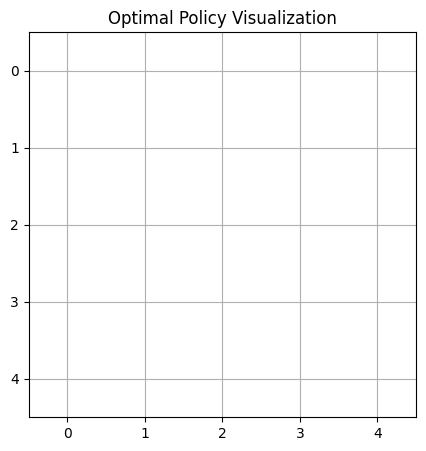



Episode 747:
Taxi starting position: 1
First customer request: B
Second customer request: C


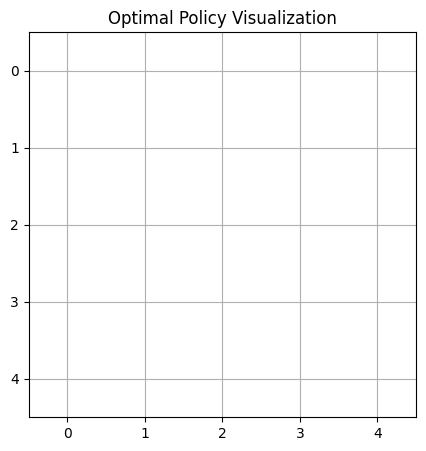



Episode 748:
Taxi starting position: 1
First customer request: B
Second customer request: B
Second customer is a premium customer.


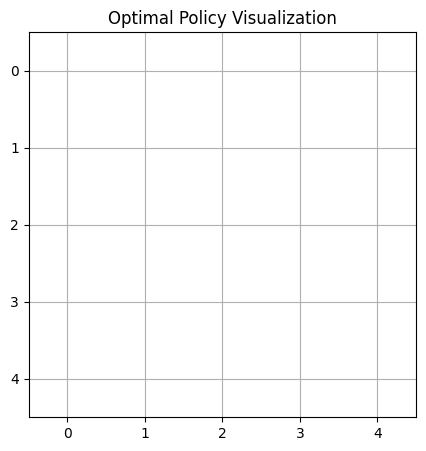



Episode 749:
Taxi starting position: 1
First customer request: A
Second customer request: A


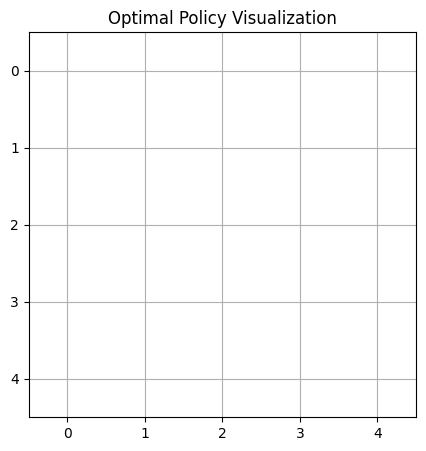



Episode 750:
Taxi starting position: 3
First customer request: B


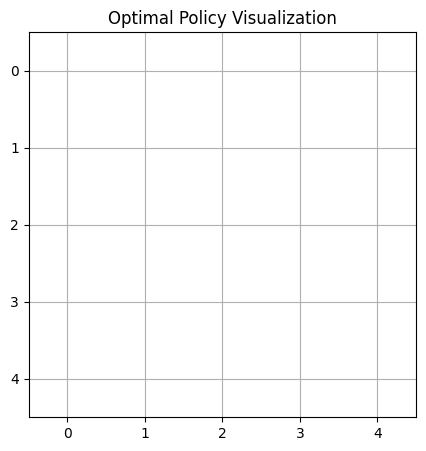



Episode 751:
Taxi starting position: 3
First customer request: D
Second customer request: A
Second customer is a premium customer.


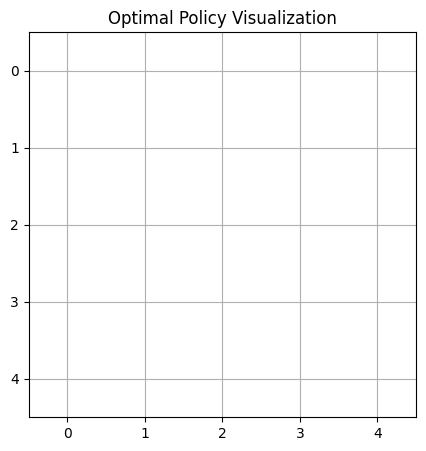



Episode 752:
Taxi starting position: 2
First customer request: A
Second customer request: D


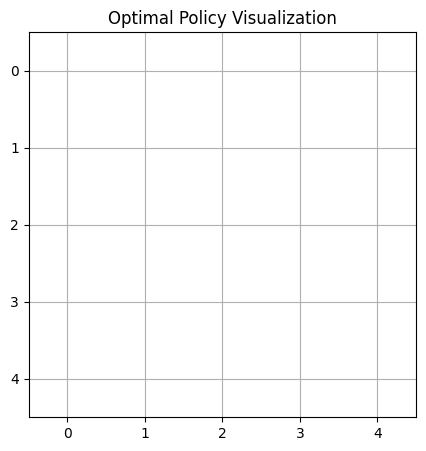



Episode 753:
Taxi starting position: 0
First customer request: A


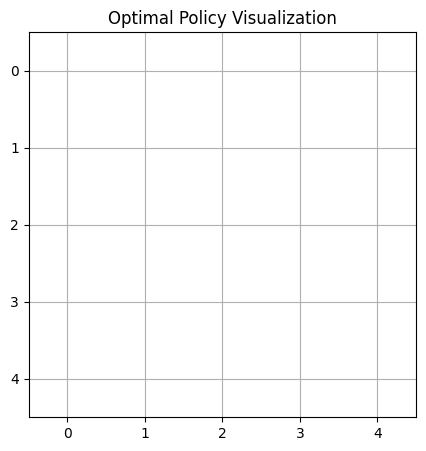



Episode 754:
Taxi starting position: 3
First customer request: D


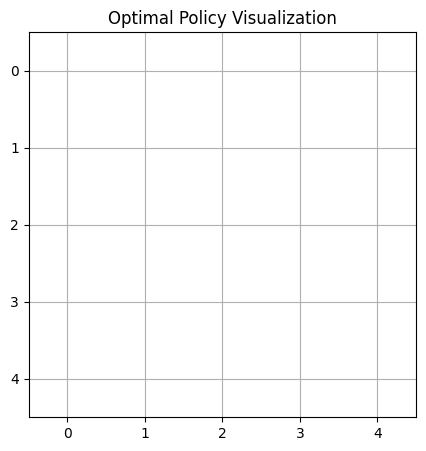



Episode 755:
Taxi starting position: 3
First customer request: C
Second customer request: C
Second customer is a premium customer.


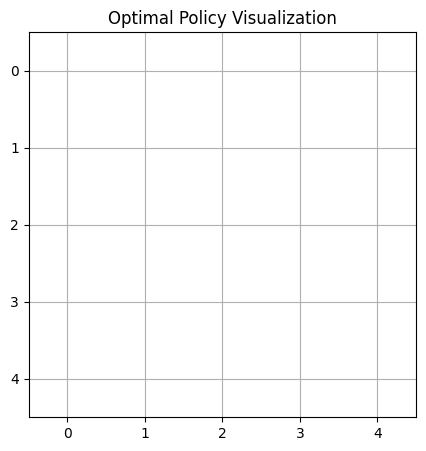



Episode 756:
Taxi starting position: 2
First customer request: D
Second customer request: A


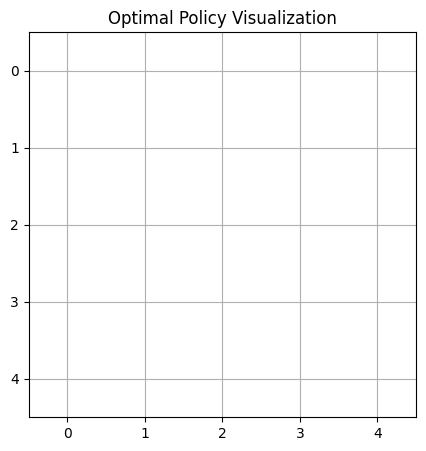



Episode 757:
Taxi starting position: 4
First customer request: A


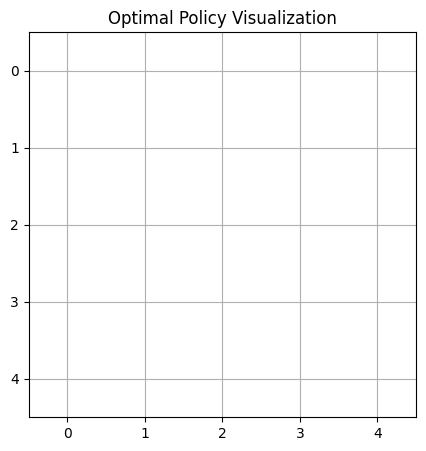



Episode 758:
Taxi starting position: 2
First customer request: A
Second customer request: B


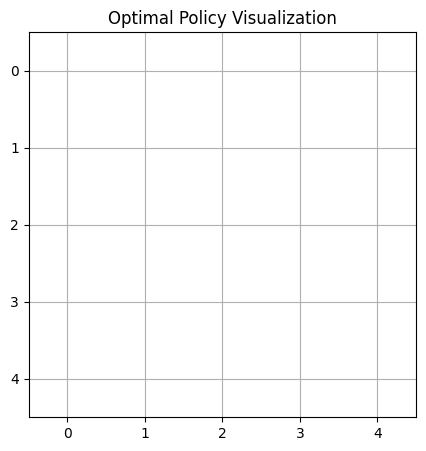



Episode 759:
Taxi starting position: 3
First customer request: C


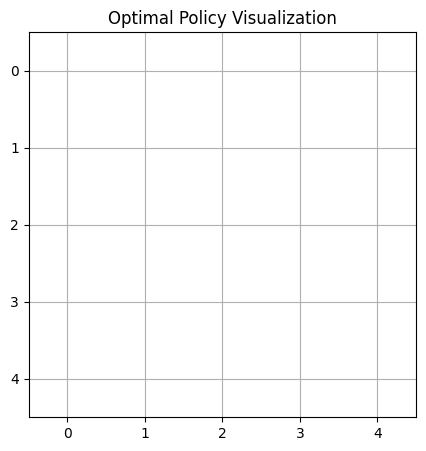



Episode 760:
Taxi starting position: 1
First customer request: D
Second customer request: C


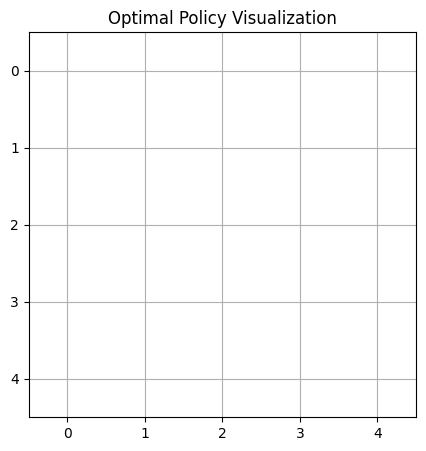



Episode 761:
Taxi starting position: 2
First customer request: C
Second customer request: B
Second customer is a premium customer.


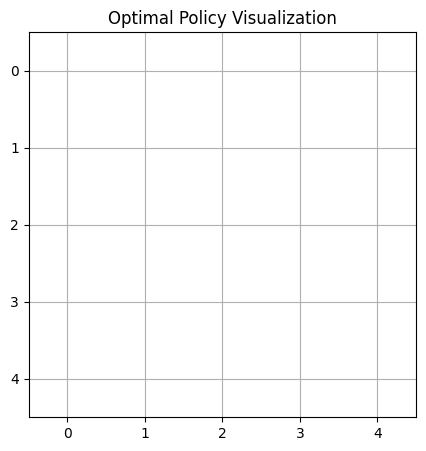



Episode 762:
Taxi starting position: 0
First customer request: C
Second customer request: A


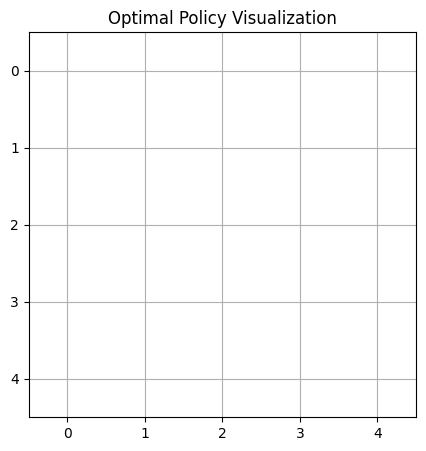



Episode 763:
Taxi starting position: 0
First customer request: D
Second customer request: A


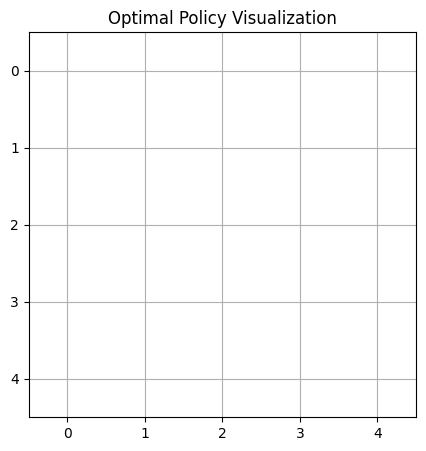



Episode 764:
Taxi starting position: 0
First customer request: B


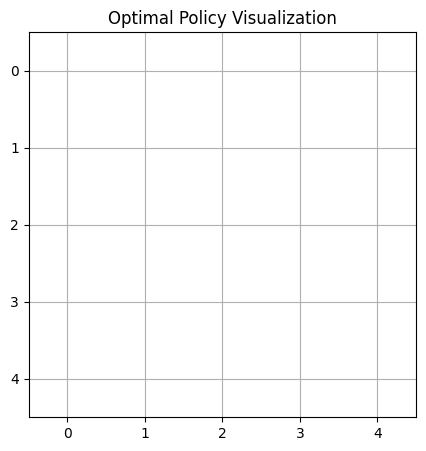



Episode 765:
Taxi starting position: 1
First customer request: B


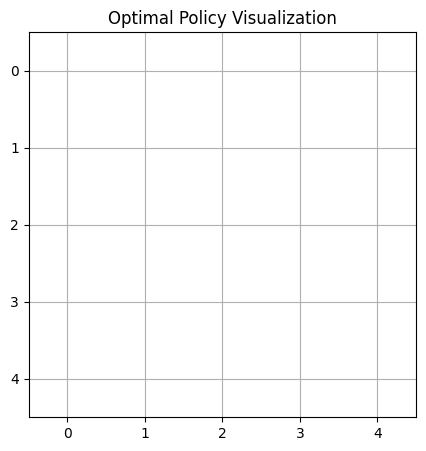



Episode 766:
Taxi starting position: 0
First customer request: B
Second customer request: C


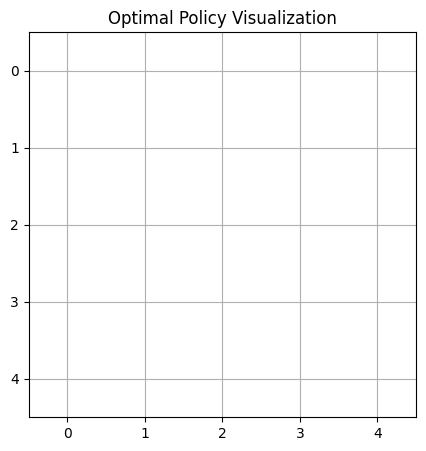



Episode 767:
Taxi starting position: 3
First customer request: D
Second customer request: A


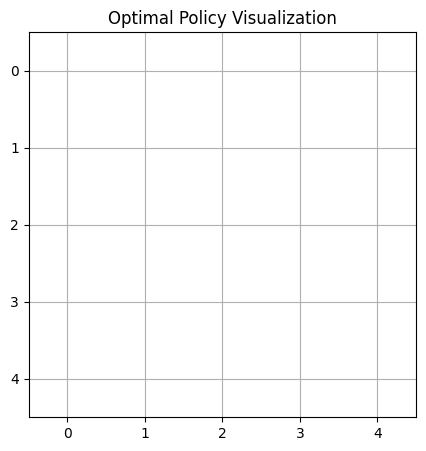



Episode 768:
Taxi starting position: 4
First customer request: C
Second customer request: A


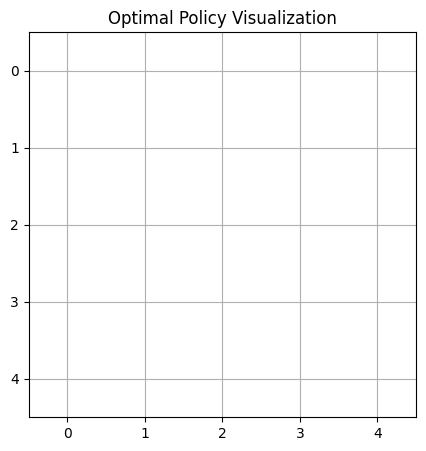



Episode 769:
Taxi starting position: 2
First customer request: D


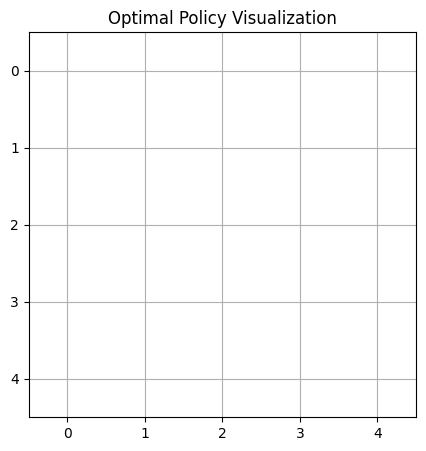



Episode 770:
Taxi starting position: 0
First customer request: B
Second customer request: C


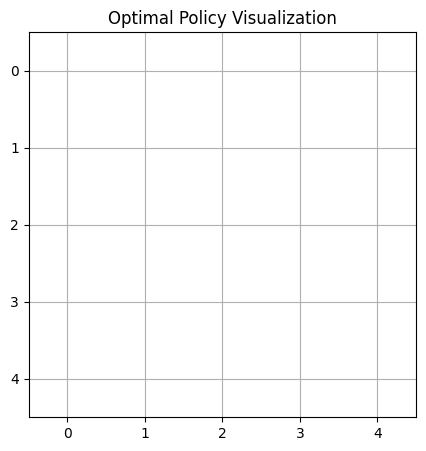



Episode 771:
Taxi starting position: 0
First customer request: B
Second customer request: C


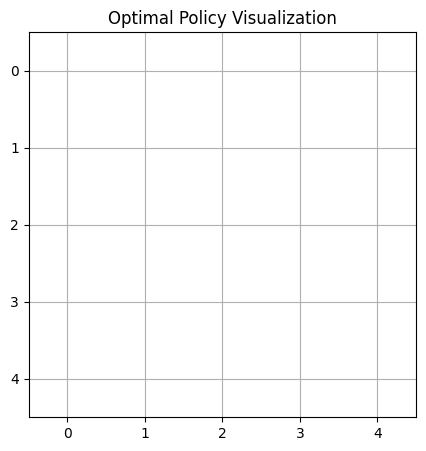



Episode 772:
Taxi starting position: 1
First customer request: A


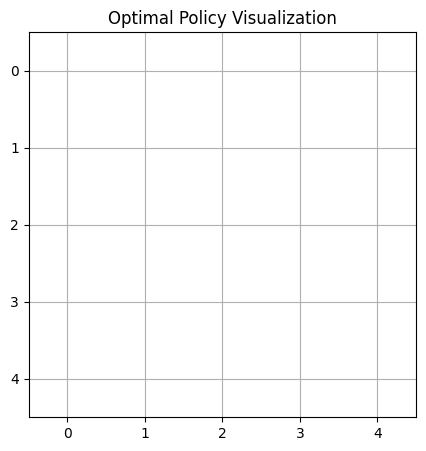



Episode 773:
Taxi starting position: 2
First customer request: A
Second customer request: A


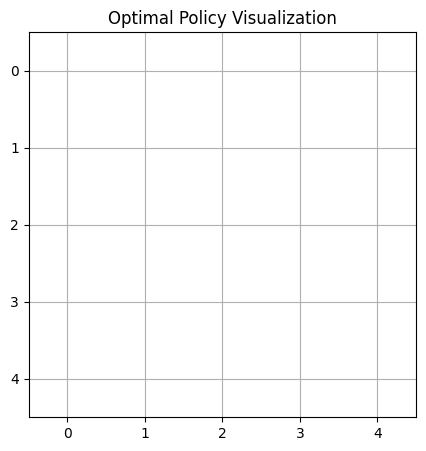



Episode 774:
Taxi starting position: 1
First customer request: B


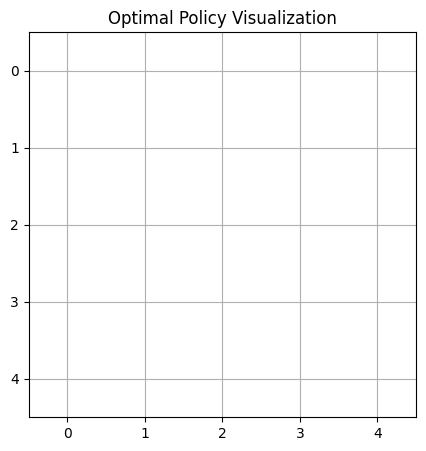



Episode 775:
Taxi starting position: 0
First customer request: D


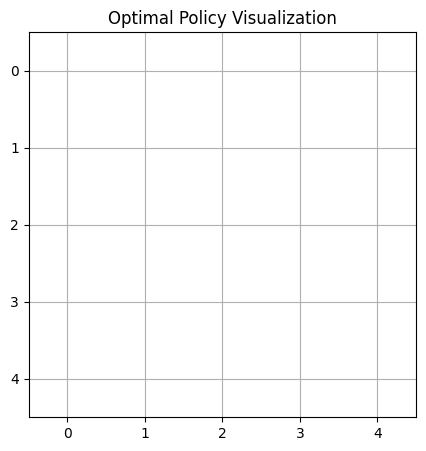



Episode 776:
Taxi starting position: 1
First customer request: A


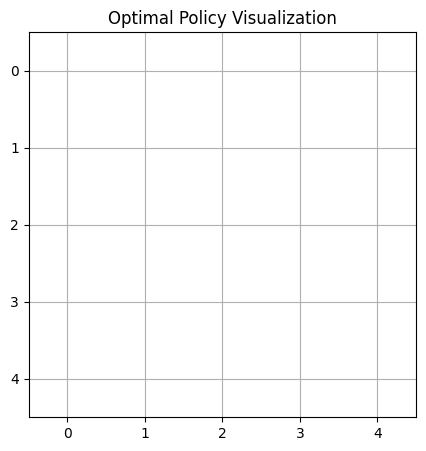



Episode 777:
Taxi starting position: 0
First customer request: C


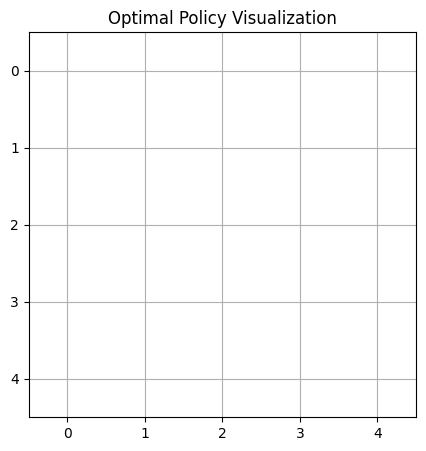



Episode 778:
Taxi starting position: 1
First customer request: A


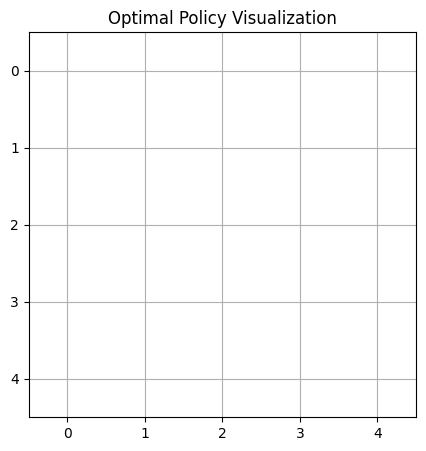



Episode 779:
Taxi starting position: 1
First customer request: C
Second customer request: A


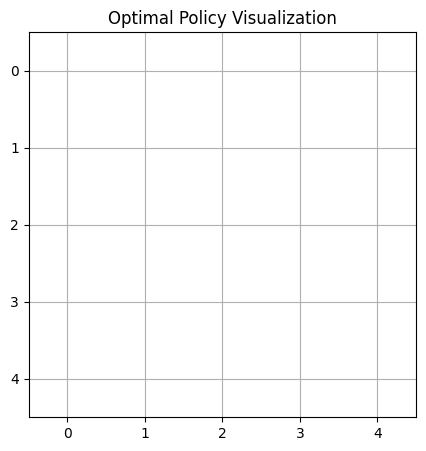



Episode 780:
Taxi starting position: 1
First customer request: A
Second customer request: C
Second customer is a premium customer.


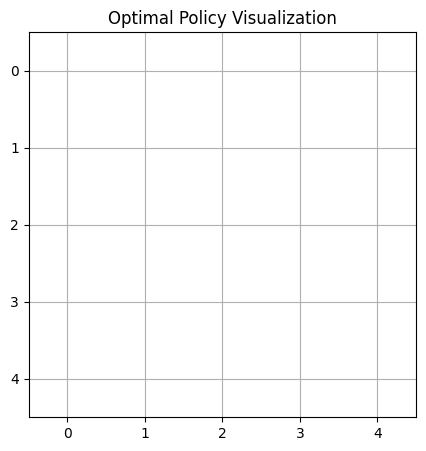



Episode 781:
Taxi starting position: 4
First customer request: C
Second customer request: C


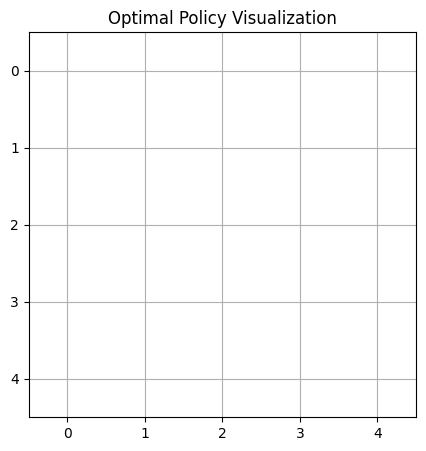



Episode 782:
Taxi starting position: 4
First customer request: B
Second customer request: D


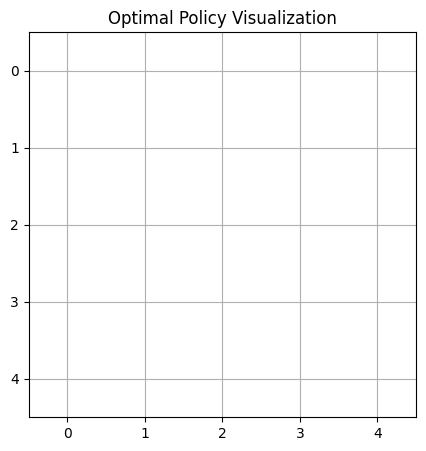



Episode 783:
Taxi starting position: 2
First customer request: C


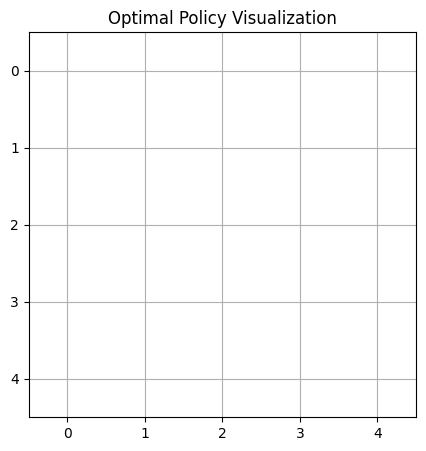



Episode 784:
Taxi starting position: 0
First customer request: C
Second customer request: A
Second customer is a premium customer.


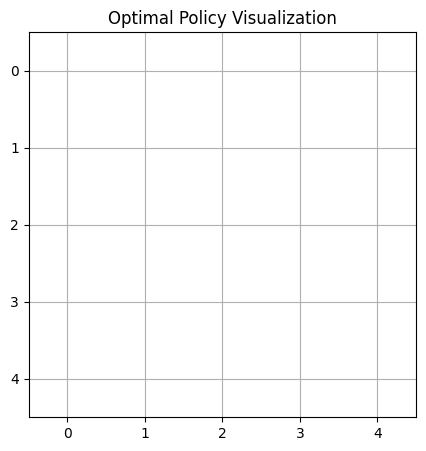



Episode 785:
Taxi starting position: 1
First customer request: C


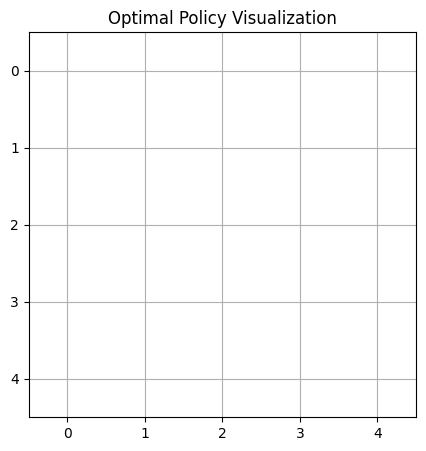



Episode 786:
Taxi starting position: 1
First customer request: C


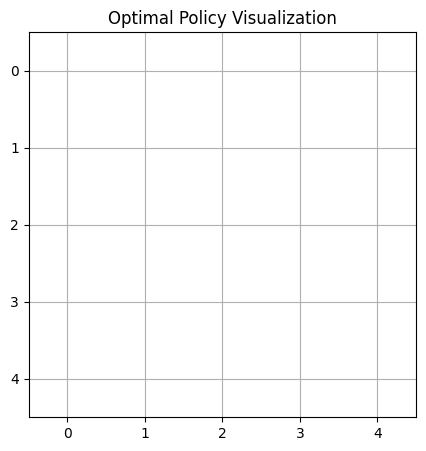



Episode 787:
Taxi starting position: 4
First customer request: D


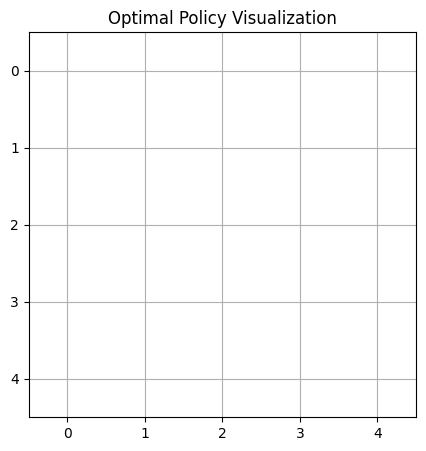



Episode 788:
Taxi starting position: 0
First customer request: C
Second customer request: B
Second customer is a premium customer.


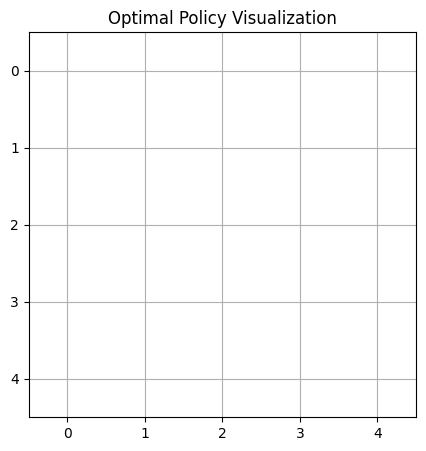



Episode 789:
Taxi starting position: 0
First customer request: C


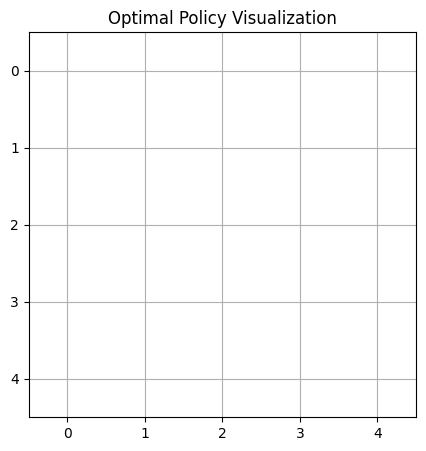



Episode 790:
Taxi starting position: 1
First customer request: B
Second customer request: B


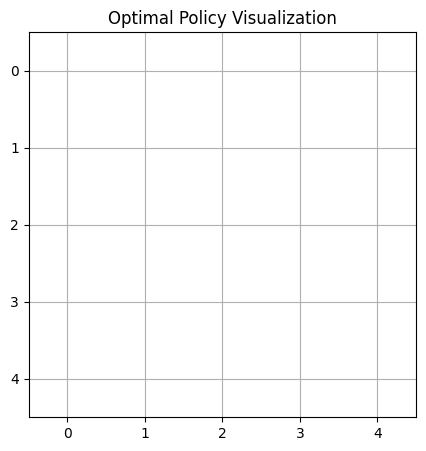



Episode 791:
Taxi starting position: 0
First customer request: D


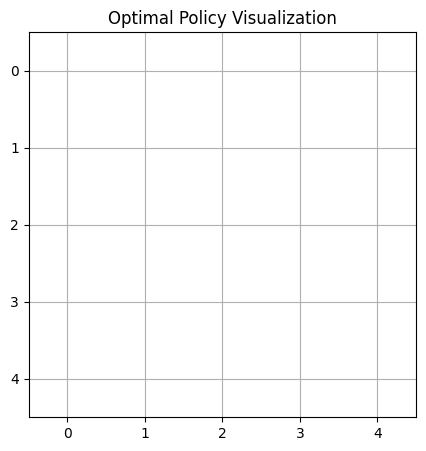



Episode 792:
Taxi starting position: 3
First customer request: A
Second customer request: C


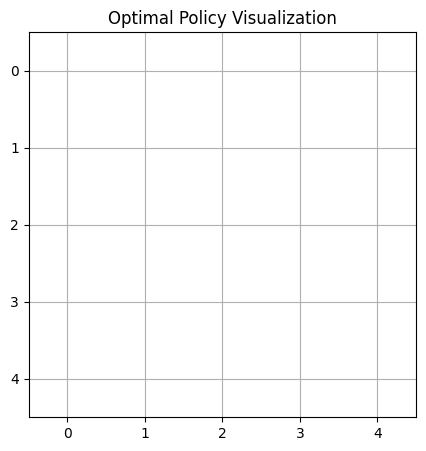



Episode 793:
Taxi starting position: 2
First customer request: C


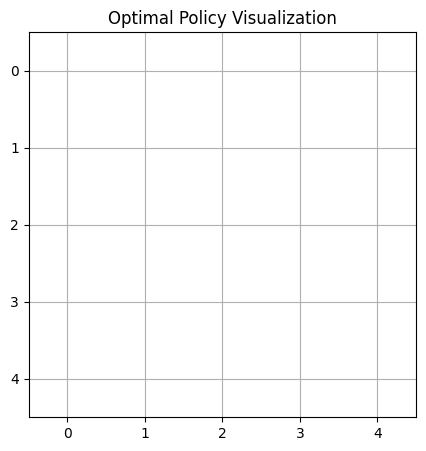



Episode 794:
Taxi starting position: 0
First customer request: C


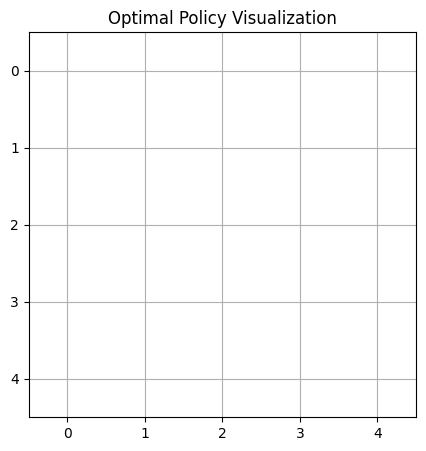



Episode 795:
Taxi starting position: 4
First customer request: C
Second customer request: D
Second customer is a premium customer.


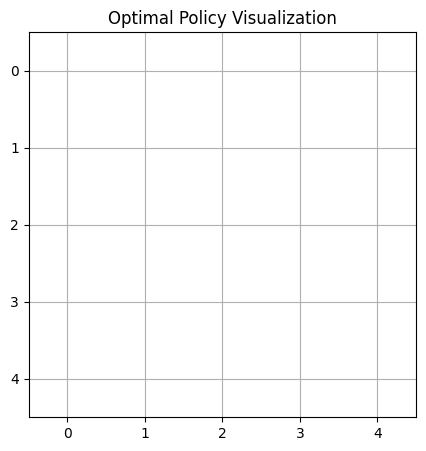



Episode 796:
Taxi starting position: 4
First customer request: B
Second customer request: B


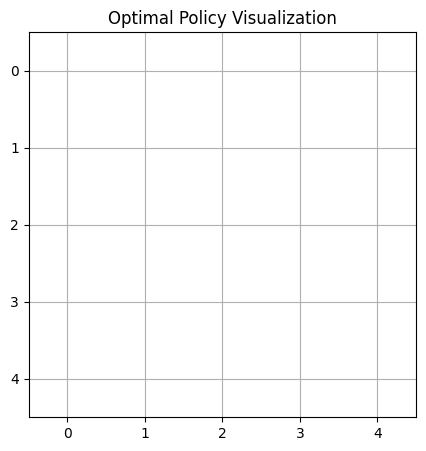



Episode 797:
Taxi starting position: 0
First customer request: B
Second customer request: A


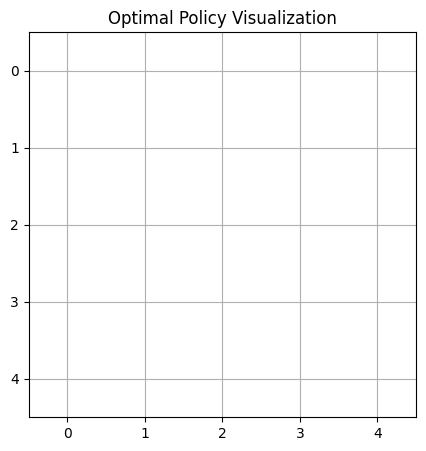



Episode 798:
Taxi starting position: 2
First customer request: A
Second customer request: A


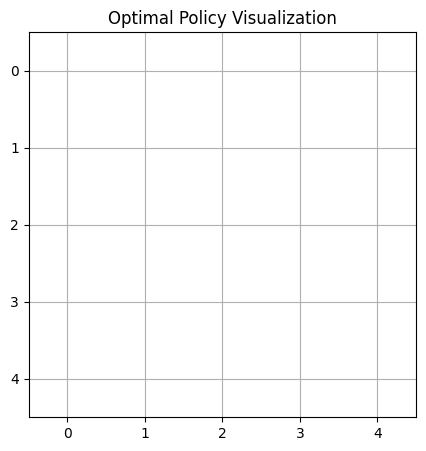



Episode 799:
Taxi starting position: 0
First customer request: C
Second customer request: D
Second customer is a premium customer.


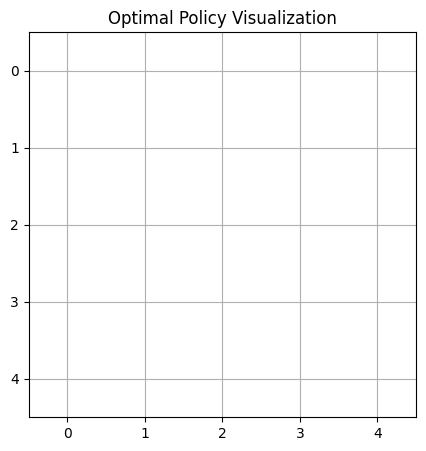



Episode 800:
Taxi starting position: 1
First customer request: D


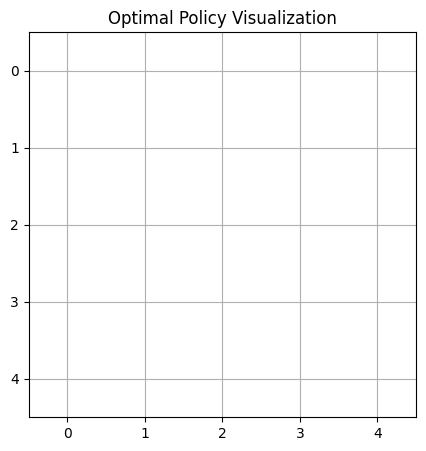



Episode 801:
Taxi starting position: 2
First customer request: A
Second customer request: D
Second customer is a premium customer.


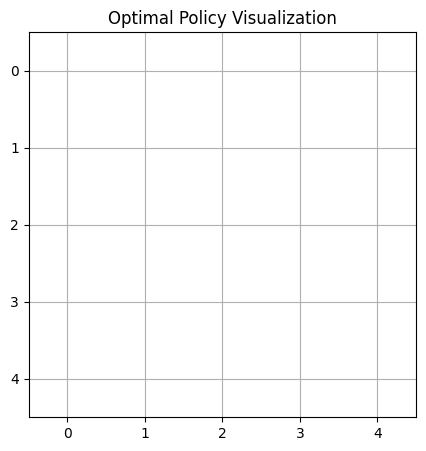



Episode 802:
Taxi starting position: 1
First customer request: A
Second customer request: D


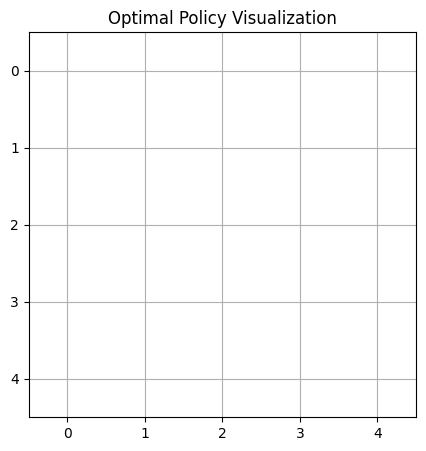



Episode 803:
Taxi starting position: 2
First customer request: D
Second customer request: C


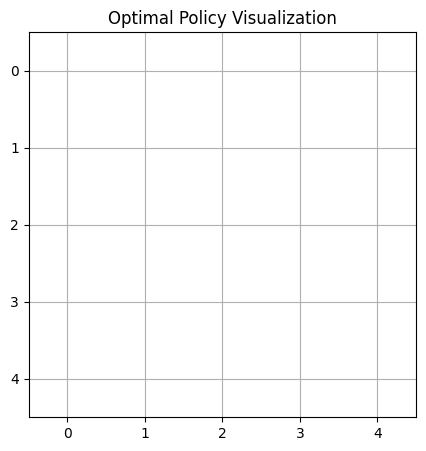



Episode 804:
Taxi starting position: 1
First customer request: B
Second customer request: D


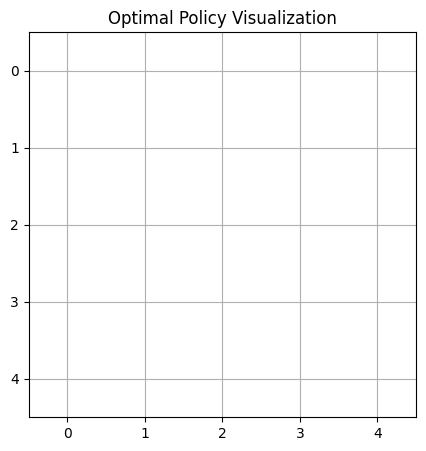



Episode 805:
Taxi starting position: 1
First customer request: D
Second customer request: B


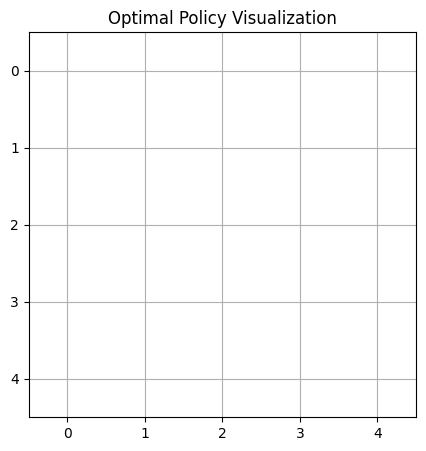



Episode 806:
Taxi starting position: 0
First customer request: C
Second customer request: B


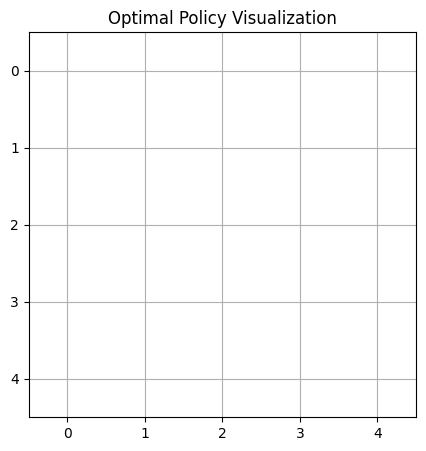



Episode 807:
Taxi starting position: 3
First customer request: A
Second customer request: D
Second customer is a premium customer.


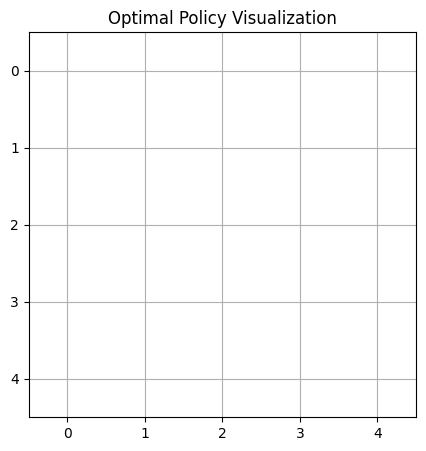



Episode 808:
Taxi starting position: 1
First customer request: C


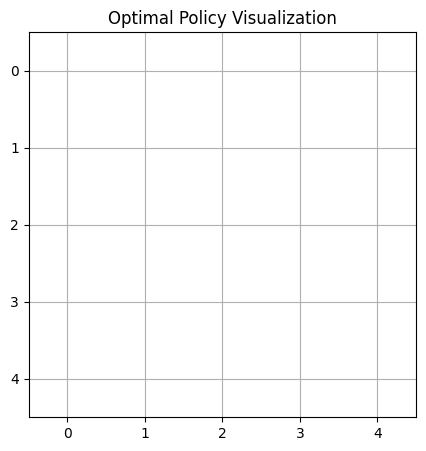



Episode 809:
Taxi starting position: 3
First customer request: A
Second customer request: D


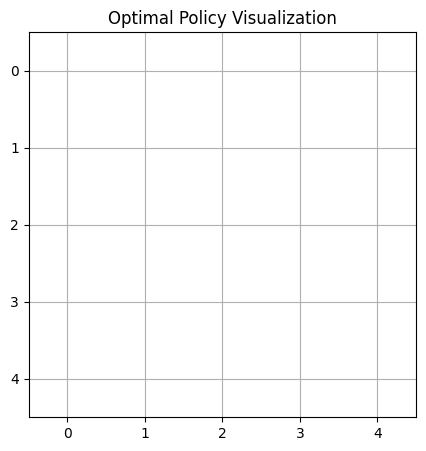



Episode 810:
Taxi starting position: 1
First customer request: A


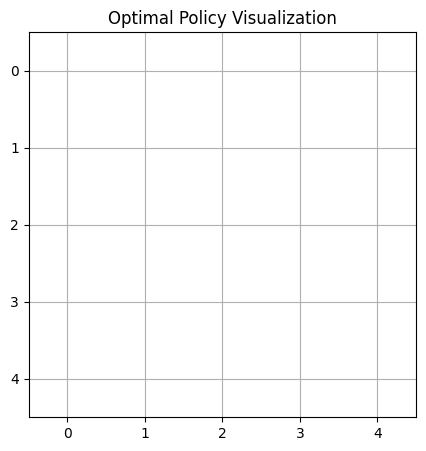



Episode 811:
Taxi starting position: 4
First customer request: C
Second customer request: D


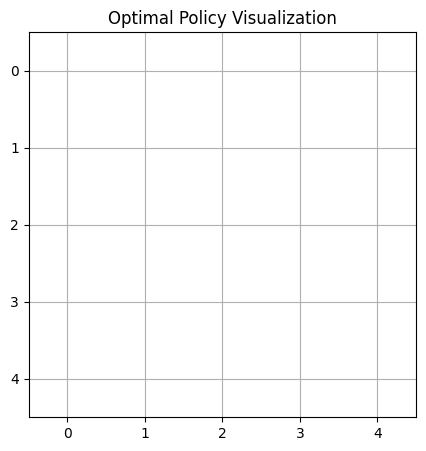



Episode 812:
Taxi starting position: 3
First customer request: C


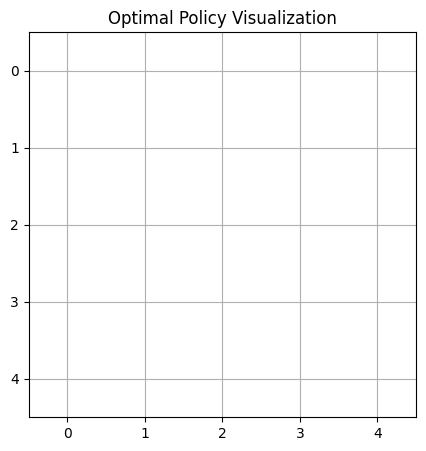



Episode 813:
Taxi starting position: 1
First customer request: D
Second customer request: A


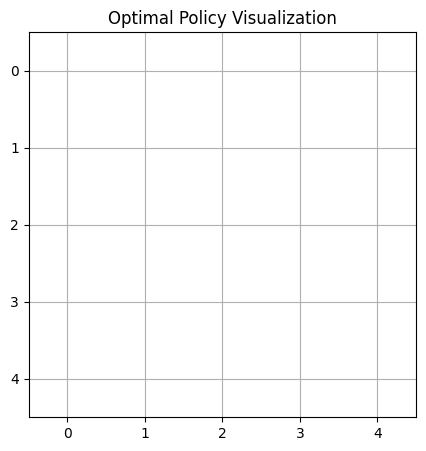



Episode 814:
Taxi starting position: 0
First customer request: D


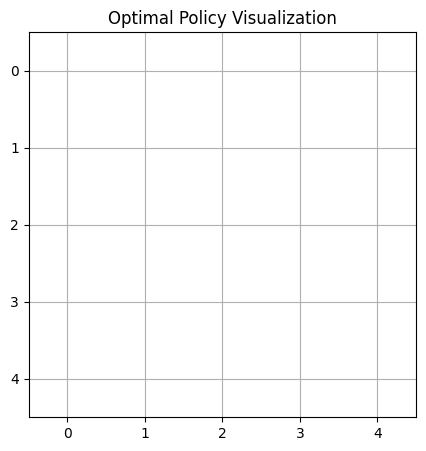



Episode 815:
Taxi starting position: 2
First customer request: A
Second customer request: B


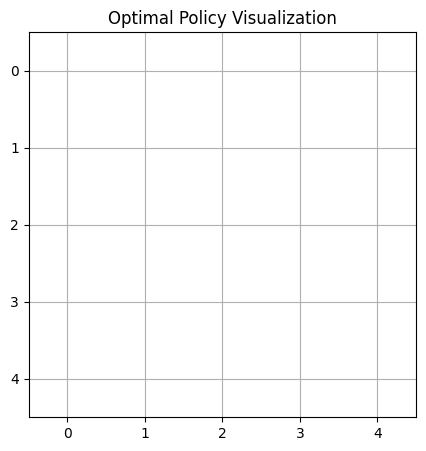



Episode 816:
Taxi starting position: 4
First customer request: C
Second customer request: B


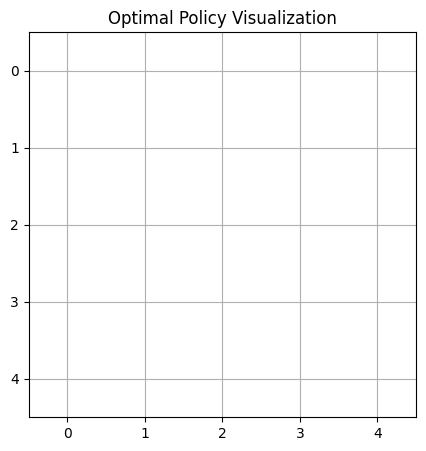



Episode 817:
Taxi starting position: 1
First customer request: C
Second customer request: D


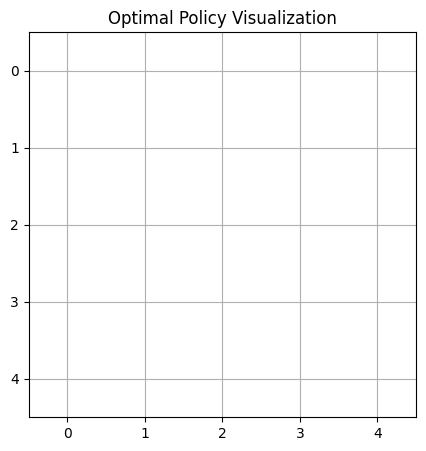



Episode 818:
Taxi starting position: 4
First customer request: A
Second customer request: D


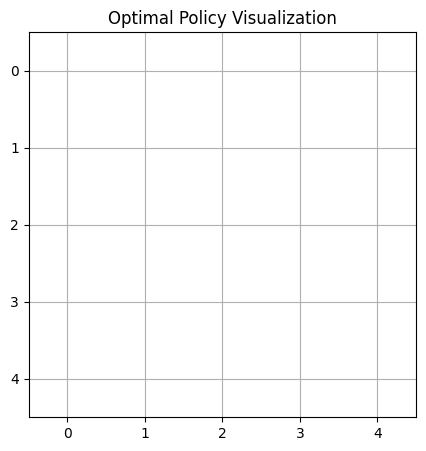



Episode 819:
Taxi starting position: 3
First customer request: D


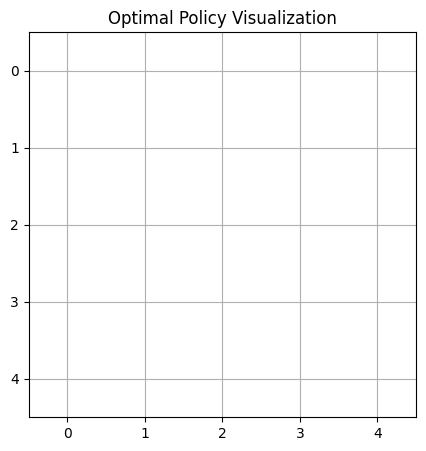



Episode 820:
Taxi starting position: 4
First customer request: C


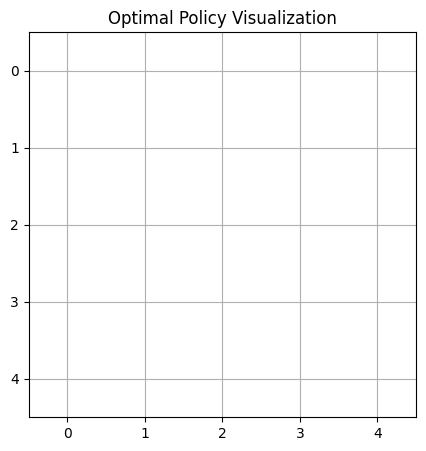



Episode 821:
Taxi starting position: 1
First customer request: D
Second customer request: D


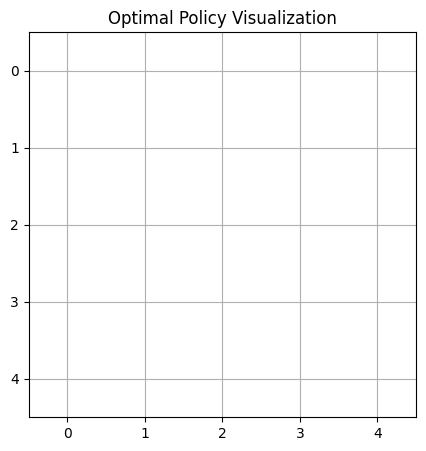



Episode 822:
Taxi starting position: 3
First customer request: A


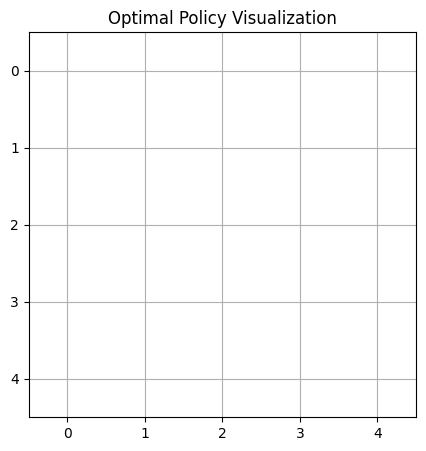



Episode 823:
Taxi starting position: 1
First customer request: D


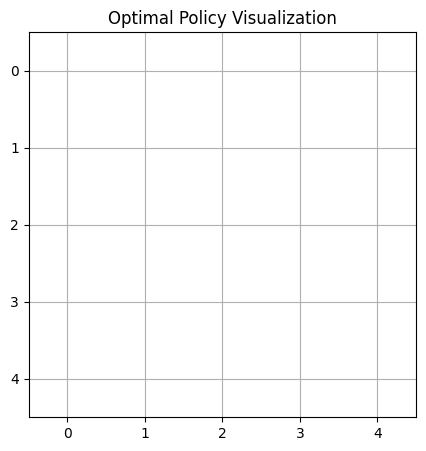



Episode 824:
Taxi starting position: 0
First customer request: B
Second customer request: C


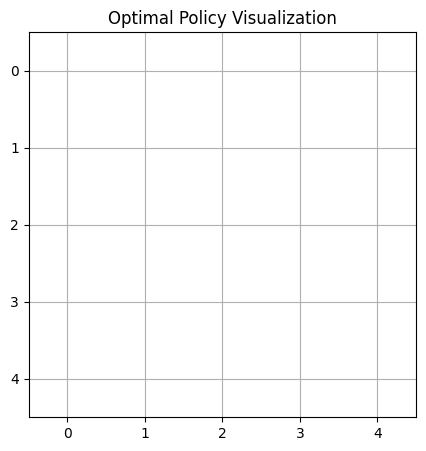



Episode 825:
Taxi starting position: 3
First customer request: A
Second customer request: D


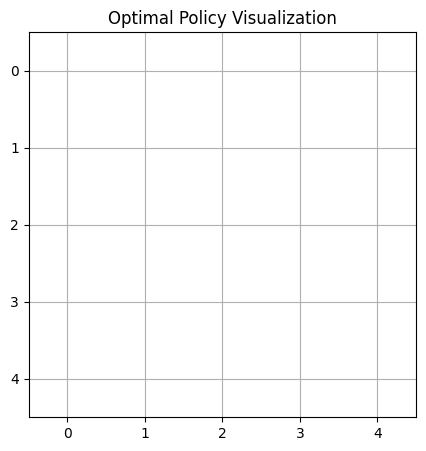



Episode 826:
Taxi starting position: 4
First customer request: B
Second customer request: B


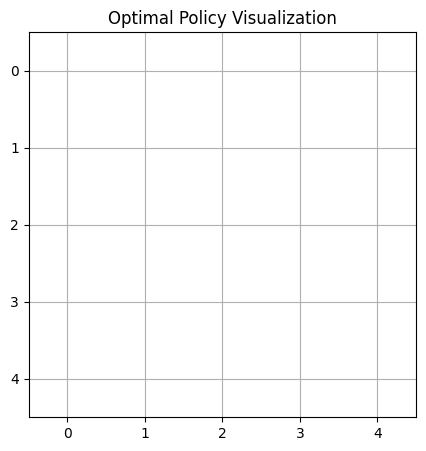



Episode 827:
Taxi starting position: 1
First customer request: D
Second customer request: B


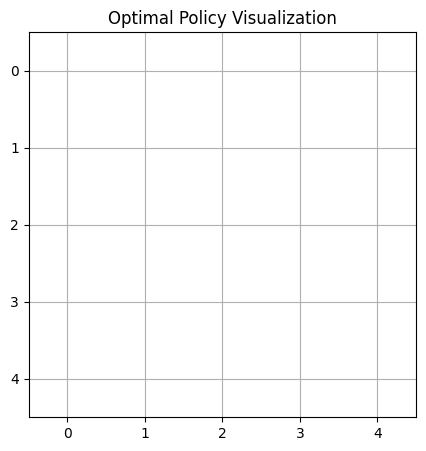



Episode 828:
Taxi starting position: 1
First customer request: A
Second customer request: C


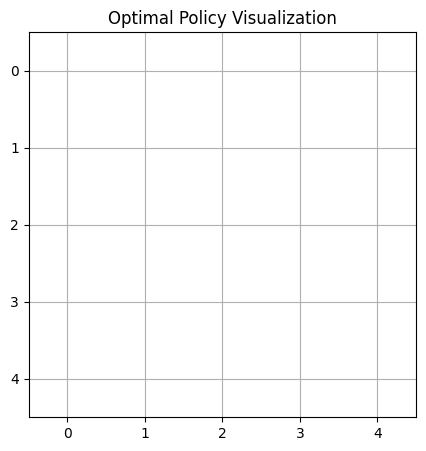



Episode 829:
Taxi starting position: 3
First customer request: D


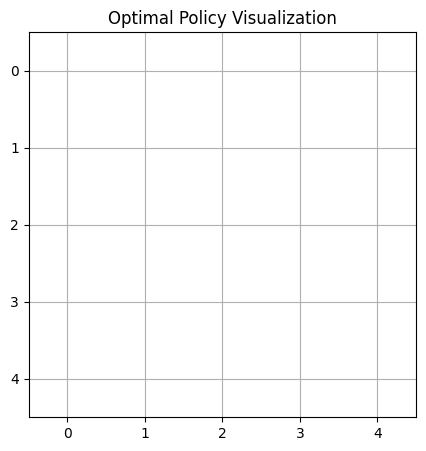



Episode 830:
Taxi starting position: 1
First customer request: C
Second customer request: B


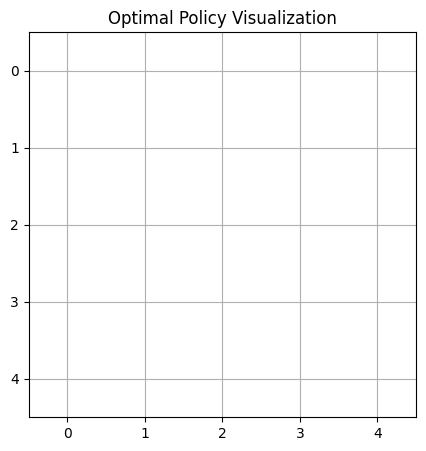



Episode 831:
Taxi starting position: 1
First customer request: B
Second customer request: A


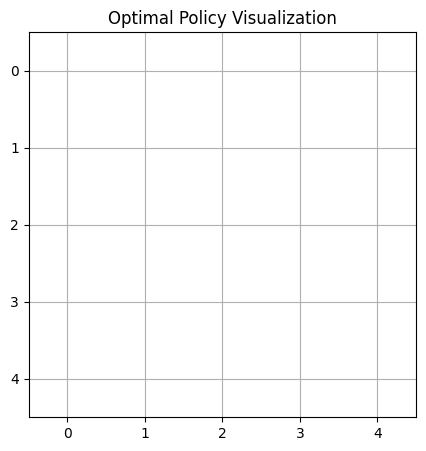



Episode 832:
Taxi starting position: 2
First customer request: C
Second customer request: A
Second customer is a premium customer.


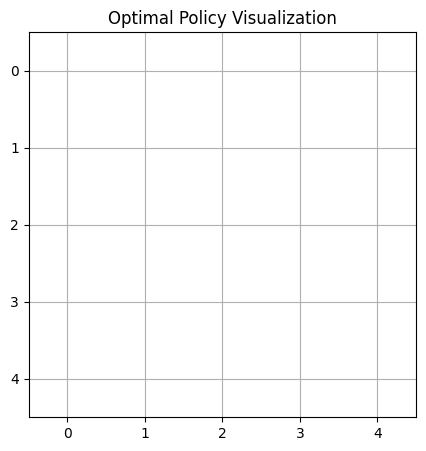



Episode 833:
Taxi starting position: 1
First customer request: B
Second customer request: C


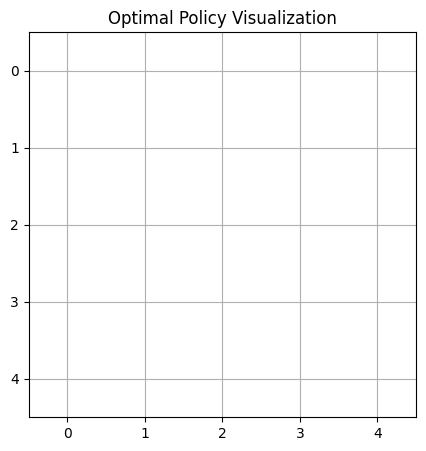



Episode 834:
Taxi starting position: 4
First customer request: C
Second customer request: D
Second customer is a premium customer.


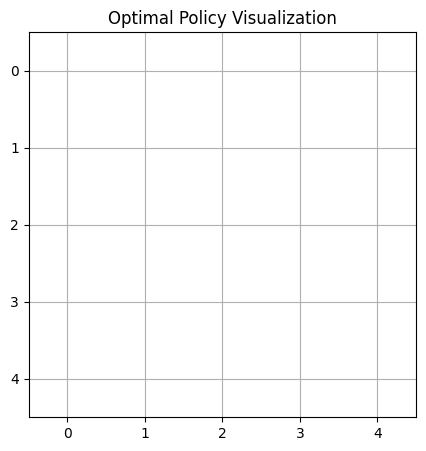



Episode 835:
Taxi starting position: 0
First customer request: A
Second customer request: A


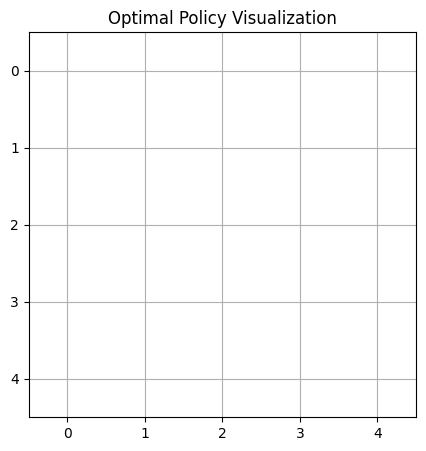



Episode 836:
Taxi starting position: 0
First customer request: D


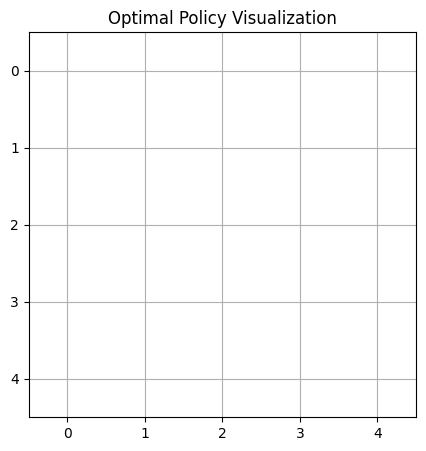



Episode 837:
Taxi starting position: 4
First customer request: D
Second customer request: D


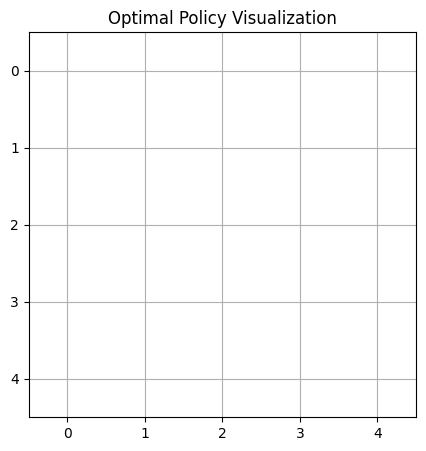



Episode 838:
Taxi starting position: 3
First customer request: A
Second customer request: A


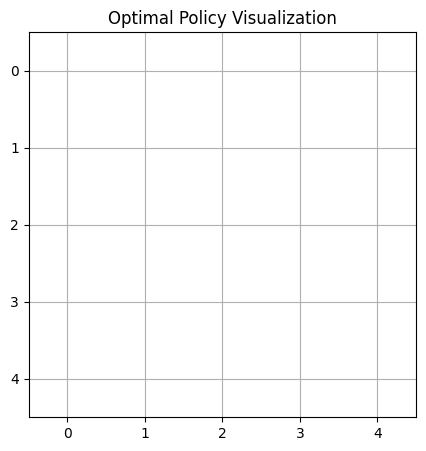



Episode 839:
Taxi starting position: 1
First customer request: D


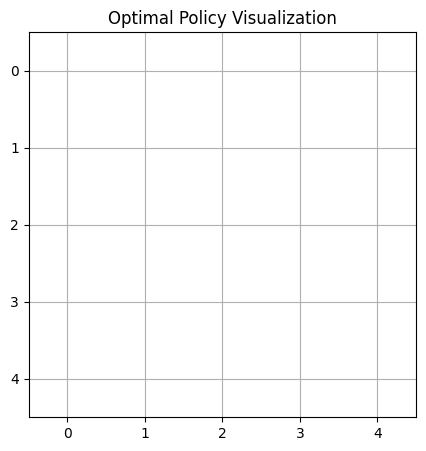



Episode 840:
Taxi starting position: 1
First customer request: C


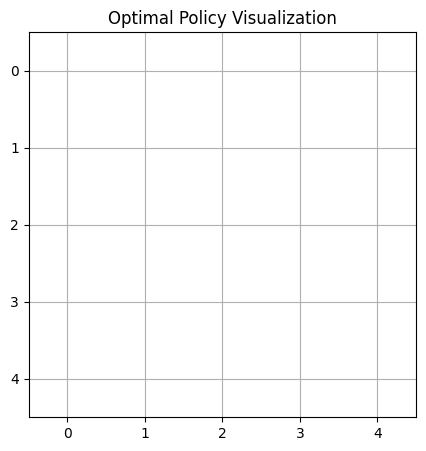



Episode 841:
Taxi starting position: 1
First customer request: A
Second customer request: D


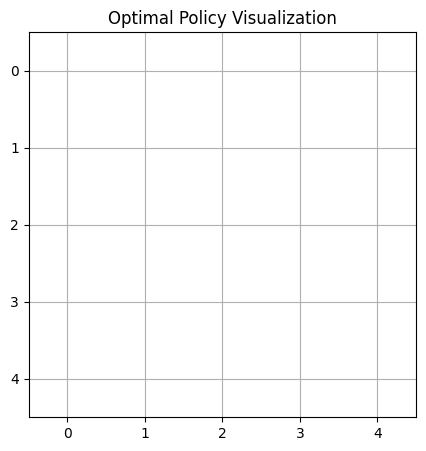



Episode 842:
Taxi starting position: 4
First customer request: B
Second customer request: B


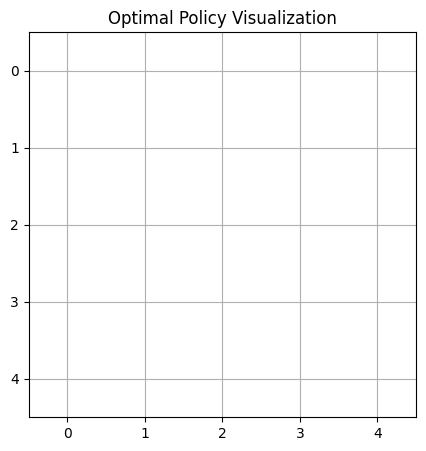



Episode 843:
Taxi starting position: 3
First customer request: A
Second customer request: C
Second customer is a premium customer.


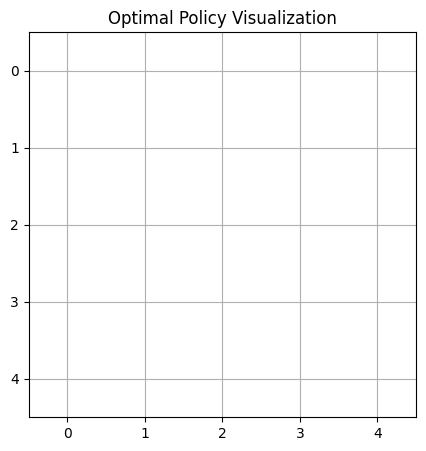



Episode 844:
Taxi starting position: 4
First customer request: D
Second customer request: B


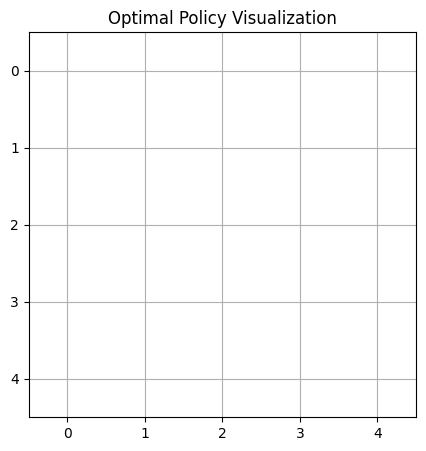



Episode 845:
Taxi starting position: 2
First customer request: D


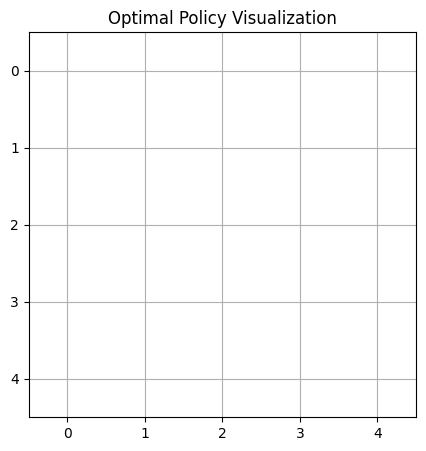



Episode 846:
Taxi starting position: 1
First customer request: C
Second customer request: B
Second customer is a premium customer.


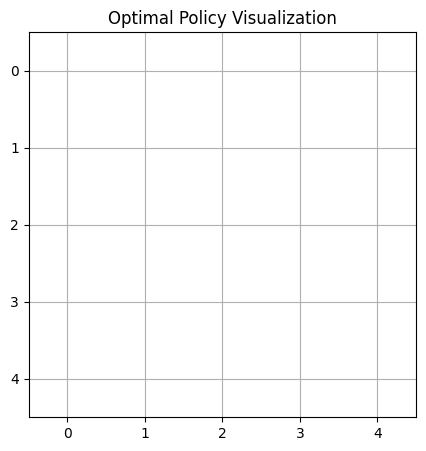



Episode 847:
Taxi starting position: 4
First customer request: B


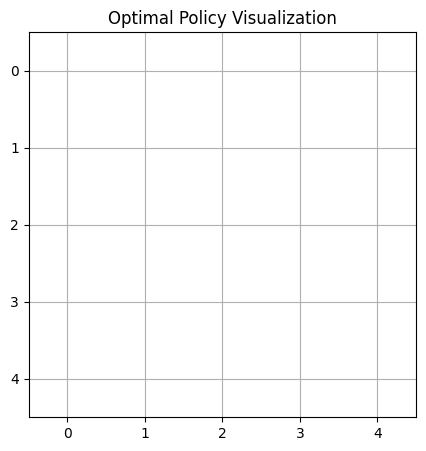



Episode 848:
Taxi starting position: 3
First customer request: C
Second customer request: C
Second customer is a premium customer.


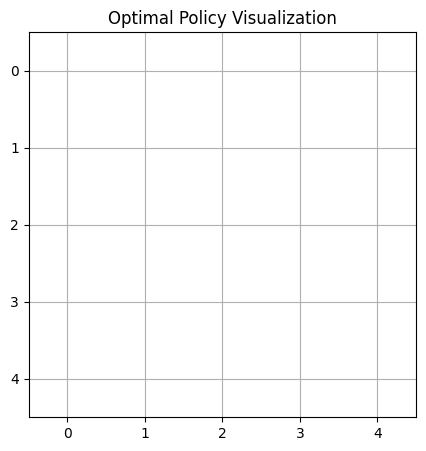



Episode 849:
Taxi starting position: 2
First customer request: A
Second customer request: C


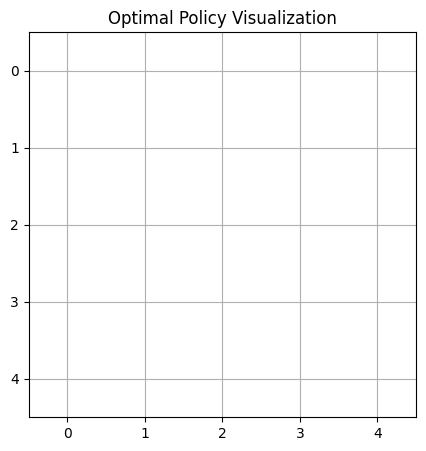



Episode 850:
Taxi starting position: 0
First customer request: D
Second customer request: D
Second customer is a premium customer.


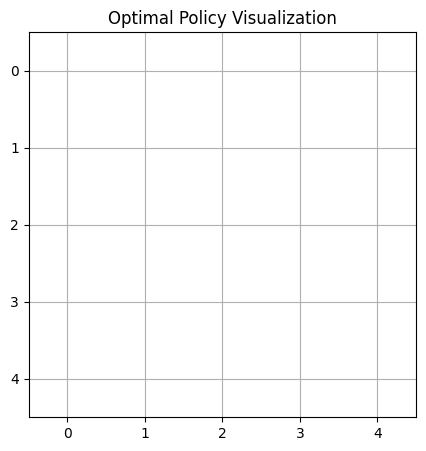



Episode 851:
Taxi starting position: 4
First customer request: C


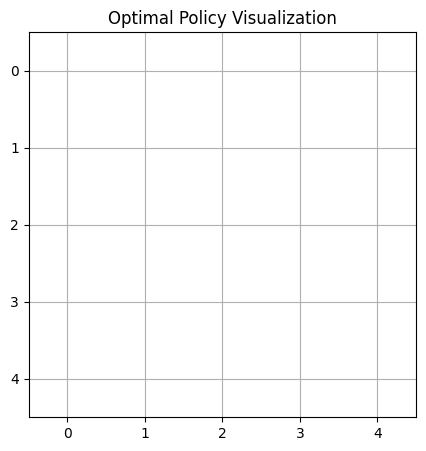



Episode 852:
Taxi starting position: 2
First customer request: C


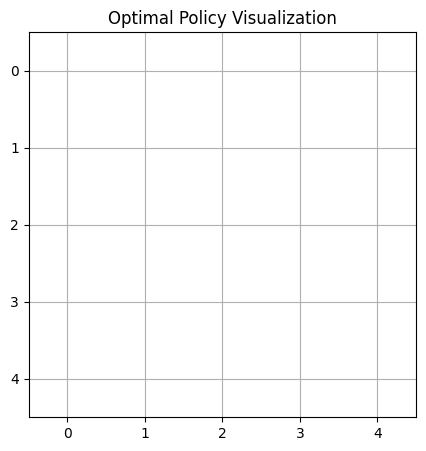



Episode 853:
Taxi starting position: 2
First customer request: B


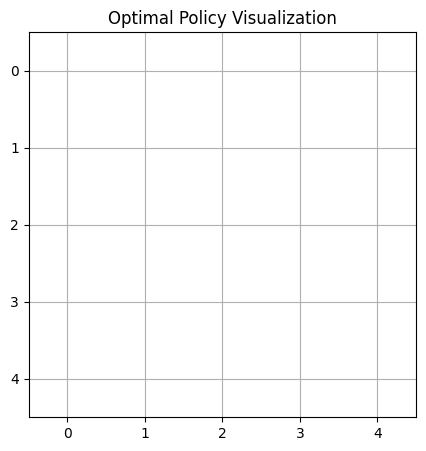



Episode 854:
Taxi starting position: 4
First customer request: B
Second customer request: D


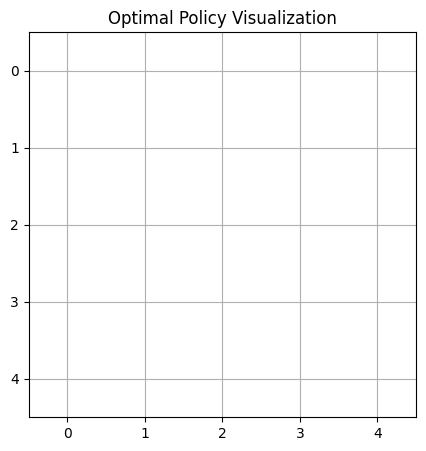



Episode 855:
Taxi starting position: 3
First customer request: B


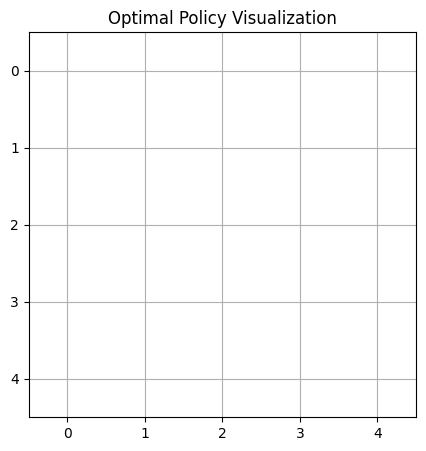



Episode 856:
Taxi starting position: 4
First customer request: C
Second customer request: C


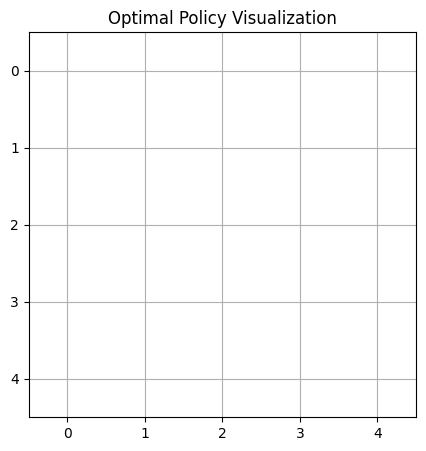



Episode 857:
Taxi starting position: 1
First customer request: C
Second customer request: D
Second customer is a premium customer.


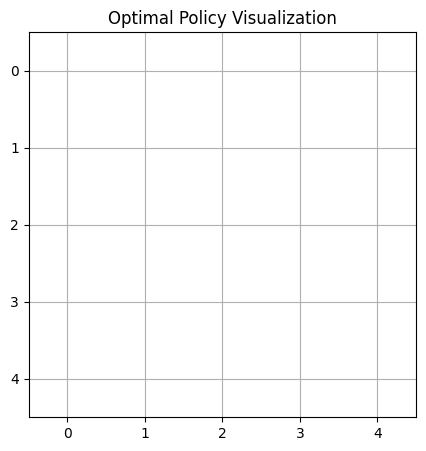



Episode 858:
Taxi starting position: 3
First customer request: D
Second customer request: B


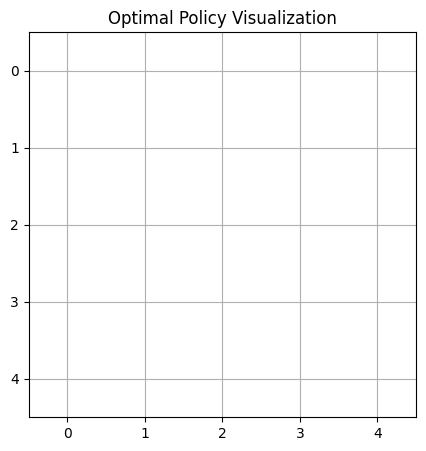



Episode 859:
Taxi starting position: 4
First customer request: D
Second customer request: A


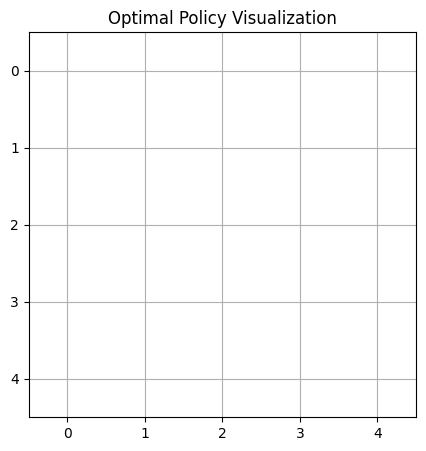



Episode 860:
Taxi starting position: 2
First customer request: B
Second customer request: B


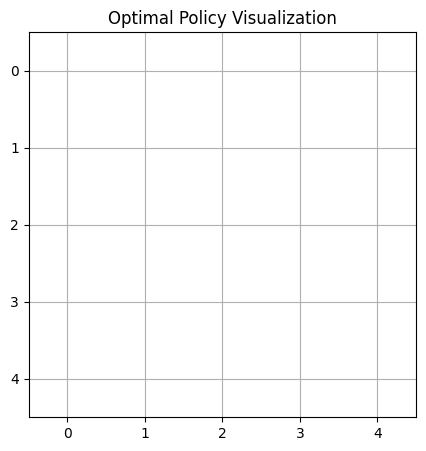



Episode 861:
Taxi starting position: 4
First customer request: D
Second customer request: D


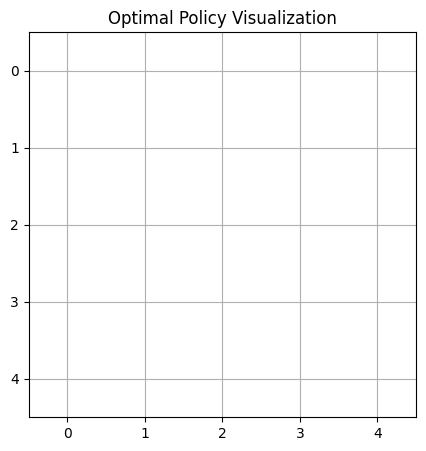



Episode 862:
Taxi starting position: 2
First customer request: C
Second customer request: B


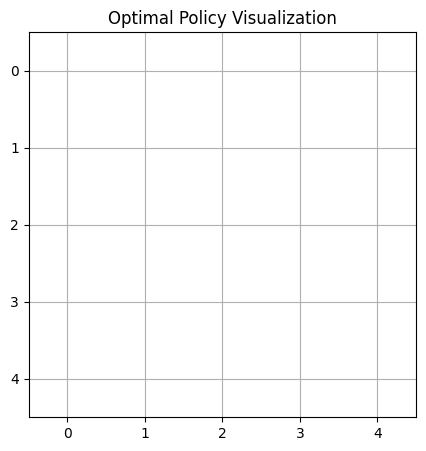



Episode 863:
Taxi starting position: 0
First customer request: B


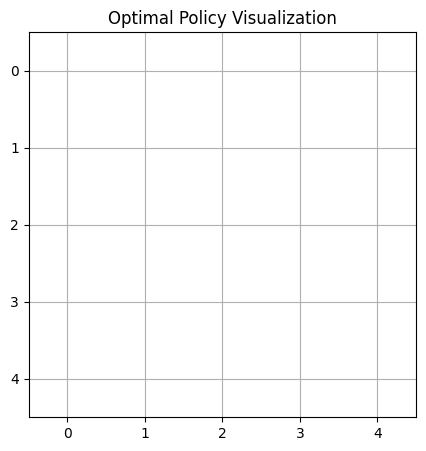



Episode 864:
Taxi starting position: 2
First customer request: A
Second customer request: D


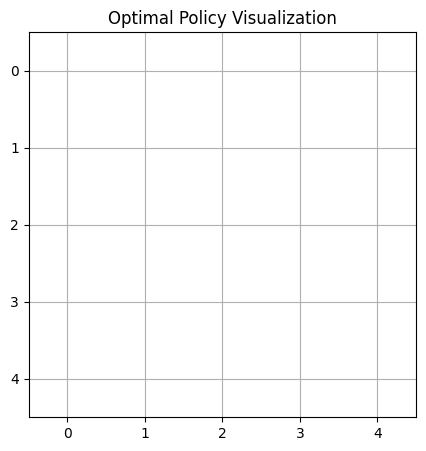



Episode 865:
Taxi starting position: 1
First customer request: A
Second customer request: B
Second customer is a premium customer.


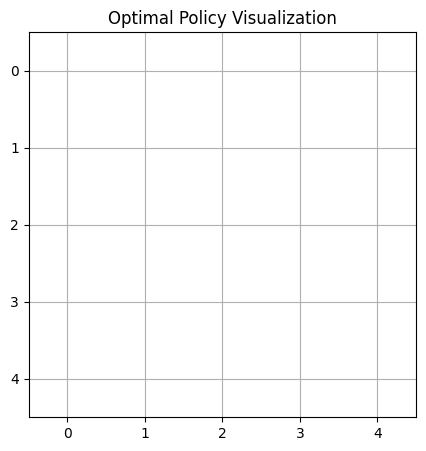



Episode 866:
Taxi starting position: 3
First customer request: C


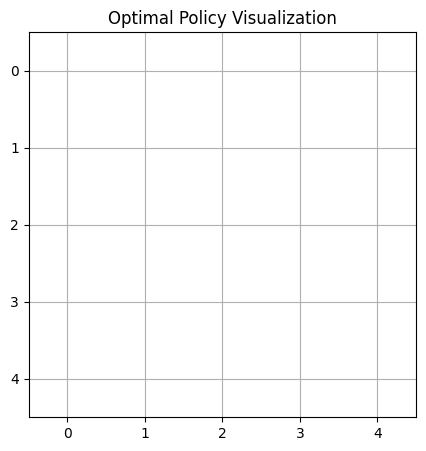



Episode 867:
Taxi starting position: 1
First customer request: A
Second customer request: B


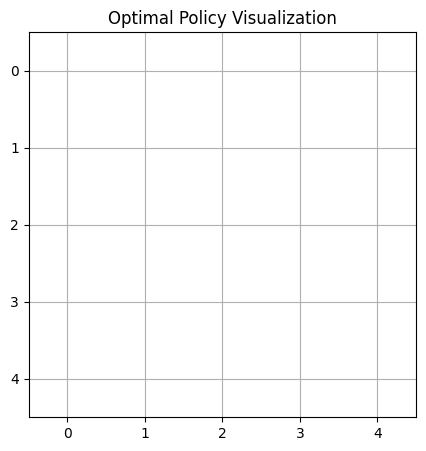



Episode 868:
Taxi starting position: 4
First customer request: B
Second customer request: B


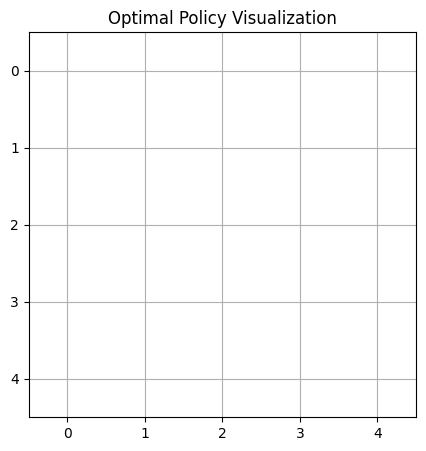



Episode 869:
Taxi starting position: 4
First customer request: C


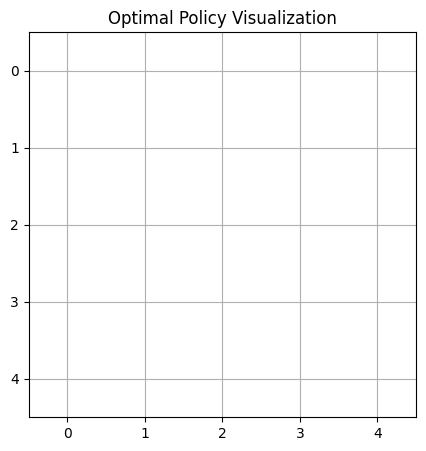



Episode 870:
Taxi starting position: 1
First customer request: B


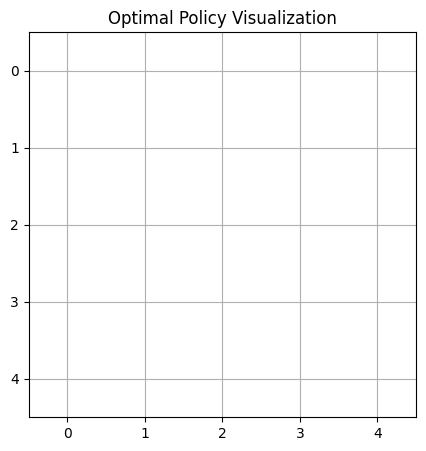



Episode 871:
Taxi starting position: 1
First customer request: A


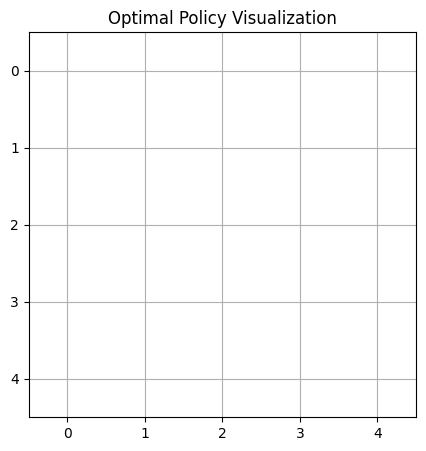



Episode 872:
Taxi starting position: 1
First customer request: B


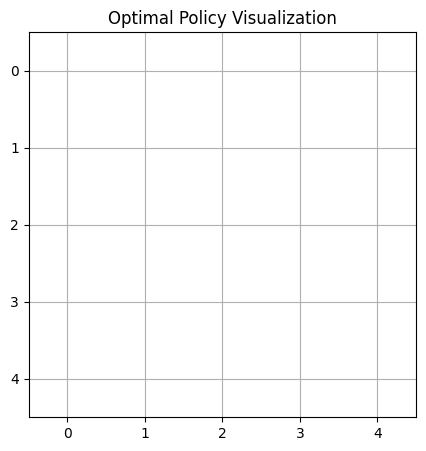



Episode 873:
Taxi starting position: 0
First customer request: D
Second customer request: D


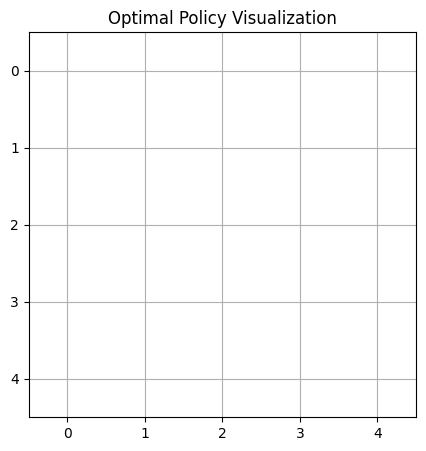



Episode 874:
Taxi starting position: 2
First customer request: A
Second customer request: A


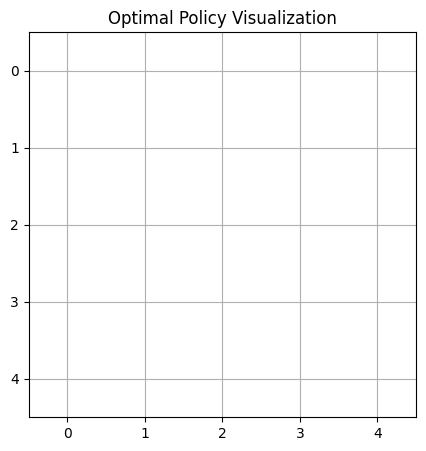



Episode 875:
Taxi starting position: 2
First customer request: A
Second customer request: C


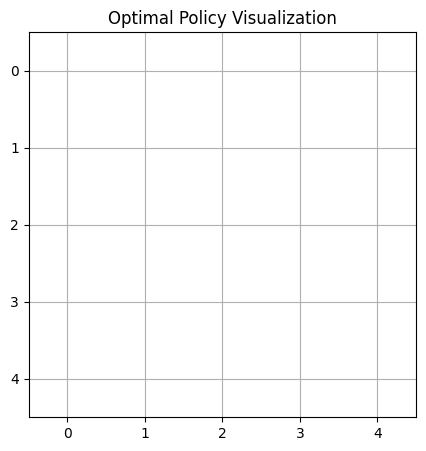



Episode 876:
Taxi starting position: 3
First customer request: D


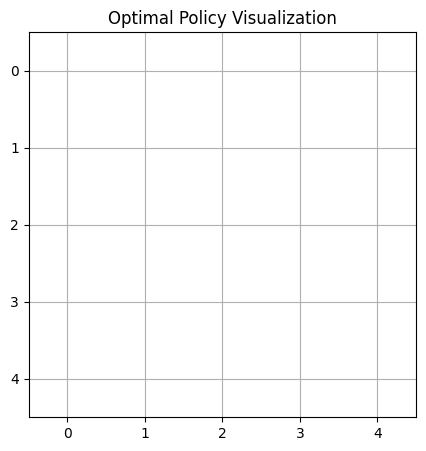



Episode 877:
Taxi starting position: 0
First customer request: A


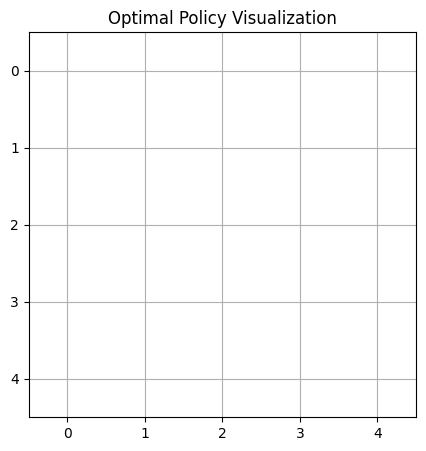



Episode 878:
Taxi starting position: 2
First customer request: B
Second customer request: C


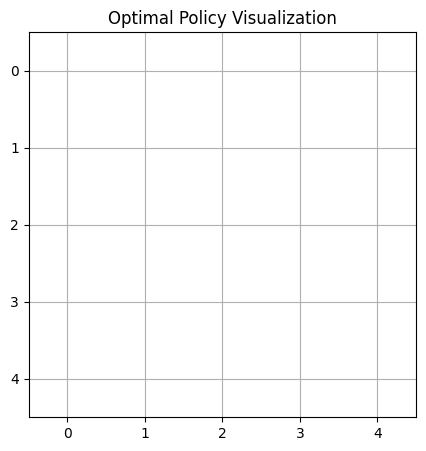



Episode 879:
Taxi starting position: 4
First customer request: D


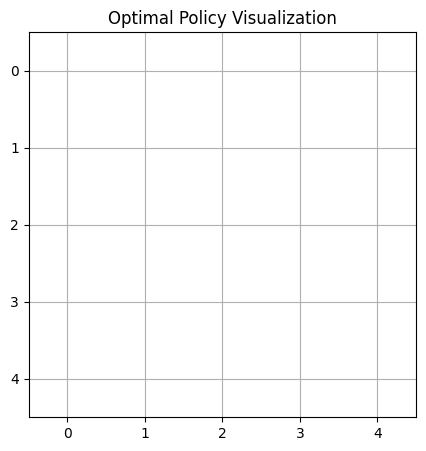



Episode 880:
Taxi starting position: 1
First customer request: D


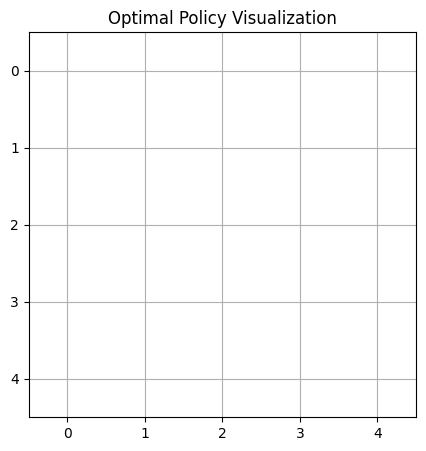



Episode 881:
Taxi starting position: 2
First customer request: B
Second customer request: D
Second customer is a premium customer.


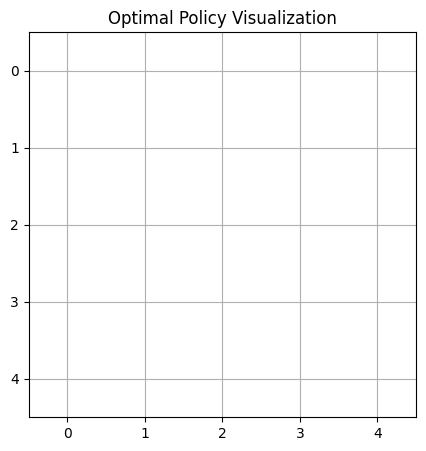



Episode 882:
Taxi starting position: 2
First customer request: A


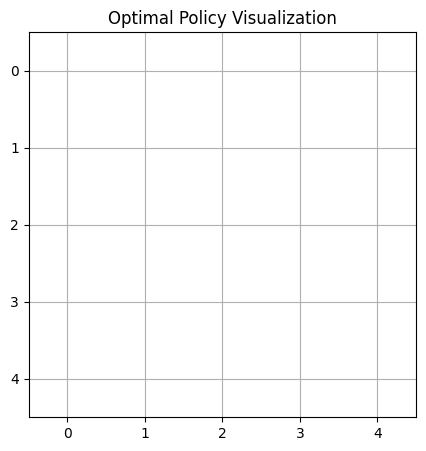



Episode 883:
Taxi starting position: 0
First customer request: B
Second customer request: A


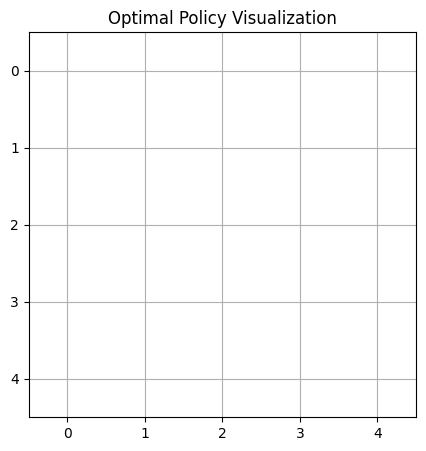



Episode 884:
Taxi starting position: 3
First customer request: D
Second customer request: B
Second customer is a premium customer.


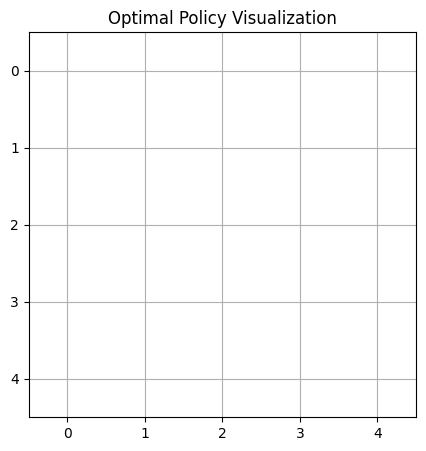



Episode 885:
Taxi starting position: 1
First customer request: A


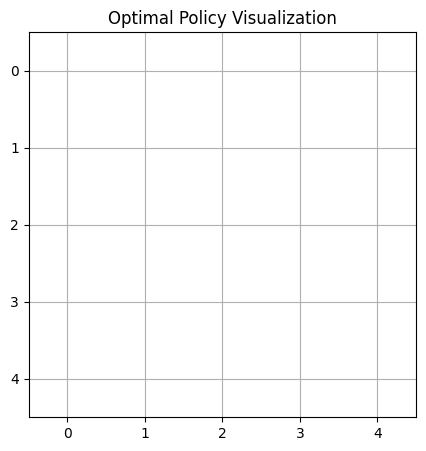



Episode 886:
Taxi starting position: 3
First customer request: D


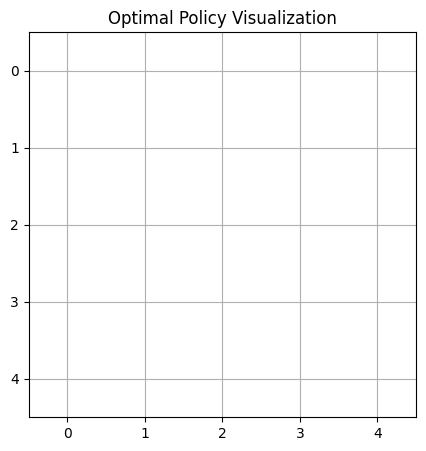



Episode 887:
Taxi starting position: 1
First customer request: B


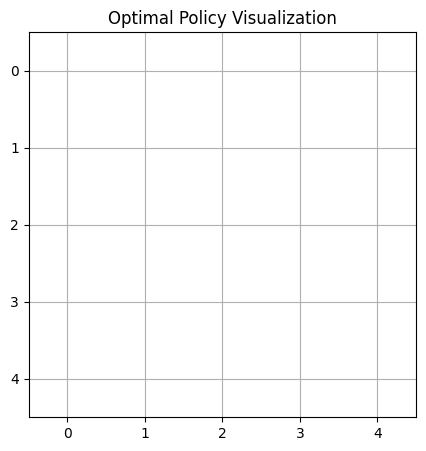



Episode 888:
Taxi starting position: 2
First customer request: B


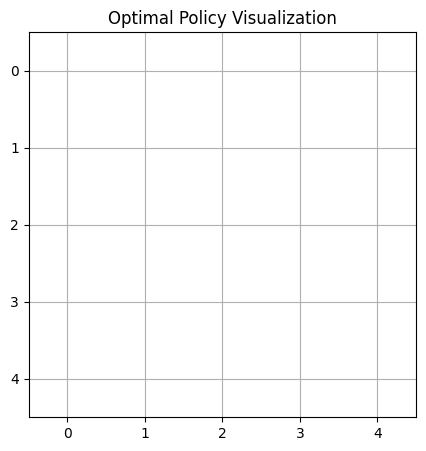



Episode 889:
Taxi starting position: 0
First customer request: C


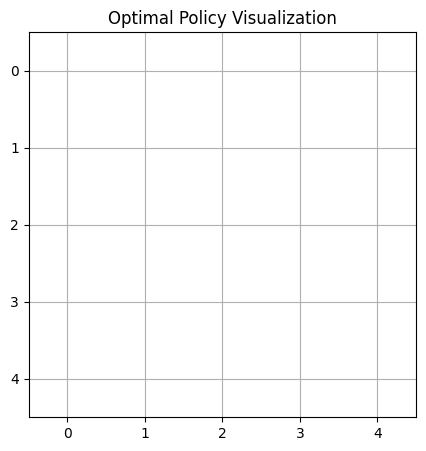



Episode 890:
Taxi starting position: 0
First customer request: A
Second customer request: B
Second customer is a premium customer.


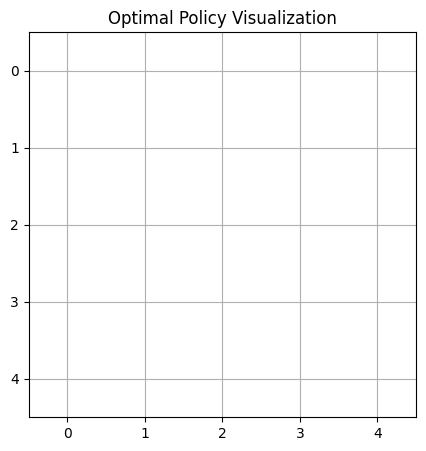



Episode 891:
Taxi starting position: 0
First customer request: B


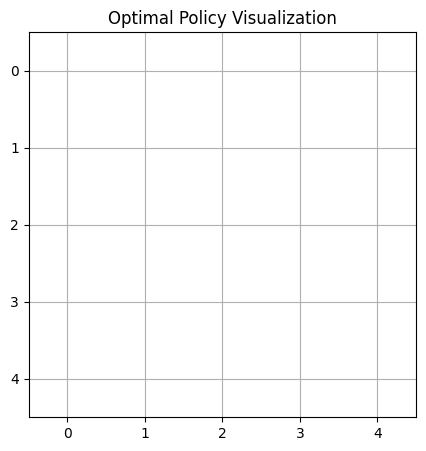



Episode 892:
Taxi starting position: 2
First customer request: B
Second customer request: C


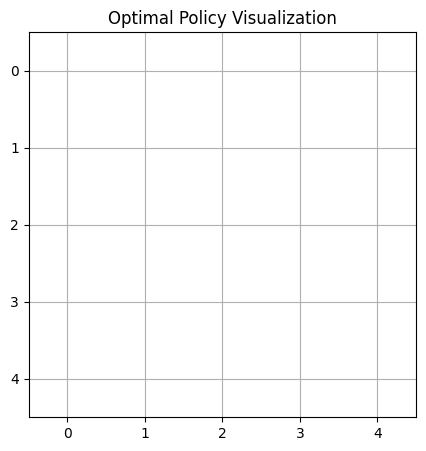



Episode 893:
Taxi starting position: 4
First customer request: C


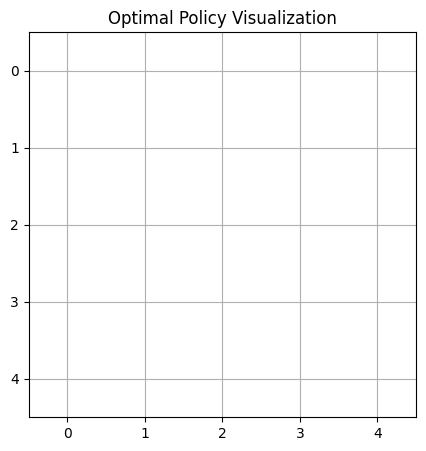



Episode 894:
Taxi starting position: 4
First customer request: A


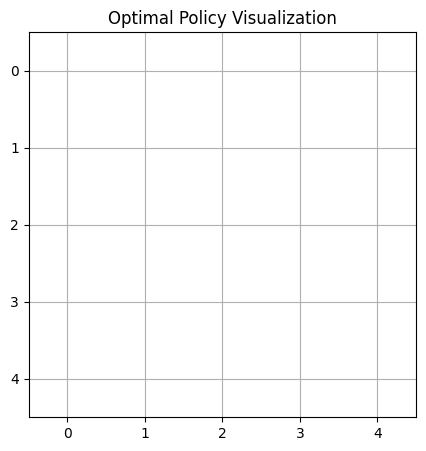



Episode 895:
Taxi starting position: 3
First customer request: A


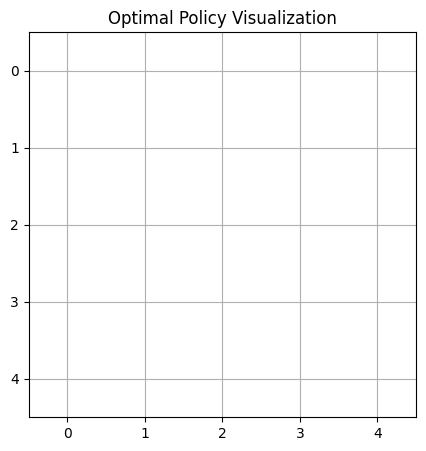



Episode 896:
Taxi starting position: 4
First customer request: C


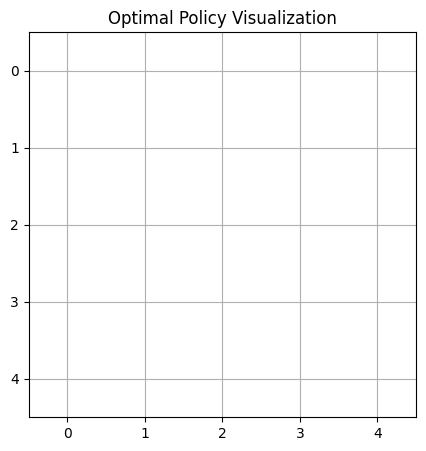



Episode 897:
Taxi starting position: 2
First customer request: A


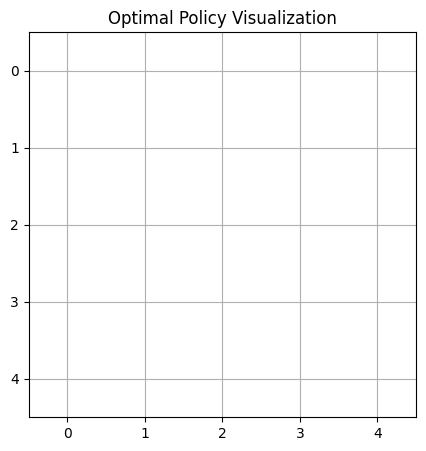



Episode 898:
Taxi starting position: 0
First customer request: B


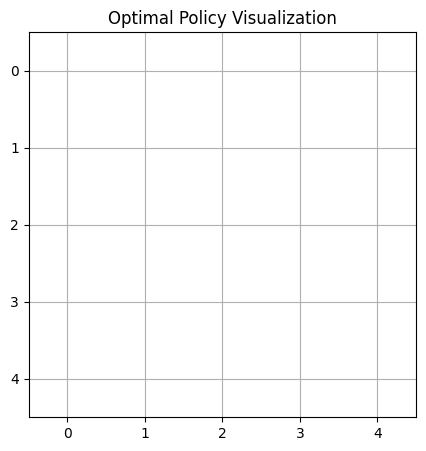



Episode 899:
Taxi starting position: 3
First customer request: D


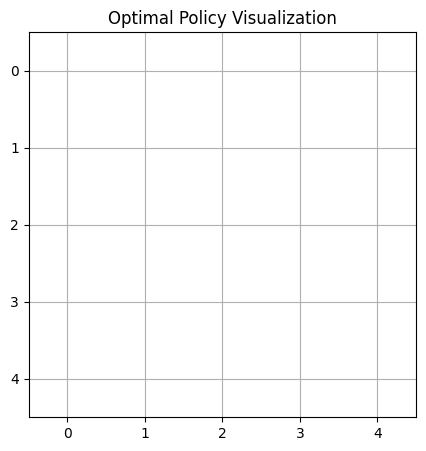



Episode 900:
Taxi starting position: 4
First customer request: A
Second customer request: D


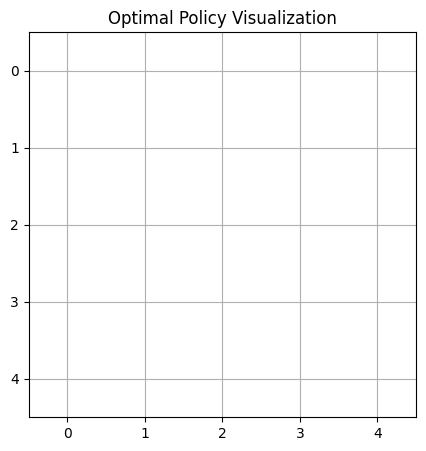



Episode 901:
Taxi starting position: 0
First customer request: D
Second customer request: D
Second customer is a premium customer.


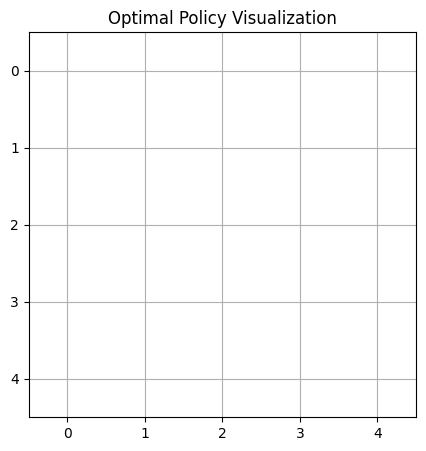



Episode 902:
Taxi starting position: 1
First customer request: B
Second customer request: A


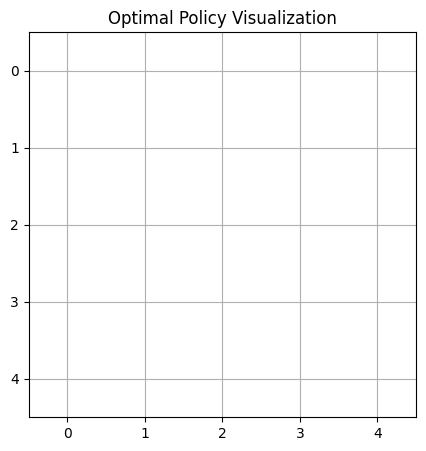



Episode 903:
Taxi starting position: 2
First customer request: B
Second customer request: D


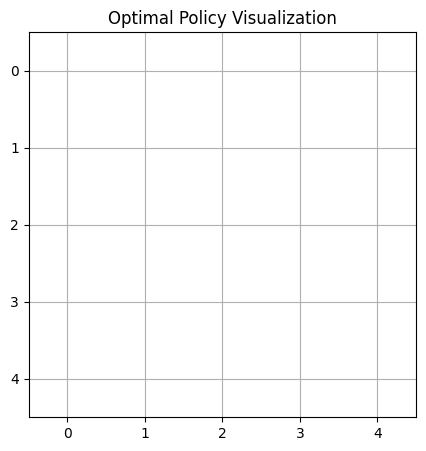



Episode 904:
Taxi starting position: 4
First customer request: C


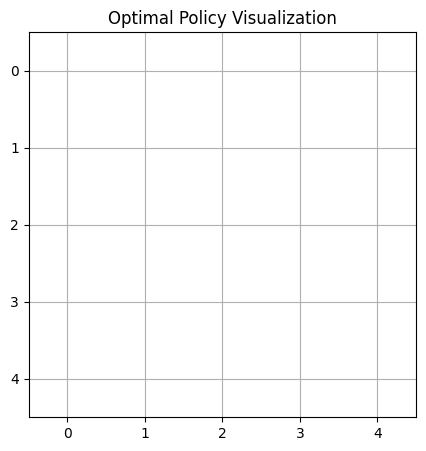



Episode 905:
Taxi starting position: 3
First customer request: C
Second customer request: B
Second customer is a premium customer.


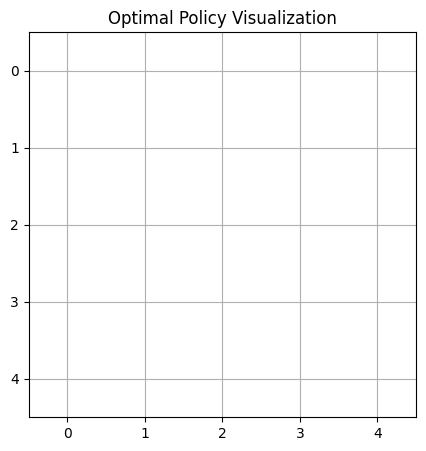



Episode 906:
Taxi starting position: 1
First customer request: C


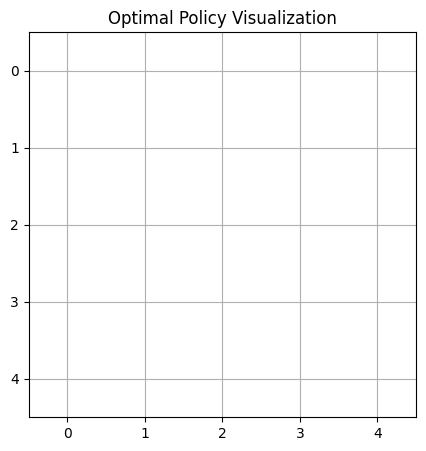



Episode 907:
Taxi starting position: 1
First customer request: B
Second customer request: D


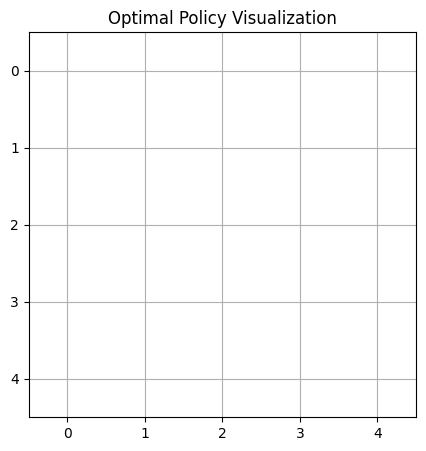



Episode 908:
Taxi starting position: 4
First customer request: D


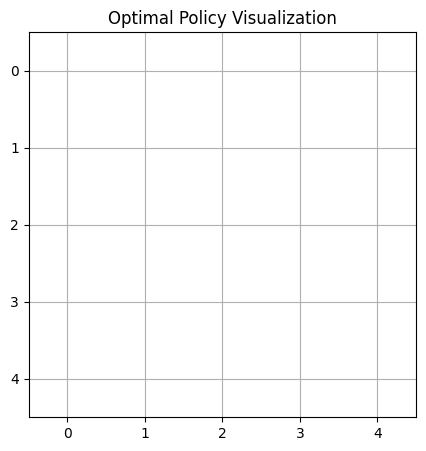



Episode 909:
Taxi starting position: 2
First customer request: B
Second customer request: B


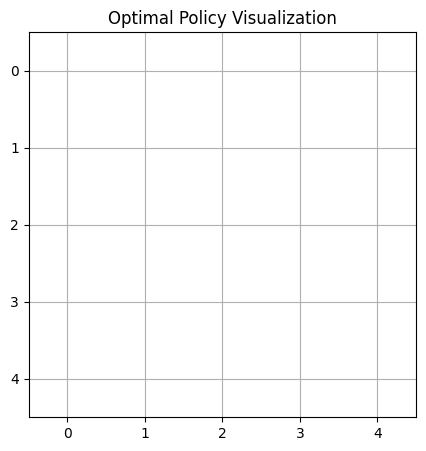



Episode 910:
Taxi starting position: 0
First customer request: B


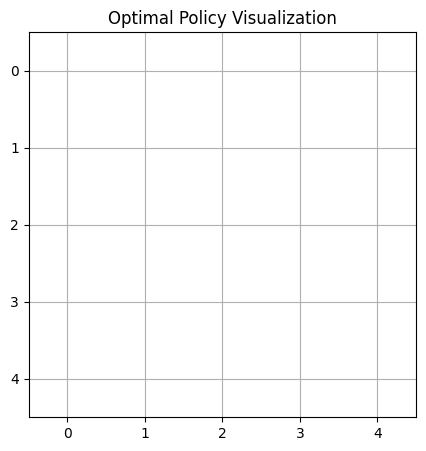



Episode 911:
Taxi starting position: 1
First customer request: C


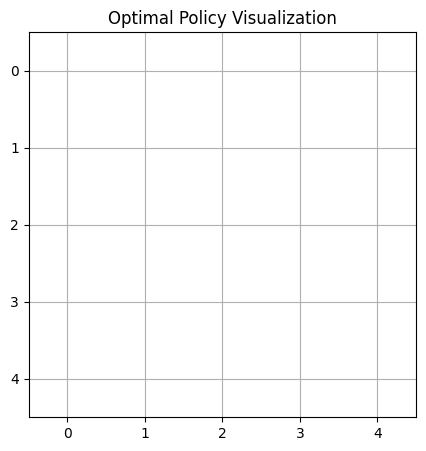



Episode 912:
Taxi starting position: 0
First customer request: B


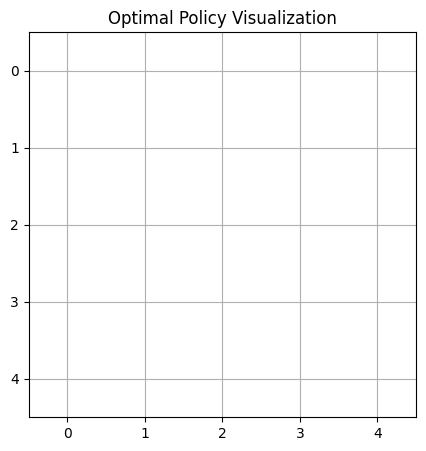



Episode 913:
Taxi starting position: 1
First customer request: D


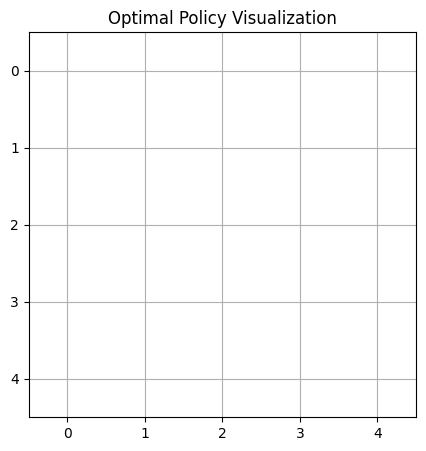



Episode 914:
Taxi starting position: 2
First customer request: A


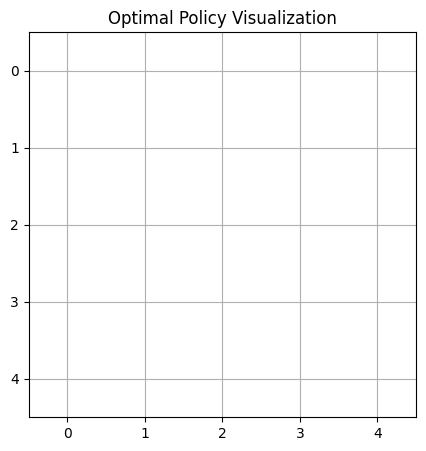



Episode 915:
Taxi starting position: 4
First customer request: C


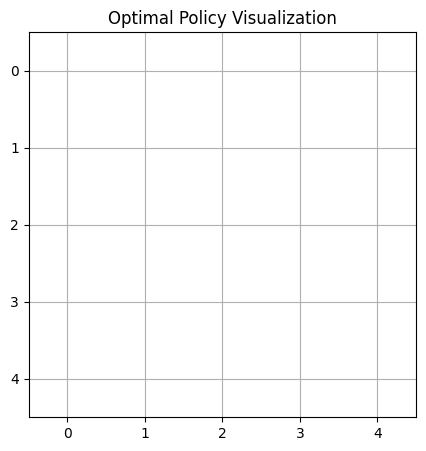



Episode 916:
Taxi starting position: 0
First customer request: D
Second customer request: C


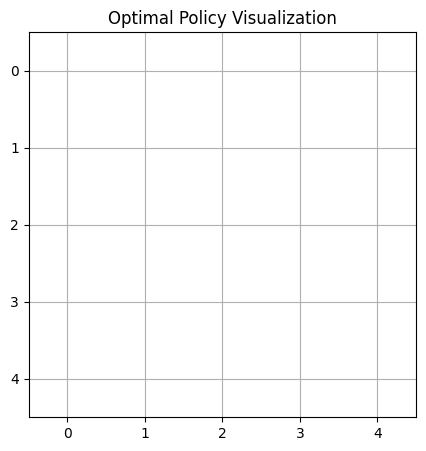



Episode 917:
Taxi starting position: 1
First customer request: C
Second customer request: C


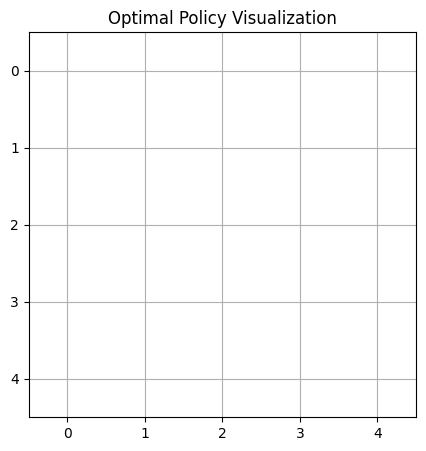



Episode 918:
Taxi starting position: 1
First customer request: D


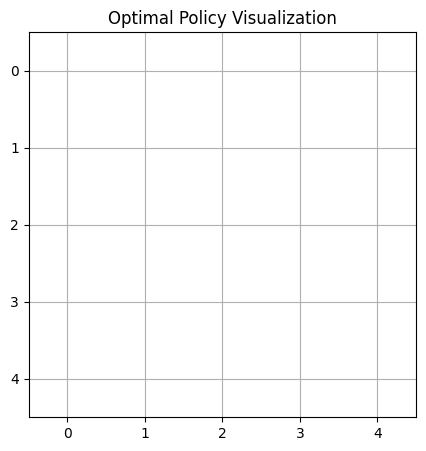



Episode 919:
Taxi starting position: 3
First customer request: B


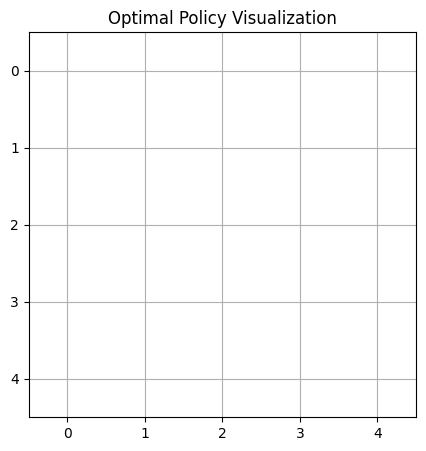



Episode 920:
Taxi starting position: 3
First customer request: D
Second customer request: C
Second customer is a premium customer.


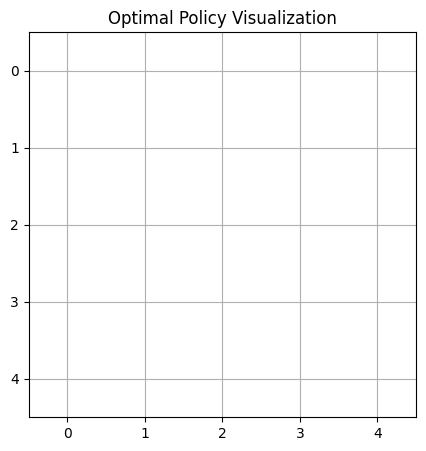



Episode 921:
Taxi starting position: 2
First customer request: D


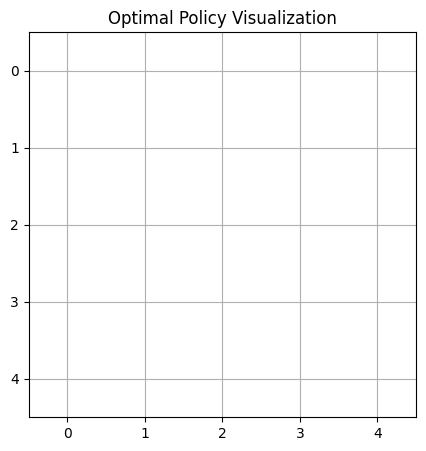



Episode 922:
Taxi starting position: 2
First customer request: C
Second customer request: A
Second customer is a premium customer.


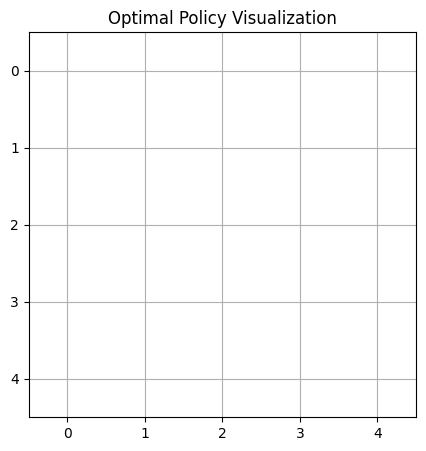



Episode 923:
Taxi starting position: 0
First customer request: D


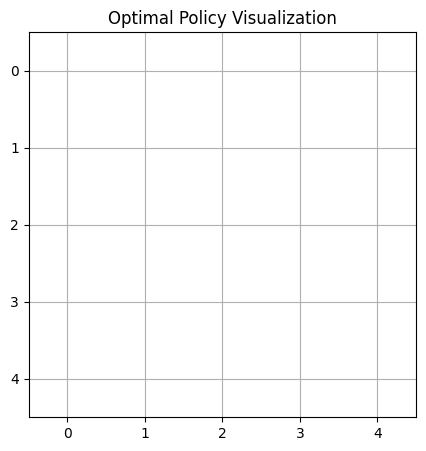



Episode 924:
Taxi starting position: 1
First customer request: B


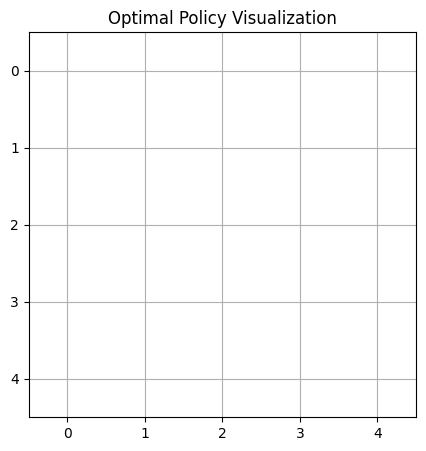



Episode 925:
Taxi starting position: 4
First customer request: C


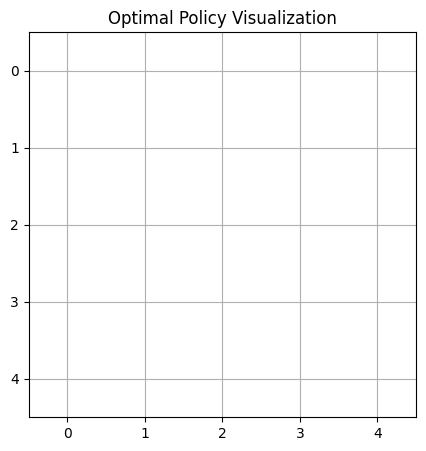



Episode 926:
Taxi starting position: 2
First customer request: A


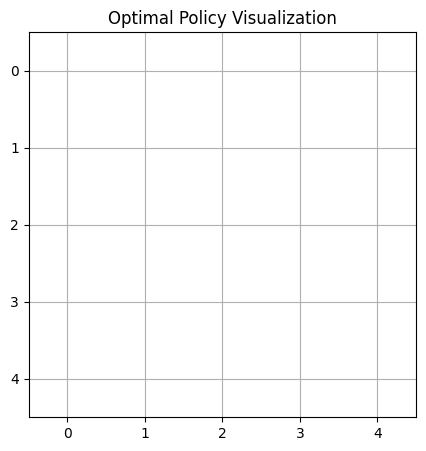



Episode 927:
Taxi starting position: 2
First customer request: C
Second customer request: A
Second customer is a premium customer.


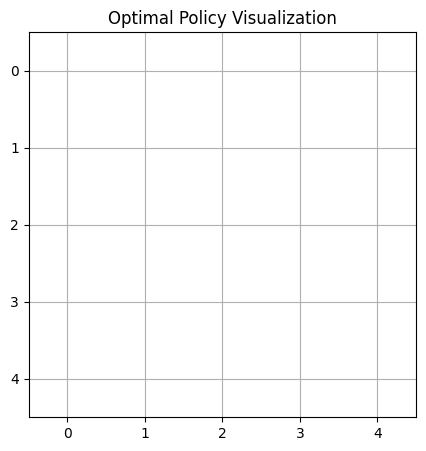



Episode 928:
Taxi starting position: 2
First customer request: D
Second customer request: C


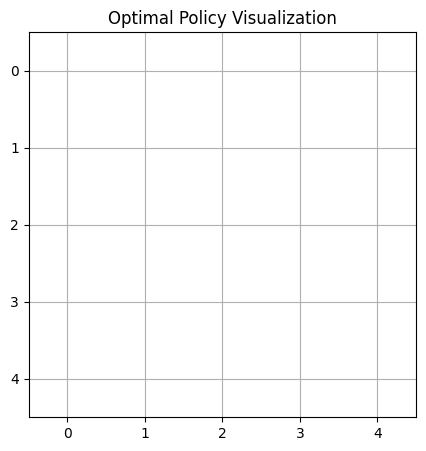



Episode 929:
Taxi starting position: 2
First customer request: D


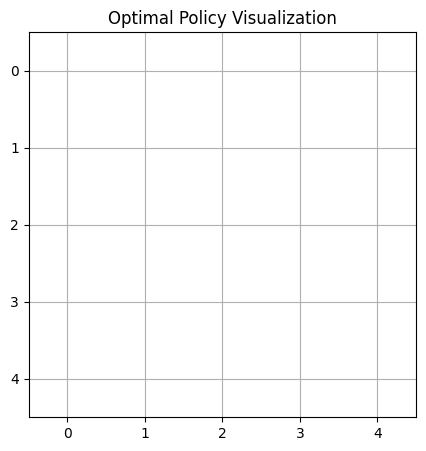



Episode 930:
Taxi starting position: 1
First customer request: C


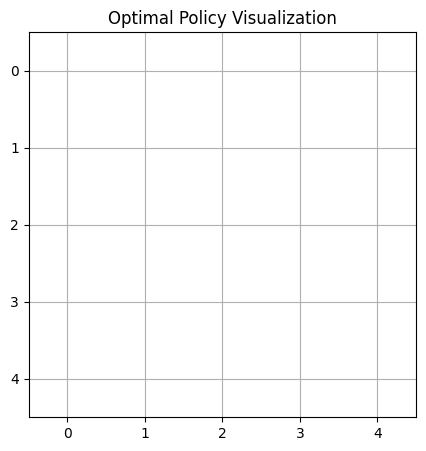



Episode 931:
Taxi starting position: 2
First customer request: A
Second customer request: C
Second customer is a premium customer.


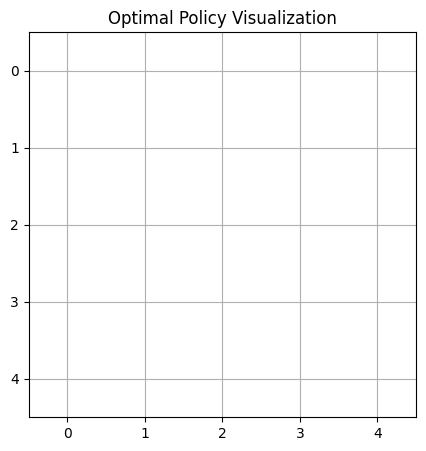



Episode 932:
Taxi starting position: 1
First customer request: D
Second customer request: A


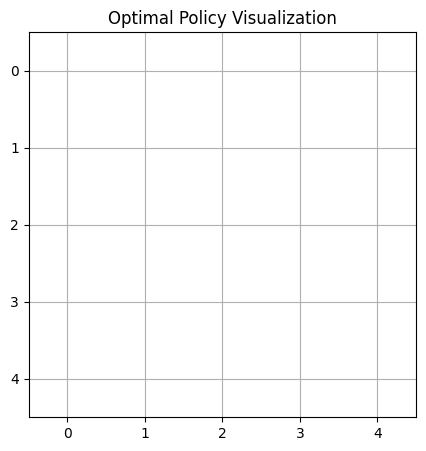



Episode 933:
Taxi starting position: 3
First customer request: B


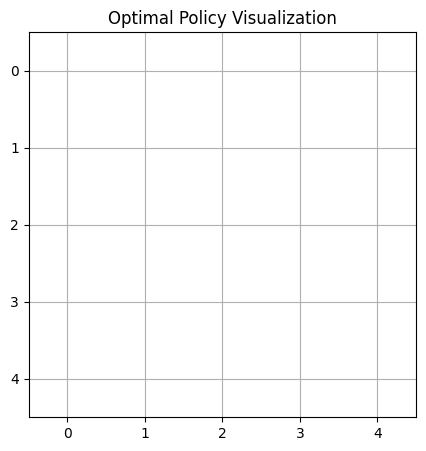



Episode 934:
Taxi starting position: 2
First customer request: C
Second customer request: B
Second customer is a premium customer.


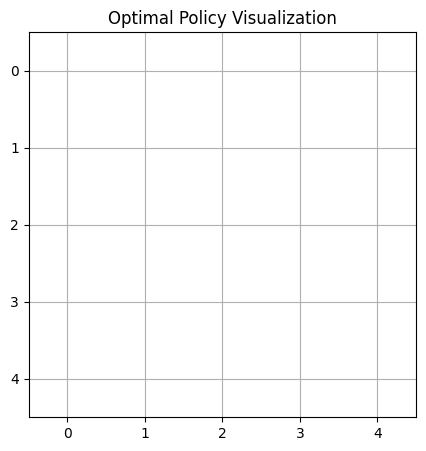



Episode 935:
Taxi starting position: 4
First customer request: A
Second customer request: B


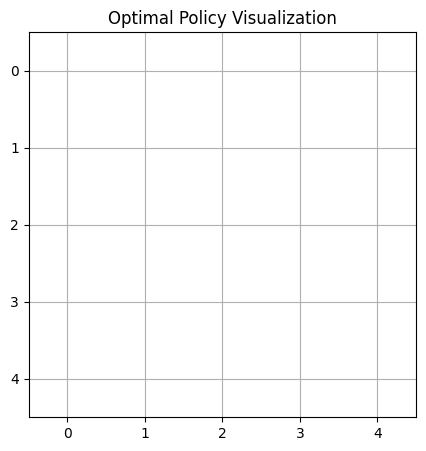



Episode 936:
Taxi starting position: 1
First customer request: B
Second customer request: B


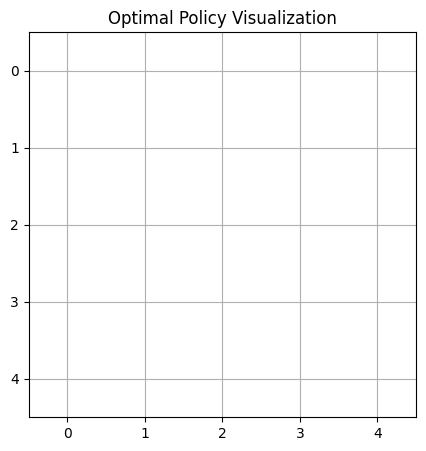



Episode 937:
Taxi starting position: 3
First customer request: B
Second customer request: D
Second customer is a premium customer.


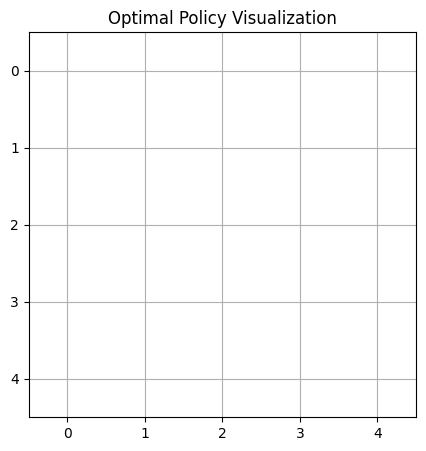



Episode 938:
Taxi starting position: 2
First customer request: B


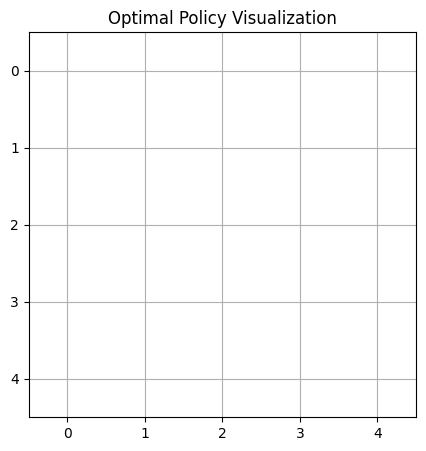



Episode 939:
Taxi starting position: 1
First customer request: A
Second customer request: A


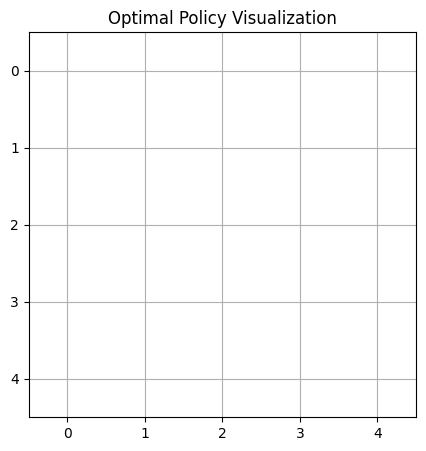



Episode 940:
Taxi starting position: 4
First customer request: C
Second customer request: B
Second customer is a premium customer.


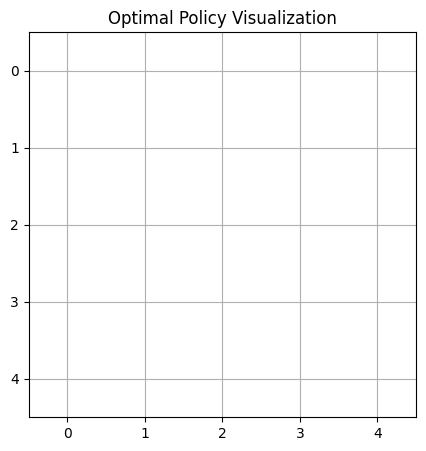



Episode 941:
Taxi starting position: 0
First customer request: D
Second customer request: D


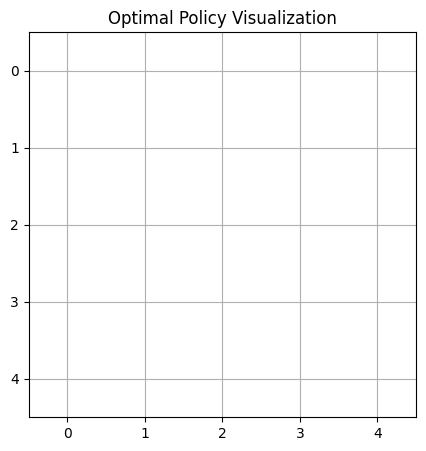



Episode 942:
Taxi starting position: 0
First customer request: A
Second customer request: C


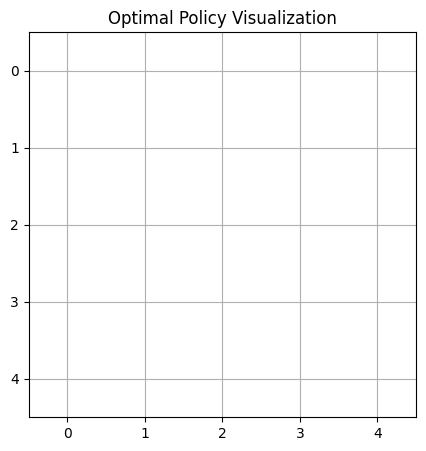



Episode 943:
Taxi starting position: 2
First customer request: A
Second customer request: A


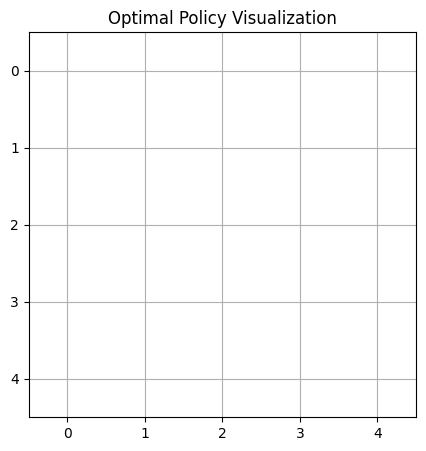



Episode 944:
Taxi starting position: 0
First customer request: B
Second customer request: D


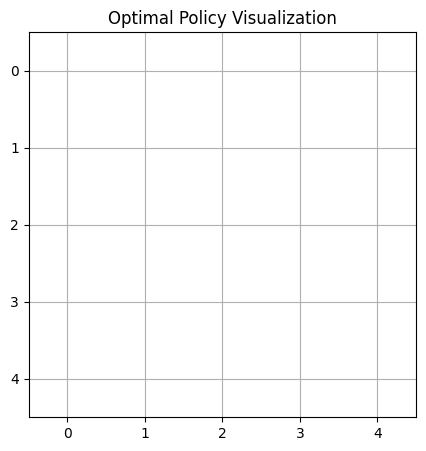



Episode 945:
Taxi starting position: 0
First customer request: B
Second customer request: D


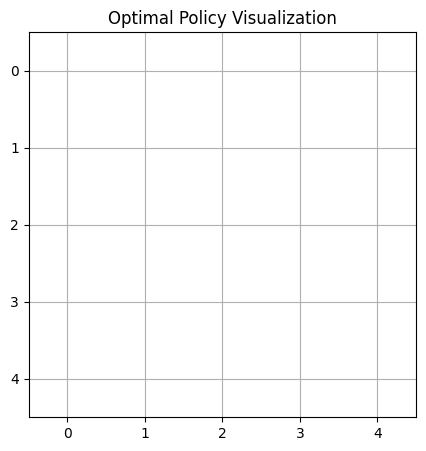



Episode 946:
Taxi starting position: 4
First customer request: A
Second customer request: D
Second customer is a premium customer.


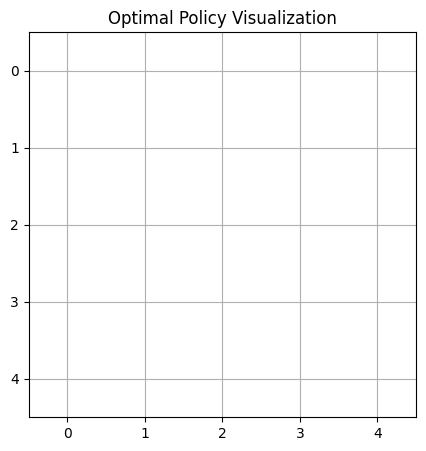



Episode 947:
Taxi starting position: 0
First customer request: D
Second customer request: A
Second customer is a premium customer.


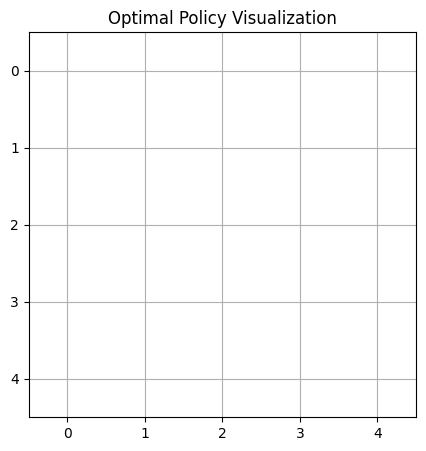



Episode 948:
Taxi starting position: 2
First customer request: A
Second customer request: A


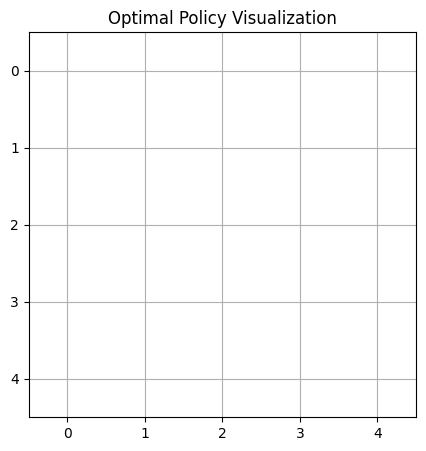



Episode 949:
Taxi starting position: 2
First customer request: C
Second customer request: A


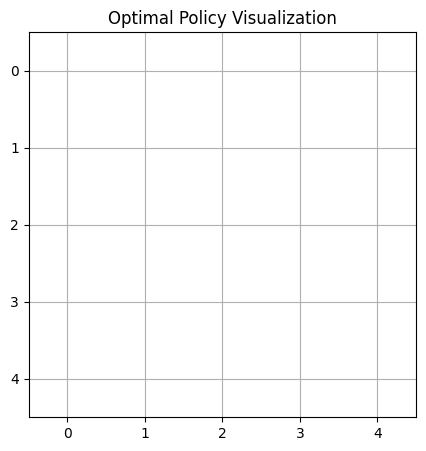



Episode 950:
Taxi starting position: 4
First customer request: C
Second customer request: C
Second customer is a premium customer.


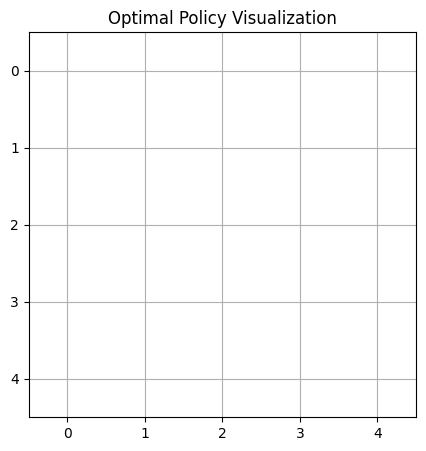



Episode 951:
Taxi starting position: 1
First customer request: D
Second customer request: B


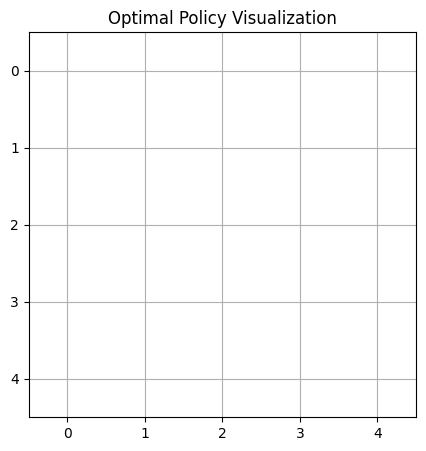



Episode 952:
Taxi starting position: 2
First customer request: C


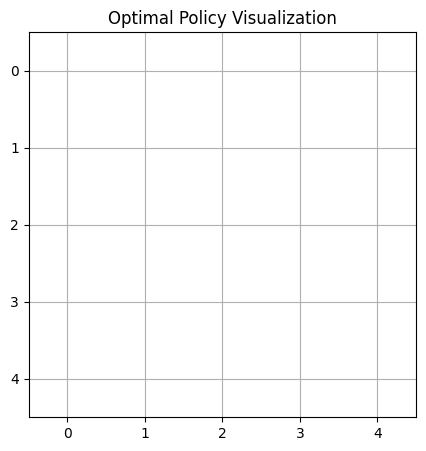



Episode 953:
Taxi starting position: 1
First customer request: C
Second customer request: C
Second customer is a premium customer.


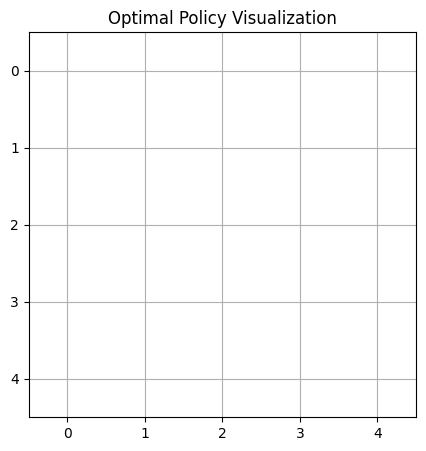



Episode 954:
Taxi starting position: 2
First customer request: D
Second customer request: B


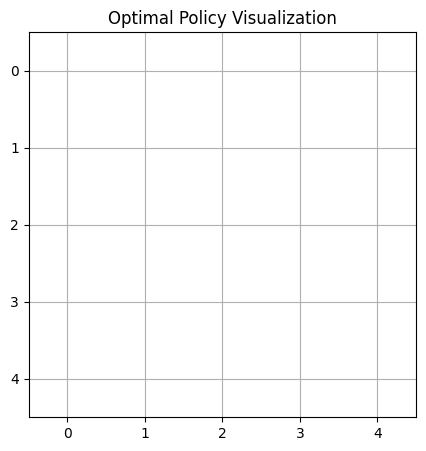



Episode 955:
Taxi starting position: 2
First customer request: A
Second customer request: C


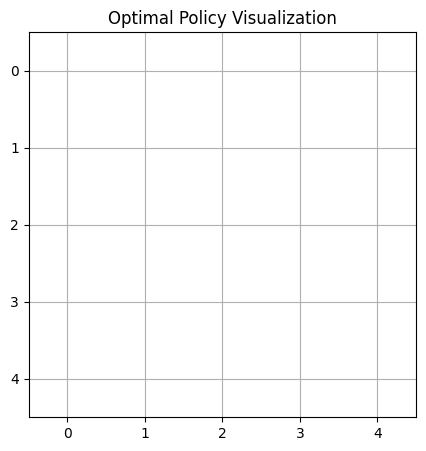



Episode 956:
Taxi starting position: 3
First customer request: D
Second customer request: D


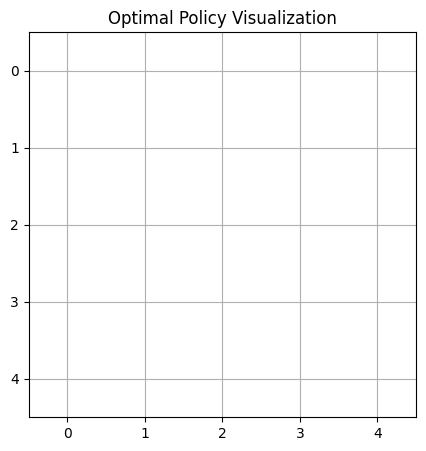



Episode 957:
Taxi starting position: 4
First customer request: A


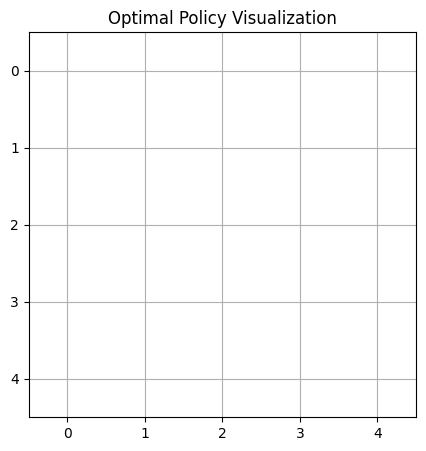



Episode 958:
Taxi starting position: 1
First customer request: C
Second customer request: A


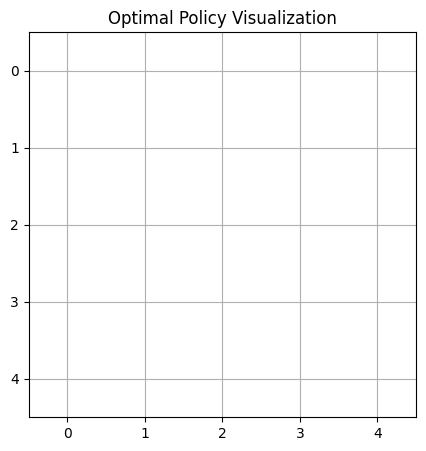



Episode 959:
Taxi starting position: 3
First customer request: C


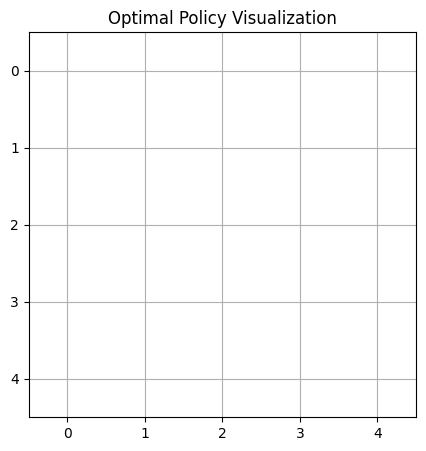



Episode 960:
Taxi starting position: 4
First customer request: C
Second customer request: D


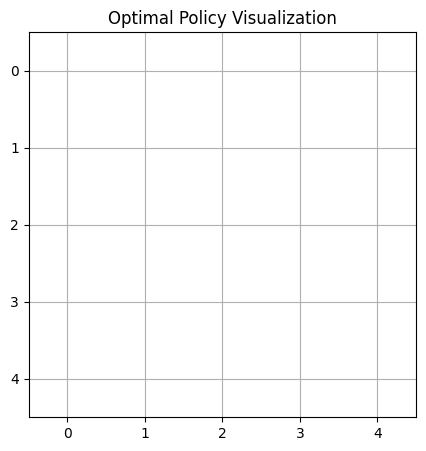



Episode 961:
Taxi starting position: 4
First customer request: A


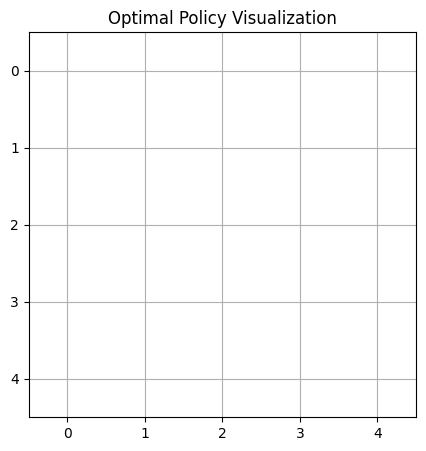



Episode 962:
Taxi starting position: 2
First customer request: B


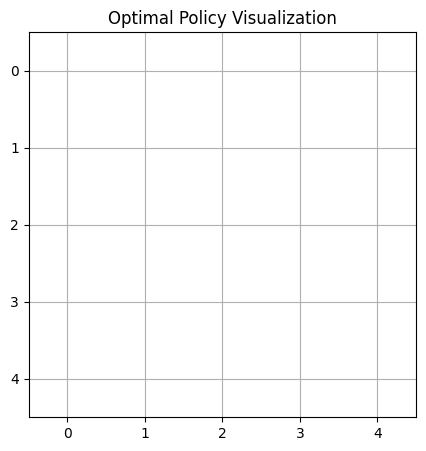



Episode 963:
Taxi starting position: 3
First customer request: A


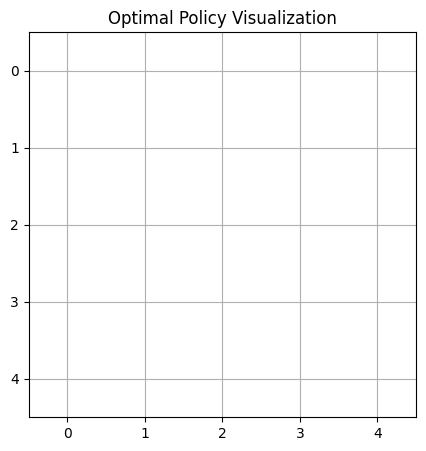



Episode 964:
Taxi starting position: 3
First customer request: B


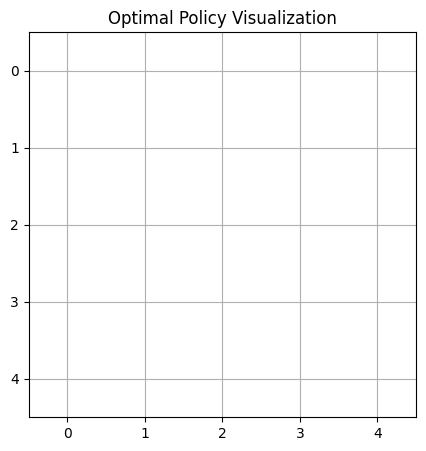



Episode 965:
Taxi starting position: 4
First customer request: C
Second customer request: A


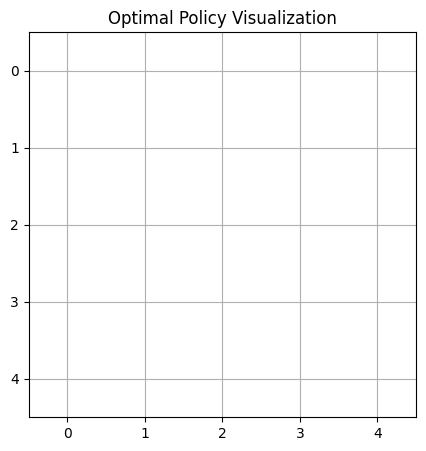



Episode 966:
Taxi starting position: 1
First customer request: D
Second customer request: D
Second customer is a premium customer.


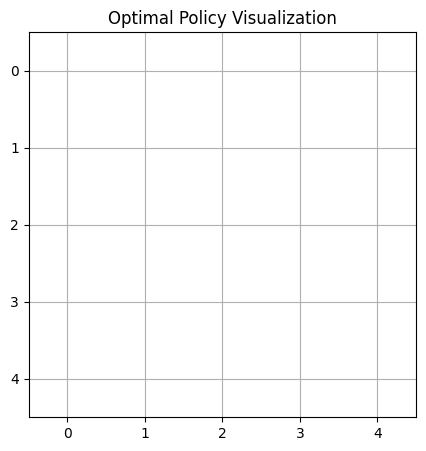



Episode 967:
Taxi starting position: 4
First customer request: C


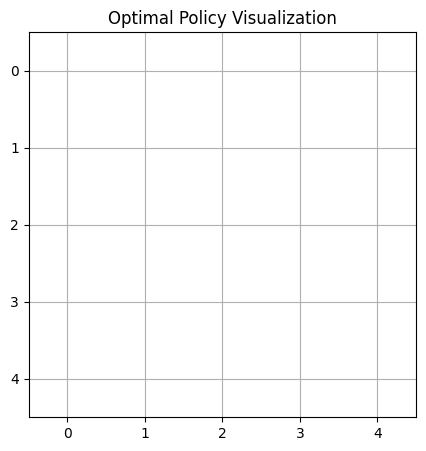



Episode 968:
Taxi starting position: 2
First customer request: D


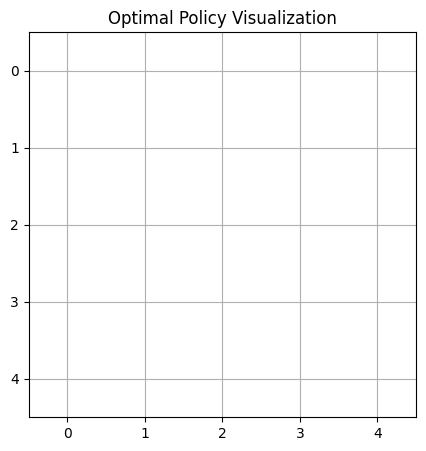



Episode 969:
Taxi starting position: 4
First customer request: A
Second customer request: D
Second customer is a premium customer.


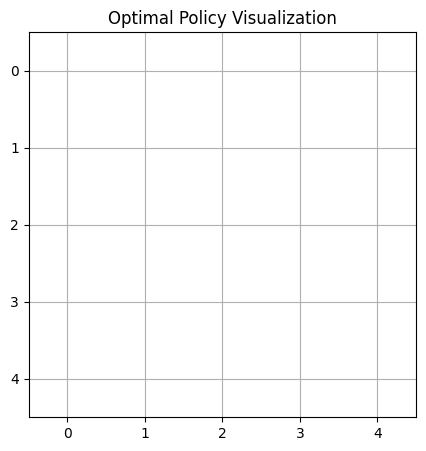



Episode 970:
Taxi starting position: 1
First customer request: B


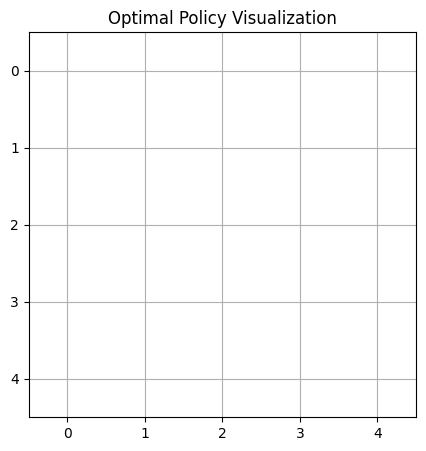



Episode 971:
Taxi starting position: 3
First customer request: C


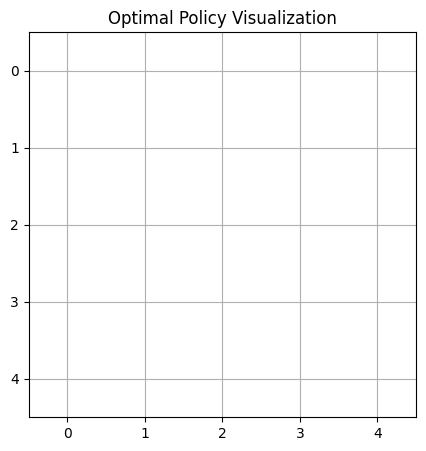



Episode 972:
Taxi starting position: 0
First customer request: C


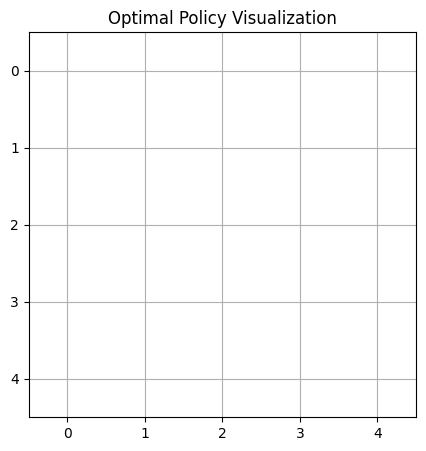



Episode 973:
Taxi starting position: 4
First customer request: A


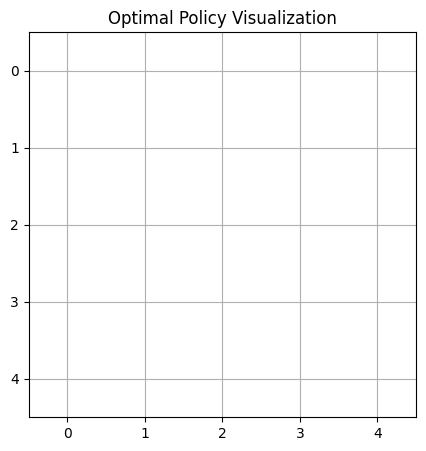



Episode 974:
Taxi starting position: 3
First customer request: A
Second customer request: A


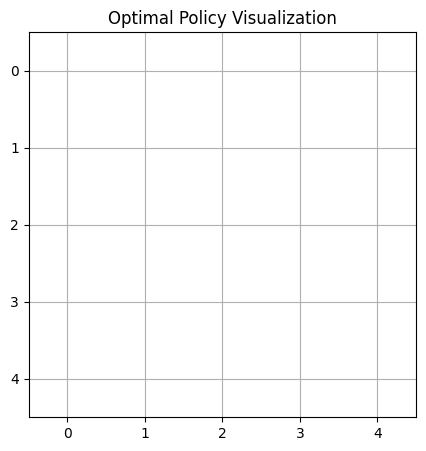



Episode 975:
Taxi starting position: 0
First customer request: A


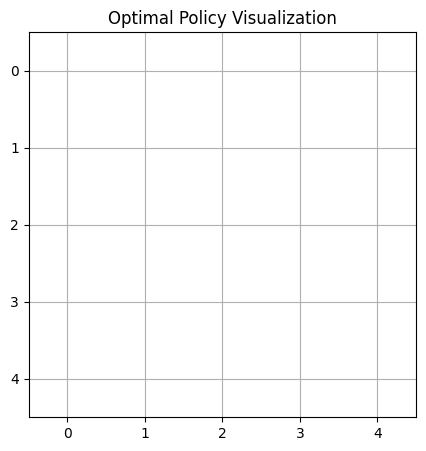



Episode 976:
Taxi starting position: 3
First customer request: B
Second customer request: C


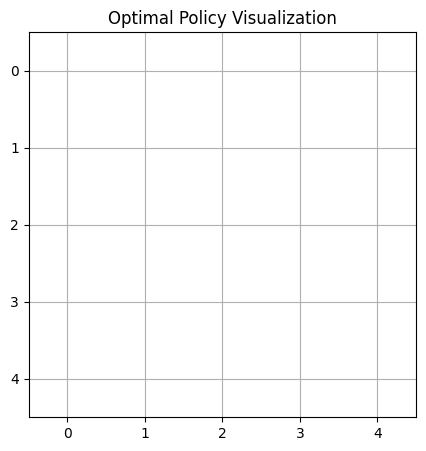



Episode 977:
Taxi starting position: 3
First customer request: B


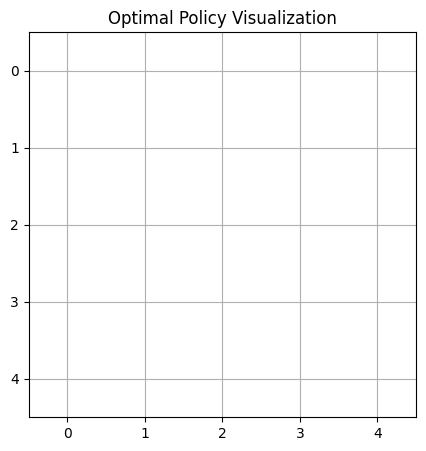



Episode 978:
Taxi starting position: 2
First customer request: A


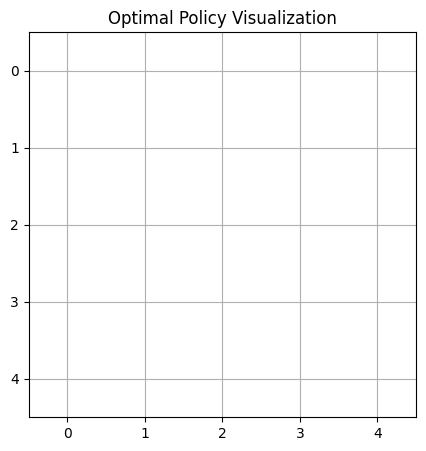



Episode 979:
Taxi starting position: 2
First customer request: C


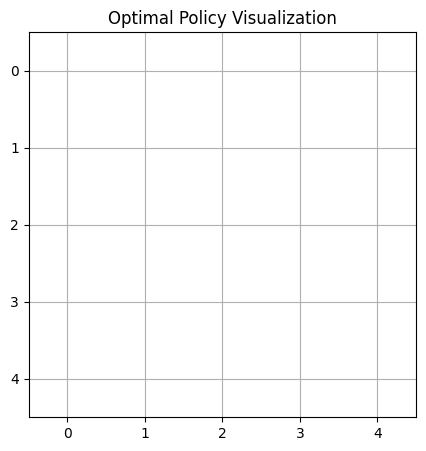



Episode 980:
Taxi starting position: 4
First customer request: C


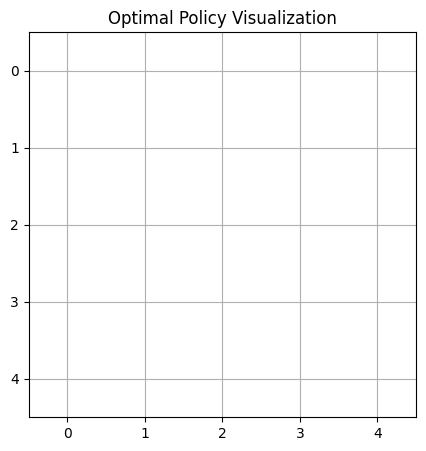



Episode 981:
Taxi starting position: 0
First customer request: D
Second customer request: D


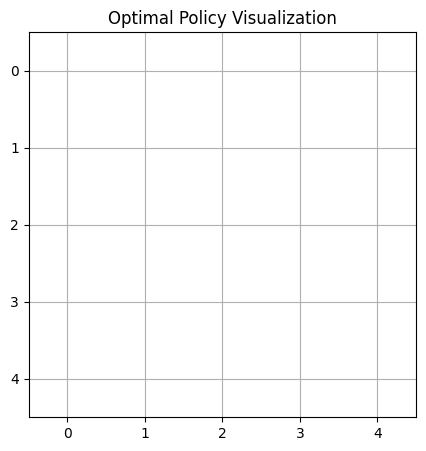



Episode 982:
Taxi starting position: 4
First customer request: C
Second customer request: B


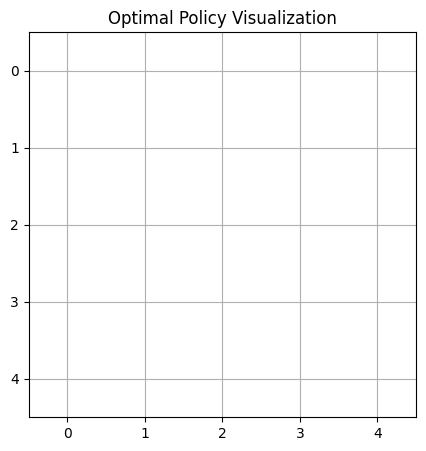



Episode 983:
Taxi starting position: 2
First customer request: A
Second customer request: D


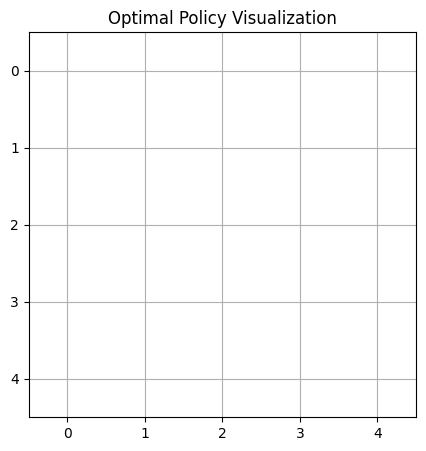



Episode 984:
Taxi starting position: 0
First customer request: C


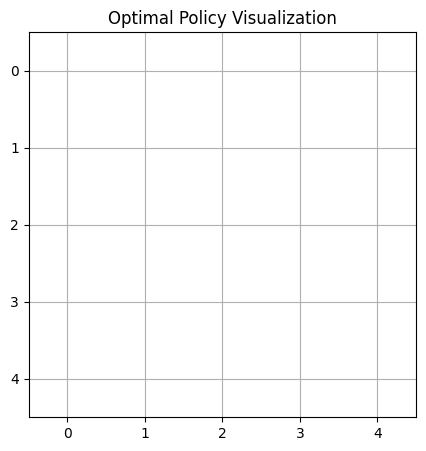



Episode 985:
Taxi starting position: 0
First customer request: B


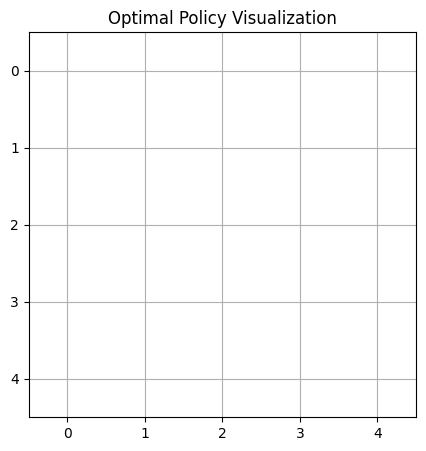



Episode 986:
Taxi starting position: 3
First customer request: C
Second customer request: A
Second customer is a premium customer.


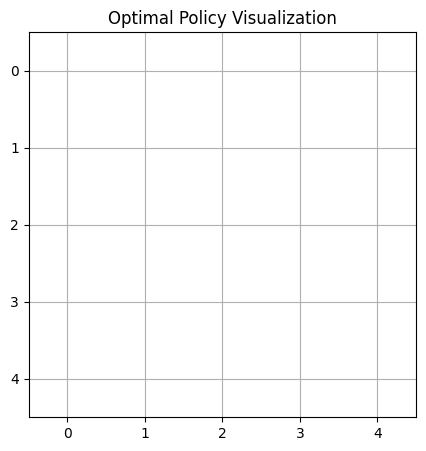



Episode 987:
Taxi starting position: 4
First customer request: A


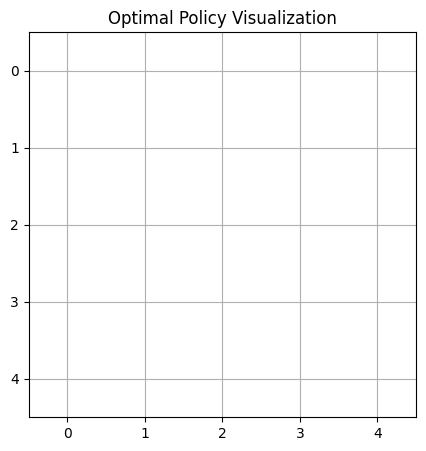



Episode 988:
Taxi starting position: 1
First customer request: D
Second customer request: C


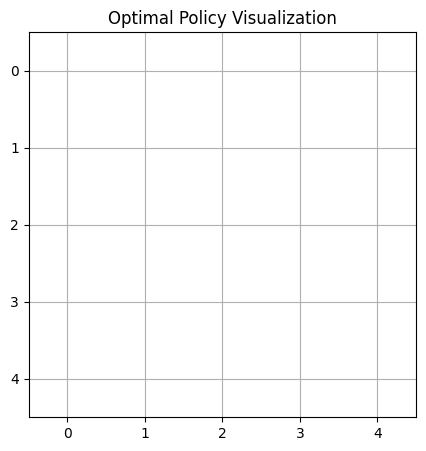



Episode 989:
Taxi starting position: 1
First customer request: D
Second customer request: D


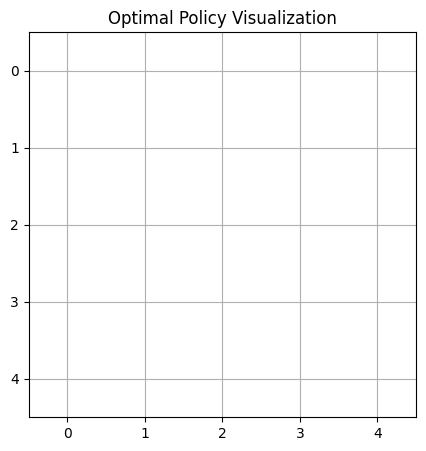



Episode 990:
Taxi starting position: 3
First customer request: D
Second customer request: B


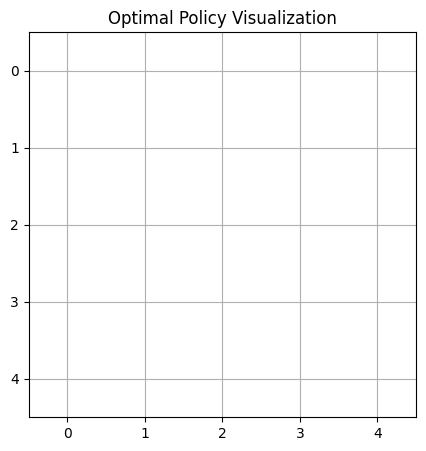



Episode 991:
Taxi starting position: 0
First customer request: D


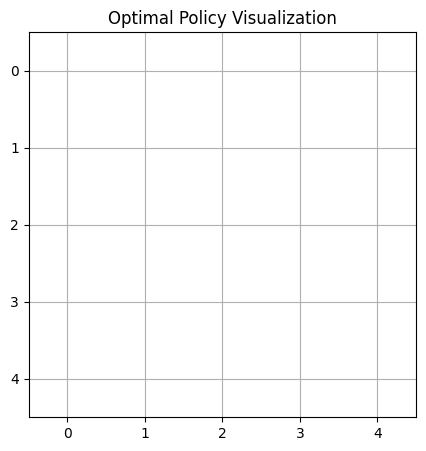



Episode 992:
Taxi starting position: 2
First customer request: C


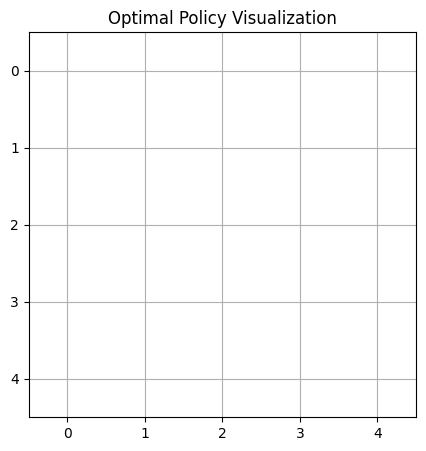



Episode 993:
Taxi starting position: 0
First customer request: A


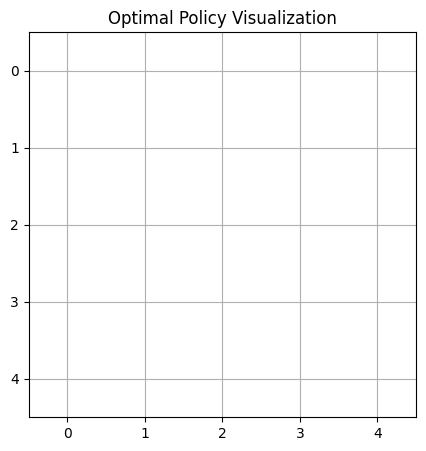



Episode 994:
Taxi starting position: 4
First customer request: C


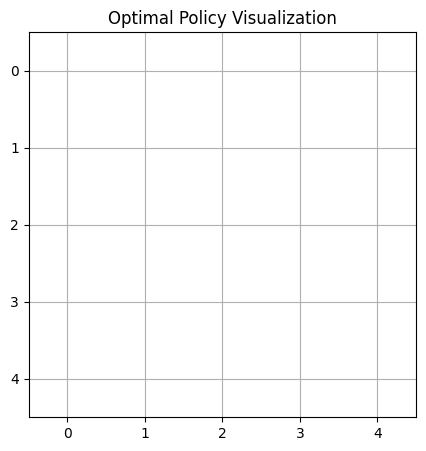



Episode 995:
Taxi starting position: 4
First customer request: B
Second customer request: D


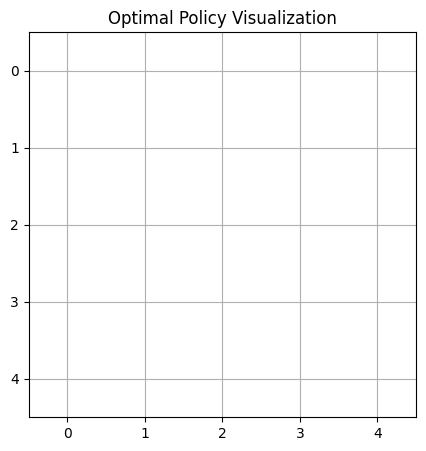



Episode 996:
Taxi starting position: 1
First customer request: A


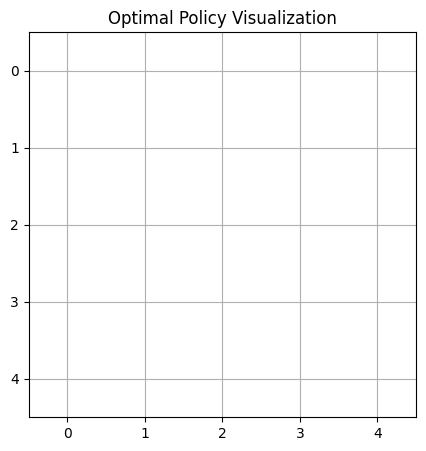



Episode 997:
Taxi starting position: 2
First customer request: C
Second customer request: B


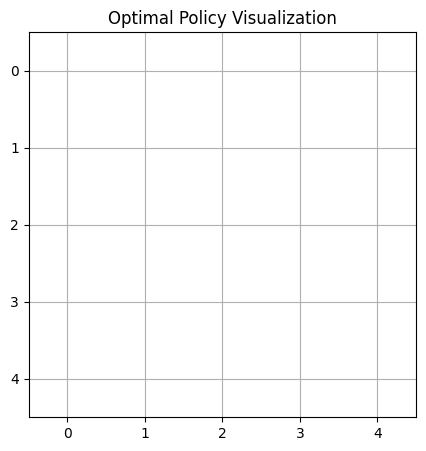



Episode 998:
Taxi starting position: 0
First customer request: A


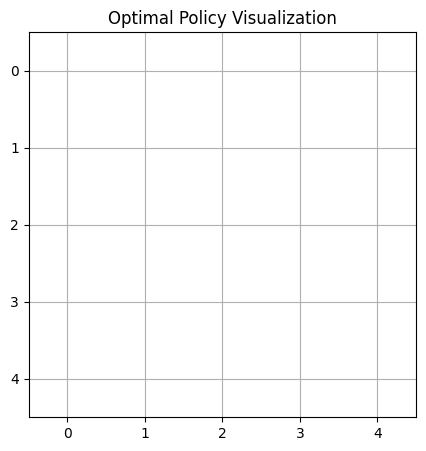



Episode 999:
Taxi starting position: 4
First customer request: D


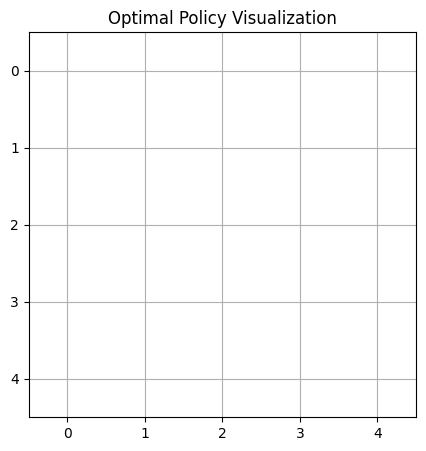



Episode 1000:
Taxi starting position: 1
First customer request: D


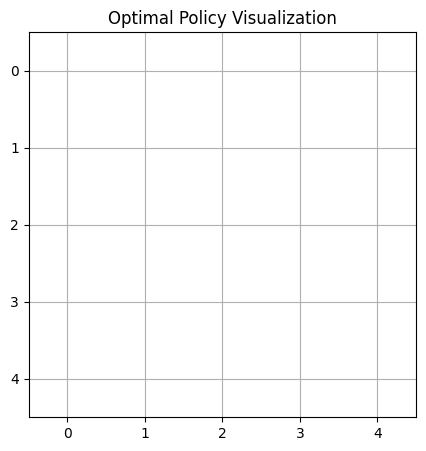

In [15]:
# Define the grid size
GRID_SIZE = 5
# Define the states for the grid
states = [(i, j) for i in range(GRID_SIZE) for j in range(GRID_SIZE) if (i, j) != (3, 1)]  # Excluding restricted area

# Flatten the list of tuples to a 1D array-like structure
flat_states = [item for sublist in states for item in sublist]

# Define the pickup points
pickup_points = ['A', 'B', 'C', 'D']

def generate_customer_request():
    # Generate a random customer request at any pickup point
    return np.random.choice(pickup_points)

def generate_second_request():
    # Generate a further request (with 60% probability)
    return np.random.choice([True, False], p=[0.6, 0.4])

def generate_premium_customer():
    # Generate a premium customer (with 30% probability)
    return np.random.choice([True, False], p=[0.3, 0.7])

def choose_random_position():
    # Choose a random position on the grid
    return np.random.choice(flat_states)

def value_iteration(rewards, gamma=0.9, theta=1e-6):
    V = {state: 0 for state in states}

    while True:
        delta = 0
        for state in states:
            if state in rewards:
                continue

            max_value = float('-inf')
            for action in actions:
                new_value = 0
                for next_action, prob in transition_probs[action].items():
                    next_state = state
                    if next_action == 'Up':
                        next_state = (max(state[0] - 1, 0), state[1])
                    elif next_action == 'Down':
                        next_state = (min(state[0] + 1, GRID_SIZE - 1), state[1])
                    elif next_action == 'Left':
                        next_state = (state[0], max(state[1] - 1, 0))
                    elif next_action == 'Right':
                        next_state = (state[0], min(state[1] + 1, GRID_SIZE - 1))

                    new_value += prob * (rewards.get(next_state, -0.5) + gamma * V[next_state])

                if new_value > max_value:
                    max_value = new_value

            delta = max(delta, abs(max_value - V[state]))
            V[state] = max_value

        if delta < theta:
            break

    return V

def visualize_policy(optimal_policy):
    plt.figure(figsize=(5, 5))
    for i in range(GRID_SIZE):
        for j in range(GRID_SIZE):
            if (i, j) in optimal_policy:
                if optimal_policy[(i, j)] == 'Up':
                    plt.arrow(j, i + 0.5, 0, -0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
                elif optimal_policy[(i, j)] == 'Down':
                    plt.arrow(j, i - 0.5, 0, 0.4, head_width=0.1, head_length=0.1, fc='black', ec='black')
                elif optimal_policy[(i, j)] == 'Left':
                    plt.arrow(j + 0.5, i, -0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
                elif optimal_policy[(i, j)] == 'Right':
                    plt.arrow(j - 0.5, i, 0.4, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
                elif optimal_policy[(i, j)] == 'Exit':
                    plt.text(j, i, 'Exit', ha='center', va='center')
    plt.xlim(-0.5, GRID_SIZE - 0.5)
    plt.ylim(GRID_SIZE - 0.5, -0.5)
    plt.xticks(np.arange(0, GRID_SIZE, 1))
    plt.yticks(np.arange(0, GRID_SIZE, 1))
    plt.grid(True)
    plt.title('Optimal Policy Visualization')
    plt.show()

def run_episodes(num_episodes):
    for episode in range(1, num_episodes + 1):
        print(f"Episode {episode}:")

        # Randomly choose the taxi's starting position (excluding restricted area)
        taxi_position = choose_random_position()
        print(f"Taxi starting position: {taxi_position}")

        # Generate the first customer request
        first_customer_request = generate_customer_request()
        print(f"First customer request: {first_customer_request}")

        # Generate a further request
        second_request = generate_second_request()
        if second_request:
            second_customer_request = generate_customer_request()
            print(f"Second customer request: {second_customer_request}")
            premium_customer = generate_premium_customer()
            if premium_customer:
                print("Second customer is a premium customer.")

        # Run value iteration for optimal policy calculation
        rewards = {
            (i, j): 20 if pickup_points.index(first_customer_request) == idx else (30 if pickup_points.index(second_customer_request) == idx else -0.5)
            for idx, (i, j) in enumerate(states)
        }
        optimal_policy = value_iteration(rewards)

        # Visualize the optimal policy for each episode
        visualize_policy(optimal_policy)
        print("\n")

# Run 1000 episodes
run_episodes(1000)
